In [1]:
# ============================================================
# CELDA 0.1 — MONTAR GOOGLE DRIVE
# ============================================================

from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# ============================================================
# CELDA 0.2 — DESCARGA DE DATASETS DESDE GOOGLE DRIVE
# ============================================================

import gdown

# IDs extraídos de las URLs de Google Drive
id_ventas = "1AeU6188eyTHDhvQPlU1zT9SMP1wYRTF9"
id_devoluciones = "1j_iWB1bCvrgopU2tcIWEzOwy-QHJCMTX"

# Nombres locales de salida
ruta_ventas = "data_v07_con_fechas_regresion_ventas.csv"
ruta_devoluciones = "data_v07_con_fechas_regresion_devoluciones.csv"

# Descarga de archivos
gdown.download(f"https://drive.google.com/uc?id={id_ventas}", ruta_ventas, quiet=False)
gdown.download(f"https://drive.google.com/uc?id={id_devoluciones}", ruta_devoluciones, quiet=False)

print("Dataset de ventas descargado en:", ruta_ventas)
print("Dataset de devoluciones descargado en:", ruta_devoluciones)

Downloading...
From: https://drive.google.com/uc?id=1AeU6188eyTHDhvQPlU1zT9SMP1wYRTF9
To: /content/data_v07_con_fechas_regresion_ventas.csv
100%|██████████| 59.0M/59.0M [00:01<00:00, 57.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1j_iWB1bCvrgopU2tcIWEzOwy-QHJCMTX
To: /content/data_v07_con_fechas_regresion_devoluciones.csv
100%|██████████| 945k/945k [00:00<00:00, 11.5MB/s]

Dataset de ventas descargado en: data_v07_con_fechas_regresion_ventas.csv
Dataset de devoluciones descargado en: data_v07_con_fechas_regresion_devoluciones.csv


En primer lugar, se importaron las librerías necesarias para el tratamiento de datos, visualización, preprocesamiento, modelado y evaluación del clustering. Para la manipulación de datos se utilizaron pandas y numpy, mientras que para la visualización se incorporaron tanto librerías estáticas, como matplotlib y seaborn, como herramientas interactivas mediante plotly.

Dado que el objetivo de esta fase es comparar diferentes enfoques de segmentación, se incluyeron varios algoritmos de clustering: K-Means, clustering jerárquico aglomerativo y DBSCAN. Además, se incorporaron diferentes escaladores y técnicas de reducción dimensional, como PCA, con el fin de representar los clientes en espacios bidimensionales y tridimensionales.

Para evaluar la calidad de las segmentaciones se utilizarán métricas internas de clustering, concretamente silhouette score, Calinski-Harabasz y Davies-Bouldin. Estas métricas permitirán comparar de forma objetiva la separación, cohesión y consistencia de los grupos obtenidos.

In [3]:
# ============================================================
# CELDA 0.1 — IMPORTACIÓN DE LIBRERÍAS
# ============================================================

# ------------------------------------------------------------
# Tratamiento de datos
# ------------------------------------------------------------
import pandas as pd
import numpy as np

# ------------------------------------------------------------
# Visualización básica y avanzada
# ------------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

# Visualización interactiva
import plotly.express as px
import plotly.graph_objects as go

# ------------------------------------------------------------
# Preprocesamiento
# ------------------------------------------------------------
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# ------------------------------------------------------------
# Reducción dimensional
# ------------------------------------------------------------
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# Modelos de clustering
# ------------------------------------------------------------
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN

# ------------------------------------------------------------
# Métricas de evaluación de clustering
# ------------------------------------------------------------
from sklearn.metrics import (
    silhouette_score,
    calinski_harabasz_score,
    davies_bouldin_score
)

# ------------------------------------------------------------
# Dendrograma para clustering jerárquico
# ------------------------------------------------------------
from scipy.cluster.hierarchy import dendrogram, linkage

# ------------------------------------------------------------
# Configuración visual
# ------------------------------------------------------------
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
pd.set_option("display.float_format", "{:,.2f}".format)

sns.set_theme(style="whitegrid")

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.labelsize"] = 12

# ------------------------------------------------------------
# Control de advertencias
# ------------------------------------------------------------
import warnings
warnings.filterwarnings("ignore")

print("Librerías importadas correctamente.")

Librerías importadas correctamente.


Tras descargar los archivos desde Google Drive, se realizó la carga inicial de los datasets de ventas y devoluciones mediante pandas. El objetivo de esta primera revisión fue comprobar que ambos archivos se habían importado correctamente y que presentaban una estructura compatible para el análisis conjunto.

Para ello se analizaron las dimensiones de cada dataset, el listado de columnas disponibles y una muestra inicial de registros. Además, se verificó si ambos datasets compartían exactamente las mismas variables, ya que esta condición facilita el tratamiento conjunto posterior y permite construir métricas comparables a nivel de cliente.

Esta comprobación inicial es necesaria antes de iniciar cualquier fase de limpieza o modelado, ya que permite detectar posibles errores de carga, diferencias de estructura, columnas ausentes o versiones incorrectas de los archivos.

In [4]:
# ============================================================
# CELDA 1 — CARGA INICIAL Y COMPARACIÓN ESTRUCTURAL
# ============================================================

# Cargar datasets descargados desde Google Drive
ventas = pd.read_csv("data_v07_con_fechas_regresion_ventas.csv")
devoluciones = pd.read_csv("data_v07_con_fechas_regresion_devoluciones.csv")

# Mostrar dimensiones de ambos datasets
print("Dimensiones dataset de ventas:", ventas.shape)
print("Dimensiones dataset de devoluciones:", devoluciones.shape)

# Mostrar columnas disponibles
print("\nColumnas del dataset de ventas:")
print(ventas.columns.tolist())

print("\nColumnas del dataset de devoluciones:")
print(devoluciones.columns.tolist())

# Comprobar si ambos datasets tienen las mismas columnas
mismas_columnas = ventas.columns.tolist() == devoluciones.columns.tolist()
print("\n¿Ambos datasets tienen exactamente las mismas columnas?:", mismas_columnas)

# Mostrar primeras filas de cada dataset
print("\nPrimeras filas del dataset de ventas:")
display(ventas.head())

print("\nPrimeras filas del dataset de devoluciones:")
display(devoluciones.head())

Dimensiones dataset de ventas: (522010, 15)
Dimensiones dataset de devoluciones: (8108, 15)

Columnas del dataset de ventas:
['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country', 'InvoiceDay', 'InvoiceMonth', 'InvoiceYear', 'InvoiceHour', 'DayOfWeek', 'IsUk', 'TotalPrice']

Columnas del dataset de devoluciones:
['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate', 'UnitPrice', 'CustomerID', 'Country', 'InvoiceDay', 'InvoiceMonth', 'InvoiceYear', 'InvoiceHour', 'DayOfWeek', 'IsUk', 'TotalPrice']

¿Ambos datasets tienen exactamente las mismas columnas?: True

Primeras filas del dataset de ventas:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceDay,InvoiceMonth,InvoiceYear,InvoiceHour,DayOfWeek,IsUk,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,"17,850.00",United Kingdom,1,12,2010,8,2,1,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom,1,12,2010,8,2,1,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,"17,850.00",United Kingdom,1,12,2010,8,2,1,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom,1,12,2010,8,2,1,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom,1,12,2010,8,2,1,20.34



Primeras filas del dataset de devoluciones:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceDay,InvoiceMonth,InvoiceYear,InvoiceHour,DayOfWeek,IsUk,TotalPrice
0,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,"15,311.00",United Kingdom,1,12,2010,9,2,1,-4.65
1,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,"17,548.00",United Kingdom,1,12,2010,10,2,1,-19.80
2,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,"17,548.00",United Kingdom,1,12,2010,10,2,1,-6.96
3,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,"17,548.00",United Kingdom,1,12,2010,10,2,1,-6.96
4,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2010-12-01 10:24:00,0.29,"17,548.00",United Kingdom,1,12,2010,10,2,1,-6.96


En la revisión inicial de calidad de datos se analizaron los tipos de variables, los valores nulos y la presencia de duplicados exactos en ambos datasets. Los tipos de datos fueron coherentes con la naturaleza de las variables. En el dataset de ventas, InvoiceNo aparece como variable numérica, mientras que en el dataset de devoluciones aparece como texto debido a la presencia del prefijo C en las facturas canceladas o devueltas.

La variable InvoiceDate fue cargada inicialmente como tipo object, por lo que será necesario convertirla posteriormente a formato fecha para poder realizar análisis temporales y calcular variables como recencia o antigüedad del cliente.

No se detectaron duplicados exactos en ninguno de los dos datasets, lo que indica que no existen registros completamente repetidos que puedan distorsionar los cálculos agregados.

La principal incidencia detectada fue la presencia de valores nulos en CustomerID. En el dataset de ventas se identificaron 131.410 registros sin identificador de cliente, equivalentes al 25,17% del total. En el dataset de devoluciones se detectaron 154 registros sin CustomerID, equivalentes al 1,90%. Dado que el objetivo del análisis es construir una segmentación a nivel de cliente, estos registros no podrán utilizarse en el clustering, ya que no pueden asignarse a ningún cliente concreto. Por este motivo, serán eliminados en la fase posterior de limpieza.

In [5]:
# ============================================================
# CELDA 2 — REVISIÓN DE TIPOS DE DATOS, NULOS Y DUPLICADOS
# ============================================================

# ------------------------------------------------------------
# 1. Tipos de datos
# ------------------------------------------------------------
print("TIPOS DE DATOS — VENTAS")
display(ventas.dtypes)

print("\nTIPOS DE DATOS — DEVOLUCIONES")
display(devoluciones.dtypes)

# ------------------------------------------------------------
# 2. Valores nulos por columna
# ------------------------------------------------------------
nulos_ventas = ventas.isnull().sum().to_frame(name="Nulos_Ventas")
nulos_devoluciones = devoluciones.isnull().sum().to_frame(name="Nulos_Devoluciones")

nulos_comparativa = nulos_ventas.join(nulos_devoluciones, how="outer")
nulos_comparativa["% Nulos Ventas"] = (nulos_comparativa["Nulos_Ventas"] / len(ventas) * 100).round(2)
nulos_comparativa["% Nulos Devoluciones"] = (nulos_comparativa["Nulos_Devoluciones"] / len(devoluciones) * 100).round(2)

print("\nCOMPARATIVA DE VALORES NULOS")
display(nulos_comparativa)

# ------------------------------------------------------------
# 3. Duplicados exactos
# ------------------------------------------------------------
duplicados_ventas = ventas.duplicated().sum()
duplicados_devoluciones = devoluciones.duplicated().sum()

print("\nDUPLICADOS EXACTOS")
print("Duplicados en ventas:", duplicados_ventas)
print("Duplicados en devoluciones:", duplicados_devoluciones)

# ------------------------------------------------------------
# 4. Resumen específico de CustomerID
# ------------------------------------------------------------
print("\nREVISIÓN DE CustomerID")
print("CustomerID nulos en ventas:", ventas["CustomerID"].isnull().sum())
print("CustomerID nulos en devoluciones:", devoluciones["CustomerID"].isnull().sum())

print("Porcentaje CustomerID nulo en ventas:", round(ventas["CustomerID"].isnull().mean() * 100, 2), "%")
print("Porcentaje CustomerID nulo en devoluciones:", round(devoluciones["CustomerID"].isnull().mean() * 100, 2), "%")

TIPOS DE DATOS — VENTAS


,0
InvoiceNo,int64
StockCode,object
Description,object
Quantity,int64
InvoiceDate,object
UnitPrice,float64
CustomerID,float64
Country,object
InvoiceDay,int64
InvoiceMonth,int64



TIPOS DE DATOS — DEVOLUCIONES


,0
InvoiceNo,object
StockCode,object
Description,object
Quantity,int64
InvoiceDate,object
UnitPrice,float64
CustomerID,float64
Country,object
InvoiceDay,int64
InvoiceMonth,int64



COMPARATIVA DE VALORES NULOS


,Nulos_Ventas,Nulos_Devoluciones,% Nulos Ventas,% Nulos Devoluciones
Country,0,0,0.00,0.00
CustomerID,131410,154,25.17,1.90
DayOfWeek,0,0,0.00,0.00
Description,0,0,0.00,0.00
InvoiceDate,0,0,0.00,0.00
InvoiceDay,0,0,0.00,0.00
InvoiceHour,0,0,0.00,0.00
InvoiceMonth,0,0,0.00,0.00
InvoiceNo,0,0,0.00,0.00
InvoiceYear,0,0,0.00,0.00



DUPLICADOS EXACTOS
Duplicados en ventas: 0
Duplicados en devoluciones: 0

REVISIÓN DE CustomerID
CustomerID nulos en ventas: 131410
CustomerID nulos en devoluciones: 154
Porcentaje CustomerID nulo en ventas: 25.17 %
Porcentaje CustomerID nulo en devoluciones: 1.9 %


La validación económica de los datasets confirmó que ambos conjuntos de datos estaban correctamente separados según la naturaleza de la operación. En el dataset de ventas, todas las observaciones presentan cantidades positivas e importes positivos, sin presencia de facturas con prefijo C. La cantidad mínima registrada fue 1 y el importe mínimo fue 0,001, lo que confirma que todas las operaciones incluidas representan ventas válidas.

En el dataset de devoluciones, todas las observaciones presentan cantidades negativas e importes negativos. Además, las 8.108 operaciones incluidas corresponden a facturas con prefijo C, identificador habitual de cancelaciones o devoluciones. La cantidad mínima fue -9.360 y el importe mínimo fue -6.539,40.

Estos resultados permiten confirmar que los datasets representan dos flujos comerciales diferenciados: ventas como operaciones generadoras de ingresos y devoluciones como operaciones que reducen el valor económico aportado por el cliente. Por tanto, ambos datasets son adecuados para construir una segmentación basada en valor neto del cliente.

In [6]:
# ============================================================
# CELDA 3 — VALIDACIÓN DE VENTAS POSITIVAS Y DEVOLUCIONES NEGATIVAS
# ============================================================

# ------------------------------------------------------------
# 1. Resumen de Quantity y TotalPrice en ventas
# ------------------------------------------------------------
print("RESUMEN DE VARIABLES ECONÓMICAS — VENTAS")
print("Quantity mínima en ventas:", ventas["Quantity"].min())
print("Quantity máxima en ventas:", ventas["Quantity"].max())
print("TotalPrice mínimo en ventas:", ventas["TotalPrice"].min())
print("TotalPrice máximo en ventas:", ventas["TotalPrice"].max())

# ------------------------------------------------------------
# 2. Resumen de Quantity y TotalPrice en devoluciones
# ------------------------------------------------------------
print("\nRESUMEN DE VARIABLES ECONÓMICAS — DEVOLUCIONES")
print("Quantity mínima en devoluciones:", devoluciones["Quantity"].min())
print("Quantity máxima en devoluciones:", devoluciones["Quantity"].max())
print("TotalPrice mínimo en devoluciones:", devoluciones["TotalPrice"].min())
print("TotalPrice máximo en devoluciones:", devoluciones["TotalPrice"].max())

# ------------------------------------------------------------
# 3. Comprobación de signos
# ------------------------------------------------------------
ventas_quantity_positiva = (ventas["Quantity"] > 0).sum()
ventas_quantity_no_positiva = (ventas["Quantity"] <= 0).sum()

ventas_totalprice_positivo = (ventas["TotalPrice"] > 0).sum()
ventas_totalprice_no_positivo = (ventas["TotalPrice"] <= 0).sum()

devoluciones_quantity_negativa = (devoluciones["Quantity"] < 0).sum()
devoluciones_quantity_no_negativa = (devoluciones["Quantity"] >= 0).sum()

devoluciones_totalprice_negativo = (devoluciones["TotalPrice"] < 0).sum()
devoluciones_totalprice_no_negativo = (devoluciones["TotalPrice"] >= 0).sum()

print("\nCOMPROBACIÓN DE SIGNOS")
print("Ventas con Quantity positiva:", ventas_quantity_positiva)
print("Ventas con Quantity no positiva:", ventas_quantity_no_positiva)
print("Ventas con TotalPrice positivo:", ventas_totalprice_positivo)
print("Ventas con TotalPrice no positivo:", ventas_totalprice_no_positivo)

print("\nDevoluciones con Quantity negativa:", devoluciones_quantity_negativa)
print("Devoluciones con Quantity no negativa:", devoluciones_quantity_no_negativa)
print("Devoluciones con TotalPrice negativo:", devoluciones_totalprice_negativo)
print("Devoluciones con TotalPrice no negativo:", devoluciones_totalprice_no_negativo)

# ------------------------------------------------------------
# 4. Comprobación de facturas con prefijo C
# ------------------------------------------------------------
ventas_invoice_c = ventas["InvoiceNo"].astype(str).str.startswith("C").sum()
devoluciones_invoice_c = devoluciones["InvoiceNo"].astype(str).str.startswith("C").sum()

print("\nCOMPROBACIÓN DE FACTURAS CON PREFIJO 'C'")
print("Facturas tipo C en ventas:", ventas_invoice_c)
print("Facturas tipo C en devoluciones:", devoluciones_invoice_c)

# ------------------------------------------------------------
# 5. Validación final
# ------------------------------------------------------------
validacion_ventas = (
    ventas_quantity_no_positiva == 0 and
    ventas_totalprice_no_positivo == 0 and
    ventas_invoice_c == 0
)

validacion_devoluciones = (
    devoluciones_quantity_no_negativa == 0 and
    devoluciones_totalprice_no_negativo == 0 and
    devoluciones_invoice_c == len(devoluciones)
)

print("\nVALIDACIÓN FINAL")
print("Dataset de ventas correctamente positivo:", validacion_ventas)
print("Dataset de devoluciones correctamente negativo:", validacion_devoluciones)

RESUMEN DE VARIABLES ECONÓMICAS — VENTAS
Quantity mínima en ventas: 1
Quantity máxima en ventas: 4800
TotalPrice mínimo en ventas: 0.001
TotalPrice máximo en ventas: 38970.0

RESUMEN DE VARIABLES ECONÓMICAS — DEVOLUCIONES
Quantity mínima en devoluciones: -9360
Quantity máxima en devoluciones: -1
TotalPrice mínimo en devoluciones: -6539.400000000001
TotalPrice máximo en devoluciones: -0.12

COMPROBACIÓN DE SIGNOS
Ventas con Quantity positiva: 522010
Ventas con Quantity no positiva: 0
Ventas con TotalPrice positivo: 522010
Ventas con TotalPrice no positivo: 0

Devoluciones con Quantity negativa: 8108
Devoluciones con Quantity no negativa: 0
Devoluciones con TotalPrice negativo: 8108
Devoluciones con TotalPrice no negativo: 0

COMPROBACIÓN DE FACTURAS CON PREFIJO 'C'
Facturas tipo C en ventas: 0
Facturas tipo C en devoluciones: 8108

VALIDACIÓN FINAL
Dataset de ventas correctamente positivo: True
Dataset de devoluciones correctamente negativo: True


Una vez comprobada la coherencia económica de los datasets, se realizó una validación temporal para confirmar que las ventas y devoluciones pertenecían al mismo periodo de análisis. Para ello, la variable InvoiceDate fue convertida a formato fecha y se calcularon las fechas mínimas y máximas de ambos conjuntos de datos.

El dataset de ventas comprende operaciones desde el 01/12/2010 a las 08:26 hasta el 09/12/2011 a las 12:50. Por su parte, el dataset de devoluciones comprende operaciones desde el 01/12/2010 a las 09:49 hasta el 09/12/2011 a las 11:58. Por tanto, ambos datasets cubren el mismo intervalo temporal, lo que permite compararlos de forma consistente.

En la distribución anual, el dataset de ventas contiene 40.781 registros correspondientes a 2010 y 481.229 registros correspondientes a 2011. En el caso de las devoluciones, se registran 642 operaciones en 2010 y 7.466 en 2011. Esta distribución es coherente con el hecho de que el periodo de 2010 solo incluye el mes de diciembre, mientras que 2011 recoge prácticamente todo el año hasta el 9 de diciembre.

La comparativa mensual muestra actividad tanto de ventas como de devoluciones en todos los meses analizados. Los mayores volúmenes de ventas se concentran en el tramo final de 2011, especialmente en noviembre, con 81.656 registros, octubre, con 58.205, y septiembre, con 48.674. Las devoluciones también aumentan en ese periodo, destacando octubre con 1.019 registros, noviembre con 942 y septiembre con 733. Este comportamiento resulta coherente, ya que un mayor volumen de ventas suele generar también un mayor número absoluto de devoluciones.

La validación final confirmó que ambos datasets tienen la misma fecha inicial y la misma fecha final a nivel de día, por lo que se consideran temporalmente comparables. Esta condición permite continuar con el análisis conjunto de compras y devoluciones a nivel de cliente.

In [7]:
# ============================================================
# CELDA 4 — VALIDACIÓN TEMPORAL Y CONVERSIÓN DE FECHAS
# ============================================================

# ------------------------------------------------------------
# 1. Conversión de InvoiceDate a formato datetime
# ------------------------------------------------------------
ventas["InvoiceDate"] = pd.to_datetime(ventas["InvoiceDate"])
devoluciones["InvoiceDate"] = pd.to_datetime(devoluciones["InvoiceDate"])

# ------------------------------------------------------------
# 2. Rango temporal de cada dataset
# ------------------------------------------------------------
print("RANGO TEMPORAL — VENTAS")
print("Fecha mínima ventas:", ventas["InvoiceDate"].min())
print("Fecha máxima ventas:", ventas["InvoiceDate"].max())

print("\nRANGO TEMPORAL — DEVOLUCIONES")
print("Fecha mínima devoluciones:", devoluciones["InvoiceDate"].min())
print("Fecha máxima devoluciones:", devoluciones["InvoiceDate"].max())

# ------------------------------------------------------------
# 3. Distribución por año
# ------------------------------------------------------------
print("\nDISTRIBUCIÓN POR AÑO — VENTAS")
display(ventas["InvoiceDate"].dt.year.value_counts().sort_index())

print("\nDISTRIBUCIÓN POR AÑO — DEVOLUCIONES")
display(devoluciones["InvoiceDate"].dt.year.value_counts().sort_index())

# ------------------------------------------------------------
# 4. Distribución por mes
# ------------------------------------------------------------
ventas_mes = (
    ventas
    .assign(Periodo=ventas["InvoiceDate"].dt.to_period("M"))
    .groupby("Periodo")
    .size()
    .rename("Registros_Ventas")
)

devoluciones_mes = (
    devoluciones
    .assign(Periodo=devoluciones["InvoiceDate"].dt.to_period("M"))
    .groupby("Periodo")
    .size()
    .rename("Registros_Devoluciones")
)

comparativa_mensual = pd.concat([ventas_mes, devoluciones_mes], axis=1).fillna(0).astype(int)

print("\nCOMPARATIVA MENSUAL DE REGISTROS")
display(comparativa_mensual)

# ------------------------------------------------------------
# 5. Validación final de comparabilidad temporal
# ------------------------------------------------------------
misma_fecha_inicio = ventas["InvoiceDate"].min().date() == devoluciones["InvoiceDate"].min().date()
misma_fecha_fin = ventas["InvoiceDate"].max().date() == devoluciones["InvoiceDate"].max().date()

print("\nVALIDACIÓN FINAL")
print("Misma fecha inicial:", misma_fecha_inicio)
print("Misma fecha final:", misma_fecha_fin)
print("Datasets temporalmente comparables:", misma_fecha_inicio and misma_fecha_fin)

RANGO TEMPORAL — VENTAS
Fecha mínima ventas: 2010-12-01 08:26:00
Fecha máxima ventas: 2011-12-09 12:50:00

RANGO TEMPORAL — DEVOLUCIONES
Fecha mínima devoluciones: 2010-12-01 09:49:00
Fecha máxima devoluciones: 2011-12-09 11:58:00

DISTRIBUCIÓN POR AÑO — VENTAS


,count
InvoiceDate,
2010,40781
2011,481229



DISTRIBUCIÓN POR AÑO — DEVOLUCIONES


,count
InvoiceDate,
2010,642
2011,7466



COMPARATIVA MENSUAL DE REGISTROS


,Registros_Ventas,Registros_Devoluciones
Periodo,,
2010-12,40781,642
2011-01,33891,664
2011-02,26730,400
2011-03,35256,593
2011-04,28702,485
2011-05,35727,549
2011-06,35466,616
2011-07,38102,548
2011-08,34074,578



VALIDACIÓN FINAL
Misma fecha inicial: True
Misma fecha final: True
Datasets temporalmente comparables: True


Tras validar la estructura, los signos económicos y el periodo temporal de los datasets, se realizó una comparación de clientes entre ventas y devoluciones. El objetivo fue comprobar cuántos clientes aparecían en ambos conjuntos de datos y qué proporción de clientes compradores presentaba también operaciones de devolución.

El dataset de ventas contiene 4.333 clientes únicos, mientras que el dataset de devoluciones contiene 1.489 clientes únicos. De ellos, 1.461 clientes aparecen en ambos datasets, lo que representa el 33,72% de los clientes con compras. Por tanto, aproximadamente un tercio de los clientes compradores registra al menos una devolución durante el periodo analizado.

También se identificaron 2.872 clientes que aparecen únicamente en el dataset de ventas, equivalentes al 66,28% de los clientes compradores. Estos clientes deben conservarse en el análisis, asignándoles valores de devolución iguales a cero, ya que representan perfiles sin fricción comercial registrada.

Por otro lado, se detectaron 28 clientes presentes únicamente en el dataset de devoluciones. Dado que el objetivo del clustering es segmentar clientes en función de su valor neto generado a partir de compras y devoluciones, estos registros no se utilizarán como base del modelo principal, al no disponer de compras positivas asociadas en el dataset de ventas. La construcción final del dataset se realizará tomando como universo los clientes con ventas, incorporando la información de devoluciones cuando exista.

In [8]:
# ============================================================
# CELDA 5 — COMPARACIÓN DE CLIENTES ENTRE VENTAS Y DEVOLUCIONES
# ============================================================

# ------------------------------------------------------------
# 1. Clientes únicos sin eliminar todavía los nulos
# ------------------------------------------------------------
clientes_ventas = set(ventas["CustomerID"].dropna().astype(int))
clientes_devoluciones = set(devoluciones["CustomerID"].dropna().astype(int))

# ------------------------------------------------------------
# 2. Comparación de conjuntos de clientes
# ------------------------------------------------------------
clientes_comunes = clientes_ventas.intersection(clientes_devoluciones)
clientes_solo_ventas = clientes_ventas.difference(clientes_devoluciones)
clientes_solo_devoluciones = clientes_devoluciones.difference(clientes_ventas)

# ------------------------------------------------------------
# 3. Métricas principales
# ------------------------------------------------------------
total_clientes_ventas = len(clientes_ventas)
total_clientes_devoluciones = len(clientes_devoluciones)
total_clientes_comunes = len(clientes_comunes)
total_clientes_solo_ventas = len(clientes_solo_ventas)
total_clientes_solo_devoluciones = len(clientes_solo_devoluciones)

porcentaje_clientes_con_devolucion = round(
    total_clientes_comunes / total_clientes_ventas * 100, 2
)

porcentaje_clientes_sin_devolucion = round(
    total_clientes_solo_ventas / total_clientes_ventas * 100, 2
)

# ------------------------------------------------------------
# 4. Mostrar resultados
# ------------------------------------------------------------
print("COMPARACIÓN DE CLIENTES")
print("Clientes únicos en ventas:", total_clientes_ventas)
print("Clientes únicos en devoluciones:", total_clientes_devoluciones)
print("Clientes presentes en ambos datasets:", total_clientes_comunes)
print("Clientes solo en ventas:", total_clientes_solo_ventas)
print("Clientes solo en devoluciones:", total_clientes_solo_devoluciones)

print("\nPORCENTAJES SOBRE CLIENTES CON VENTAS")
print("Clientes con al menos una devolución:", porcentaje_clientes_con_devolucion, "%")
print("Clientes sin devoluciones:", porcentaje_clientes_sin_devolucion, "%")

# ------------------------------------------------------------
# 5. Visualización simple
# ------------------------------------------------------------
comparativa_clientes = pd.DataFrame({
    "Grupo": [
        "Clientes con ventas y devoluciones",
        "Clientes solo con ventas",
        "Clientes solo con devoluciones"
    ],
    "Cantidad": [
        total_clientes_comunes,
        total_clientes_solo_ventas,
        total_clientes_solo_devoluciones
    ]
})

display(comparativa_clientes)

COMPARACIÓN DE CLIENTES
Clientes únicos en ventas: 4333
Clientes únicos en devoluciones: 1489
Clientes presentes en ambos datasets: 1461
Clientes solo en ventas: 2872
Clientes solo en devoluciones: 28

PORCENTAJES SOBRE CLIENTES CON VENTAS
Clientes con al menos una devolución: 33.72 %
Clientes sin devoluciones: 66.28 %


,Grupo,Cantidad
0,Clientes con ventas y devoluciones,1461
1,Clientes solo con ventas,2872
2,Clientes solo con devoluciones,28


In [9]:
# ============================================================
# CELDA 6 — LIMPIEZA INICIAL: CUSTOMERID NULOS Y TIPOS
# ============================================================

# ------------------------------------------------------------
# 1. Crear copias de trabajo
# ------------------------------------------------------------
ventas_limpias = ventas.copy()
devoluciones_limpias = devoluciones.copy()

# ------------------------------------------------------------
# 2. Guardar dimensiones iniciales
# ------------------------------------------------------------
filas_ventas_inicial = len(ventas_limpias)
filas_devoluciones_inicial = len(devoluciones_limpias)

# ------------------------------------------------------------
# 3. Eliminar registros sin CustomerID
# ------------------------------------------------------------
ventas_limpias = ventas_limpias.dropna(subset=["CustomerID"])
devoluciones_limpias = devoluciones_limpias.dropna(subset=["CustomerID"])

# ------------------------------------------------------------
# 4. Convertir CustomerID a entero
# ------------------------------------------------------------
ventas_limpias["CustomerID"] = ventas_limpias["CustomerID"].astype(int)
devoluciones_limpias["CustomerID"] = devoluciones_limpias["CustomerID"].astype(int)

# ------------------------------------------------------------
# 5. Calcular registros eliminados
# ------------------------------------------------------------
filas_ventas_final = len(ventas_limpias)
filas_devoluciones_final = len(devoluciones_limpias)

eliminadas_ventas = filas_ventas_inicial - filas_ventas_final
eliminadas_devoluciones = filas_devoluciones_inicial - filas_devoluciones_final

porcentaje_eliminadas_ventas = round(eliminadas_ventas / filas_ventas_inicial * 100, 2)
porcentaje_eliminadas_devoluciones = round(eliminadas_devoluciones / filas_devoluciones_inicial * 100, 2)

# ------------------------------------------------------------
# 6. Mostrar resultados
# ------------------------------------------------------------
print("LIMPIEZA DE CUSTOMERID NULOS")
print("Filas iniciales ventas:", filas_ventas_inicial)
print("Filas finales ventas:", filas_ventas_final)
print("Filas eliminadas ventas:", eliminadas_ventas)
print("Porcentaje eliminado ventas:", porcentaje_eliminadas_ventas, "%")

print("\nFilas iniciales devoluciones:", filas_devoluciones_inicial)
print("Filas finales devoluciones:", filas_devoluciones_final)
print("Filas eliminadas devoluciones:", eliminadas_devoluciones)
print("Porcentaje eliminado devoluciones:", porcentaje_eliminadas_devoluciones, "%")

print("\nTIPO FINAL DE CustomerID")
print("CustomerID ventas:", ventas_limpias["CustomerID"].dtype)
print("CustomerID devoluciones:", devoluciones_limpias["CustomerID"].dtype)

print("\nNULOS RESTANTES")
print("CustomerID nulos ventas:", ventas_limpias["CustomerID"].isnull().sum())
print("CustomerID nulos devoluciones:", devoluciones_limpias["CustomerID"].isnull().sum())

LIMPIEZA DE CUSTOMERID NULOS
Filas iniciales ventas: 522010
Filas finales ventas: 390600
Filas eliminadas ventas: 131410
Porcentaje eliminado ventas: 25.17 %

Filas iniciales devoluciones: 8108
Filas finales devoluciones: 7954
Filas eliminadas devoluciones: 154
Porcentaje eliminado devoluciones: 1.9 %

TIPO FINAL DE CustomerID
CustomerID ventas: int64
CustomerID devoluciones: int64

NULOS RESTANTES
CustomerID nulos ventas: 0
CustomerID nulos devoluciones: 0


Para documentar visualmente el impacto de la limpieza de CustomerID, se generaron gráficos de barras comparando los registros conservados y eliminados en los datasets de ventas y devoluciones. Esta visualización permite observar de forma clara la diferencia entre ambos conjuntos de datos.

En el dataset de ventas se eliminaron 131.410 registros sin identificador de cliente, equivalentes al 25,17% del total inicial. Tras la limpieza, se conservaron 390.600 registros válidos para el análisis por cliente. En el dataset de devoluciones, el impacto fue menor: se eliminaron 154 registros, equivalentes al 1,90%, conservándose 7.954 registros.

Esta diferencia indica que la ausencia de CustomerID afecta principalmente al dataset de ventas. No obstante, la eliminación es metodológicamente necesaria, ya que el clustering posterior se construirá a nivel de cliente y requiere que cada operación pueda asociarse a un identificador individual.


,Dataset,Estado,Registros
0,Ventas,Conservados,390600
1,Ventas,Eliminados,131410
2,Devoluciones,Conservados,7954
3,Devoluciones,Eliminados,154


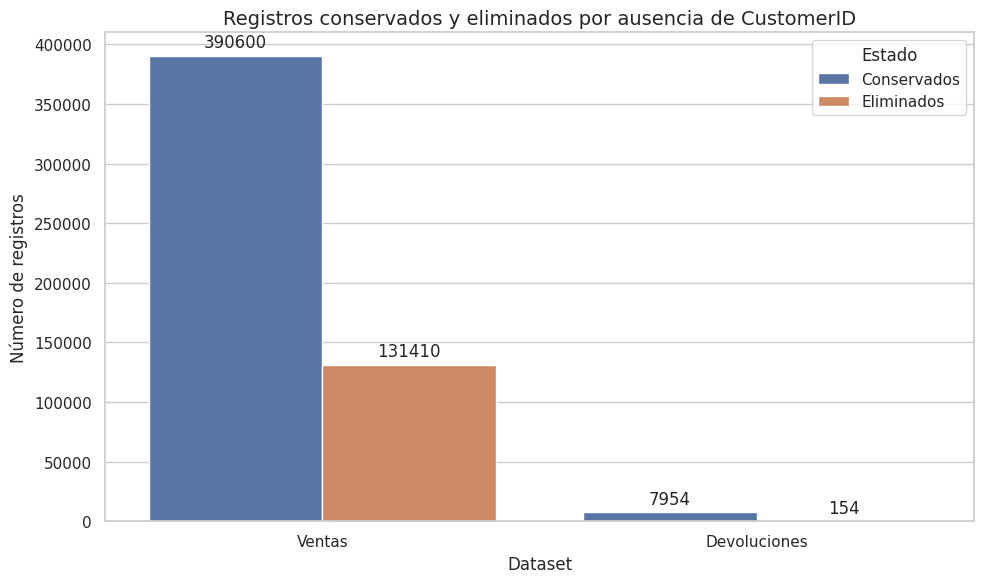

,Dataset,Estado,Porcentaje
0,Ventas,Conservados,74.83
1,Ventas,Eliminados,25.17
2,Devoluciones,Conservados,98.10
3,Devoluciones,Eliminados,1.90


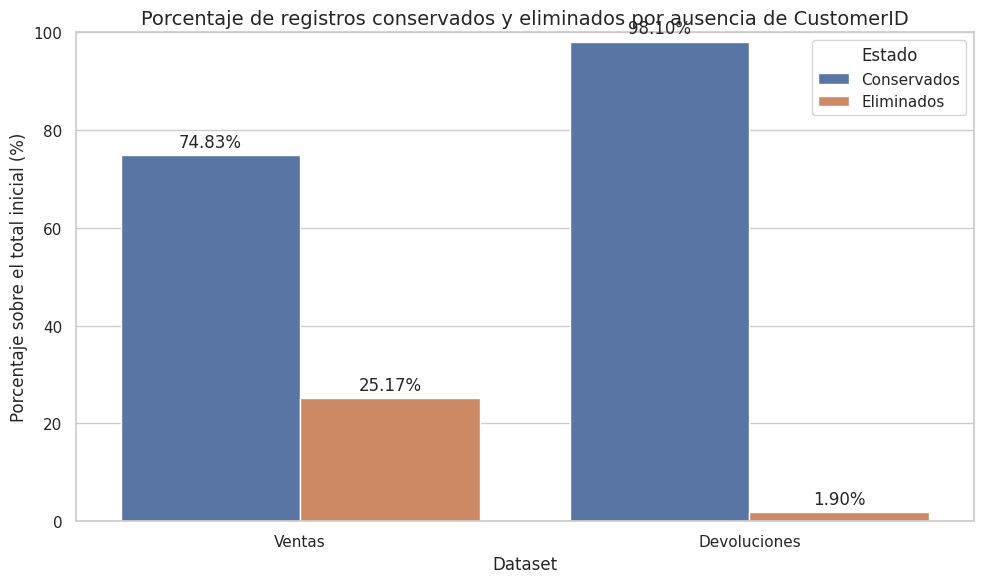

In [10]:
# ============================================================
# CELDA 6.1 — VISUALIZACIÓN DE LA LIMPIEZA DE CUSTOMERID
# ============================================================

# ------------------------------------------------------------
# 1. Crear dataframe resumen de limpieza
# ------------------------------------------------------------
resumen_limpieza = pd.DataFrame({
    "Dataset": ["Ventas", "Ventas", "Devoluciones", "Devoluciones"],
    "Estado": ["Conservados", "Eliminados", "Conservados", "Eliminados"],
    "Registros": [
        filas_ventas_final,
        eliminadas_ventas,
        filas_devoluciones_final,
        eliminadas_devoluciones
    ]
})

display(resumen_limpieza)

# ------------------------------------------------------------
# 2. Gráfico de barras: registros conservados vs eliminados
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

ax = sns.barplot(
    data=resumen_limpieza,
    x="Dataset",
    y="Registros",
    hue="Estado"
)

plt.title("Registros conservados y eliminados por ausencia de CustomerID")
plt.xlabel("Dataset")
plt.ylabel("Número de registros")
plt.legend(title="Estado")

# Añadir etiquetas numéricas encima de cada barra
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. Crear dataframe de porcentajes
# ------------------------------------------------------------
resumen_porcentajes = pd.DataFrame({
    "Dataset": ["Ventas", "Ventas", "Devoluciones", "Devoluciones"],
    "Estado": ["Conservados", "Eliminados", "Conservados", "Eliminados"],
    "Porcentaje": [
        round(filas_ventas_final / filas_ventas_inicial * 100, 2),
        porcentaje_eliminadas_ventas,
        round(filas_devoluciones_final / filas_devoluciones_inicial * 100, 2),
        porcentaje_eliminadas_devoluciones
    ]
})

display(resumen_porcentajes)

# ------------------------------------------------------------
# 4. Gráfico de barras: porcentaje conservado vs eliminado
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

ax = sns.barplot(
    data=resumen_porcentajes,
    x="Dataset",
    y="Porcentaje",
    hue="Estado"
)

plt.title("Porcentaje de registros conservados y eliminados por ausencia de CustomerID")
plt.xlabel("Dataset")
plt.ylabel("Porcentaje sobre el total inicial (%)")
plt.ylim(0, 100)
plt.legend(title="Estado")

# Añadir etiquetas porcentuales encima de cada barra
for container in ax.containers:
    ax.bar_label(container, fmt="%.2f%%", padding=3)

plt.tight_layout()
plt.show()

Para complementar la limpieza inicial, se generaron gráficos de barras con el objetivo de visualizar el impacto de la eliminación de registros sin CustomerID. Esta representación permite observar de forma directa la proporción de registros conservados y descartados en los datasets de ventas y devoluciones.

En el dataset de ventas se conservaron 390.600 registros, equivalentes al 74,83% del total inicial, y se eliminaron 131.410 registros, equivalentes al 25,17%. En el dataset de devoluciones se conservaron 7.954 registros, equivalentes al 98,10%, y se eliminaron 154 registros, equivalentes al 1,90%.

Los gráficos muestran que la ausencia de identificador de cliente afecta principalmente al dataset de ventas. No obstante, esta eliminación resulta necesaria desde el punto de vista metodológico, ya que el análisis posterior se realizará a nivel de cliente y requiere que cada operación pueda asociarse a un CustomerID válido.

In [11]:
# ============================================================
# CELDA 7 — VALIDACIÓN POSTERIOR A LA LIMPIEZA
# ============================================================

# ------------------------------------------------------------
# 1. Comprobación de nulos en CustomerID
# ------------------------------------------------------------
print("NULOS EN CustomerID TRAS LIMPIEZA")
print("Ventas:", ventas_limpias["CustomerID"].isnull().sum())
print("Devoluciones:", devoluciones_limpias["CustomerID"].isnull().sum())

# ------------------------------------------------------------
# 2. Comprobación de tipo de dato en CustomerID
# ------------------------------------------------------------
print("\nTIPO DE DATO CustomerID TRAS LIMPIEZA")
print("Ventas:", ventas_limpias["CustomerID"].dtype)
print("Devoluciones:", devoluciones_limpias["CustomerID"].dtype)

# ------------------------------------------------------------
# 3. Validación de signos económicos tras limpieza
# ------------------------------------------------------------
print("\nVALIDACIÓN ECONÓMICA TRAS LIMPIEZA")
print("Ventas con TotalPrice <= 0:", (ventas_limpias["TotalPrice"] <= 0).sum())
print("Devoluciones con TotalPrice >= 0:", (devoluciones_limpias["TotalPrice"] >= 0).sum())

print("Ventas con Quantity <= 0:", (ventas_limpias["Quantity"] <= 0).sum())
print("Devoluciones con Quantity >= 0:", (devoluciones_limpias["Quantity"] >= 0).sum())

# ------------------------------------------------------------
# 4. Clientes únicos tras limpieza
# ------------------------------------------------------------
clientes_ventas_limpias = set(ventas_limpias["CustomerID"])
clientes_devoluciones_limpias = set(devoluciones_limpias["CustomerID"])

clientes_comunes_limpios = clientes_ventas_limpias.intersection(clientes_devoluciones_limpias)
clientes_solo_ventas_limpios = clientes_ventas_limpias.difference(clientes_devoluciones_limpias)
clientes_solo_devoluciones_limpios = clientes_devoluciones_limpias.difference(clientes_ventas_limpias)

print("\nCLIENTES ÚNICOS TRAS LIMPIEZA")
print("Clientes en ventas limpias:", len(clientes_ventas_limpias))
print("Clientes en devoluciones limpias:", len(clientes_devoluciones_limpias))
print("Clientes comunes:", len(clientes_comunes_limpios))
print("Clientes solo en ventas:", len(clientes_solo_ventas_limpios))
print("Clientes solo en devoluciones:", len(clientes_solo_devoluciones_limpios))

NULOS EN CustomerID TRAS LIMPIEZA
Ventas: 0
Devoluciones: 0

TIPO DE DATO CustomerID TRAS LIMPIEZA
Ventas: int64
Devoluciones: int64

VALIDACIÓN ECONÓMICA TRAS LIMPIEZA
Ventas con TotalPrice <= 0: 0
Devoluciones con TotalPrice >= 0: 0
Ventas con Quantity <= 0: 0
Devoluciones con Quantity >= 0: 0

CLIENTES ÚNICOS TRAS LIMPIEZA
Clientes en ventas limpias: 4333
Clientes en devoluciones limpias: 1489
Clientes comunes: 1461
Clientes solo en ventas: 2872
Clientes solo en devoluciones: 28


Celda 7

Tras la eliminación de los registros sin CustomerID, se realizó una validación posterior para comprobar que los datasets limpios mantenían la coherencia necesaria para el análisis. En ambos conjuntos de datos se confirmó la ausencia total de valores nulos en la variable CustomerID, quedando esta convertida correctamente a tipo entero.

También se verificó que la naturaleza económica de cada dataset se mantenía tras la limpieza. En el dataset de ventas no se identificaron operaciones con TotalPrice o Quantity menor o igual a cero. Del mismo modo, en el dataset de devoluciones no se identificaron operaciones con TotalPrice o Quantity mayor o igual a cero. Esto confirma que las ventas continúan representando operaciones positivas y las devoluciones operaciones negativas.

Después de la limpieza, el dataset de ventas conserva 4.333 clientes únicos, mientras que el dataset de devoluciones conserva 1.489. De ellos, 1.461 clientes aparecen en ambos datasets, 2.872 aparecen únicamente en ventas y 28 aparecen únicamente en devoluciones. Esta distribución confirma que el dataset final de clustering deberá construirse tomando como base los clientes con ventas, incorporando las devoluciones cuando existan.

,Grupo,Clientes
0,Ventas y devoluciones,1461
1,Solo ventas,2872
2,Solo devoluciones,28


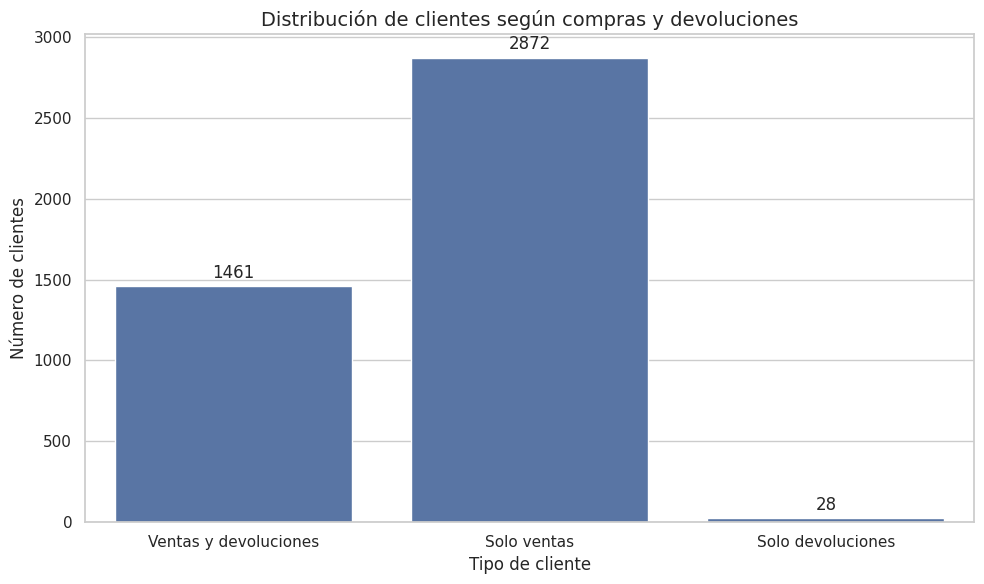

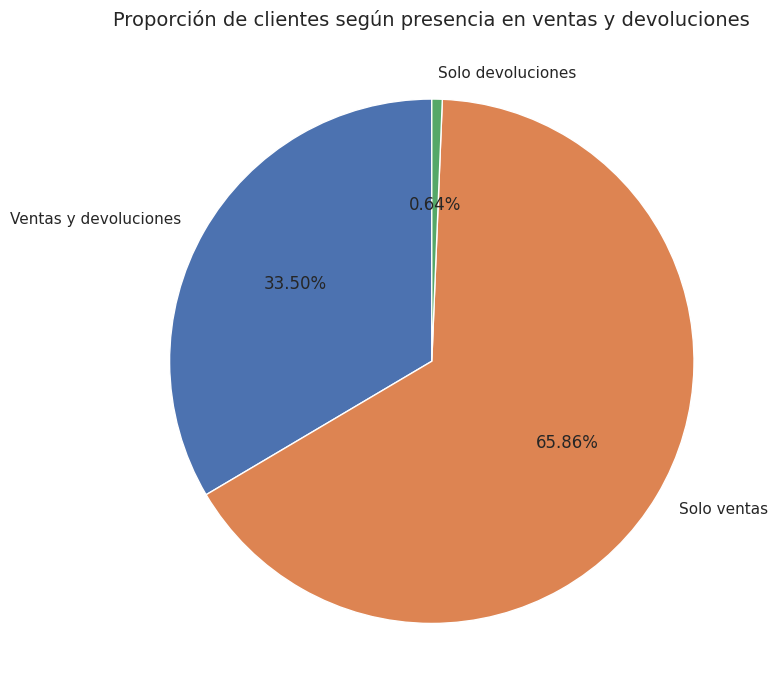

In [12]:
# ============================================================
# CELDA 8 — ANÁLISIS VISUAL DE CLIENTES CON Y SIN DEVOLUCIONES
# ============================================================

# ------------------------------------------------------------
# 1. Crear dataframe resumen de clientes
# ------------------------------------------------------------
resumen_clientes = pd.DataFrame({
    "Grupo": [
        "Ventas y devoluciones",
        "Solo ventas",
        "Solo devoluciones"
    ],
    "Clientes": [
        len(clientes_comunes_limpios),
        len(clientes_solo_ventas_limpios),
        len(clientes_solo_devoluciones_limpios)
    ]
})

display(resumen_clientes)

# ------------------------------------------------------------
# 2. Gráfico de barras
# ------------------------------------------------------------
plt.figure(figsize=(10, 6))

ax = sns.barplot(
    data=resumen_clientes,
    x="Grupo",
    y="Clientes"
)

plt.title("Distribución de clientes según compras y devoluciones")
plt.xlabel("Tipo de cliente")
plt.ylabel("Número de clientes")

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. Gráfico circular
# ------------------------------------------------------------
plt.figure(figsize=(8, 8))

plt.pie(
    resumen_clientes["Clientes"],
    labels=resumen_clientes["Grupo"],
    autopct="%1.2f%%",
    startangle=90
)

plt.title("Proporción de clientes según presencia en ventas y devoluciones")
plt.tight_layout()
plt.show()

Celda 8

La visualización de clientes según su presencia en los datasets de ventas y devoluciones permitió observar que la mayoría de los clientes identificados presentan únicamente operaciones de compra. En concreto, 2.872 clientes aparecen solo en el dataset de ventas, lo que representa el 65,86% del total de clientes considerados en esta comparación.

Por otro lado, 1.461 clientes presentan tanto compras como devoluciones, equivalentes al 33,50%. Este grupo resulta especialmente relevante para el análisis, ya que permite estudiar el efecto de las devoluciones sobre el valor neto generado por el cliente.

Finalmente, se detectaron 28 clientes presentes únicamente en el dataset de devoluciones, equivalentes al 0,64%. Dado que no disponen de compras positivas asociadas en el dataset de ventas, estos casos no se utilizarán como base del clustering principal. La estrategia metodológica adoptada consiste en construir el dataset final a partir de los clientes con ventas, incorporando las métricas de devolución cuando existan y asignando valor cero cuando el cliente no tenga devoluciones registradas.

In [13]:
# ============================================================
# CELDA 9 — AGREGACIÓN INICIAL DE VENTAS POR CLIENTE
# ============================================================

# ------------------------------------------------------------
# 1. Agregar métricas de ventas por CustomerID
# ------------------------------------------------------------
ventas_cliente = (
    ventas_limpias
    .groupby("CustomerID")
    .agg(
        GrossRevenue=("TotalPrice", "sum"),
        TotalQuantityPurchased=("Quantity", "sum"),
        PurchaseFrequency=("InvoiceNo", "nunique"),
        UniqueProductsPurchased=("StockCode", "nunique"),
        FirstPurchaseDate=("InvoiceDate", "min"),
        LastPurchaseDate=("InvoiceDate", "max"),
        Country=("Country", lambda x: x.mode()[0] if not x.mode().empty else x.iloc[0])
    )
    .reset_index()
)

# ------------------------------------------------------------
# 2. Calcular ticket medio por factura
# ------------------------------------------------------------
ventas_cliente["AverageOrderValue"] = (
    ventas_cliente["GrossRevenue"] / ventas_cliente["PurchaseFrequency"]
)

# ------------------------------------------------------------
# 3. Ordenar por mayor facturación bruta
# ------------------------------------------------------------
ventas_cliente = ventas_cliente.sort_values(
    by="GrossRevenue",
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# 4. Mostrar resultados
# ------------------------------------------------------------
print("Dimensiones dataset agregado de ventas por cliente:", ventas_cliente.shape)

print("\nPrimeras filas del dataset agregado de ventas:")
display(ventas_cliente.head())

print("\nResumen estadístico de métricas de ventas:")
display(
    ventas_cliente[
        [
            "GrossRevenue",
            "TotalQuantityPurchased",
            "PurchaseFrequency",
            "UniqueProductsPurchased",
            "AverageOrderValue"
        ]
    ].describe()
)

Dimensiones dataset agregado de ventas por cliente: (4333, 9)

Primeras filas del dataset agregado de ventas:


,CustomerID,GrossRevenue,TotalQuantityPurchased,PurchaseFrequency,UniqueProductsPurchased,FirstPurchaseDate,LastPurchaseDate,Country,AverageOrderValue
0,14646,"279,138.02",196844,72,699,2010-12-20 10:09:00,2011-12-08 12:12:00,Netherlands,"3,876.92"
1,18102,"259,657.30",64124,60,150,2010-12-07 16:42:00,2011-12-09 11:50:00,United Kingdom,"4,327.62"
2,17450,"194,390.79",69973,46,124,2010-12-07 09:23:00,2011-12-01 13:29:00,United Kingdom,"4,225.89"
3,14911,"131,793.23",77874,196,1785,2010-12-01 14:05:00,2011-12-08 15:54:00,EIRE,672.41
4,12415,"124,405.88",77276,19,443,2011-01-06 11:12:00,2011-11-15 14:22:00,Australia,"6,547.68"



Resumen estadístico de métricas de ventas:


,GrossRevenue,TotalQuantityPurchased,PurchaseFrequency,UniqueProductsPurchased,AverageOrderValue
count,"4,333.00","4,333.00","4,333.00","4,333.00","4,333.00"
mean,"1,951.72","1,146.57",4.24,61.41,379.67
std,"8,423.87","4,744.08",7.60,85.27,556.38
min,2.90,1.00,1.00,1.00,2.90
25%,303.16,159.00,1.00,16.00,176.68
50%,659.41,376.00,2.00,35.00,289.35
75%,"1,624.05",988.00,5.00,77.00,423.79
max,"279,138.02","196,844.00",204.00,"1,785.00","19,809.75"


Celda 9

Tras validar y limpiar los datasets, se construyó la primera agregación a nivel de cliente utilizando el dataset de ventas. El objetivo fue transformar la información transaccional, compuesta por múltiples líneas de factura, en un dataset analítico donde cada fila representa un único cliente y resume su comportamiento de compra.

La agregación generó un total de 4.333 clientes, coincidiendo con el número de clientes únicos identificados en el dataset de ventas limpio. Para cada cliente se calcularon variables como el importe bruto total comprado (GrossRevenue), la cantidad total de unidades adquiridas (TotalQuantityPurchased), la frecuencia de compra medida como número de facturas distintas (PurchaseFrequency), el número de productos únicos comprados (UniqueProductsPurchased), la primera y última fecha de compra, el país principal y el ticket medio por factura (AverageOrderValue).

El análisis estadístico inicial muestra una distribución comercial claramente asimétrica. La facturación media por cliente es de 1.951,72, mientras que la mediana se sitúa en 659,41, lo que indica la existencia de clientes de alto valor que elevan la media. La frecuencia media es de 4,24 pedidos por cliente, aunque la mediana es de 2 pedidos. El cliente con mayor facturación alcanza 279.138,02 y el máximo de frecuencia es de 204 pedidos, reflejando la presencia de clientes con comportamiento de compra muy intensivo.

Esta agregación constituye la base positiva del análisis de valor neto, sobre la que posteriormente se incorporarán las métricas de devolución.

In [14]:
# ============================================================
# CELDA 10 — AGREGACIÓN INICIAL DE DEVOLUCIONES POR CLIENTE
# ============================================================

# ------------------------------------------------------------
# 1. Crear copia para no alterar el dataset limpio original
# ------------------------------------------------------------
devoluciones_aux = devoluciones_limpias.copy()

# ------------------------------------------------------------
# 2. Convertir importes y cantidades negativas a magnitudes positivas
# ------------------------------------------------------------
devoluciones_aux["ReturnAmountLine"] = devoluciones_aux["TotalPrice"].abs()
devoluciones_aux["ReturnQuantityLine"] = devoluciones_aux["Quantity"].abs()

# ------------------------------------------------------------
# 3. Agregar métricas de devoluciones por CustomerID
# ------------------------------------------------------------
devoluciones_cliente = (
    devoluciones_aux
    .groupby("CustomerID")
    .agg(
        ReturnAmount=("ReturnAmountLine", "sum"),
        TotalQuantityReturned=("ReturnQuantityLine", "sum"),
        ReturnFrequency=("InvoiceNo", "nunique"),
        UniqueProductsReturned=("StockCode", "nunique"),
        FirstReturnDate=("InvoiceDate", "min"),
        LastReturnDate=("InvoiceDate", "max"),
        ReturnCountry=("Country", lambda x: x.mode()[0] if not x.mode().empty else x.iloc[0])
    )
    .reset_index()
)

# ------------------------------------------------------------
# 4. Calcular devolución media por factura
# ------------------------------------------------------------
devoluciones_cliente["AverageReturnValue"] = (
    devoluciones_cliente["ReturnAmount"] / devoluciones_cliente["ReturnFrequency"]
)

# ------------------------------------------------------------
# 5. Ordenar por mayor importe devuelto
# ------------------------------------------------------------
devoluciones_cliente = devoluciones_cliente.sort_values(
    by="ReturnAmount",
    ascending=False
).reset_index(drop=True)

# ------------------------------------------------------------
# 6. Mostrar resultados
# ------------------------------------------------------------
print("Dimensiones dataset agregado de devoluciones por cliente:", devoluciones_cliente.shape)

print("\nPrimeras filas del dataset agregado de devoluciones:")
display(devoluciones_cliente.head())

print("\nResumen estadístico de métricas de devoluciones:")
display(
    devoluciones_cliente[
        [
            "ReturnAmount",
            "TotalQuantityReturned",
            "ReturnFrequency",
            "UniqueProductsReturned",
            "AverageReturnValue"
        ]
    ].describe()
)

Dimensiones dataset agregado de devoluciones por cliente: (1489, 9)

Primeras filas del dataset agregado de devoluciones:


,CustomerID,ReturnAmount,TotalQuantityReturned,ReturnFrequency,UniqueProductsReturned,FirstReturnDate,LastReturnDate,ReturnCountry,AverageReturnValue
0,15749,"22,998.40",9014,1,5,2011-04-18 13:08:00,2011-04-18 13:08:00,United Kingdom,"22,998.40"
1,16029,"9,556.56",4920,2,9,2011-01-04 13:47:00,2011-10-11 11:10:00,United Kingdom,"4,778.28"
2,12931,"8,511.15",4427,4,15,2011-08-31 13:10:00,2011-11-11 17:01:00,United Kingdom,"2,127.79"
3,17450,"4,815.26",952,3,2,2011-09-21 09:16:00,2011-11-29 10:16:00,United Kingdom,"1,605.09"
4,17949,"4,733.38",2854,4,6,2011-06-30 12:44:00,2011-08-22 17:10:00,United Kingdom,"1,183.35"



Resumen estadístico de métricas de devoluciones:


,ReturnAmount,TotalQuantityReturned,ReturnFrequency,UniqueProductsReturned,AverageReturnValue
count,"1,489.00","1,489.00","1,489.00","1,489.00","1,489.00"
mean,128.57,63.17,2.19,4.75,69.52
std,745.19,405.68,2.76,8.55,629.46
min,0.42,1.00,1.00,1.00,0.42
25%,12.75,3.00,1.00,1.00,9.68
50%,29.15,8.00,1.00,2.00,16.95
75%,68.68,24.00,2.00,5.00,34.80
max,"22,998.40","9,360.00",45.00,166.00,"22,998.40"


Celda 10

Después de construir la agregación de ventas por cliente, se generó una agregación equivalente para el dataset de devoluciones. Dado que en el dataset transaccional original las devoluciones aparecen con cantidades e importes negativos, estas magnitudes se transformaron a valores absolutos para facilitar su interpretación. De este modo, el importe devuelto y las unidades devueltas se expresan como valores positivos que representan el volumen total de devolución asociado a cada cliente.

La agregación generó un total de 1.489 clientes con devoluciones registradas. Para cada cliente se calcularon variables como el importe total devuelto (ReturnAmount), la cantidad total de unidades devueltas (TotalQuantityReturned), la frecuencia de devolución medida como número de facturas distintas (ReturnFrequency), el número de productos únicos devueltos (UniqueProductsReturned), la primera y última fecha de devolución, el país asociado a la devolución y el importe medio devuelto por factura (AverageReturnValue).

El análisis estadístico muestra que las devoluciones presentan una distribución muy asimétrica. El importe medio devuelto por cliente es de 128,57, mientras que la mediana se sitúa en 29,15, lo que indica que la mayoría de clientes devuelve importes bajos, pero existen casos puntuales con devoluciones elevadas. El importe máximo devuelto alcanza 22.998,40 y la frecuencia máxima de devolución es de 45 facturas. Esta dispersión será relevante en fases posteriores, especialmente al analizar tasas de devolución y posibles clientes con comportamiento de riesgo.

In [15]:
# ============================================================
# CELDA 11 — UNIÓN DE VENTAS Y DEVOLUCIONES POR CLIENTE
# ============================================================

# ------------------------------------------------------------
# 1. Unión tomando como base los clientes con ventas
# ------------------------------------------------------------
clientes_base = ventas_cliente.merge(
    devoluciones_cliente,
    on="CustomerID",
    how="left"
)

# ------------------------------------------------------------
# 2. Crear indicador de cliente con devoluciones
# ------------------------------------------------------------
clientes_base["HasReturns"] = clientes_base["ReturnAmount"].notna().astype(int)

# ------------------------------------------------------------
# 3. Rellenar con cero las métricas de devolución no existentes
# ------------------------------------------------------------
columnas_devolucion_numericas = [
    "ReturnAmount",
    "TotalQuantityReturned",
    "ReturnFrequency",
    "UniqueProductsReturned",
    "AverageReturnValue"
]

clientes_base[columnas_devolucion_numericas] = (
    clientes_base[columnas_devolucion_numericas]
    .fillna(0)
)

# ------------------------------------------------------------
# 4. Mostrar resultados de la unión
# ------------------------------------------------------------
print("Dimensiones dataset integrado cliente:", clientes_base.shape)

print("\nClientes con devoluciones:")
print(clientes_base["HasReturns"].sum())

print("\nClientes sin devoluciones:")
print((clientes_base["HasReturns"] == 0).sum())

print("\nPrimeras filas del dataset integrado:")
display(clientes_base.head())

print("\nNulos restantes por columna:")
display(clientes_base.isnull().sum().to_frame(name="Nulos"))

Dimensiones dataset integrado cliente: (4333, 18)

Clientes con devoluciones:
1461

Clientes sin devoluciones:
2872

Primeras filas del dataset integrado:


,CustomerID,GrossRevenue,TotalQuantityPurchased,PurchaseFrequency,UniqueProductsPurchased,FirstPurchaseDate,LastPurchaseDate,Country,AverageOrderValue,ReturnAmount,TotalQuantityReturned,ReturnFrequency,UniqueProductsReturned,FirstReturnDate,LastReturnDate,ReturnCountry,AverageReturnValue,HasReturns
0,14646,"279,138.02",196844,72,699,2010-12-20 10:09:00,2011-12-08 12:12:00,Netherlands,"3,876.92",360.00,288.00,1.00,2.00,2011-08-31 11:31:00,2011-08-31 11:31:00,Netherlands,360.00,1
1,18102,"259,657.30",64124,60,150,2010-12-07 16:42:00,2011-12-09 11:50:00,United Kingdom,"4,327.62",0.00,0.00,0.00,0.00,NaT,NaT,NaN,0.00,0
2,17450,"194,390.79",69973,46,124,2010-12-07 09:23:00,2011-12-01 13:29:00,United Kingdom,"4,225.89","4,815.26",952.00,3.00,2.00,2011-09-21 09:16:00,2011-11-29 10:16:00,United Kingdom,"1,605.09",1
3,14911,"131,793.23",77874,196,1785,2010-12-01 14:05:00,2011-12-08 15:54:00,EIRE,672.41,"3,024.99","1,051.00",42.00,166.00,2010-12-16 12:56:00,2011-12-01 13:12:00,EIRE,72.02,1
4,12415,"124,405.88",77276,19,443,2011-01-06 11:12:00,2011-11-15 14:22:00,Australia,"6,547.68",767.70,330.00,3.00,4.00,2011-03-03 13:11:00,2011-11-02 12:05:00,Australia,255.90,1



Nulos restantes por columna:


,Nulos
CustomerID,0
GrossRevenue,0
TotalQuantityPurchased,0
PurchaseFrequency,0
UniqueProductsPurchased,0
FirstPurchaseDate,0
LastPurchaseDate,0
Country,0
AverageOrderValue,0
ReturnAmount,0


Celda 11

Una vez calculadas las métricas agregadas de ventas y devoluciones, se integraron ambos conjuntos de información mediante la variable CustomerID. La unión se realizó tomando como base los clientes presentes en el dataset de ventas, ya que el objetivo del análisis es evaluar el valor neto generado por clientes compradores.

El dataset integrado resultante contiene 4.333 clientes y 18 variables. De estos clientes, 1.461 presentan al menos una devolución registrada, mientras que 2.872 no tienen devoluciones asociadas. En estos últimos casos, las variables numéricas de devolución fueron imputadas con valor cero, ya que la ausencia de devoluciones representa un comportamiento válido y relevante para el análisis.

Tras la unión, los únicos valores nulos restantes se concentran en las variables FirstReturnDate, LastReturnDate y ReturnCountry, correspondientes precisamente a los clientes sin devoluciones. Estos nulos no suponen un problema para el clustering, ya que dichas variables no se utilizarán directamente como variables numéricas del modelo, sino como información auxiliar.

Esta integración constituye el primer dataset combinado de cliente, en el que se recoge tanto su comportamiento de compra como su comportamiento de devolución. Sobre esta base se construirán posteriormente las variables de valor neto, tasa de devolución y rentabilidad comercial.

In [16]:
# ============================================================
# CELDA 12 — VARIABLES DE VALOR NETO Y DEVOLUCIÓN
# ============================================================

# ------------------------------------------------------------
# 1. Crear copia del dataset integrado
# ------------------------------------------------------------
clientes_valor = clientes_base.copy()

# ------------------------------------------------------------
# 2. Variables económicas netas
# ------------------------------------------------------------
clientes_valor["NetRevenue"] = (
    clientes_valor["GrossRevenue"] - clientes_valor["ReturnAmount"]
)

clientes_valor["NetAverageOrderValue"] = (
    clientes_valor["NetRevenue"] / clientes_valor["PurchaseFrequency"]
)

# ------------------------------------------------------------
# 3. Variables de tasa de devolución económica
# ------------------------------------------------------------
clientes_valor["ReturnRate"] = (
    clientes_valor["ReturnAmount"] / clientes_valor["GrossRevenue"]
)

clientes_valor["ReturnImpact"] = clientes_valor["ReturnRate"]

# ------------------------------------------------------------
# 4. Variables de cantidad neta
# ------------------------------------------------------------
clientes_valor["NetQuantity"] = (
    clientes_valor["TotalQuantityPurchased"] -
    clientes_valor["TotalQuantityReturned"]
)

clientes_valor["QuantityReturnRate"] = (
    clientes_valor["TotalQuantityReturned"] /
    clientes_valor["TotalQuantityPurchased"]
)

# ------------------------------------------------------------
# 5. Variables de frecuencia relativa
# ------------------------------------------------------------
clientes_valor["ReturnFrequencyRatio"] = (
    clientes_valor["ReturnFrequency"] /
    clientes_valor["PurchaseFrequency"]
)

# ------------------------------------------------------------
# 6. Control de infinitos o nulos generados por divisiones
# ------------------------------------------------------------
clientes_valor = clientes_valor.replace([np.inf, -np.inf], np.nan)

columnas_nuevas = [
    "NetRevenue",
    "NetAverageOrderValue",
    "ReturnRate",
    "ReturnImpact",
    "NetQuantity",
    "QuantityReturnRate",
    "ReturnFrequencyRatio"
]

clientes_valor[columnas_nuevas] = clientes_valor[columnas_nuevas].fillna(0)

# ------------------------------------------------------------
# 7. Validaciones principales
# ------------------------------------------------------------
clientes_net_negativo = (clientes_valor["NetRevenue"] < 0).sum()
clientes_returnrate_mayor_1 = (clientes_valor["ReturnRate"] > 1).sum()
clientes_quantityrate_mayor_1 = (clientes_valor["QuantityReturnRate"] > 1).sum()

print("Dimensiones dataset con variables de valor:", clientes_valor.shape)

print("\nVALIDACIONES DE VALOR NETO")
print("Clientes con NetRevenue negativo:", clientes_net_negativo)
print("Clientes con ReturnRate > 1:", clientes_returnrate_mayor_1)
print("Clientes con QuantityReturnRate > 1:", clientes_quantityrate_mayor_1)

print("\nPrimeras filas con variables de valor:")
display(
    clientes_valor[
        [
            "CustomerID",
            "GrossRevenue",
            "ReturnAmount",
            "NetRevenue",
            "ReturnRate",
            "PurchaseFrequency",
            "ReturnFrequency",
            "ReturnFrequencyRatio",
            "TotalQuantityPurchased",
            "TotalQuantityReturned",
            "NetQuantity",
            "QuantityReturnRate"
        ]
    ].head()
)

print("\nResumen estadístico de variables de valor neto:")
display(
    clientes_valor[
        [
            "GrossRevenue",
            "ReturnAmount",
            "NetRevenue",
            "ReturnRate",
            "NetAverageOrderValue",
            "NetQuantity",
            "QuantityReturnRate",
            "ReturnFrequencyRatio"
        ]
    ].describe()
)

Dimensiones dataset con variables de valor: (4333, 25)

VALIDACIONES DE VALOR NETO
Clientes con NetRevenue negativo: 2
Clientes con ReturnRate > 1: 2
Clientes con QuantityReturnRate > 1: 2

Primeras filas con variables de valor:


,CustomerID,GrossRevenue,ReturnAmount,NetRevenue,ReturnRate,PurchaseFrequency,ReturnFrequency,ReturnFrequencyRatio,TotalQuantityPurchased,TotalQuantityReturned,NetQuantity,QuantityReturnRate
0,14646,"279,138.02",360.00,"278,778.02",0.00,72,1.00,0.01,196844,288.00,"196,556.00",0.00
1,18102,"259,657.30",0.00,"259,657.30",0.00,60,0.00,0.00,64124,0.00,"64,124.00",0.00
2,17450,"194,390.79","4,815.26","189,575.53",0.02,46,3.00,0.07,69973,952.00,"69,021.00",0.01
3,14911,"131,793.23","3,024.99","128,768.24",0.02,196,42.00,0.21,77874,"1,051.00","76,823.00",0.01
4,12415,"124,405.88",767.70,"123,638.18",0.01,19,3.00,0.16,77276,330.00,"76,946.00",0.00



Resumen estadístico de variables de valor neto:


,GrossRevenue,ReturnAmount,NetRevenue,ReturnRate,NetAverageOrderValue,NetQuantity,QuantityReturnRate,ReturnFrequencyRatio
count,"4,333.00","4,333.00","4,333.00","4,333.00","4,333.00","4,333.00","4,333.00","4,333.00"
mean,"1,951.72",43.28,"1,908.45",0.02,370.37,"1,125.17",0.02,0.16
std,"8,423.87",440.42,"8,291.99",0.08,515.92,"4,683.73",0.09,0.32
min,2.90,0.00,-141.48,0.00,-141.48,-303.00,0.00,0.00
25%,303.16,0.00,297.00,0.00,172.45,156.00,0.00,0.00
50%,659.41,0.00,646.92,0.00,281.42,369.00,0.00,0.00
75%,"1,624.05",12.85,"1,601.86",0.01,419.81,970.00,0.00,0.21
max,"279,138.02","22,998.40","278,778.02",2.37,"19,809.75","196,556.00",3.28,3.00


Celda 12

A partir del dataset integrado de ventas y devoluciones, se construyeron nuevas variables orientadas a medir el valor neto generado por cada cliente. La principal variable creada fue NetRevenue, calculada como la diferencia entre el importe bruto comprado (GrossRevenue) y el importe devuelto (ReturnAmount). Esta métrica permite aproximar el ingreso real generado por el cliente una vez descontadas las devoluciones.

También se calcularon variables relativas como ReturnRate, que mide el peso económico de las devoluciones sobre el importe bruto comprado, QuantityReturnRate, que representa la proporción de unidades devueltas sobre las unidades compradas, y ReturnFrequencyRatio, que compara la frecuencia de devoluciones frente a la frecuencia de compra. Además, se generaron variables netas como NetQuantity y NetAverageOrderValue.

El dataset resultante contiene 4.333 clientes y 25 variables. El análisis estadístico muestra una distribución claramente asimétrica. La facturación bruta media por cliente es de 1.951,72, mientras que la mediana se sitúa en 659,41. En el caso del valor neto, la media es de 1.908,45 y la mediana de 646,92. Esta diferencia entre media y mediana indica la presencia de clientes de alto valor que elevan los valores medios.

Se identificaron 2 clientes con NetRevenue negativo, así como 2 clientes con ReturnRate superior a 1 y 2 clientes con QuantityReturnRate superior a 1. Estos casos indican que, dentro del periodo analizado, algunos clientes presentan devoluciones superiores a sus compras registradas. No se eliminaron en esta fase, ya que pueden corresponder a devoluciones de compras previas, diferencias de registro o casos atípicos reales. Serán revisados posteriormente dentro del análisis de outliers y calidad avanzada.

Clientes con valor neto negativo o devolución superior a la compra:
Número de clientes detectados: 2


,CustomerID,Country,GrossRevenue,ReturnAmount,NetRevenue,ReturnRate,TotalQuantityPurchased,TotalQuantityReturned,NetQuantity,QuantityReturnRate,PurchaseFrequency,ReturnFrequency,ReturnFrequencyRatio,FirstPurchaseDate,LastPurchaseDate,FirstReturnDate,LastReturnDate
4154,17548,United Kingdom,103.30,244.78,-141.48,2.37,58,190.00,-132.00,3.28,1,2.00,2.00,2011-04-20 12:01:00,2011-04-20 12:01:00,2010-12-01 10:24:00,2011-05-06 10:00:00
1919,16546,United Kingdom,787.15,883.08,-95.93,1.12,549,852.00,-303.00,1.55,2,1.00,0.50,2010-12-02 12:07:00,2011-02-22 11:20:00,2010-12-02 16:58:00,2010-12-02 16:58:00


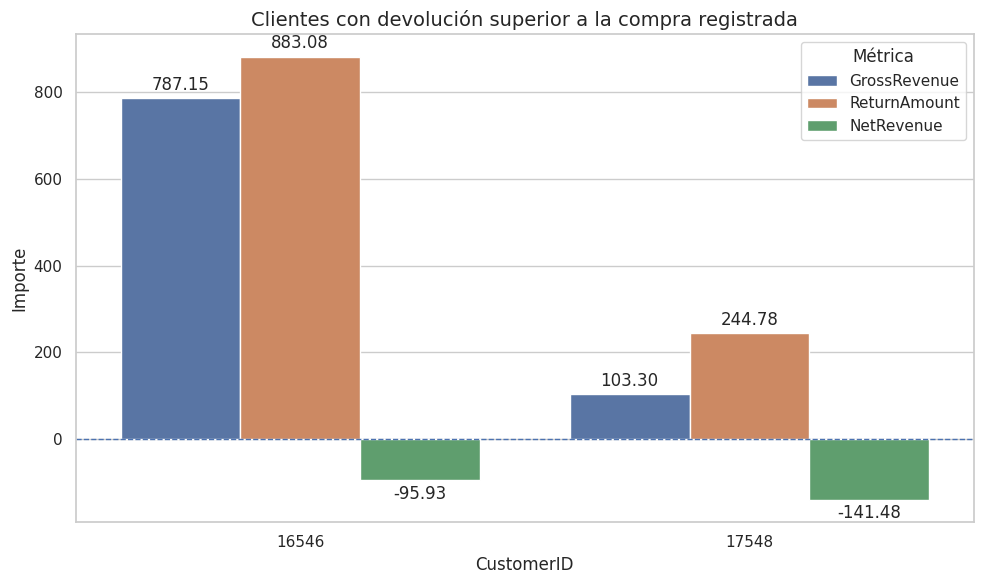

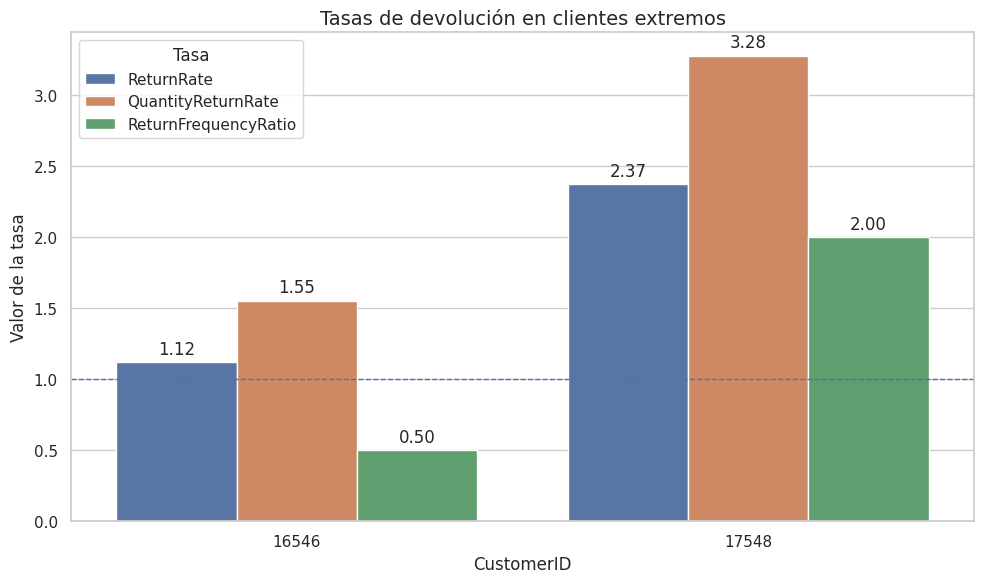

In [17]:
# ============================================================
# CELDA 13 — CLIENTES CON VALOR NETO NEGATIVO O DEVOLUCIÓN SUPERIOR A LA COMPRA
# ============================================================

# ------------------------------------------------------------
# 1. Filtrar clientes con comportamientos extremos de devolución
# ------------------------------------------------------------
clientes_devolucion_extrema = clientes_valor[
    (clientes_valor["NetRevenue"] < 0) |
    (clientes_valor["ReturnRate"] > 1) |
    (clientes_valor["QuantityReturnRate"] > 1)
].copy()

# ------------------------------------------------------------
# 2. Seleccionar columnas relevantes para revisión
# ------------------------------------------------------------
columnas_revision_extremos = [
    "CustomerID",
    "Country",
    "GrossRevenue",
    "ReturnAmount",
    "NetRevenue",
    "ReturnRate",
    "TotalQuantityPurchased",
    "TotalQuantityReturned",
    "NetQuantity",
    "QuantityReturnRate",
    "PurchaseFrequency",
    "ReturnFrequency",
    "ReturnFrequencyRatio",
    "FirstPurchaseDate",
    "LastPurchaseDate",
    "FirstReturnDate",
    "LastReturnDate"
]

print("Clientes con valor neto negativo o devolución superior a la compra:")
print("Número de clientes detectados:", len(clientes_devolucion_extrema))

display(
    clientes_devolucion_extrema[columnas_revision_extremos]
    .sort_values(by="NetRevenue")
)

# ------------------------------------------------------------
# 3. Gráfico comparativo de GrossRevenue, ReturnAmount y NetRevenue
# ------------------------------------------------------------
if len(clientes_devolucion_extrema) > 0:
    extremos_plot = clientes_devolucion_extrema[
        ["CustomerID", "GrossRevenue", "ReturnAmount", "NetRevenue"]
    ].melt(
        id_vars="CustomerID",
        var_name="Métrica",
        value_name="Importe"
    )

    plt.figure(figsize=(10, 6))

    ax = sns.barplot(
        data=extremos_plot,
        x="CustomerID",
        y="Importe",
        hue="Métrica"
    )

    plt.title("Clientes con devolución superior a la compra registrada")
    plt.xlabel("CustomerID")
    plt.ylabel("Importe")
    plt.axhline(0, linestyle="--", linewidth=1)

    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", padding=3)

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 4. Gráfico de tasas de devolución
# ------------------------------------------------------------
if len(clientes_devolucion_extrema) > 0:
    tasas_plot = clientes_devolucion_extrema[
        ["CustomerID", "ReturnRate", "QuantityReturnRate", "ReturnFrequencyRatio"]
    ].melt(
        id_vars="CustomerID",
        var_name="Tasa",
        value_name="Valor"
    )

    plt.figure(figsize=(10, 6))

    ax = sns.barplot(
        data=tasas_plot,
        x="CustomerID",
        y="Valor",
        hue="Tasa"
    )

    plt.title("Tasas de devolución en clientes extremos")
    plt.xlabel("CustomerID")
    plt.ylabel("Valor de la tasa")
    plt.axhline(1, linestyle="--", linewidth=1)

    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", padding=3)

    plt.tight_layout()
    plt.show()

Celda 13

Tras generar las variables de valor neto, se revisaron los clientes con comportamientos extremos relacionados con las devoluciones. En concreto, se identificaron aquellos casos en los que el valor neto era negativo o en los que la tasa de devolución económica o de unidades superaba el valor 1.

Se detectaron 2 clientes con este comportamiento. El cliente 17548 presenta una facturación bruta de 103,30 y un importe devuelto de 244,78, lo que genera un valor neto de -141,48. Su tasa de devolución económica es de 2,37 y su tasa de devolución en unidades es de 3,28. El cliente 16546 presenta una facturación bruta de 787,15 y un importe devuelto de 883,08, con un valor neto de -95,93, una tasa de devolución económica de 1,12 y una tasa de devolución en unidades de 1,55.

Estos casos indican que, dentro del periodo analizado, existen clientes con devoluciones superiores a sus compras registradas. Esta situación puede deberse a devoluciones de compras realizadas antes del periodo de análisis, operaciones positivas sin identificador de cliente, diferencias de registro o incidencias comerciales reales. Por este motivo, no se eliminaron en esta fase, sino que se documentaron como casos extremos para su revisión posterior dentro del análisis de outliers.

La identificación de estos clientes resulta relevante porque pueden afectar a métricas sensibles como NetRevenue, ReturnRate y QuantityReturnRate, así como influir en la posterior segmentación mediante clustering.

Tratamiento de la Celda 13

La revisión de clientes con valor neto negativo permitió identificar dos casos en los que las devoluciones superaban a las compras registradas dentro del periodo analizado. Estos clientes presentaban NetRevenue negativo, ReturnRate superior a 1 y QuantityReturnRate superior a 1.

Aunque estos registros no constituyen necesariamente errores, sí representan casos no comparables con el resto de clientes para el objetivo del clustering. Esta situación puede deberse a devoluciones de compras realizadas antes del periodo analizado, operaciones de venta sin identificador de cliente o diferencias de registro entre compras y devoluciones.

Por este motivo, se decidió no modificar ni eliminar estos registros del dataset original, pero sí excluirlos del dataset utilizado para el entrenamiento del clustering principal. Esta decisión evita que dos observaciones extremas distorsionen las métricas de segmentación, especialmente aquellas relacionadas con valor neto y tasa de devolución.

Los clientes excluidos fueron 17548 y 16546, con valores netos de -141,48 y -95,93 respectivamente. Ambos quedaron documentados como casos atípicos de devolución superior a compra registrada.

In [18]:
# ============================================================
# CELDA 13.1 — EXCLUSIÓN CONTROLADA DE CLIENTES NO COMPARABLES
# ============================================================

# ------------------------------------------------------------
# 1. Identificar clientes no comparables para el clustering
# ------------------------------------------------------------
condicion_no_comparable = (
    (clientes_valor["NetRevenue"] < 0) |
    (clientes_valor["ReturnRate"] > 1) |
    (clientes_valor["QuantityReturnRate"] > 1)
)

clientes_excluidos_valor_negativo = clientes_valor[condicion_no_comparable].copy()
clientes_modelo = clientes_valor[~condicion_no_comparable].copy()

# ------------------------------------------------------------
# 2. Resumen de exclusión
# ------------------------------------------------------------
print("TRATAMIENTO DE CLIENTES NO COMPARABLES")
print("Clientes originales:", len(clientes_valor))
print("Clientes excluidos del modelo:", len(clientes_excluidos_valor_negativo))
print("Clientes finales para modelado:", len(clientes_modelo))

print("\nClientes excluidos:")
display(
    clientes_excluidos_valor_negativo[
        [
            "CustomerID",
            "Country",
            "GrossRevenue",
            "ReturnAmount",
            "NetRevenue",
            "ReturnRate",
            "TotalQuantityPurchased",
            "TotalQuantityReturned",
            "NetQuantity",
            "QuantityReturnRate",
            "PurchaseFrequency",
            "ReturnFrequency",
            "ReturnFrequencyRatio"
        ]
    ]
)

# ------------------------------------------------------------
# 3. Validación del dataset final para modelado
# ------------------------------------------------------------
print("\nVALIDACIÓN DEL DATASET PARA MODELADO")
print("Clientes con NetRevenue negativo:", (clientes_modelo["NetRevenue"] < 0).sum())
print("Clientes con ReturnRate > 1:", (clientes_modelo["ReturnRate"] > 1).sum())
print("Clientes con QuantityReturnRate > 1:", (clientes_modelo["QuantityReturnRate"] > 1).sum())

print("\nDimensiones finales clientes_modelo:", clientes_modelo.shape)

TRATAMIENTO DE CLIENTES NO COMPARABLES
Clientes originales: 4333
Clientes excluidos del modelo: 2
Clientes finales para modelado: 4331

Clientes excluidos:


,CustomerID,Country,GrossRevenue,ReturnAmount,NetRevenue,ReturnRate,TotalQuantityPurchased,TotalQuantityReturned,NetQuantity,QuantityReturnRate,PurchaseFrequency,ReturnFrequency,ReturnFrequencyRatio
1919,16546,United Kingdom,787.15,883.08,-95.93,1.12,549,852.00,-303.00,1.55,2,1.00,0.50
4154,17548,United Kingdom,103.30,244.78,-141.48,2.37,58,190.00,-132.00,3.28,1,2.00,2.00



VALIDACIÓN DEL DATASET PARA MODELADO
Clientes con NetRevenue negativo: 0
Clientes con ReturnRate > 1: 0
Clientes con QuantityReturnRate > 1: 0

Dimensiones finales clientes_modelo: (4331, 25)


Celda 13.1

Tras identificar dos clientes con devoluciones superiores a sus compras registradas, se aplicó una exclusión controlada para el dataset de modelado. Esta decisión no implicó la eliminación de los registros del dataset original, sino la creación de una versión específica para clustering denominada clientes_modelo.

Los clientes excluidos fueron 16546 y 17548. Ambos presentaban valor neto negativo, tasa de devolución económica superior a 1 y tasa de devolución en unidades superior a 1. Estas condiciones indicaban que, dentro del periodo analizado, las devoluciones asociadas superaban a las compras positivas registradas.

Dado que el objetivo del modelo es segmentar clientes en función de su valor neto y comportamiento de compra-devolución, estos casos se consideraron no comparables con el resto de clientes. Su presencia podría distorsionar las variables de retorno y afectar a la formación de clusters.

Tras la exclusión, el dataset de modelado quedó compuesto por 4.331 clientes y 25 variables. La validación posterior confirmó que no quedaban clientes con NetRevenue negativo, ReturnRate superior a 1 ni QuantityReturnRate superior a 1.

In [19]:
# ============================================================
# CELDA 14 — REVISIÓN DE REGISTROS POTENCIALMENTE NO COMERCIALES
# ============================================================

# ------------------------------------------------------------
# 1. Definir patrones sospechosos o administrativos
# ------------------------------------------------------------
patrones_no_comerciales = [
    "POSTAGE",
    "CARRIAGE",
    "DISCOUNT",
    "MANUAL",
    "BANK CHARGES",
    "ADJUST",
    "AMAZON",
    "DOTCOM",
    "SAMPLES",
    "SAMPLE",
    "DAMAGED",
    "DAMAGE",
    "CRUK",
    "FEE",
    "CHARGES",
    "FOUND",
    "LOST",
    "MISSING"
]

patron_regex = "|".join(patrones_no_comerciales)

# ------------------------------------------------------------
# 2. Buscar coincidencias en ventas y devoluciones
# ------------------------------------------------------------
ventas_no_comerciales = ventas_limpias[
    ventas_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.contains(patron_regex, na=False)
].copy()

devoluciones_no_comerciales = devoluciones_limpias[
    devoluciones_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.contains(patron_regex, na=False)
].copy()

# ------------------------------------------------------------
# 3. Resumen general
# ------------------------------------------------------------
print("REGISTROS POTENCIALMENTE NO COMERCIALES")
print("Ventas:", len(ventas_no_comerciales))
print("Devoluciones:", len(devoluciones_no_comerciales))

print("\nPorcentaje sobre ventas limpias:", round(len(ventas_no_comerciales) / len(ventas_limpias) * 100, 2), "%")
print("Porcentaje sobre devoluciones limpias:", round(len(devoluciones_no_comerciales) / len(devoluciones_limpias) * 100, 2), "%")

# ------------------------------------------------------------
# 4. Resumen por descripción en ventas
# ------------------------------------------------------------
print("\nDESCRIPCIONES POTENCIALMENTE NO COMERCIALES — VENTAS")

resumen_no_comercial_ventas = (
    ventas_no_comerciales
    .groupby(["StockCode", "Description"])
    .agg(
        Registros=("InvoiceNo", "count"),
        Clientes=("CustomerID", "nunique"),
        ImporteTotal=("TotalPrice", "sum"),
        CantidadTotal=("Quantity", "sum")
    )
    .reset_index()
    .sort_values(by="ImporteTotal", ascending=False)
)

display(resumen_no_comercial_ventas.head(30))

# ------------------------------------------------------------
# 5. Resumen por descripción en devoluciones
# ------------------------------------------------------------
print("\nDESCRIPCIONES POTENCIALMENTE NO COMERCIALES — DEVOLUCIONES")

resumen_no_comercial_devoluciones = (
    devoluciones_no_comerciales
    .groupby(["StockCode", "Description"])
    .agg(
        Registros=("InvoiceNo", "count"),
        Clientes=("CustomerID", "nunique"),
        ImporteTotal=("TotalPrice", "sum"),
        CantidadTotal=("Quantity", "sum")
    )
    .reset_index()
    .sort_values(by="ImporteTotal", ascending=True)
)

display(resumen_no_comercial_devoluciones.head(30))

REGISTROS POTENCIALMENTE NO COMERCIALES
Ventas: 2818
Devoluciones: 121

Porcentaje sobre ventas limpias: 0.72 %
Porcentaje sobre devoluciones limpias: 1.52 %

DESCRIPCIONES POTENCIALMENTE NO COMERCIALES — VENTAS


,StockCode,Description,Registros,Clientes,ImporteTotal,CantidadTotal
17,23243,SET OF TEA COFFEE SUGAR TINS PANTRY,385,275,"22,104.13",4657
14,22970,LONDON BUS COFFEE MUG,278,180,"9,582.15",4213
1,21216,"SET 3 RETROSPOT TEA,COFFEE,SUGAR",245,150,"8,330.12",1836
8,22303,COFFEE MUG APPLES DESIGN,230,155,"6,108.85",2764
15,22971,QUEENS GUARD COFFEE MUG,235,164,"5,603.57",2365
7,22302,COFFEE MUG PEARS DESIGN,191,134,"4,957.30",2287
6,22301,COFFEE MUG CAT + BIRD DESIGN,181,123,"4,478.34",2098
5,22300,COFFEE MUG DOG + BALL DESIGN,143,100,"3,011.64",1436
28,37370,RETRO COFFEE MUGS ASSORTED,116,72,"2,829.28",2504
13,22932,BAKING MOULD TOFFEE CUP CHOCOLATE,62,50,"1,734.00",770



DESCRIPCIONES POTENCIALMENTE NO COMERCIALES — DEVOLUCIONES


,StockCode,Description,Registros,Clientes,ImporteTotal,CantidadTotal
11,23243,SET OF TEA COFFEE SUGAR TINS PANTRY,33,31,-530.70,-114
5,22303,COFFEE MUG APPLES DESIGN,10,10,-171.15,-74
19,85159B,"WHITE TEA,COFFEE,SUGAR JARS",13,13,-86.54,-38
18,85159A,"BLACK TEA,COFFEE,SUGAR JARS",6,5,-82.40,-40
0,21216,"SET 3 RETROSPOT TEA,COFFEE,SUGAR",10,9,-78.50,-16
7,22932,BAKING MOULD TOFFEE CUP CHOCOLATE,1,1,-61.20,-24
3,22301,COFFEE MUG CAT + BIRD DESIGN,11,8,-59.40,-24
12,23413,VINTAGE COFFEE GRINDER BOX,1,1,-49.80,-12
16,37342,POLKADOT COFFEE CUP & SAUCER PINK,3,3,-45.68,-56
1,21399,BLUE POLKADOT COFFEE MUG,4,3,-43.29,-111


Celda 14

Se realizó una primera revisión de posibles registros no comerciales mediante búsqueda de patrones en la variable Description. El objetivo era identificar conceptos administrativos o no asociados directamente a productos, como portes, cargos, ajustes o descuentos.

La búsqueda inicial detectó 2.818 registros en ventas, equivalentes al 0,72% de las ventas limpias, y 121 registros en devoluciones, equivalentes al 1,52% de las devoluciones limpias. No obstante, la revisión manual mostró que una parte importante de estas coincidencias correspondía a productos comerciales reales, especialmente artículos que contenían la palabra COFFEE en su descripción.

Este resultado se debe a que algunos patrones de búsqueda eran demasiado generales y generaban falsos positivos. Por ejemplo, el patrón FEE quedaba incluido dentro de la palabra COFFEE, clasificando erróneamente productos normales como registros sospechosos.

Por este motivo, no se realizó ninguna eliminación en esta fase. Se decidió refinar la búsqueda de conceptos administrativos en una celda posterior, empleando patrones más específicos para evitar clasificaciones incorrectas.

In [20]:
# ============================================================
# CELDA 14.1 — REVISIÓN REFINADA DE CONCEPTOS ADMINISTRATIVOS
# ============================================================

# ------------------------------------------------------------
# 1. Definir descripciones administrativas concretas
# ------------------------------------------------------------
patrones_admin_refinados = [
    "POSTAGE",
    "CARRIAGE",
    "NEXT DAY CARRIAGE",
    "DOTCOM POSTAGE",
    "MANUAL",
    "BANK CHARGES",
    "DISCOUNT",
    "SAMPLES",
    "AMAZON FEE",
    "CRUK COMMISSION"
]

patron_admin_regex = "|".join(patrones_admin_refinados)

# ------------------------------------------------------------
# 2. Buscar coincidencias refinadas en ventas y devoluciones
# ------------------------------------------------------------
ventas_admin = ventas_limpias[
    ventas_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.contains(patron_admin_regex, na=False)
].copy()

devoluciones_admin = devoluciones_limpias[
    devoluciones_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.contains(patron_admin_regex, na=False)
].copy()

# ------------------------------------------------------------
# 3. Resumen general
# ------------------------------------------------------------
print("REGISTROS ADMINISTRATIVOS REFINADOS")
print("Ventas:", len(ventas_admin))
print("Devoluciones:", len(devoluciones_admin))

print("\nPorcentaje sobre ventas limpias:", round(len(ventas_admin) / len(ventas_limpias) * 100, 4), "%")
print("Porcentaje sobre devoluciones limpias:", round(len(devoluciones_admin) / len(devoluciones_limpias) * 100, 4), "%")

# ------------------------------------------------------------
# 4. Resumen por descripción en ventas
# ------------------------------------------------------------
print("\nCONCEPTOS ADMINISTRATIVOS — VENTAS")

resumen_admin_ventas = (
    ventas_admin
    .groupby(["StockCode", "Description"])
    .agg(
        Registros=("InvoiceNo", "count"),
        Clientes=("CustomerID", "nunique"),
        ImporteTotal=("TotalPrice", "sum"),
        CantidadTotal=("Quantity", "sum")
    )
    .reset_index()
    .sort_values(by="ImporteTotal", ascending=False)
)

display(resumen_admin_ventas)

# ------------------------------------------------------------
# 5. Resumen por descripción en devoluciones
# ------------------------------------------------------------
print("\nCONCEPTOS ADMINISTRATIVOS — DEVOLUCIONES")

resumen_admin_devoluciones = (
    devoluciones_admin
    .groupby(["StockCode", "Description"])
    .agg(
        Registros=("InvoiceNo", "count"),
        Clientes=("CustomerID", "nunique"),
        ImporteTotal=("TotalPrice", "sum"),
        CantidadTotal=("Quantity", "sum")
    )
    .reset_index()
    .sort_values(by="ImporteTotal", ascending=True)
)

display(resumen_admin_devoluciones)

# ------------------------------------------------------------
# 6. Clientes afectados por conceptos administrativos
# ------------------------------------------------------------
clientes_admin_ventas = ventas_admin["CustomerID"].nunique()
clientes_admin_devoluciones = devoluciones_admin["CustomerID"].nunique()

print("\nCLIENTES AFECTADOS")
print("Clientes con conceptos administrativos en ventas:", clientes_admin_ventas)
print("Clientes con conceptos administrativos en devoluciones:", clientes_admin_devoluciones)

REGISTROS ADMINISTRATIVOS REFINADOS
Ventas: 140
Devoluciones: 4

Porcentaje sobre ventas limpias: 0.0358 %
Porcentaje sobre devoluciones limpias: 0.0503 %

CONCEPTOS ADMINISTRATIVOS — VENTAS


,StockCode,Description,Registros,Clientes,ImporteTotal,CantidadTotal
1,23444,Next Day Carriage,79,63,"1,200.00",79
0,23099,FRENCH CARRIAGE LANTERN,54,46,832.30,128
2,85168B,BLACK BAROQUE CARRIAGE CLOCK,7,5,149.67,17



CONCEPTOS ADMINISTRATIVOS — DEVOLUCIONES


,StockCode,Description,Registros,Clientes,ImporteTotal,CantidadTotal
0,23099,FRENCH CARRIAGE LANTERN,3,3,-26.60,-4
1,23444,Next Day Carriage,1,1,-15.00,-1



CLIENTES AFECTADOS
Clientes con conceptos administrativos en ventas: 113
Clientes con conceptos administrativos en devoluciones: 4


Celda 14.1

Tras detectar falsos positivos en la búsqueda inicial de conceptos no comerciales, se aplicó una revisión refinada basada en descripciones administrativas más concretas. Esta segunda búsqueda redujo las coincidencias a 140 registros en ventas, equivalentes al 0,0358% del dataset limpio, y 4 registros en devoluciones, equivalentes al 0,0503%.

La revisión mostró que no todas las coincidencias correspondían a conceptos administrativos. En concreto, las descripciones FRENCH CARRIAGE LANTERN y BLACK BAROQUE CARRIAGE CLOCK son productos comerciales reales, aunque contienen la palabra CARRIAGE. Por tanto, no deben excluirse del análisis.

El único concepto claramente administrativo identificado fue Next Day Carriage, asociado a un servicio de transporte urgente. Este concepto aparece en 79 registros de ventas, correspondientes a 63 clientes, con un importe total de 1.200,00, y en 1 registro de devolución, con importe de -15,00.

Dado que el clustering pretende segmentar clientes según comportamiento de compra y devolución de productos, se decidió aislar este concepto logístico para valorar su exclusión controlada antes de recalcular las métricas agregadas.

In [21]:
# ============================================================
# CELDA 14.2 — AISLAMIENTO DE CONCEPTO LOGÍSTICO NEXT DAY CARRIAGE
# ============================================================

# ------------------------------------------------------------
# 1. Filtrar exactamente la descripción logística
# ------------------------------------------------------------
ventas_next_day = ventas_limpias[
    ventas_limpias["Description"].astype(str).str.upper().str.strip() == "NEXT DAY CARRIAGE"
].copy()

devoluciones_next_day = devoluciones_limpias[
    devoluciones_limpias["Description"].astype(str).str.upper().str.strip() == "NEXT DAY CARRIAGE"
].copy()

# ------------------------------------------------------------
# 2. Resumen de impacto en ventas
# ------------------------------------------------------------
print("IMPACTO DE NEXT DAY CARRIAGE — VENTAS")
print("Registros:", len(ventas_next_day))
print("Clientes afectados:", ventas_next_day["CustomerID"].nunique())
print("Importe total:", round(ventas_next_day["TotalPrice"].sum(), 2))
print("Cantidad total:", ventas_next_day["Quantity"].sum())
print("Porcentaje de registros sobre ventas limpias:", round(len(ventas_next_day) / len(ventas_limpias) * 100, 4), "%")
print("Porcentaje de importe sobre ventas limpias:", round(ventas_next_day["TotalPrice"].sum() / ventas_limpias["TotalPrice"].sum() * 100, 4), "%")

# ------------------------------------------------------------
# 3. Resumen de impacto en devoluciones
# ------------------------------------------------------------
print("\nIMPACTO DE NEXT DAY CARRIAGE — DEVOLUCIONES")
print("Registros:", len(devoluciones_next_day))
print("Clientes afectados:", devoluciones_next_day["CustomerID"].nunique())
print("Importe total:", round(devoluciones_next_day["TotalPrice"].sum(), 2))
print("Cantidad total:", devoluciones_next_day["Quantity"].sum())
print("Porcentaje de registros sobre devoluciones limpias:", round(len(devoluciones_next_day) / len(devoluciones_limpias) * 100, 4), "%")
print("Porcentaje de importe sobre devoluciones limpias:", round(devoluciones_next_day["TotalPrice"].sum() / devoluciones_limpias["TotalPrice"].sum() * 100, 4), "%")

# ------------------------------------------------------------
# 4. Mostrar registros detectados
# ------------------------------------------------------------
print("\nRegistros de ventas asociados a Next Day Carriage:")
display(ventas_next_day.head(20))

print("\nRegistros de devoluciones asociados a Next Day Carriage:")
display(devoluciones_next_day)

IMPACTO DE NEXT DAY CARRIAGE — VENTAS
Registros: 79
Clientes afectados: 63
Importe total: 1200.0
Cantidad total: 79
Porcentaje de registros sobre ventas limpias: 0.0202 %
Porcentaje de importe sobre ventas limpias: 0.0142 %

IMPACTO DE NEXT DAY CARRIAGE — DEVOLUCIONES
Registros: 1
Clientes afectados: 1
Importe total: -15.0
Cantidad total: -1
Porcentaje de registros sobre devoluciones limpias: 0.0126 %
Porcentaje de importe sobre devoluciones limpias: 0.0078 %

Registros de ventas asociados a Next Day Carriage:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceDay,InvoiceMonth,InvoiceYear,InvoiceHour,DayOfWeek,IsUk,TotalPrice
197929,554835,23444,Next Day Carriage,1,2011-05-26 16:11:00,15.00,15241,United Kingdom,26,5,2011,16,3,1,15.00
201632,555251,23444,Next Day Carriage,1,2011-06-01 15:12:00,15.00,13062,United Kingdom,1,6,2011,15,2,1,15.00
202701,555312,23444,Next Day Carriage,1,2011-06-02 10:39:00,15.00,16484,United Kingdom,2,6,2011,10,3,1,15.00
203309,555367,23444,Next Day Carriage,1,2011-06-02 14:28:00,15.00,17900,United Kingdom,2,6,2011,14,3,1,15.00
209684,555948,23444,Next Day Carriage,1,2011-06-08 10:49:00,30.00,13752,United Kingdom,8,6,2011,10,2,1,30.00
216204,556574,23444,Next Day Carriage,1,2011-06-13 13:41:00,15.00,16209,United Kingdom,13,6,2011,13,0,1,15.00
217338,556767,23444,Next Day Carriage,1,2011-06-14 12:17:00,15.00,18073,United Kingdom,14,6,2011,12,1,1,15.00
217783,556794,23444,Next Day Carriage,1,2011-06-14 14:06:00,15.00,13720,United Kingdom,14,6,2011,14,1,1,15.00
227144,557681,23444,Next Day Carriage,1,2011-06-22 10:31:00,15.00,14463,United Kingdom,22,6,2011,10,2,1,15.00
232408,558233,23444,Next Day Carriage,1,2011-06-27 14:36:00,15.00,18073,United Kingdom,27,6,2011,14,0,1,15.00



Registros de devoluciones asociados a Next Day Carriage:


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceDay,InvoiceMonth,InvoiceYear,InvoiceHour,DayOfWeek,IsUk,TotalPrice
4016,C559059,23444,Next Day Carriage,-1,2011-07-06 10:00:00,15.00,13338,United Kingdom,6,7,2011,10,2,1,-15.00


Celda 14.2

La revisión específica del concepto Next Day Carriage confirmó que se trata de un cargo logístico asociado a transporte urgente, no de un producto comercial convencional. En el dataset de ventas se identificaron 79 registros correspondientes a 63 clientes, con un importe total de 1.200,00 y una cantidad total de 79 unidades. Esto representa únicamente el 0,0202% de los registros de ventas limpias y el 0,0142% del importe total de ventas.

En el dataset de devoluciones se detectó un único registro asociado a este concepto, con importe de -15,00 y cantidad -1. Su impacto representa el 0,0126% de los registros de devoluciones limpias y el 0,0078% del importe total de devoluciones.

Aunque su peso económico es reducido, se decidió excluir Next Day Carriage del dataset de modelado, ya que representa un servicio logístico y no una compra de producto. Esta decisión evita que conceptos administrativos alteren las métricas de cliente, especialmente el número de productos únicos, las cantidades y los importes agregados.

Tras esta exclusión, será necesario recalcular las métricas agregadas por cliente para garantizar que el dataset final de clustering refleje únicamente comportamiento comercial asociado a productos.

In [22]:
# ============================================================
# CELDA 14.3 — EXCLUSIÓN DE NEXT DAY CARRIAGE
# ============================================================

# ------------------------------------------------------------
# 1. Crear condición de exclusión
# ------------------------------------------------------------
condicion_next_day_ventas = (
    ventas_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.strip()
    == "NEXT DAY CARRIAGE"
)

condicion_next_day_devoluciones = (
    devoluciones_limpias["Description"]
    .astype(str)
    .str.upper()
    .str.strip()
    == "NEXT DAY CARRIAGE"
)

# ------------------------------------------------------------
# 2. Crear datasets transaccionales para modelado
# ------------------------------------------------------------
ventas_modelo_tx = ventas_limpias[~condicion_next_day_ventas].copy()
devoluciones_modelo_tx = devoluciones_limpias[~condicion_next_day_devoluciones].copy()

# ------------------------------------------------------------
# 3. Resumen de exclusión
# ------------------------------------------------------------
print("EXCLUSIÓN DE NEXT DAY CARRIAGE")

print("\nVENTAS")
print("Filas antes:", len(ventas_limpias))
print("Filas excluidas:", condicion_next_day_ventas.sum())
print("Filas después:", len(ventas_modelo_tx))

print("\nDEVOLUCIONES")
print("Filas antes:", len(devoluciones_limpias))
print("Filas excluidas:", condicion_next_day_devoluciones.sum())
print("Filas después:", len(devoluciones_modelo_tx))

# ------------------------------------------------------------
# 4. Validación económica tras exclusión
# ------------------------------------------------------------
print("\nVALIDACIÓN ECONÓMICA TRAS EXCLUSIÓN")
print("Ventas con TotalPrice <= 0:", (ventas_modelo_tx["TotalPrice"] <= 0).sum())
print("Devoluciones con TotalPrice >= 0:", (devoluciones_modelo_tx["TotalPrice"] >= 0).sum())
print("Ventas con Quantity <= 0:", (ventas_modelo_tx["Quantity"] <= 0).sum())
print("Devoluciones con Quantity >= 0:", (devoluciones_modelo_tx["Quantity"] >= 0).sum())

# ------------------------------------------------------------
# 5. Validación de clientes únicos
# ------------------------------------------------------------
print("\nCLIENTES ÚNICOS TRAS EXCLUSIÓN")
print("Clientes en ventas_modelo_tx:", ventas_modelo_tx["CustomerID"].nunique())
print("Clientes en devoluciones_modelo_tx:", devoluciones_modelo_tx["CustomerID"].nunique())

EXCLUSIÓN DE NEXT DAY CARRIAGE

VENTAS
Filas antes: 390600
Filas excluidas: 79
Filas después: 390521

DEVOLUCIONES
Filas antes: 7954
Filas excluidas: 1
Filas después: 7953

VALIDACIÓN ECONÓMICA TRAS EXCLUSIÓN
Ventas con TotalPrice <= 0: 0
Devoluciones con TotalPrice >= 0: 0
Ventas con Quantity <= 0: 0
Devoluciones con Quantity >= 0: 0

CLIENTES ÚNICOS TRAS EXCLUSIÓN
Clientes en ventas_modelo_tx: 4333
Clientes en devoluciones_modelo_tx: 1489


Celda 14.3

Tras identificar Next Day Carriage como un concepto logístico y no como un producto comercial convencional, se procedió a excluirlo de los datasets transaccionales utilizados para el modelado. Esta exclusión se realizó de forma controlada, creando nuevas versiones de trabajo para ventas y devoluciones, sin modificar los datasets originales.

En el dataset de ventas se excluyeron 79 registros, pasando de 390.600 a 390.521 observaciones. En el dataset de devoluciones se excluyó 1 registro, pasando de 7.954 a 7.953 observaciones. La validación posterior confirmó que los datasets mantenían su coherencia económica: todas las ventas conservaban importes y cantidades positivas, y todas las devoluciones mantenían importes y cantidades negativas.

La exclusión no redujo el número de clientes únicos, ya que se conservaron los 4.333 clientes en ventas y los 1.489 clientes en devoluciones. Por tanto, el ajuste elimina únicamente un concepto logístico residual, sin alterar el universo de clientes disponible para el análisis.

In [23]:
# ============================================================
# CELDA 15 — RECONSTRUCCIÓN DEL DATASET DE CLIENTES PARA MODELADO
# ============================================================

# ------------------------------------------------------------
# 1. Agregación de ventas por cliente
# ------------------------------------------------------------
ventas_cliente_modelo = (
    ventas_modelo_tx
    .groupby("CustomerID")
    .agg(
        GrossRevenue=("TotalPrice", "sum"),
        TotalQuantityPurchased=("Quantity", "sum"),
        PurchaseFrequency=("InvoiceNo", "nunique"),
        UniqueProductsPurchased=("StockCode", "nunique"),
        FirstPurchaseDate=("InvoiceDate", "min"),
        LastPurchaseDate=("InvoiceDate", "max"),
        Country=("Country", lambda x: x.mode()[0] if not x.mode().empty else x.iloc[0])
    )
    .reset_index()
)

ventas_cliente_modelo["AverageOrderValue"] = (
    ventas_cliente_modelo["GrossRevenue"] / ventas_cliente_modelo["PurchaseFrequency"]
)

# ------------------------------------------------------------
# 2. Agregación de devoluciones por cliente
# ------------------------------------------------------------
devoluciones_aux_modelo = devoluciones_modelo_tx.copy()

devoluciones_aux_modelo["ReturnAmountLine"] = devoluciones_aux_modelo["TotalPrice"].abs()
devoluciones_aux_modelo["ReturnQuantityLine"] = devoluciones_aux_modelo["Quantity"].abs()

devoluciones_cliente_modelo = (
    devoluciones_aux_modelo
    .groupby("CustomerID")
    .agg(
        ReturnAmount=("ReturnAmountLine", "sum"),
        TotalQuantityReturned=("ReturnQuantityLine", "sum"),
        ReturnFrequency=("InvoiceNo", "nunique"),
        UniqueProductsReturned=("StockCode", "nunique"),
        FirstReturnDate=("InvoiceDate", "min"),
        LastReturnDate=("InvoiceDate", "max"),
        ReturnCountry=("Country", lambda x: x.mode()[0] if not x.mode().empty else x.iloc[0])
    )
    .reset_index()
)

devoluciones_cliente_modelo["AverageReturnValue"] = (
    devoluciones_cliente_modelo["ReturnAmount"] /
    devoluciones_cliente_modelo["ReturnFrequency"]
)

# ------------------------------------------------------------
# 3. Unión ventas + devoluciones
# ------------------------------------------------------------
clientes_base_modelo = ventas_cliente_modelo.merge(
    devoluciones_cliente_modelo,
    on="CustomerID",
    how="left"
)

clientes_base_modelo["HasReturns"] = clientes_base_modelo["ReturnAmount"].notna().astype(int)

columnas_devolucion_numericas = [
    "ReturnAmount",
    "TotalQuantityReturned",
    "ReturnFrequency",
    "UniqueProductsReturned",
    "AverageReturnValue"
]

clientes_base_modelo[columnas_devolucion_numericas] = (
    clientes_base_modelo[columnas_devolucion_numericas]
    .fillna(0)
)

# ------------------------------------------------------------
# 4. Variables de valor neto
# ------------------------------------------------------------
clientes_valor_modelo = clientes_base_modelo.copy()

clientes_valor_modelo["NetRevenue"] = (
    clientes_valor_modelo["GrossRevenue"] -
    clientes_valor_modelo["ReturnAmount"]
)

clientes_valor_modelo["NetAverageOrderValue"] = (
    clientes_valor_modelo["NetRevenue"] /
    clientes_valor_modelo["PurchaseFrequency"]
)

clientes_valor_modelo["ReturnRate"] = (
    clientes_valor_modelo["ReturnAmount"] /
    clientes_valor_modelo["GrossRevenue"]
)

clientes_valor_modelo["ReturnImpact"] = clientes_valor_modelo["ReturnRate"]

clientes_valor_modelo["NetQuantity"] = (
    clientes_valor_modelo["TotalQuantityPurchased"] -
    clientes_valor_modelo["TotalQuantityReturned"]
)

clientes_valor_modelo["QuantityReturnRate"] = (
    clientes_valor_modelo["TotalQuantityReturned"] /
    clientes_valor_modelo["TotalQuantityPurchased"]
)

clientes_valor_modelo["ReturnFrequencyRatio"] = (
    clientes_valor_modelo["ReturnFrequency"] /
    clientes_valor_modelo["PurchaseFrequency"]
)

# Control de infinitos y nulos derivados
columnas_valor = [
    "NetRevenue",
    "NetAverageOrderValue",
    "ReturnRate",
    "ReturnImpact",
    "NetQuantity",
    "QuantityReturnRate",
    "ReturnFrequencyRatio"
]

clientes_valor_modelo = clientes_valor_modelo.replace([np.inf, -np.inf], np.nan)
clientes_valor_modelo[columnas_valor] = clientes_valor_modelo[columnas_valor].fillna(0)

# ------------------------------------------------------------
# 5. Exclusión de clientes no comparables
# ------------------------------------------------------------
condicion_no_comparable_final = (
    (clientes_valor_modelo["NetRevenue"] < 0) |
    (clientes_valor_modelo["ReturnRate"] > 1) |
    (clientes_valor_modelo["QuantityReturnRate"] > 1)
)

clientes_excluidos_final = clientes_valor_modelo[condicion_no_comparable_final].copy()
clientes_modelo_final = clientes_valor_modelo[~condicion_no_comparable_final].copy()

# ------------------------------------------------------------
# 6. Resultados y validación
# ------------------------------------------------------------
print("RECONSTRUCCIÓN FINAL DEL DATASET DE CLIENTES")
print("Clientes tras agregación:", len(clientes_valor_modelo))
print("Clientes excluidos por no comparables:", len(clientes_excluidos_final))
print("Clientes finales para modelado:", len(clientes_modelo_final))

print("\nVALIDACIONES")
print("Clientes con NetRevenue negativo:", (clientes_modelo_final["NetRevenue"] < 0).sum())
print("Clientes con ReturnRate > 1:", (clientes_modelo_final["ReturnRate"] > 1).sum())
print("Clientes con QuantityReturnRate > 1:", (clientes_modelo_final["QuantityReturnRate"] > 1).sum())

print("\nDimensiones clientes_modelo_final:", clientes_modelo_final.shape)

print("\nPrimeras filas del dataset final:")
display(clientes_modelo_final.head())

print("\nResumen estadístico de variables clave:")
display(
    clientes_modelo_final[
        [
            "GrossRevenue",
            "ReturnAmount",
            "NetRevenue",
            "ReturnRate",
            "PurchaseFrequency",
            "ReturnFrequency",
            "NetQuantity",
            "QuantityReturnRate",
            "ReturnFrequencyRatio"
        ]
    ].describe()
)

RECONSTRUCCIÓN FINAL DEL DATASET DE CLIENTES
Clientes tras agregación: 4333
Clientes excluidos por no comparables: 2
Clientes finales para modelado: 4331

VALIDACIONES
Clientes con NetRevenue negativo: 0
Clientes con ReturnRate > 1: 0
Clientes con QuantityReturnRate > 1: 0

Dimensiones clientes_modelo_final: (4331, 25)

Primeras filas del dataset final:


,CustomerID,GrossRevenue,TotalQuantityPurchased,PurchaseFrequency,UniqueProductsPurchased,FirstPurchaseDate,LastPurchaseDate,Country,AverageOrderValue,ReturnAmount,TotalQuantityReturned,ReturnFrequency,UniqueProductsReturned,FirstReturnDate,LastReturnDate,ReturnCountry,AverageReturnValue,HasReturns,NetRevenue,NetAverageOrderValue,ReturnRate,ReturnImpact,NetQuantity,QuantityReturnRate,ReturnFrequencyRatio
0,12347,"4,310.00",2458,7,103,2010-12-07 14:57:00,2011-12-07 15:52:00,Iceland,615.71,0.00,0.00,0.00,0.00,NaT,NaT,NaN,0.00,0,"4,310.00",615.71,0.00,0.00,"2,458.00",0.00,0.00
1,12348,"1,437.24",2332,4,21,2010-12-16 19:09:00,2011-09-25 13:13:00,Finland,359.31,0.00,0.00,0.00,0.00,NaT,NaT,NaN,0.00,0,"1,437.24",359.31,0.00,0.00,"2,332.00",0.00,0.00
2,12349,"1,457.55",630,1,72,2011-11-21 09:51:00,2011-11-21 09:51:00,Italy,"1,457.55",0.00,0.00,0.00,0.00,NaT,NaT,NaN,0.00,0,"1,457.55","1,457.55",0.00,0.00,630.00,0.00,0.00
3,12350,294.40,196,1,16,2011-02-02 16:01:00,2011-02-02 16:01:00,Norway,294.40,0.00,0.00,0.00,0.00,NaT,NaT,NaN,0.00,0,294.40,294.40,0.00,0.00,196.00,0.00,0.00
4,12352,"1,385.74",526,7,57,2011-02-16 12:33:00,2011-11-03 14:37:00,Norway,197.96,120.33,63.00,1.00,7.00,2011-03-22 16:07:00,2011-03-22 16:07:00,Norway,120.33,1,"1,265.41",180.77,0.09,0.09,463.00,0.12,0.14



Resumen estadístico de variables clave:


,GrossRevenue,ReturnAmount,NetRevenue,ReturnRate,PurchaseFrequency,ReturnFrequency,NetQuantity,QuantityReturnRate,ReturnFrequencyRatio
count,"4,331.00","4,331.00","4,331.00","4,331.00","4,331.00","4,331.00","4,331.00","4,331.00","4,331.00"
mean,"1,952.14",43.03,"1,909.11",0.02,4.24,0.75,"1,125.77",0.01,0.16
std,"8,425.73",440.33,"8,293.77",0.07,7.60,1.93,"4,684.73",0.07,0.31
min,2.90,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,303.30,0.00,297.42,0.00,1.00,0.00,156.00,0.00,0.00
50%,658.88,0.00,646.92,0.00,2.00,0.00,369.00,0.00,0.00
75%,"1,622.40",12.78,"1,603.15",0.01,5.00,1.00,970.50,0.00,0.21
max,"279,138.02","22,998.40","278,778.02",1.00,204.00,45.00,"196,556.00",1.00,3.00


Celda 15

Tras excluir el concepto logístico Next Day Carriage, se reconstruyó completamente el dataset analítico de clientes. Esta reconstrucción fue necesaria para garantizar que todas las métricas de compra, devolución y valor neto se calcularan únicamente sobre operaciones comerciales de producto.

El proceso incluyó la agregación de ventas por cliente, la agregación de devoluciones por cliente, la unión de ambas fuentes mediante CustomerID y la creación de variables de valor neto. Posteriormente, se aplicó de nuevo la exclusión controlada de clientes no comparables, es decir, aquellos con valor neto negativo o tasas de devolución superiores a 1.

El dataset reconstruido contiene inicialmente 4.333 clientes. Tras excluir los 2 clientes no comparables previamente identificados, el dataset final de modelado queda compuesto por 4.331 clientes y 25 variables. La validación posterior confirmó que no existen clientes con NetRevenue negativo, ReturnRate superior a 1 ni QuantityReturnRate superior a 1.

El análisis estadístico del dataset final muestra un GrossRevenue medio de 1.952,14, un ReturnAmount medio de 43,03 y un NetRevenue medio de 1.909,11. La frecuencia media de compra es de 4,24 pedidos por cliente y la frecuencia media de devolución es de 0,75. La mediana del importe devuelto es 0, lo que confirma que una parte mayoritaria de los clientes no presenta devoluciones registradas.

A partir de esta fase, clientes_modelo_final se considera el dataset oficial para el análisis exploratorio avanzado, la matriz de correlación, la detección de outliers y el entrenamiento de modelos de clustering.

In [24]:
# ============================================================
# CELDA 16 — SELECCIÓN INICIAL DE VARIABLES NUMÉRICAS
# ============================================================

# ------------------------------------------------------------
# 1. Definir variables numéricas candidatas
# ------------------------------------------------------------
variables_numericas_candidatas = [
    "GrossRevenue",
    "ReturnAmount",
    "NetRevenue",
    "AverageOrderValue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "ReturnFrequency",
    "ReturnFrequencyRatio",
    "TotalQuantityPurchased",
    "TotalQuantityReturned",
    "NetQuantity",
    "QuantityReturnRate",
    "UniqueProductsPurchased",
    "UniqueProductsReturned",
    "ReturnRate",
    "HasReturns"
]

# ------------------------------------------------------------
# 2. Crear dataset de EDA numérico
# ------------------------------------------------------------
clientes_eda = clientes_modelo_final[variables_numericas_candidatas].copy()

# ------------------------------------------------------------
# 3. Validaciones básicas
# ------------------------------------------------------------
print("Dimensiones clientes_eda:", clientes_eda.shape)

print("\nNulos por variable:")
display(clientes_eda.isnull().sum().to_frame(name="Nulos"))

print("\nTipos de datos:")
display(clientes_eda.dtypes.to_frame(name="Tipo"))

print("\nResumen estadístico:")
display(clientes_eda.describe().T)

Dimensiones clientes_eda: (4331, 16)

Nulos por variable:


,Nulos
GrossRevenue,0
ReturnAmount,0
NetRevenue,0
AverageOrderValue,0
NetAverageOrderValue,0
PurchaseFrequency,0
ReturnFrequency,0
ReturnFrequencyRatio,0
TotalQuantityPurchased,0
TotalQuantityReturned,0



Tipos de datos:


,Tipo
GrossRevenue,float64
ReturnAmount,float64
NetRevenue,float64
AverageOrderValue,float64
NetAverageOrderValue,float64
PurchaseFrequency,int64
ReturnFrequency,float64
ReturnFrequencyRatio,float64
TotalQuantityPurchased,int64
TotalQuantityReturned,float64



Resumen estadístico:


,count,mean,std,min,25%,50%,75%,max
GrossRevenue,"4,331.00","1,952.14","8,425.73",2.90,303.30,658.88,"1,622.40","279,138.02"
ReturnAmount,"4,331.00",43.03,440.33,0.00,0.00,0.00,12.78,"22,998.40"
NetRevenue,"4,331.00","1,909.11","8,293.77",0.00,297.42,646.92,"1,603.15","278,778.02"
AverageOrderValue,"4,331.00",379.65,556.50,2.90,176.62,289.24,423.76,"19,809.75"
NetAverageOrderValue,"4,331.00",370.51,515.96,0.00,172.43,281.42,419.86,"19,809.75"
PurchaseFrequency,"4,331.00",4.24,7.60,1.00,1.00,2.00,5.00,204.00
ReturnFrequency,"4,331.00",0.75,1.93,0.00,0.00,0.00,1.00,45.00
ReturnFrequencyRatio,"4,331.00",0.16,0.31,0.00,0.00,0.00,0.21,3.00
TotalQuantityPurchased,"4,331.00","1,146.94","4,745.14",1.00,159.00,376.00,988.00,"196,844.00"
TotalQuantityReturned,"4,331.00",21.17,239.27,0.00,0.00,0.00,3.00,"9,360.00"


Celda 16

Una vez reconstruido el dataset final de clientes, se seleccionaron las variables numéricas candidatas para el análisis exploratorio avanzado y el posterior modelado mediante clustering. Esta selección incluyó métricas económicas, de frecuencia, cantidad, variedad de productos y comportamiento de devolución.

El dataset resultante, denominado clientes_eda, contiene 4.331 clientes y 16 variables numéricas. No se detectaron valores nulos en ninguna de las variables seleccionadas, lo que confirma que el dataset está preparado para las siguientes fases de análisis estadístico y visualización.

Las variables seleccionadas presentan tipos de datos coherentes con su significado. Las métricas económicas y ratios se almacenan como variables decimales, mientras que las variables de conteo se conservan como enteros.

El análisis descriptivo inicial muestra una distribución claramente asimétrica en las variables económicas y de frecuencia. Por ejemplo, GrossRevenue presenta una media de 1.952,14 y una mediana de 658,88, mientras que NetRevenue presenta una media de 1.909,11 y una mediana de 646,92. Esta diferencia refleja la existencia de clientes de alto valor que elevan la media. Además, la frecuencia media de compra es de 4,24 pedidos, aunque la mediana es de 2 pedidos.

En cuanto a devoluciones, la mediana de ReturnAmount es 0, lo que confirma que al menos la mitad de los clientes no presenta devoluciones. La variable HasReturns tiene una media de 0,34, indicando que aproximadamente un tercio de los clientes registra alguna devolución durante el periodo analizado.

Estos resultados justifican la necesidad de realizar un análisis de correlación, revisar posibles outliers y valorar transformaciones o escalados antes de entrenar los modelos de clustering.

Matriz de correlación:


,GrossRevenue,ReturnAmount,NetRevenue,AverageOrderValue,NetAverageOrderValue,PurchaseFrequency,ReturnFrequency,ReturnFrequencyRatio,TotalQuantityPurchased,TotalQuantityReturned,NetQuantity,QuantityReturnRate,UniqueProductsPurchased,UniqueProductsReturned,ReturnRate,HasReturns
GrossRevenue,1.00,0.32,1.00,0.39,0.40,0.58,0.34,0.02,0.92,0.28,0.92,0.02,0.40,0.30,0.01,0.17
ReturnAmount,0.32,1.00,0.28,0.42,0.24,0.23,0.19,0.07,0.30,0.78,0.26,0.23,0.10,0.23,0.24,0.14
NetRevenue,1.00,0.28,1.00,0.38,0.39,0.57,0.33,0.02,0.92,0.24,0.92,0.01,0.40,0.29,-0.00,0.16
AverageOrderValue,0.39,0.42,0.38,1.00,0.97,0.08,0.08,0.10,0.33,0.33,0.31,0.07,0.16,0.10,0.05,0.10
NetAverageOrderValue,0.40,0.24,0.39,0.97,1.00,0.09,0.07,0.08,0.33,0.20,0.33,-0.02,0.17,0.07,-0.03,0.08
PurchaseFrequency,0.58,0.23,0.57,0.08,0.09,1.00,0.66,0.03,0.59,0.21,0.58,0.01,0.69,0.55,0.01,0.31
ReturnFrequency,0.34,0.19,0.33,0.08,0.07,0.66,1.00,0.43,0.34,0.13,0.34,0.12,0.51,0.79,0.16,0.54
ReturnFrequencyRatio,0.02,0.07,0.02,0.10,0.08,0.03,0.43,1.00,0.02,0.05,0.01,0.36,0.05,0.33,0.45,0.73
TotalQuantityPurchased,0.92,0.30,0.92,0.33,0.33,0.59,0.34,0.02,1.00,0.28,1.00,0.01,0.44,0.32,0.01,0.17
TotalQuantityReturned,0.28,0.78,0.24,0.33,0.20,0.21,0.13,0.05,0.28,1.00,0.23,0.28,0.08,0.18,0.19,0.12


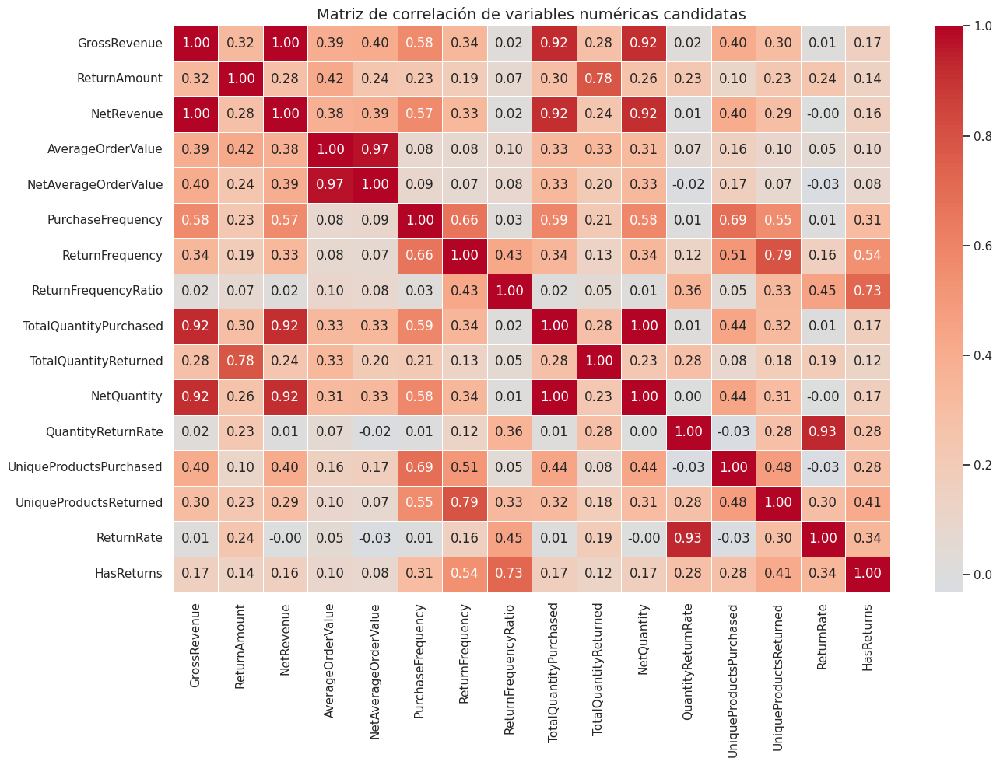

Pares de variables con correlación absoluta >= 0.85:


,Variable_1,Variable_2,Correlacion
6,TotalQuantityPurchased,NetQuantity,1.00
0,GrossRevenue,NetRevenue,1.00
5,AverageOrderValue,NetAverageOrderValue,0.97
7,QuantityReturnRate,ReturnRate,0.93
1,GrossRevenue,TotalQuantityPurchased,0.92
3,NetRevenue,TotalQuantityPurchased,0.92
4,NetRevenue,NetQuantity,0.92
2,GrossRevenue,NetQuantity,0.92


In [25]:
# ============================================================
# CELDA 17 — MATRIZ DE CORRELACIÓN DE VARIABLES NUMÉRICAS
# ============================================================

# ------------------------------------------------------------
# 1. Calcular matriz de correlación
# ------------------------------------------------------------
correlacion = clientes_eda.corr(method="pearson")

print("Matriz de correlación:")
display(correlacion)

# ------------------------------------------------------------
# 2. Visualizar matriz de correlación
# ------------------------------------------------------------
plt.figure(figsize=(14, 10))

sns.heatmap(
    correlacion,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title("Matriz de correlación de variables numéricas candidatas")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. Identificar pares de variables altamente correlacionadas
# ------------------------------------------------------------
umbral_correlacion = 0.85

pares_correlacion = []

for i in range(len(correlacion.columns)):
    for j in range(i + 1, len(correlacion.columns)):
        var_1 = correlacion.columns[i]
        var_2 = correlacion.columns[j]
        valor_corr = correlacion.iloc[i, j]

        if abs(valor_corr) >= umbral_correlacion:
            pares_correlacion.append({
                "Variable_1": var_1,
                "Variable_2": var_2,
                "Correlacion": valor_corr
            })

pares_correlacion_df = pd.DataFrame(pares_correlacion).sort_values(
    by="Correlacion",
    key=abs,
    ascending=False
)

print(f"Pares de variables con correlación absoluta >= {umbral_correlacion}:")
display(pares_correlacion_df)

Celda 17

Se calculó la matriz de correlación de las variables numéricas candidatas con el objetivo de identificar relaciones lineales fuertes y posibles redundancias antes del entrenamiento de los modelos de clustering.

El análisis mostró una correlación prácticamente perfecta entre GrossRevenue y NetRevenue, así como entre TotalQuantityPurchased y NetQuantity. Esto se debe a que la mayoría de clientes no presenta devoluciones o las devoluciones tienen un peso reducido respecto al volumen total comprado. Por tanto, el valor neto y la cantidad neta mantienen una relación muy elevada con sus equivalentes brutos.

También se observó una correlación alta entre AverageOrderValue y NetAverageOrderValue, con un valor aproximado de 0,97, y entre QuantityReturnRate y ReturnRate, con un valor aproximado de 0,93. Estas relaciones indican que algunas variables explican dimensiones muy similares del comportamiento del cliente.

Aunque la correlación no invalida el uso de estas variables, sí puede afectar al clustering, ya que los algoritmos basados en distancia pueden dar mayor peso a dimensiones repetidas. Por este motivo, la matriz de correlación se utilizará como criterio para seleccionar un conjunto final de variables más equilibrado, evitando incluir métricas que aporten información prácticamente duplicada.

Resumen de pares detectados por umbral:


,Umbral,Numero_pares_detectados
0,0.85,8
1,0.80,8
2,0.79,8
3,0.75,10



Pares detectados por cada umbral:


,Umbral,Variable_1,Variable_2,Correlacion,Correlacion_abs
6,0.85,TotalQuantityPurchased,NetQuantity,1.00,1.00
0,0.85,GrossRevenue,NetRevenue,1.00,1.00
5,0.85,AverageOrderValue,NetAverageOrderValue,0.97,0.97
7,0.85,QuantityReturnRate,ReturnRate,0.93,0.93
1,0.85,GrossRevenue,TotalQuantityPurchased,0.92,0.92
3,0.85,NetRevenue,TotalQuantityPurchased,0.92,0.92
4,0.85,NetRevenue,NetQuantity,0.92,0.92
2,0.85,GrossRevenue,NetQuantity,0.92,0.92
14,0.80,TotalQuantityPurchased,NetQuantity,1.00,1.00
8,0.80,GrossRevenue,NetRevenue,1.00,1.00


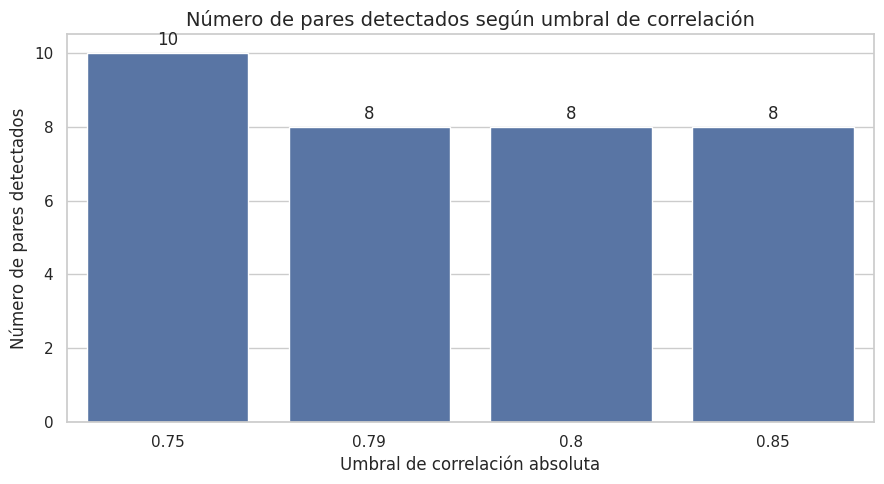

In [26]:
# ============================================================
# CELDA 18.1 — COMPARACIÓN DE UMBRALES DE CORRELACIÓN
# ============================================================

# ------------------------------------------------------------
# 1. Definir umbrales a comparar
# ------------------------------------------------------------
umbrales = [0.85, 0.80, 0.79, 0.75]

resultados_umbrales = []
pares_por_umbral = []

# ------------------------------------------------------------
# 2. Calcular pares para cada umbral
# ------------------------------------------------------------
for umbral in umbrales:
    pares = []

    for i in range(len(correlacion.columns)):
        for j in range(i + 1, len(correlacion.columns)):
            var_1 = correlacion.columns[i]
            var_2 = correlacion.columns[j]
            valor_corr = correlacion.iloc[i, j]

            if abs(valor_corr) >= umbral:
                pares.append({
                    "Umbral": umbral,
                    "Variable_1": var_1,
                    "Variable_2": var_2,
                    "Correlacion": round(valor_corr, 4),
                    "Correlacion_abs": round(abs(valor_corr), 4)
                })

    resultados_umbrales.append({
        "Umbral": umbral,
        "Numero_pares_detectados": len(pares)
    })

    pares_por_umbral.extend(pares)

# ------------------------------------------------------------
# 3. Crear dataframes de resultados
# ------------------------------------------------------------
resumen_umbrales = pd.DataFrame(resultados_umbrales)

pares_por_umbral_df = pd.DataFrame(pares_por_umbral)

if not pares_por_umbral_df.empty:
    pares_por_umbral_df = pares_por_umbral_df.sort_values(
        by=["Umbral", "Correlacion_abs"],
        ascending=[False, False]
    )

# ------------------------------------------------------------
# 4. Mostrar resultados
# ------------------------------------------------------------
print("Resumen de pares detectados por umbral:")
display(resumen_umbrales)

print("\nPares detectados por cada umbral:")
display(pares_por_umbral_df)

# ------------------------------------------------------------
# 5. Visualización
# ------------------------------------------------------------
plt.figure(figsize=(9, 5))

ax = sns.barplot(
    data=resumen_umbrales,
    x="Umbral",
    y="Numero_pares_detectados"
)

plt.title("Número de pares detectados según umbral de correlación")
plt.xlabel("Umbral de correlación absoluta")
plt.ylabel("Número de pares detectados")

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()

Celda 18.1

Para reforzar la selección de variables, se compararon distintos umbrales de correlación absoluta: 0,85, 0,80, 0,79 y 0,75. El objetivo fue comprobar si las relaciones detectadas se mantenían estables al variar el nivel de exigencia.

Los resultados mostraron que con los umbrales 0,85, 0,80 y 0,79 se detectaron los mismos 8 pares de variables altamente correlacionadas. Al reducir el umbral a 0,75, el número de pares aumentó a 10. Esto indica que las redundancias más fuertes son estables y no dependen de un umbral excesivamente restrictivo.

A partir de esta comparación, se decidió utilizar 0,85 como umbral principal para documentar relaciones de alta redundancia. Este valor permite identificar asociaciones muy fuertes sin eliminar variables que puedan aportar información de negocio diferenciada.

Las principales redundancias detectadas fueron las relaciones entre GrossRevenue y NetRevenue, TotalQuantityPurchased y NetQuantity, AverageOrderValue y NetAverageOrderValue, y QuantityReturnRate y ReturnRate. Por este motivo, en la selección final se priorizarán variables netas y ratios económicos, alineados con el objetivo del análisis: segmentar clientes según valor real y comportamiento de devolución.

Variables preliminares para clustering:
['NetRevenue', 'NetAverageOrderValue', 'PurchaseFrequency', 'UniqueProductsPurchased', 'ReturnRate', 'ReturnFrequencyRatio', 'HasReturns']

Dimensiones X_preliminar: (4331, 7)

Nulos por variable:


,Nulos
NetRevenue,0
NetAverageOrderValue,0
PurchaseFrequency,0
UniqueProductsPurchased,0
ReturnRate,0
ReturnFrequencyRatio,0
HasReturns,0



Resumen estadístico de variables seleccionadas:


,count,mean,std,min,25%,50%,75%,max
NetRevenue,"4,331.00","1,909.11","8,293.77",0.00,297.42,646.92,"1,603.15","278,778.02"
NetAverageOrderValue,"4,331.00",370.51,515.96,0.00,172.43,281.42,419.86,"19,809.75"
PurchaseFrequency,"4,331.00",4.24,7.60,1.00,1.00,2.00,5.00,204.00
UniqueProductsPurchased,"4,331.00",61.42,85.29,1.00,16.00,35.00,77.00,"1,785.00"
ReturnRate,"4,331.00",0.02,0.07,0.00,0.00,0.00,0.01,1.00
ReturnFrequencyRatio,"4,331.00",0.16,0.31,0.00,0.00,0.00,0.21,3.00
HasReturns,"4,331.00",0.34,0.47,0.00,0.00,0.00,1.00,1.00


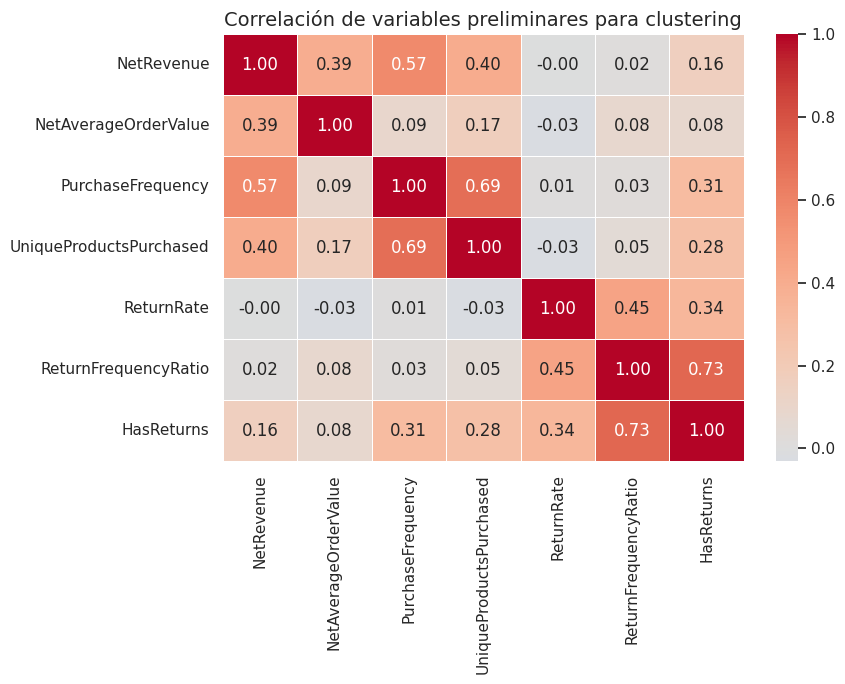

In [27]:
# ============================================================
# CELDA 19 — SELECCIÓN PRELIMINAR DE VARIABLES PARA CLUSTERING
# ============================================================

# ------------------------------------------------------------
# 1. Definir variables preliminares para clustering
# ------------------------------------------------------------
variables_clustering_preliminares = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

# ------------------------------------------------------------
# 2. Crear dataset preliminar para clustering
# ------------------------------------------------------------
X_preliminar = clientes_modelo_final[variables_clustering_preliminares].copy()

# ------------------------------------------------------------
# 3. Validaciones
# ------------------------------------------------------------
print("Variables preliminares para clustering:")
print(variables_clustering_preliminares)

print("\nDimensiones X_preliminar:", X_preliminar.shape)

print("\nNulos por variable:")
display(X_preliminar.isnull().sum().to_frame(name="Nulos"))

print("\nResumen estadístico de variables seleccionadas:")
display(X_preliminar.describe().T)

# ------------------------------------------------------------
# 4. Matriz de correlación de variables seleccionadas
# ------------------------------------------------------------
corr_preliminar = X_preliminar.corr()

plt.figure(figsize=(9, 7))

sns.heatmap(
    corr_preliminar,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title("Correlación de variables preliminares para clustering")
plt.tight_layout()
plt.show()

Celda 19

A partir del análisis de correlación se definió una selección preliminar de variables para clustering. La selección incluyó siete métricas orientadas a capturar distintas dimensiones del comportamiento del cliente: valor neto, ticket medio neto, frecuencia de compra, variedad de productos, tasa económica de devolución, frecuencia relativa de devolución y presencia de devoluciones.

El dataset preliminar, denominado X_preliminar, quedó compuesto por 4.331 clientes y 7 variables. No se detectaron valores nulos, lo que confirma que las variables seleccionadas están listas para las siguientes fases de análisis.

La matriz de correlación de esta selección mostró una reducción clara de las redundancias detectadas previamente. No aparecieron correlaciones críticas superiores a 0,85. La relación más elevada fue entre ReturnFrequencyRatio y HasReturns, con una correlación de 0,73, seguida de PurchaseFrequency y UniqueProductsPurchased, con una correlación de 0,69.

Estas relaciones son coherentes desde el punto de vista de negocio. Los clientes que compran con mayor frecuencia tienden a adquirir una mayor variedad de productos, y los clientes con devoluciones presentan lógicamente valores superiores en las métricas relativas de devolución. No obstante, se considerará entrenar una variante sin HasReturns, ya que esta variable binaria puede reforzar en exceso la dimensión de devolución frente a variables más informativas como ReturnRate y ReturnFrequencyRatio.

,Configuracion,Numero_variables,Correlacion_maxima_abs,Variables
0,Con HasReturns,7,0.73,"NetRevenue, NetAverageOrderValue, PurchaseFreq..."
1,Sin HasReturns,6,0.69,"NetRevenue, NetAverageOrderValue, PurchaseFreq..."


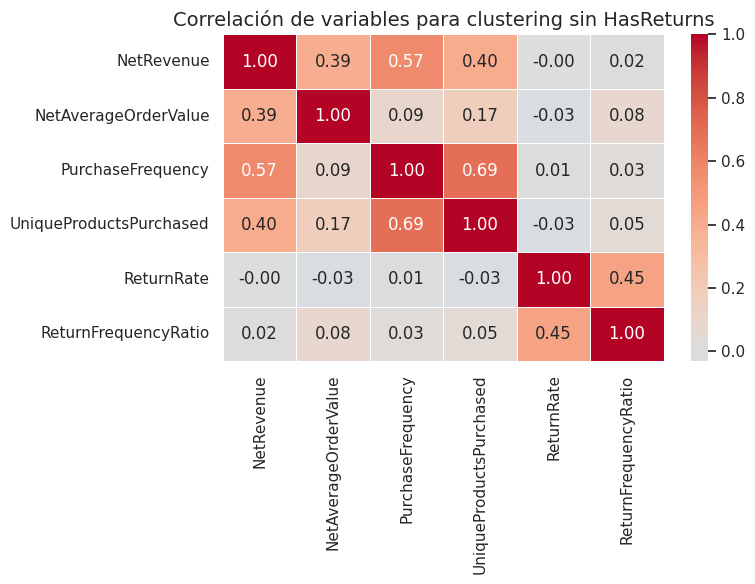

Dataset principal recomendado: X_clustering_base
Variables seleccionadas:
['NetRevenue', 'NetAverageOrderValue', 'PurchaseFrequency', 'UniqueProductsPurchased', 'ReturnRate', 'ReturnFrequencyRatio']
Dimensiones: (4331, 6)


In [28]:
# ============================================================
# CELDA 20 — COMPARACIÓN DE VARIABLES CON Y SIN HasReturns
# ============================================================

# ------------------------------------------------------------
# 1. Definir dos configuraciones de variables
# ------------------------------------------------------------
variables_con_hasreturns = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

variables_sin_hasreturns = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio"
]

# ------------------------------------------------------------
# 2. Crear datasets comparativos
# ------------------------------------------------------------
X_con_hasreturns = clientes_modelo_final[variables_con_hasreturns].copy()
X_sin_hasreturns = clientes_modelo_final[variables_sin_hasreturns].copy()

# ------------------------------------------------------------
# 3. Función para obtener correlación máxima fuera de la diagonal
# ------------------------------------------------------------
def obtener_correlacion_maxima(df):
    corr = df.corr().abs()
    mascara = np.triu(np.ones(corr.shape), k=1).astype(bool)
    corr_pares = corr.where(mascara)
    return corr_pares.max().max()

corr_max_con = obtener_correlacion_maxima(X_con_hasreturns)
corr_max_sin = obtener_correlacion_maxima(X_sin_hasreturns)

# ------------------------------------------------------------
# 4. Tabla comparativa
# ------------------------------------------------------------
comparativa_variables = pd.DataFrame({
    "Configuracion": [
        "Con HasReturns",
        "Sin HasReturns"
    ],
    "Numero_variables": [
        len(variables_con_hasreturns),
        len(variables_sin_hasreturns)
    ],
    "Correlacion_maxima_abs": [
        round(corr_max_con, 4),
        round(corr_max_sin, 4)
    ],
    "Variables": [
        ", ".join(variables_con_hasreturns),
        ", ".join(variables_sin_hasreturns)
    ]
})

display(comparativa_variables)

# ------------------------------------------------------------
# 5. Matriz de correlación sin HasReturns
# ------------------------------------------------------------
corr_sin_hasreturns = X_sin_hasreturns.corr()

plt.figure(figsize=(8, 6))

sns.heatmap(
    corr_sin_hasreturns,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5
)

plt.title("Correlación de variables para clustering sin HasReturns")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Definir dataset principal recomendado
# ------------------------------------------------------------
X_clustering_base = X_sin_hasreturns.copy()
variables_clustering_finales_base = variables_sin_hasreturns.copy()

print("Dataset principal recomendado: X_clustering_base")
print("Variables seleccionadas:")
print(variables_clustering_finales_base)
print("Dimensiones:", X_clustering_base.shape)

Celda 20

Se compararon dos configuraciones de variables para el clustering: una incluyendo la variable binaria HasReturns y otra excluyéndola. La configuración con HasReturns contenía 7 variables y presentaba una correlación máxima absoluta de 0,73. La configuración sin HasReturns contenía 6 variables y reducía la correlación máxima absoluta a 0,69.

Aunque ambas configuraciones eran válidas, se decidió utilizar como base principal la versión sin HasReturns. Esta decisión se justifica porque HasReturns únicamente indica si el cliente ha realizado alguna devolución, mientras que ReturnRate y ReturnFrequencyRatio ofrecen información más detallada sobre la intensidad económica y relativa de las devoluciones.

De este modo, la variable HasReturns se conserva como variable auxiliar para interpretar los clusters, pero no se utiliza directamente en el entrenamiento. La selección final preliminar para clustering queda compuesta por NetRevenue, NetAverageOrderValue, PurchaseFrequency, UniqueProductsPurchased, ReturnRate y ReturnFrequencyRatio.

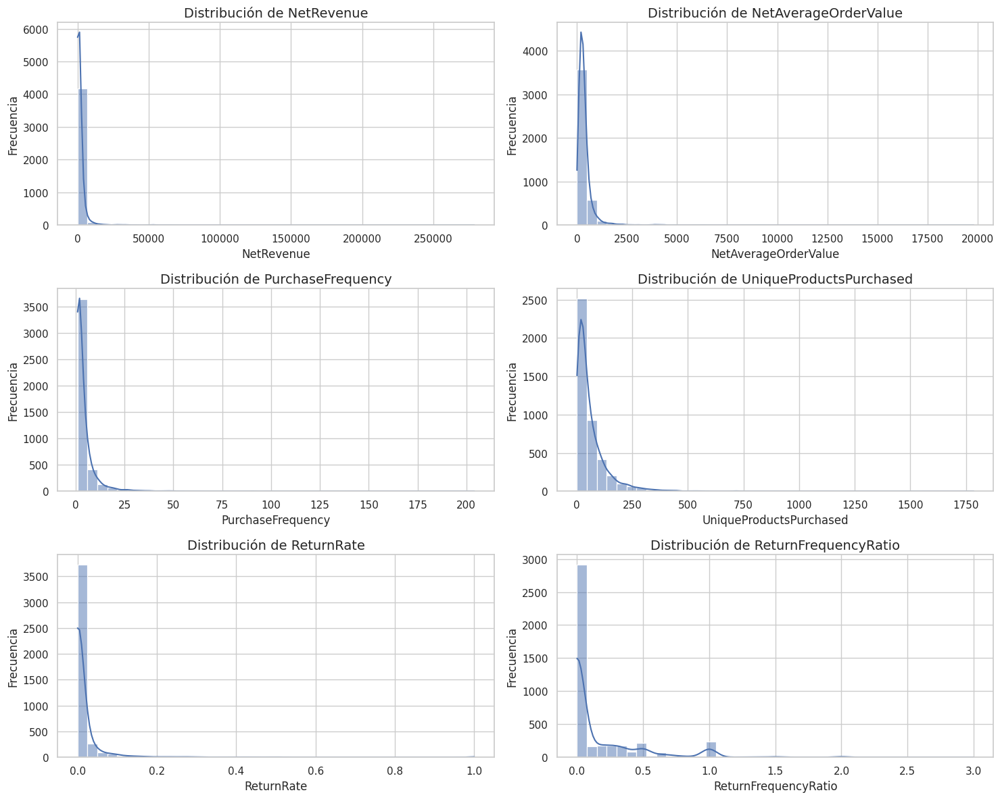

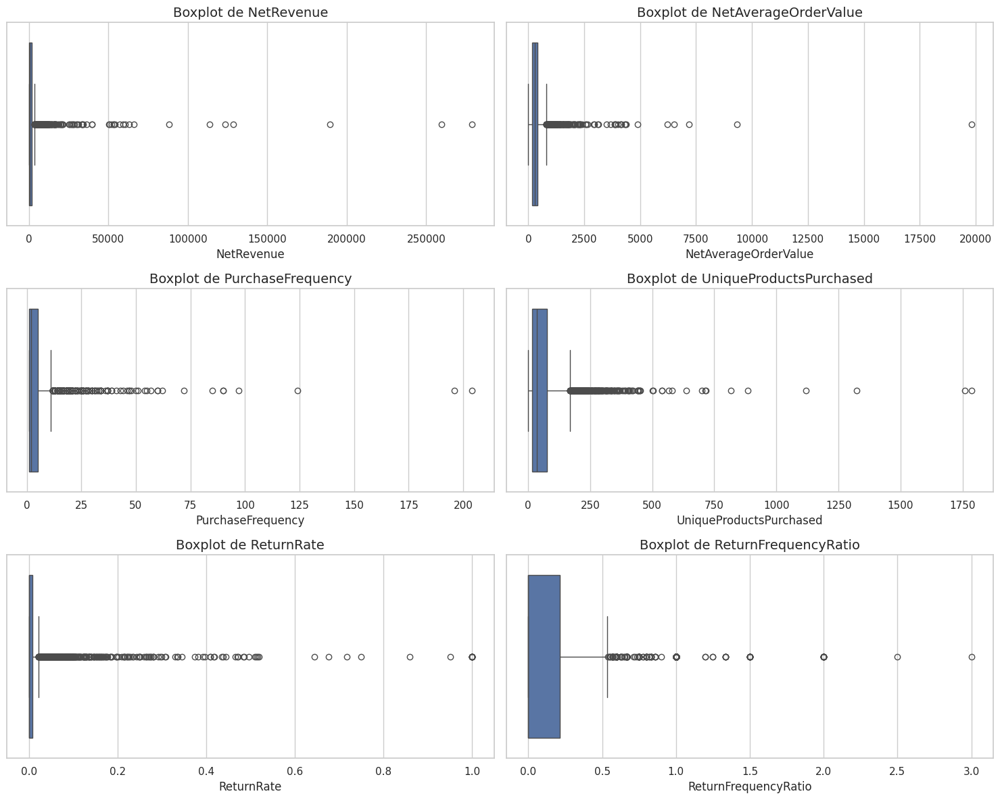

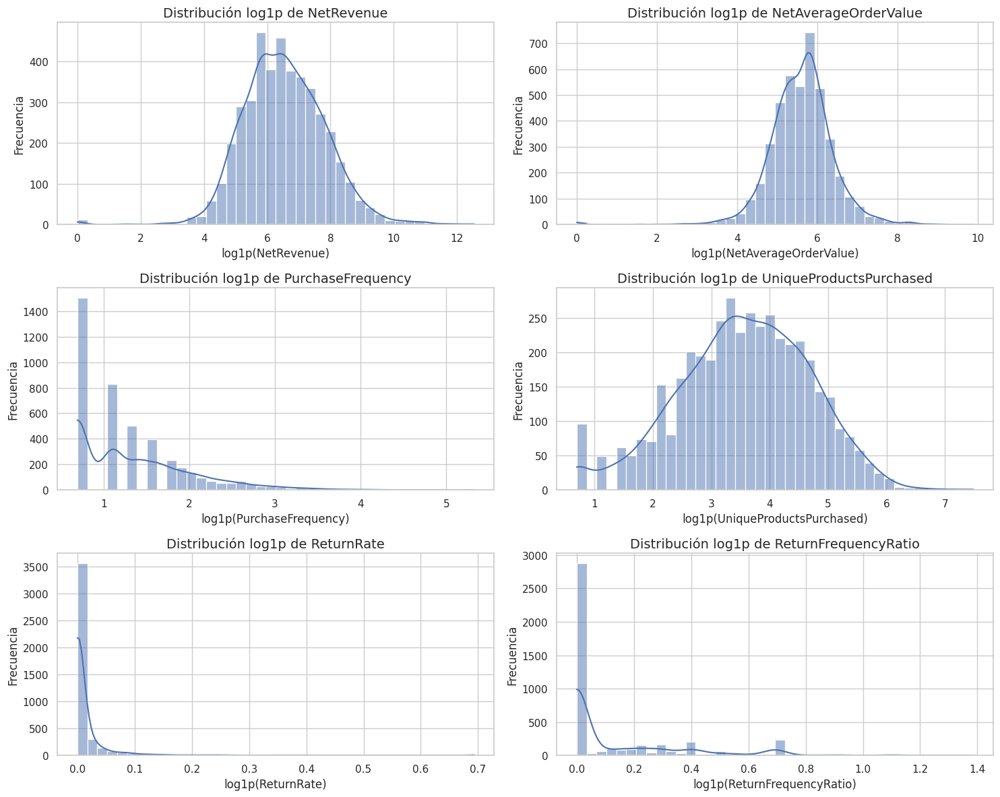

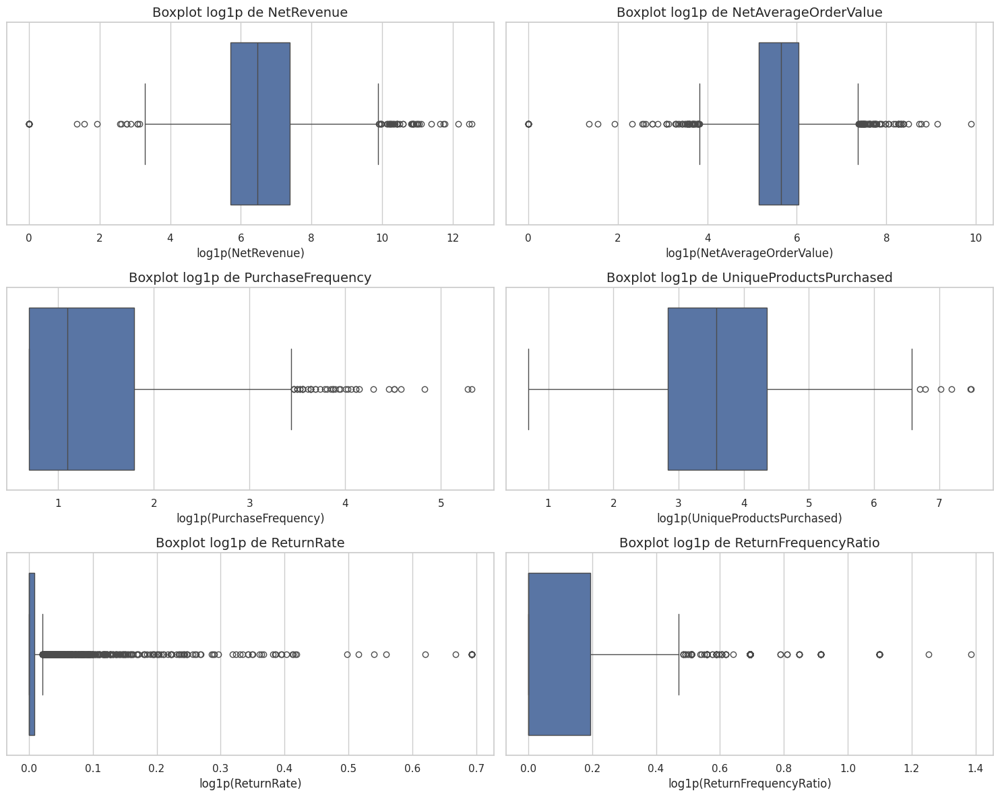

Comparativa de asimetría antes y después de log1p:


,Variable,Skew_original,Skew_log1p,Reduccion_abs_skew
0,NetRevenue,21.57,0.01,21.56
1,NetAverageOrderValue,16.63,-0.88,15.75
2,PurchaseFrequency,11.86,1.22,10.64
4,ReturnRate,9.15,7.60,1.55
3,UniqueProductsPurchased,6.90,-0.25,6.66
5,ReturnFrequencyRatio,2.61,1.90,0.71


In [29]:
# ============================================================
# CELDA 21 — DISTRIBUCIONES AGRUPADAS DE VARIABLES SELECCIONADAS
# ============================================================

# ------------------------------------------------------------
# 1. Variables seleccionadas para análisis visual
# ------------------------------------------------------------
variables_visualizacion = X_clustering_base.columns.tolist()

# ------------------------------------------------------------
# 2. Histogramas agrupados
# ------------------------------------------------------------
n_vars = len(variables_visualizacion)
n_cols = 2
n_rows = int(np.ceil(n_vars / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, columna in enumerate(variables_visualizacion):
    sns.histplot(
        X_clustering_base[columna],
        kde=True,
        bins=40,
        ax=axes[i]
    )
    axes[i].set_title(f"Distribución de {columna}")
    axes[i].set_xlabel(columna)
    axes[i].set_ylabel("Frecuencia")

# Eliminar ejes vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. Boxplots agrupados en escala original
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, columna in enumerate(variables_visualizacion):
    sns.boxplot(
        x=X_clustering_base[columna],
        ax=axes[i]
    )
    axes[i].set_title(f"Boxplot de {columna}")
    axes[i].set_xlabel(columna)

# Eliminar ejes vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4. Transformación log1p para revisar asimetría
# ------------------------------------------------------------
X_log_visual = X_clustering_base.copy()

for columna in variables_visualizacion:
    X_log_visual[columna] = np.log1p(X_log_visual[columna])

# ------------------------------------------------------------
# 5. Histogramas agrupados tras log1p
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, columna in enumerate(variables_visualizacion):
    sns.histplot(
        X_log_visual[columna],
        kde=True,
        bins=40,
        ax=axes[i]
    )
    axes[i].set_title(f"Distribución log1p de {columna}")
    axes[i].set_xlabel(f"log1p({columna})")
    axes[i].set_ylabel("Frecuencia")

# Eliminar ejes vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Boxplots agrupados tras log1p
# ------------------------------------------------------------
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4 * n_rows))
axes = axes.flatten()

for i, columna in enumerate(variables_visualizacion):
    sns.boxplot(
        x=X_log_visual[columna],
        ax=axes[i]
    )
    axes[i].set_title(f"Boxplot log1p de {columna}")
    axes[i].set_xlabel(f"log1p({columna})")

# Eliminar ejes vacíos si los hubiera
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Comparativa de asimetría antes y después de log1p
# ------------------------------------------------------------
comparativa_asimetria = pd.DataFrame({
    "Variable": variables_visualizacion,
    "Skew_original": [X_clustering_base[col].skew() for col in variables_visualizacion],
    "Skew_log1p": [X_log_visual[col].skew() for col in variables_visualizacion]
})

comparativa_asimetria["Reduccion_abs_skew"] = (
    comparativa_asimetria["Skew_original"].abs() -
    comparativa_asimetria["Skew_log1p"].abs()
)

print("Comparativa de asimetría antes y después de log1p:")
display(comparativa_asimetria.sort_values(by="Skew_original", ascending=False))

Celda 21

Se analizaron las distribuciones de las variables seleccionadas para clustering mediante histogramas y diagramas de caja, tanto en escala original como tras aplicar transformación logarítmica log1p. El objetivo fue evaluar la presencia de asimetría y valores extremos antes de entrenar modelos basados en distancia.

En escala original, las variables presentaron una fuerte asimetría positiva. Las métricas NetRevenue, NetAverageOrderValue, PurchaseFrequency y UniqueProductsPurchased concentraban la mayoría de observaciones en valores bajos o moderados, pero mostraban una cola derecha larga asociada a clientes de alto valor o comportamiento mayorista. Los boxplots confirmaron la presencia de numerosos valores atípicos.

No obstante, estos valores extremos no se eliminaron automáticamente, ya que pueden representar clientes reales de alto valor dentro del negocio. En lugar de excluirlos, se optó por aplicar una transformación que redujera su impacto en los algoritmos de clustering.

La transformación log1p redujo de forma significativa la asimetría de varias variables. En NetRevenue, el coeficiente de asimetría pasó de 21,57 a 0,01. En NetAverageOrderValue, pasó de 16,63 a -0,88. En PurchaseFrequency, se redujo de 11,86 a 1,22, y en UniqueProductsPurchased, de 6,90 a -0,25. Estos resultados justifican el uso de transformación logarítmica antes del escalado y entrenamiento de modelos.

En las variables de devolución, como ReturnRate y ReturnFrequencyRatio, la reducción de asimetría fue menor debido a la elevada concentración de valores en cero. Aun así, estas variables se mantuvieron por su valor interpretativo, ya que permiten diferenciar clientes sin devoluciones, clientes con devoluciones bajas y clientes con mayor fricción comercial.

In [30]:
# ============================================================
# CELDA 22 — TRANSFORMACIÓN LOG1P Y ESCALADO
# ============================================================

# ------------------------------------------------------------
# 1. Transformación log1p sobre variables seleccionadas
# ------------------------------------------------------------
X_clustering_log = X_clustering_base.copy()

for columna in X_clustering_log.columns:
    X_clustering_log[columna] = np.log1p(X_clustering_log[columna])

# ------------------------------------------------------------
# 2. Escalado con StandardScaler
# ------------------------------------------------------------
scaler_standard = StandardScaler()
X_scaled_standard_array = scaler_standard.fit_transform(X_clustering_log)

X_scaled_standard = pd.DataFrame(
    X_scaled_standard_array,
    columns=X_clustering_log.columns,
    index=X_clustering_log.index
)

# ------------------------------------------------------------
# 3. Escalado con RobustScaler
# ------------------------------------------------------------
scaler_robust = RobustScaler()
X_scaled_robust_array = scaler_robust.fit_transform(X_clustering_log)

X_scaled_robust = pd.DataFrame(
    X_scaled_robust_array,
    columns=X_clustering_log.columns,
    index=X_clustering_log.index
)

# ------------------------------------------------------------
# 4. Validaciones de salida
# ------------------------------------------------------------
print("Dimensiones X_clustering_base:", X_clustering_base.shape)
print("Dimensiones X_clustering_log:", X_clustering_log.shape)
print("Dimensiones X_scaled_standard:", X_scaled_standard.shape)
print("Dimensiones X_scaled_robust:", X_scaled_robust.shape)

print("\nResumen X_clustering_log:")
display(X_clustering_log.describe().T)

print("\nResumen X_scaled_standard:")
display(X_scaled_standard.describe().T)

print("\nResumen X_scaled_robust:")
display(X_scaled_robust.describe().T)

# ------------------------------------------------------------
# 5. Comprobación de nulos
# ------------------------------------------------------------
print("\nNulos en X_clustering_log:", X_clustering_log.isnull().sum().sum())
print("Nulos en X_scaled_standard:", X_scaled_standard.isnull().sum().sum())
print("Nulos en X_scaled_robust:", X_scaled_robust.isnull().sum().sum())

Dimensiones X_clustering_base: (4331, 6)
Dimensiones X_clustering_log: (4331, 6)
Dimensiones X_scaled_standard: (4331, 6)
Dimensiones X_scaled_robust: (4331, 6)

Resumen X_clustering_log:


,count,mean,std,min,25%,50%,75%,max
NetRevenue,"4,331.00",6.54,1.29,0.00,5.70,6.47,7.38,12.54
NetAverageOrderValue,"4,331.00",5.60,0.79,0.00,5.16,5.64,6.04,9.89
PurchaseFrequency,"4,331.00",1.34,0.68,0.69,0.69,1.10,1.79,5.32
UniqueProductsPurchased,"4,331.00",3.55,1.13,0.69,2.83,3.58,4.36,7.49
ReturnRate,"4,331.00",0.02,0.06,0.00,0.00,0.00,0.01,0.69
ReturnFrequencyRatio,"4,331.00",0.12,0.22,0.00,0.00,0.00,0.19,1.39



Resumen X_scaled_standard:


,count,mean,std,min,25%,50%,75%,max
NetRevenue,"4,331.00",-0.00,1.00,-5.05,-0.65,-0.05,0.65,4.64
NetAverageOrderValue,"4,331.00",-0.00,1.00,-7.09,-0.56,0.05,0.56,5.43
PurchaseFrequency,"4,331.00",0.00,1.00,-0.95,-0.95,-0.36,0.66,5.85
UniqueProductsPurchased,"4,331.00",-0.00,1.00,-2.52,-0.63,0.03,0.71,3.48
ReturnRate,"4,331.00",-0.00,1.00,-0.28,-0.28,-0.28,-0.13,11.75
ReturnFrequencyRatio,"4,331.00",0.00,1.00,-0.57,-0.57,-0.57,0.33,5.84



Resumen X_scaled_robust:


,count,mean,std,min,25%,50%,75%,max
NetRevenue,"4,331.00",0.04,0.77,-3.85,-0.46,0.00,0.54,3.61
NetAverageOrderValue,"4,331.00",-0.05,0.89,-6.37,-0.55,0.00,0.45,4.79
PurchaseFrequency,"4,331.00",0.22,0.62,-0.37,-0.37,0.00,0.63,3.85
UniqueProductsPurchased,"4,331.00",-0.02,0.74,-1.90,-0.49,0.00,0.51,2.56
ReturnRate,"4,331.00",1.91,6.85,0.00,0.00,0.00,1.00,82.45
ReturnFrequencyRatio,"4,331.00",0.63,1.11,0.00,0.00,0.00,1.00,7.14



Nulos en X_clustering_log: 0
Nulos en X_scaled_standard: 0
Nulos en X_scaled_robust: 0


Celda 22

Tras confirmar la fuerte asimetría de las variables seleccionadas, se generó una versión transformada mediante log1p. Esta transformación redujo el efecto de los valores extremos y permitió trabajar con rangos más manejables sin alterar el orden relativo de los clientes.

Posteriormente, se aplicaron dos técnicas de escalado: StandardScaler y RobustScaler. El escalado es imprescindible antes de aplicar algoritmos de clustering basados en distancia, ya que evita que variables con rangos mayores dominen el cálculo de similitud entre clientes.

La versión transformada mantuvo las 4.331 observaciones y las 6 variables seleccionadas, sin generar valores nulos. En el caso de StandardScaler, las variables quedaron centradas con media próxima a cero y desviación típica igual a uno, lo que resulta adecuado para modelos como K-Means y para técnicas de reducción dimensional como PCA.

También se probó RobustScaler, más resistente a valores extremos al utilizar la mediana y el rango intercuartílico. No obstante, se observó que en variables con elevada concentración en cero, como ReturnRate, este escalado podía generar valores máximos muy elevados. Por este motivo, se decidió utilizar como configuración principal log1p combinado con StandardScaler, manteniendo RobustScaler como alternativa comparativa.

Dimensiones dataset usado en reducción dimensional: (4331, 6)
Variables utilizadas:
['NetRevenue', 'NetAverageOrderValue', 'PurchaseFrequency', 'UniqueProductsPurchased', 'ReturnRate', 'ReturnFrequencyRatio']

VARIANZA EXPLICADA PCA 2D
PC1: 46.62 %
PC2: 25.72 %
Total: 72.34 %


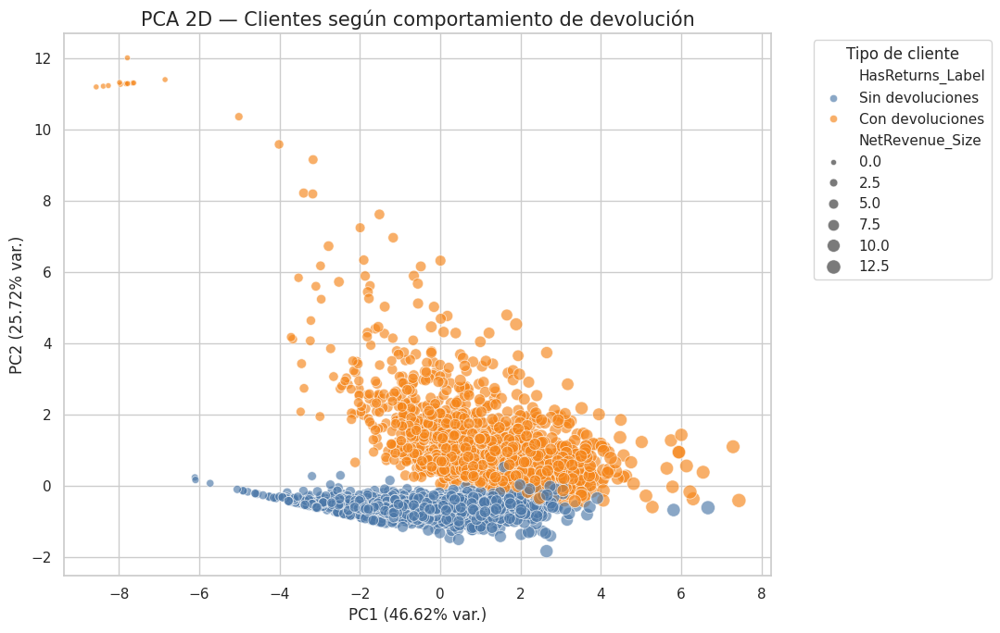

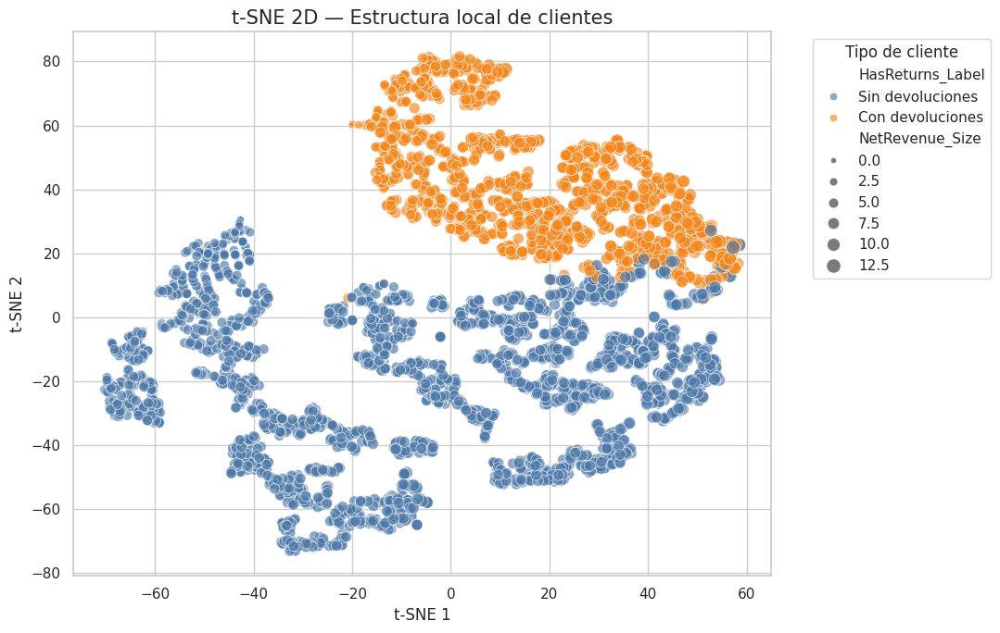

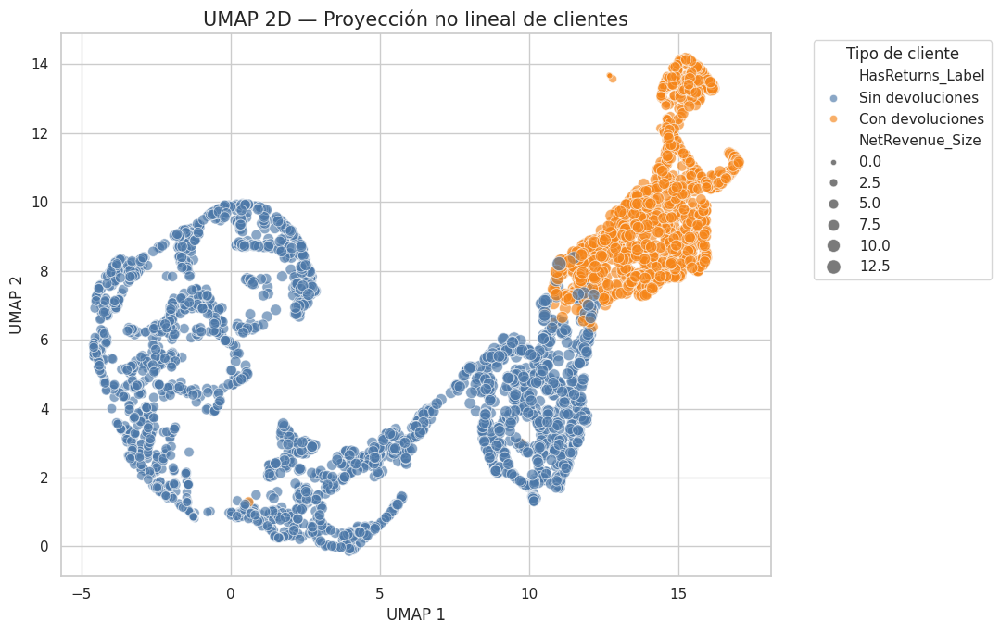

In [31]:
# ============================================================
# CELDA 23 — VISUALIZACIÓN AVANZADA CON PCA, t-SNE Y UMAP
# ============================================================

# ------------------------------------------------------------
# 0. Instalación de UMAP si fuera necesario
# ------------------------------------------------------------
!pip install -q umap-learn

from sklearn.manifold import TSNE
import umap.umap_ as umap

# ------------------------------------------------------------
# 1. Dataset base para reducción dimensional
# ------------------------------------------------------------
X_reduccion = X_scaled_standard.copy()

# Información auxiliar para visualización
visual_info = clientes_modelo_final.loc[X_reduccion.index, [
    "CustomerID",
    "NetRevenue",
    "ReturnRate",
    "PurchaseFrequency",
    "HasReturns"
]].copy()

visual_info["HasReturns_Label"] = visual_info["HasReturns"].map({
    0: "Sin devoluciones",
    1: "Con devoluciones"
})

# Tamaño visual controlado para evitar puntos desproporcionados
visual_info["NetRevenue_Size"] = np.log1p(visual_info["NetRevenue"])

print("Dimensiones dataset usado en reducción dimensional:", X_reduccion.shape)
print("Variables utilizadas:")
print(X_reduccion.columns.tolist())

# ------------------------------------------------------------
# 2. PCA 2D
# ------------------------------------------------------------
pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X_reduccion)

pca_2d_df = pd.DataFrame(
    X_pca_2d,
    columns=["PC1", "PC2"],
    index=X_reduccion.index
)

pca_2d_df = pd.concat([pca_2d_df, visual_info], axis=1)

var_pca_2d = pca_2d.explained_variance_ratio_

print("\nVARIANZA EXPLICADA PCA 2D")
print("PC1:", round(var_pca_2d[0] * 100, 2), "%")
print("PC2:", round(var_pca_2d[1] * 100, 2), "%")
print("Total:", round(var_pca_2d.sum() * 100, 2), "%")

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_2d_df,
    x="PC1",
    y="PC2",
    hue="HasReturns_Label",
    size="NetRevenue_Size",
    sizes=(20, 120),
    alpha=0.65,
    palette={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    }
)

plt.title("PCA 2D — Clientes según comportamiento de devolución", fontsize=15)
plt.xlabel(f"PC1 ({var_pca_2d[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_2d[1] * 100:.2f}% var.)")
plt.legend(title="Tipo de cliente", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. PCA 3D interactivo
# ------------------------------------------------------------
pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(X_reduccion)

pca_3d_df = pd.DataFrame(
    X_pca_3d,
    columns=["PC1", "PC2", "PC3"],
    index=X_reduccion.index
)

pca_3d_df = pd.concat([pca_3d_df, visual_info], axis=1)

var_pca_3d = pca_3d.explained_variance_ratio_

fig_pca_3d = px.scatter_3d(
    pca_3d_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color="HasReturns_Label",
    size="NetRevenue_Size",
    opacity=0.65,
    color_discrete_map={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    },
    hover_data={
        "CustomerID": True,
        "NetRevenue": ":.2f",
        "ReturnRate": ":.4f",
        "PurchaseFrequency": True,
        "NetRevenue_Size": False
    },
    title=(
        "PCA 3D interactivo — "
        f"Varianza total: {var_pca_3d.sum() * 100:.2f}%"
    )
)

fig_pca_3d.update_layout(
    width=950,
    height=700,
    legend_title_text="Tipo de cliente"
)

fig_pca_3d.show()

# ------------------------------------------------------------
# 4. t-SNE 2D
# ------------------------------------------------------------
tsne_2d = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42
)

X_tsne_2d = tsne_2d.fit_transform(X_reduccion)

tsne_2d_df = pd.DataFrame(
    X_tsne_2d,
    columns=["TSNE1", "TSNE2"],
    index=X_reduccion.index
)

tsne_2d_df = pd.concat([tsne_2d_df, visual_info], axis=1)

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=tsne_2d_df,
    x="TSNE1",
    y="TSNE2",
    hue="HasReturns_Label",
    size="NetRevenue_Size",
    sizes=(20, 120),
    alpha=0.65,
    palette={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    }
)

plt.title("t-SNE 2D — Estructura local de clientes", fontsize=15)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(title="Tipo de cliente", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. t-SNE 3D interactivo
# ------------------------------------------------------------
tsne_3d = TSNE(
    n_components=3,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42
)

X_tsne_3d = tsne_3d.fit_transform(X_reduccion)

tsne_3d_df = pd.DataFrame(
    X_tsne_3d,
    columns=["TSNE1", "TSNE2", "TSNE3"],
    index=X_reduccion.index
)

tsne_3d_df = pd.concat([tsne_3d_df, visual_info], axis=1)

fig_tsne_3d = px.scatter_3d(
    tsne_3d_df,
    x="TSNE1",
    y="TSNE2",
    z="TSNE3",
    color="HasReturns_Label",
    size="NetRevenue_Size",
    opacity=0.65,
    color_discrete_map={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    },
    hover_data={
        "CustomerID": True,
        "NetRevenue": ":.2f",
        "ReturnRate": ":.4f",
        "PurchaseFrequency": True,
        "NetRevenue_Size": False
    },
    title="t-SNE 3D interactivo — Estructura local de clientes"
)

fig_tsne_3d.update_layout(
    width=950,
    height=700,
    legend_title_text="Tipo de cliente"
)

fig_tsne_3d.show()

# ------------------------------------------------------------
# 6. UMAP 2D
# ------------------------------------------------------------
umap_2d = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    min_dist=0.10,
    metric="euclidean",
    random_state=42
)

X_umap_2d = umap_2d.fit_transform(X_reduccion)

umap_2d_df = pd.DataFrame(
    X_umap_2d,
    columns=["UMAP1", "UMAP2"],
    index=X_reduccion.index
)

umap_2d_df = pd.concat([umap_2d_df, visual_info], axis=1)

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=umap_2d_df,
    x="UMAP1",
    y="UMAP2",
    hue="HasReturns_Label",
    size="NetRevenue_Size",
    sizes=(20, 120),
    alpha=0.65,
    palette={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    }
)

plt.title("UMAP 2D — Proyección no lineal de clientes", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.legend(title="Tipo de cliente", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. UMAP 3D interactivo
# ------------------------------------------------------------
umap_3d = umap.UMAP(
    n_components=3,
    n_neighbors=30,
    min_dist=0.10,
    metric="euclidean",
    random_state=42
)

X_umap_3d = umap_3d.fit_transform(X_reduccion)

umap_3d_df = pd.DataFrame(
    X_umap_3d,
    columns=["UMAP1", "UMAP2", "UMAP3"],
    index=X_reduccion.index
)

umap_3d_df = pd.concat([umap_3d_df, visual_info], axis=1)

fig_umap_3d = px.scatter_3d(
    umap_3d_df,
    x="UMAP1",
    y="UMAP2",
    z="UMAP3",
    color="HasReturns_Label",
    size="NetRevenue_Size",
    opacity=0.65,
    color_discrete_map={
        "Sin devoluciones": "#4C78A8",
        "Con devoluciones": "#F58518"
    },
    hover_data={
        "CustomerID": True,
        "NetRevenue": ":.2f",
        "ReturnRate": ":.4f",
        "PurchaseFrequency": True,
        "NetRevenue_Size": False
    },
    title="UMAP 3D interactivo — Proyección no lineal de clientes"
)

fig_umap_3d.update_layout(
    width=950,
    height=700,
    legend_title_text="Tipo de cliente"
)

fig_umap_3d.show()

Celda 23

Tras transformar y escalar las variables seleccionadas, se aplicaron técnicas de reducción dimensional para visualizar la estructura de los clientes antes del entrenamiento de modelos de clustering. Se utilizaron PCA, t-SNE y UMAP con el objetivo de proyectar el espacio multivariable original en dos y tres dimensiones.

En la proyección PCA 2D, la primera componente principal explicó el 46,62% de la varianza y la segunda componente explicó el 25,72%, alcanzando un total del 72,34% de varianza explicada. Este resultado indica que una parte elevada de la información contenida en las seis variables seleccionadas puede representarse adecuadamente en dos dimensiones. En la proyección PCA 3D, la varianza total explicada ascendió al 86,91%, reforzando la utilidad de la visualización tridimensional.

Las visualizaciones coloreadas por presencia de devoluciones mostraron una separación clara entre clientes con devoluciones y clientes sin devoluciones. En PCA, los clientes sin devoluciones se concentran en una zona más compacta, mientras que los clientes con devoluciones aparecen en una región superior y más dispersa. Esta separación confirma que las variables relacionadas con devoluciones aportan información diferenciadora.

La visualización t-SNE 2D mostró una separación aún más marcada entre ambos grupos, evidenciando que el comportamiento de devolución genera una estructura local relevante en el espacio de clientes. No obstante, estas técnicas se utilizaron únicamente con fines exploratorios y no como criterio único para definir el número final de clusters.

En las fases posteriores, la elección del número de clusters se basará en métricas internas de evaluación y en la interpretación de negocio de los segmentos obtenidos.

Para la evaluación de los modelos de clustering se utilizaron varias métricas internas y criterios complementarios. Dado que el clustering es una técnica no supervisada y no se dispone de etiquetas reales, no existe una métrica única que determine de forma absoluta la mejor segmentación. Por este motivo, se combinaron diferentes indicadores cuantitativos con criterios de interpretabilidad de negocio.

Inicialmente se emplearon métricas clásicas como la inercia, el silhouette score, el índice Calinski-Harabasz y el índice Davies-Bouldin. La inercia permite analizar la compactación interna de los clusters, mientras que silhouette score mide simultáneamente cohesión y separación. Calinski-Harabasz evalúa la relación entre separación intercluster y dispersión intracluster, y Davies-Bouldin penaliza soluciones con clusters poco separados o demasiado dispersos.

Para reforzar la evaluación, se incorporaron métricas adicionales como Dunn Index, Gap Statistic y análisis de estabilidad mediante remuestreo. Dunn Index permite valorar la relación entre distancia mínima entre clusters y diámetro máximo interno, mientras que Gap Statistic compara la estructura encontrada con una distribución aleatoria de referencia. La estabilidad permite comprobar si los clusters se mantienen ante pequeñas variaciones de la muestra.

En los modelos basados en densidad, como DBSCAN y HDBSCAN, también se consideró el número de clusters detectados, el porcentaje de ruido y la distribución de tamaños de cluster. En el caso de HDBSCAN, se valorará además el uso de DBCV, una métrica especialmente diseñada para evaluar clustering basado en densidad.

La selección final del modelo no se basará únicamente en la mejor métrica numérica, sino en una combinación de calidad estadística, estabilidad, equilibrio en los tamaños de cluster e interpretabilidad comercial de los segmentos obtenidos.

Resultados ampliados de evaluación K-Means:


,Modelo,K,Inertia,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Gap_Statistic,Stability_ARI
0,KMeans,2,"18,400.52",0.31,"1,784.62",1.27,0.00,2.06,0.97
1,KMeans,3,"14,513.67",0.35,"1,710.53",1.12,0.00,2.11,0.98
2,KMeans,4,"12,024.70",0.36,"1,674.62",1.01,0.00,2.17,0.99
3,KMeans,5,"10,016.62",0.28,"1,724.24",1.03,0.00,2.27,0.95
4,KMeans,6,"9,042.87",0.26,"1,620.71",1.10,0.01,2.29,0.78
5,KMeans,7,"8,106.23",0.26,"1,589.58",1.03,0.01,2.34,0.98
6,KMeans,8,"7,438.90",0.25,"1,539.78",1.05,0.00,2.38,0.83
7,KMeans,9,"6,877.63",0.25,"1,501.04",1.06,0.00,2.42,0.85
8,KMeans,10,"6,416.12",0.24,"1,464.39",1.11,0.00,2.46,0.95



Resultados con métricas normalizadas:


,K,Inertia_Norm,Silhouette_Norm,Calinski_Harabasz_Norm,Davies_Bouldin_Norm,Dunn_Index_Norm,Gap_Statistic_Norm,Stability_ARI_Norm,Score_Global_Normalizado
0,2,0.00,0.60,1.00,0.00,0.18,0.00,0.90,0.38
1,3,0.32,0.94,0.77,0.56,0.00,0.13,0.94,0.52
2,4,0.53,1.00,0.66,1.00,0.23,0.27,1.00,0.67
3,5,0.70,0.32,0.81,0.92,0.21,0.52,0.79,0.61
4,6,0.78,0.13,0.49,0.65,0.70,0.58,0.00,0.48
5,7,0.86,0.20,0.39,0.91,1.00,0.71,0.95,0.72
6,8,0.91,0.09,0.24,0.84,0.10,0.79,0.26,0.46
7,9,0.96,0.09,0.11,0.80,0.17,0.90,0.32,0.48
8,10,1.00,0.00,0.00,0.63,0.02,1.00,0.79,0.49


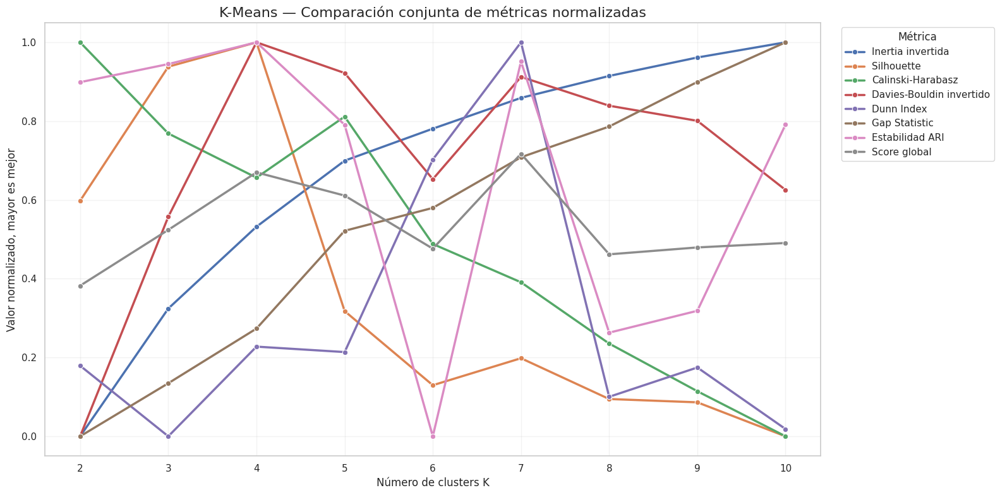

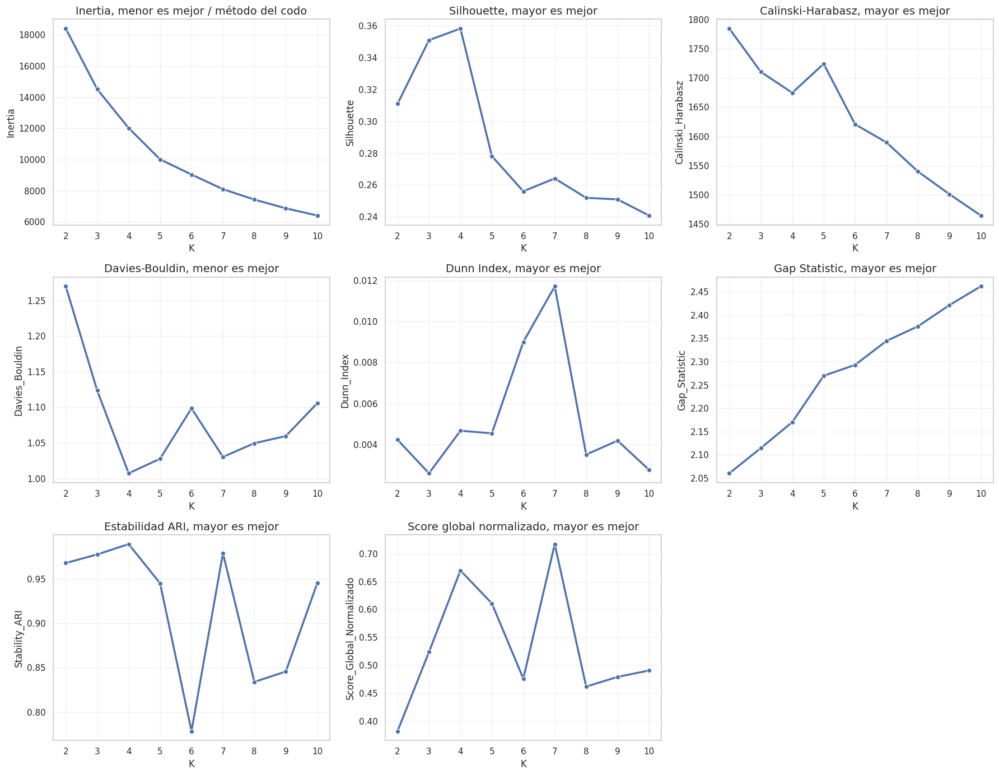


Mejores valores de K según cada criterio:


,Criterio,K_recomendado,Valor
0,Menor Inertia,10,"6,416.12"
1,Mayor Silhouette,4,0.36
2,Mayor Calinski-Harabasz,2,"1,784.62"
3,Menor Davies-Bouldin,4,1.01
4,Mayor Dunn Index,7,0.01
5,Mayor Gap Statistic,10,2.46
6,Mayor Stability ARI,4,0.99
7,Mayor Score Global Normalizado,7,0.72


In [32]:
# ============================================================
# CELDA 24 — K-MEANS CON MÉTRICAS AMPLIADAS
# ============================================================

from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Dunn = distancia mínima entre clusters / diámetro máximo intracluster.
    Valores más altos indican clusters más separados y compactos.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]

            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Función Gap Statistic
# ------------------------------------------------------------
def gap_statistic_kmeans(X, k, n_refs=5, random_state=42):
    """
    Calcula Gap Statistic para K-Means.
    Compara la inercia real con la inercia obtenida en datasets aleatorios
    generados dentro del rango de cada variable.
    Valores más altos indican mejor estructura frente al azar.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)

    kmeans_real = KMeans(
        n_clusters=k,
        random_state=random_state,
        n_init=20
    )
    kmeans_real.fit(X_array)

    log_wk_real = np.log(kmeans_real.inertia_)

    mins = X_array.min(axis=0)
    maxs = X_array.max(axis=0)

    log_wk_refs = []

    for i in range(n_refs):
        X_ref = rng.uniform(
            low=mins,
            high=maxs,
            size=X_array.shape
        )

        kmeans_ref = KMeans(
            n_clusters=k,
            random_state=random_state + i,
            n_init=10
        )
        kmeans_ref.fit(X_ref)

        log_wk_refs.append(np.log(kmeans_ref.inertia_))

    gap = np.mean(log_wk_refs) - log_wk_real

    return gap


# ------------------------------------------------------------
# 3. Función Stability Score mediante remuestreo
# ------------------------------------------------------------
def stability_score_kmeans(X, k, n_iter=5, sample_frac=0.8, random_state=42):
    """
    Calcula estabilidad usando Adjusted Rand Index.
    Compara etiquetas del modelo completo con etiquetas obtenidas
    al reentrenar K-Means sobre submuestras.
    Valores más altos indican mayor estabilidad.
    """
    rng = np.random.default_rng(random_state)

    X_df = pd.DataFrame(X).copy()

    modelo_full = KMeans(
        n_clusters=k,
        random_state=random_state,
        n_init=20
    )

    labels_full = modelo_full.fit_predict(X_df)

    ari_scores = []

    n_sample = int(len(X_df) * sample_frac)

    for i in range(n_iter):
        sample_idx = rng.choice(
            X_df.index,
            size=n_sample,
            replace=False
        )

        X_sample = X_df.loc[sample_idx]

        modelo_sample = KMeans(
            n_clusters=k,
            random_state=random_state + i + 1,
            n_init=10
        )

        labels_sample = modelo_sample.fit_predict(X_sample)

        labels_full_sample = labels_full[X_df.index.get_indexer(sample_idx)]

        ari = adjusted_rand_score(labels_full_sample, labels_sample)
        ari_scores.append(ari)

    return np.mean(ari_scores)


# ------------------------------------------------------------
# 4. Evaluación K-Means para distintos valores de K
# ------------------------------------------------------------
rango_k = range(2, 11)

resultados_kmeans = []

for k in rango_k:
    kmeans = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=20
    )

    labels = kmeans.fit_predict(X_scaled_standard)

    inertia = kmeans.inertia_
    silhouette = silhouette_score(X_scaled_standard, labels)
    calinski = calinski_harabasz_score(X_scaled_standard, labels)
    davies = davies_bouldin_score(X_scaled_standard, labels)
    dunn = dunn_index_sampled(X_scaled_standard, labels, sample_size=1500, random_state=42)
    gap = gap_statistic_kmeans(X_scaled_standard, k, n_refs=5, random_state=42)
    stability = stability_score_kmeans(X_scaled_standard, k, n_iter=5, sample_frac=0.8, random_state=42)

    resultados_kmeans.append({
        "Modelo": "KMeans",
        "K": k,
        "Inertia": inertia,
        "Silhouette": silhouette,
        "Calinski_Harabasz": calinski,
        "Davies_Bouldin": davies,
        "Dunn_Index": dunn,
        "Gap_Statistic": gap,
        "Stability_ARI": stability
    })

resultados_kmeans_df = pd.DataFrame(resultados_kmeans)

print("Resultados ampliados de evaluación K-Means:")
display(resultados_kmeans_df)


# ------------------------------------------------------------
# 5. Normalización de métricas para comparación conjunta
# ------------------------------------------------------------
metricas_mayor_mejor = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index",
    "Gap_Statistic",
    "Stability_ARI"
]

metricas_menor_mejor = [
    "Inertia",
    "Davies_Bouldin"
]

resultados_norm = resultados_kmeans_df.copy()

# Normalizar métricas donde mayor es mejor
scaler = MinMaxScaler()

resultados_norm[[m + "_Norm" for m in metricas_mayor_mejor]] = scaler.fit_transform(
    resultados_norm[metricas_mayor_mejor]
)

# Normalizar e invertir métricas donde menor es mejor
for metrica in metricas_menor_mejor:
    valores = resultados_norm[[metrica]]
    valores_norm = scaler.fit_transform(valores)
    resultados_norm[metrica + "_Norm"] = 1 - valores_norm

# Score medio global
columnas_norm = [col for col in resultados_norm.columns if col.endswith("_Norm")]

resultados_norm["Score_Global_Normalizado"] = resultados_norm[columnas_norm].mean(axis=1)

print("\nResultados con métricas normalizadas:")
display(
    resultados_norm[
        [
            "K",
            "Inertia_Norm",
            "Silhouette_Norm",
            "Calinski_Harabasz_Norm",
            "Davies_Bouldin_Norm",
            "Dunn_Index_Norm",
            "Gap_Statistic_Norm",
            "Stability_ARI_Norm",
            "Score_Global_Normalizado"
        ]
    ]
)


# ------------------------------------------------------------
# 6. Gráfico conjunto de métricas normalizadas
# ------------------------------------------------------------
metricas_norm_plot = resultados_norm.melt(
    id_vars="K",
    value_vars=[
        "Inertia_Norm",
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Gap_Statistic_Norm",
        "Stability_ARI_Norm",
        "Score_Global_Normalizado"
    ],
    var_name="Metrica",
    value_name="Valor_Normalizado"
)

nombres_metricas = {
    "Inertia_Norm": "Inertia invertida",
    "Silhouette_Norm": "Silhouette",
    "Calinski_Harabasz_Norm": "Calinski-Harabasz",
    "Davies_Bouldin_Norm": "Davies-Bouldin invertido",
    "Dunn_Index_Norm": "Dunn Index",
    "Gap_Statistic_Norm": "Gap Statistic",
    "Stability_ARI_Norm": "Estabilidad ARI",
    "Score_Global_Normalizado": "Score global"
}

metricas_norm_plot["Metrica"] = metricas_norm_plot["Metrica"].map(nombres_metricas)

plt.figure(figsize=(16, 8))

sns.lineplot(
    data=metricas_norm_plot,
    x="K",
    y="Valor_Normalizado",
    hue="Metrica",
    marker="o",
    linewidth=2.5
)

plt.title("K-Means — Comparación conjunta de métricas normalizadas", fontsize=16)
plt.xlabel("Número de clusters K")
plt.ylabel("Valor normalizado, mayor es mejor")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.25)
plt.legend(title="Métrica", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 7. Gráficos individuales de métricas originales
# ------------------------------------------------------------
fig, axes = plt.subplots(3, 3, figsize=(18, 14))
axes = axes.flatten()

metricas_originales = [
    ("Inertia", "Inertia, menor es mejor / método del codo"),
    ("Silhouette", "Silhouette, mayor es mejor"),
    ("Calinski_Harabasz", "Calinski-Harabasz, mayor es mejor"),
    ("Davies_Bouldin", "Davies-Bouldin, menor es mejor"),
    ("Dunn_Index", "Dunn Index, mayor es mejor"),
    ("Gap_Statistic", "Gap Statistic, mayor es mejor"),
    ("Stability_ARI", "Estabilidad ARI, mayor es mejor"),
    ("Score_Global_Normalizado", "Score global normalizado, mayor es mejor")
]

for i, (metrica, titulo) in enumerate(metricas_originales):
    sns.lineplot(
        data=resultados_norm,
        x="K",
        y=metrica,
        marker="o",
        linewidth=2.5,
        ax=axes[i]
    )
    axes[i].set_title(titulo)
    axes[i].set_xlabel("K")
    axes[i].set_ylabel(metrica)
    axes[i].grid(True, alpha=0.3)

# Eliminar subplot vacío
for j in range(len(metricas_originales), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 8. Mejores K según cada métrica
# ------------------------------------------------------------
mejores_kmeans = pd.DataFrame({
    "Criterio": [
        "Menor Inertia",
        "Mayor Silhouette",
        "Mayor Calinski-Harabasz",
        "Menor Davies-Bouldin",
        "Mayor Dunn Index",
        "Mayor Gap Statistic",
        "Mayor Stability ARI",
        "Mayor Score Global Normalizado"
    ],
    "K_recomendado": [
        resultados_kmeans_df.loc[resultados_kmeans_df["Inertia"].idxmin(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Silhouette"].idxmax(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Calinski_Harabasz"].idxmax(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Davies_Bouldin"].idxmin(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Dunn_Index"].idxmax(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Gap_Statistic"].idxmax(), "K"],
        resultados_kmeans_df.loc[resultados_kmeans_df["Stability_ARI"].idxmax(), "K"],
        resultados_norm.loc[resultados_norm["Score_Global_Normalizado"].idxmax(), "K"]
    ],
    "Valor": [
        resultados_kmeans_df["Inertia"].min(),
        resultados_kmeans_df["Silhouette"].max(),
        resultados_kmeans_df["Calinski_Harabasz"].max(),
        resultados_kmeans_df["Davies_Bouldin"].min(),
        resultados_kmeans_df["Dunn_Index"].max(),
        resultados_kmeans_df["Gap_Statistic"].max(),
        resultados_kmeans_df["Stability_ARI"].max(),
        resultados_norm["Score_Global_Normalizado"].max()
    ]
})

print("\nMejores valores de K según cada criterio:")
display(mejores_kmeans)

Celda 24

Se evaluó el algoritmo K-Means utilizando valores de k entre 2 y 10. Para cada configuración se calcularon métricas internas y de robustez: inercia, silhouette score, Calinski-Harabasz, Davies-Bouldin, Dunn Index aproximado, Gap Statistic y estabilidad mediante Adjusted Rand Index.

Los resultados mostraron que K=4 fue la solución más equilibrada desde el punto de vista estadístico. Este valor obtuvo el mayor silhouette score, con 0,36, el menor índice Davies-Bouldin, con 1,01, y la mayor estabilidad ARI, con 0,99. Estas métricas indican una segmentación relativamente compacta, separada y estable.

El valor K=7 obtuvo el mayor Dunn Index y el mayor score global normalizado, con 0,72. No obstante, esta solución requiere una revisión adicional desde el punto de vista de negocio, ya que un mayor número de clusters puede generar segmentos más fragmentados y menos accionables.

Por otro lado, K=10 obtuvo el mayor Gap Statistic, aunque esta métrica debe interpretarse con cautela, ya que puede favorecer soluciones con mayor fragmentación. K=2 obtuvo el mejor índice Calinski-Harabasz, pero ofrece una segmentación demasiado general para los objetivos del análisis.

A partir de esta evaluación, se seleccionaron K=4, K=5 y K=7 como configuraciones candidatas para una revisión posterior de perfiles de cliente. La decisión final no se basará únicamente en las métricas cuantitativas, sino también en la interpretación comercial de los segmentos obtenidos.

Resumen de tamaños de clusters K-Means:


,Modelo,K,Cluster,Clientes,Porcentaje
0,KMeans_K4,4,0,2212,51.07
1,KMeans_K4,4,1,35,0.81
2,KMeans_K4,4,2,1543,35.63
3,KMeans_K4,4,3,541,12.49
4,KMeans_K5,5,0,521,12.03
5,KMeans_K5,5,1,1619,37.38
6,KMeans_K5,5,2,1141,26.34
7,KMeans_K5,5,3,1015,23.44
8,KMeans_K5,5,4,35,0.81
9,KMeans_K7,7,0,1093,25.24


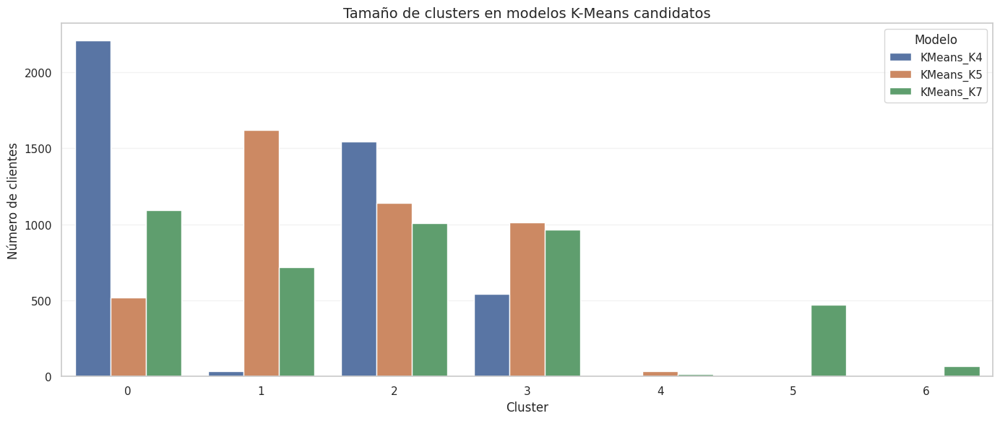

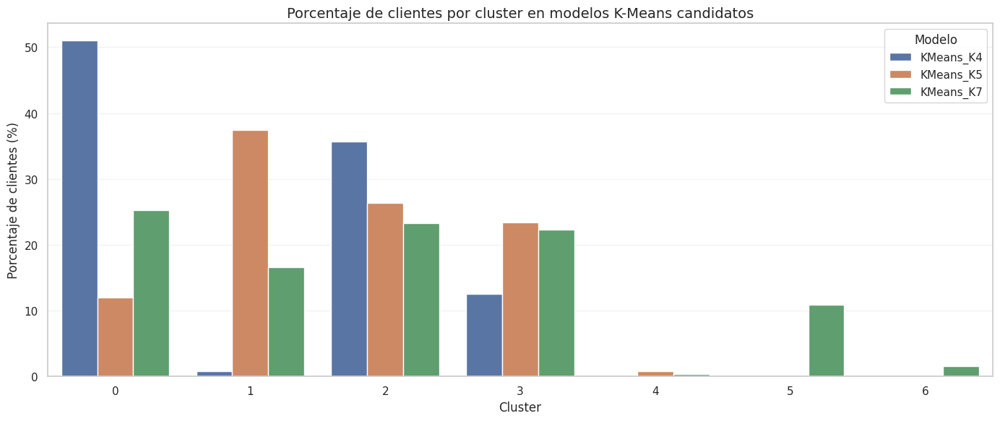

In [33]:
# ============================================================
# CELDA 25 — ENTRENAMIENTO DE K-MEANS CANDIDATO
# K = 4, 5 y 7
# ============================================================

# ------------------------------------------------------------
# 1. Crear copia del dataset final para añadir etiquetas
# ------------------------------------------------------------
clientes_kmeans = clientes_modelo_final.copy()

# ------------------------------------------------------------
# 2. Definir valores candidatos de K
# ------------------------------------------------------------
k_candidatos = [4, 5, 7]

modelos_kmeans = {}
resumen_tamanos_kmeans = []

# ------------------------------------------------------------
# 3. Entrenar modelos candidatos
# ------------------------------------------------------------
for k in k_candidatos:
    modelo = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=20
    )

    labels = modelo.fit_predict(X_scaled_standard)

    nombre_columna = f"Cluster_KMeans_{k}"
    clientes_kmeans[nombre_columna] = labels

    modelos_kmeans[k] = modelo

    conteo = pd.Series(labels).value_counts().sort_index()
    porcentaje = (conteo / len(labels) * 100).round(2)

    for cluster_id in conteo.index:
        resumen_tamanos_kmeans.append({
            "Modelo": f"KMeans_K{k}",
            "K": k,
            "Cluster": cluster_id,
            "Clientes": conteo.loc[cluster_id],
            "Porcentaje": porcentaje.loc[cluster_id]
        })

# ------------------------------------------------------------
# 4. Crear resumen de tamaños
# ------------------------------------------------------------
resumen_tamanos_kmeans_df = pd.DataFrame(resumen_tamanos_kmeans)

print("Resumen de tamaños de clusters K-Means:")
display(resumen_tamanos_kmeans_df)

# ------------------------------------------------------------
# 5. Visualización de tamaños por cluster
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))

sns.barplot(
    data=resumen_tamanos_kmeans_df,
    x="Cluster",
    y="Clientes",
    hue="Modelo"
)

plt.title("Tamaño de clusters en modelos K-Means candidatos")
plt.xlabel("Cluster")
plt.ylabel("Número de clientes")
plt.grid(axis="y", alpha=0.25)
plt.legend(title="Modelo")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Visualización de porcentajes por cluster
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))

sns.barplot(
    data=resumen_tamanos_kmeans_df,
    x="Cluster",
    y="Porcentaje",
    hue="Modelo"
)

plt.title("Porcentaje de clientes por cluster en modelos K-Means candidatos")
plt.xlabel("Cluster")
plt.ylabel("Porcentaje de clientes (%)")
plt.grid(axis="y", alpha=0.25)
plt.legend(title="Modelo")
plt.tight_layout()
plt.show()

Celda 25

Tras evaluar distintas configuraciones de K-Means, se entrenaron los modelos candidatos con K=4, K=5 y K=7. El objetivo fue comparar no solo las métricas internas, sino también la distribución de clientes entre clusters, ya que una segmentación útil debe generar grupos interpretables y accionables.

En la solución K=4, el modelo generó tres grupos principales y un cluster pequeño. El cluster 0 concentró 2.212 clientes, equivalentes al 51,07% del total; el cluster 2 agrupó 1.543 clientes, equivalentes al 35,63%; el cluster 3 reunió 541 clientes, equivalentes al 12,49%; y el cluster 1 agrupó 35 clientes, equivalentes al 0,81%. Este último grupo puede representar clientes de comportamiento extremo o de alto valor, por lo que requiere análisis posterior.

En la solución K=5, el modelo mantuvo un cluster pequeño de 35 clientes y dividió el resto de clientes en cuatro grupos de tamaño medio. Aunque esta configuración ofrece mayor granularidad, también incrementa la complejidad de interpretación.

En la solución K=7, aparecieron varios segmentos de tamaño moderado, pero también clusters muy pequeños de 14 y 66 clientes. Esta solución puede ser útil para detectar perfiles muy específicos, aunque puede resultar menos adecuada como segmentación principal si dichos grupos no presentan una interpretación comercial clara.

A partir de estos resultados, K=4 se mantiene como la opción principal para K-Means, por ofrecer un buen equilibrio entre calidad métrica, estabilidad, simplicidad e interpretabilidad. No obstante, K=5 y K=7 se conservarán como alternativas para comparar perfiles de clusters.

PERFIL DE CLUSTERS — KMeans K=4


,Clientes,Porcentaje,NetRevenue_mean,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean,NetRevenue_median,NetAverageOrderValue_median,PurchaseFrequency_median,UniqueProductsPurchased_median,ReturnRate_median,ReturnFrequencyRatio_median,HasReturns_median
Cluster_KMeans_4,,,,,,,,,,,,,,,,
0,2212,51.07,405.97,268.76,1.68,25.30,0.00,0.01,0.02,329.29,210.03,1.00,20.00,0.00,0.00,0.00
1,35,0.81,184.35,84.93,1.94,19.57,0.69,0.97,1.00,82.56,70.44,1.00,9.00,0.65,1.00,1.00
2,1543,35.63,"4,463.03",507.64,8.60,121.71,0.01,0.15,0.54,"2,116.19",365.41,6.00,94.00,0.00,0.08,1.00
3,541,12.49,882.53,413.87,2.39,39.87,0.07,0.79,1.00,616.65,299.48,2.00,29.00,0.04,0.75,1.00


PERFIL DE CLUSTERS — KMeans K=5


,Clientes,Porcentaje,NetRevenue_mean,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean,NetRevenue_median,NetAverageOrderValue_median,PurchaseFrequency_median,UniqueProductsPurchased_median,ReturnRate_median,ReturnFrequencyRatio_median,HasReturns_median
Cluster_KMeans_5,,,,,,,,,,,,,,,,
0,521,12.03,898.00,428.46,2.34,40.44,0.07,0.80,1.00,617.93,303.11,2.00,29.00,0.04,0.80,1.00
1,1619,37.38,891.11,429.10,2.48,49.87,0.00,0.03,0.09,689.10,329.34,2.00,40.00,0.00,0.00,0.00
2,1141,26.34,217.01,163.67,1.45,13.27,0.00,0.01,0.03,188.02,147.12,1.00,11.00,0.00,0.00,0.00
3,1015,23.44,"6,013.52",489.66,11.22,146.19,0.01,0.19,0.72,"2,939.64",374.75,8.00,112.00,0.01,0.15,1.00
4,35,0.81,184.35,84.93,1.94,19.57,0.69,0.97,1.00,82.56,70.44,1.00,9.00,0.65,1.00,1.00


PERFIL DE CLUSTERS — KMeans K=7


,Clientes,Porcentaje,NetRevenue_mean,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean,NetRevenue_median,NetAverageOrderValue_median,PurchaseFrequency_median,UniqueProductsPurchased_median,ReturnRate_median,ReturnFrequencyRatio_median,HasReturns_median
Cluster_KMeans_7,,,,,,,,,,,,,,,,
0,1093,25.24,"1,131.50",272.09,4.32,71.65,0.01,0.08,0.30,"1,020.06",238.26,4.00,61.00,0.00,0.00,0.00
1,717,16.56,"7,792.01",564.05,13.30,167.73,0.02,0.22,0.78,"3,756.33",430.02,10.00,131.00,0.01,0.17,1.00
2,1006,23.23,762.21,533.08,1.42,32.52,0.00,0.00,0.00,506.00,379.64,1.00,27.00,0.00,0.00,0.00
3,965,22.28,189.95,139.31,1.44,13.05,0.00,0.01,0.02,168.30,136.50,1.00,10.00,0.00,0.00,0.00
4,14,0.32,5.16,3.02,1.21,14.79,0.99,1.04,1.00,0.00,0.00,1.00,8.50,1.00,1.00,1.00
5,470,10.85,907.05,449.93,2.22,41.89,0.05,0.83,1.00,646.02,332.94,2.00,30.50,0.04,1.00,1.00
6,66,1.52,"1,034.51",312.54,3.20,33.88,0.34,0.75,1.00,408.54,177.57,2.00,17.00,0.29,0.58,1.00


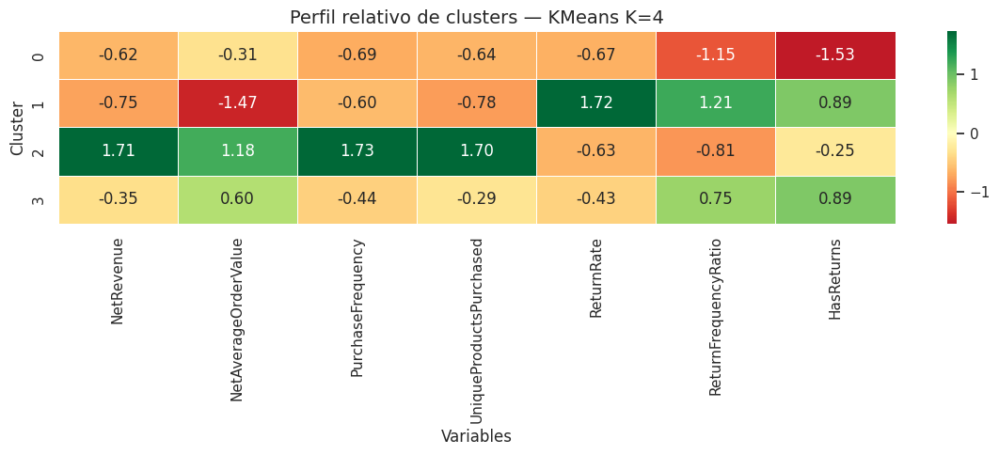

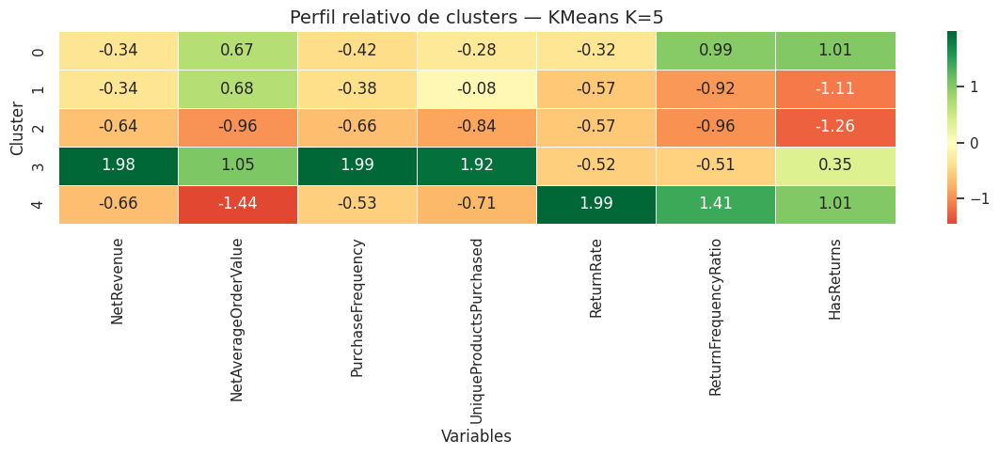

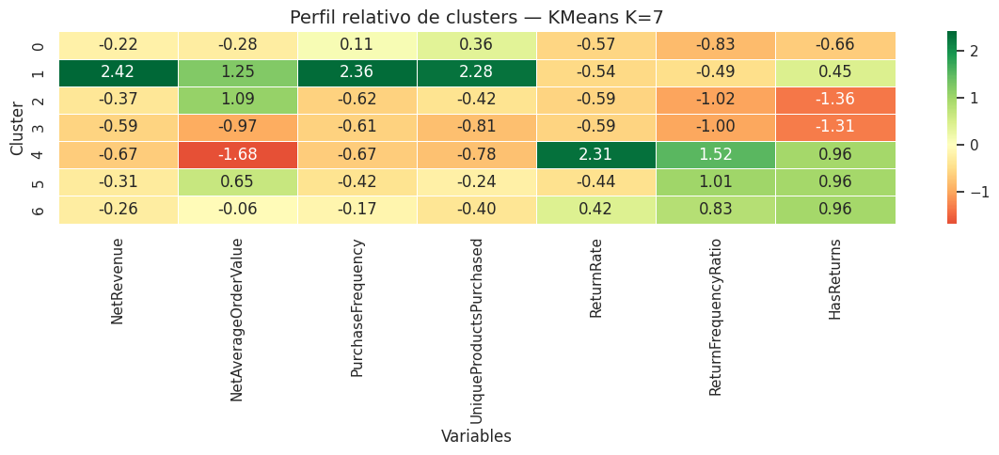

In [34]:
# ============================================================
# CELDA 26 — PERFILADO DE CLUSTERS K-MEANS CANDIDATOS
# ============================================================

# ------------------------------------------------------------
# 1. Variables de perfilado
# ------------------------------------------------------------
variables_perfil = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

# ------------------------------------------------------------
# 2. Función para crear perfil de clusters
# ------------------------------------------------------------
def perfilar_clusters(df, columna_cluster, variables):
    perfil_media = (
        df
        .groupby(columna_cluster)[variables]
        .mean()
        .round(2)
    )

    perfil_mediana = (
        df
        .groupby(columna_cluster)[variables]
        .median()
        .round(2)
    )

    tamanos = (
        df[columna_cluster]
        .value_counts()
        .sort_index()
        .rename("Clientes")
    )

    porcentajes = (
        df[columna_cluster]
        .value_counts(normalize=True)
        .sort_index()
        .mul(100)
        .round(2)
        .rename("Porcentaje")
    )

    perfil = pd.concat(
        [tamanos, porcentajes, perfil_media.add_suffix("_mean"), perfil_mediana.add_suffix("_median")],
        axis=1
    )

    return perfil

# ------------------------------------------------------------
# 3. Generar perfiles para K=4, K=5 y K=7
# ------------------------------------------------------------
perfiles_kmeans = {}

for k in k_candidatos:
    columna_cluster = f"Cluster_KMeans_{k}"
    perfil = perfilar_clusters(clientes_kmeans, columna_cluster, variables_perfil)
    perfiles_kmeans[k] = perfil

    print(f"PERFIL DE CLUSTERS — KMeans K={k}")
    display(perfil)

# ------------------------------------------------------------
# 4. Heatmaps normalizados por configuración
# ------------------------------------------------------------
for k in k_candidatos:
    columna_cluster = f"Cluster_KMeans_{k}"

    perfil_media = (
        clientes_kmeans
        .groupby(columna_cluster)[variables_perfil]
        .mean()
    )

    # Normalización por columnas para heatmap interpretativo
    scaler_heatmap = StandardScaler()
    perfil_scaled = pd.DataFrame(
        scaler_heatmap.fit_transform(perfil_media),
        index=perfil_media.index,
        columns=perfil_media.columns
    )

    plt.figure(figsize=(12, 5))

    sns.heatmap(
        perfil_scaled,
        annot=True,
        fmt=".2f",
        cmap="RdYlGn",
        center=0,
        linewidths=0.5
    )

    plt.title(f"Perfil relativo de clusters — KMeans K={k}")
    plt.xlabel("Variables")
    plt.ylabel("Cluster")
    plt.tight_layout()
    plt.show()

Celda 26

Tras entrenar las configuraciones candidatas de K-Means, se analizó el perfil de los clusters generados para K=4, K=5 y K=7. Esta fase permitió pasar de la evaluación métrica a la interpretación de negocio de los segmentos obtenidos.

La solución K=4 generó cuatro grupos claramente diferenciados. El cluster 0 agrupó 2.212 clientes, equivalentes al 51,07% del total, caracterizados por bajo valor neto, baja frecuencia de compra, baja variedad de productos y ausencia casi total de devoluciones. Este grupo puede interpretarse como clientes estándar u ocasionales de bajo valor.

El cluster 1 agrupó 35 clientes, equivalentes al 0,81%. Aunque es un grupo pequeño, presenta un comportamiento diferencial, con bajo valor neto y una intensidad de devolución muy elevada. Su tasa media de devolución fue de 0,69 y su ratio medio de frecuencia de devolución fue de 0,97, por lo que puede considerarse un segmento de clientes con alta fricción comercial.

El cluster 2 agrupó 1.543 clientes, equivalentes al 35,63%. Este fue el segmento de mayor valor, con el valor neto medio más alto, mayor frecuencia de compra y mayor variedad de productos. Además, presentó una tasa de devolución baja, lo que lo convierte en el segmento más estratégico desde el punto de vista comercial.

El cluster 3 agrupó 541 clientes, equivalentes al 12,49%. Este grupo presentó un ticket medio relativamente alto, pero también una mayor presencia de devoluciones. Puede interpretarse como un segmento de clientes de valor medio con comportamiento de devolución relevante.

Las soluciones K=5 y K=7 aportaron mayor granularidad, pero también incrementaron la fragmentación de segmentos. En particular, K=7 generó clusters muy pequeños, de 14 y 66 clientes, lo que puede dificultar la interpretación y aplicación comercial de la segmentación.

A partir de esta comparación, se seleccionó K=4 como la configuración principal de K-Means, por ofrecer el mejor equilibrio entre calidad métrica, estabilidad, simplicidad e interpretabilidad de negocio.

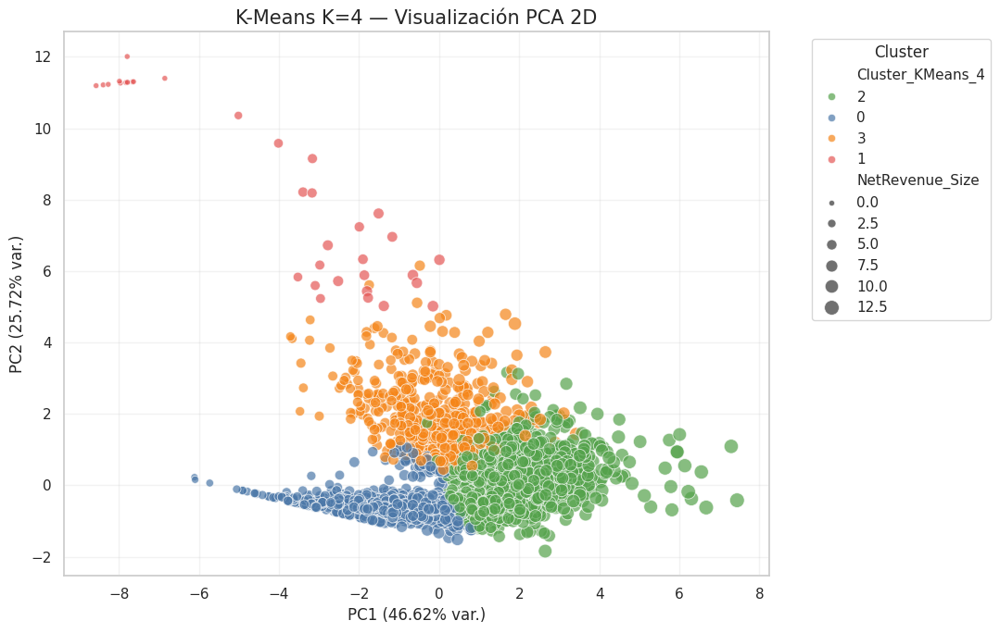

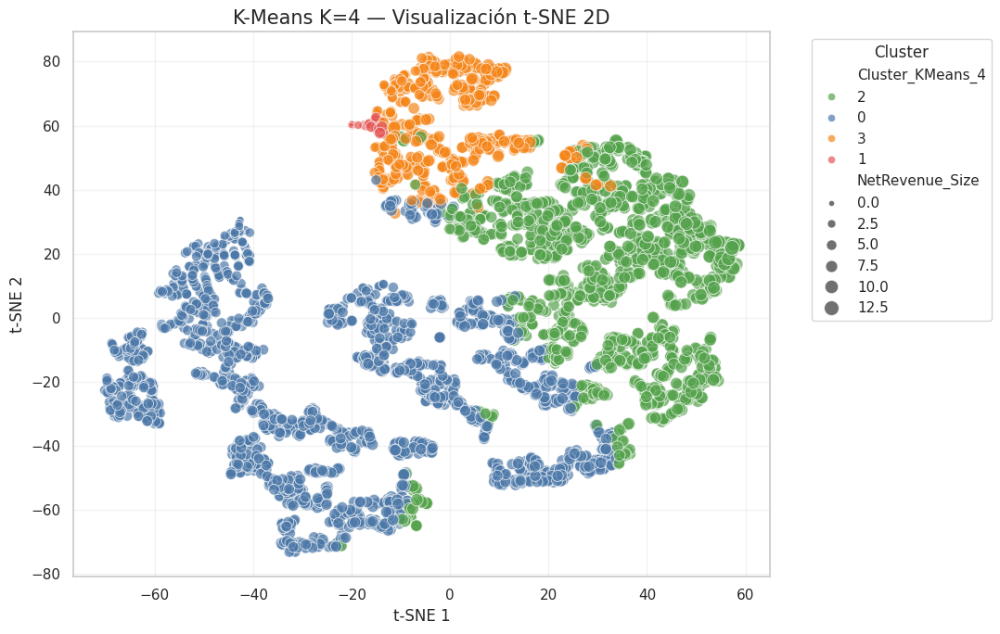

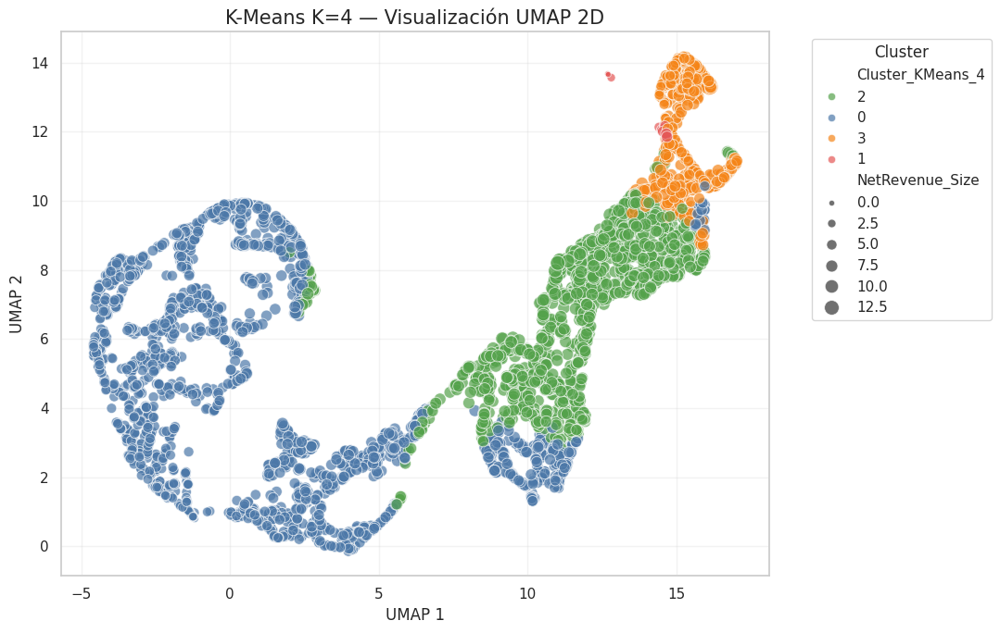

In [35]:
# ============================================================
# CELDA 27 — VISUALIZACIÓN DE K-MEANS K=4
# PCA, t-SNE Y UMAP
# ============================================================

# ------------------------------------------------------------
# 1. Preparar información de visualización
# ------------------------------------------------------------
cluster_col = "Cluster_KMeans_4"

visual_k4 = clientes_kmeans.loc[X_scaled_standard.index, [
    "CustomerID",
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns",
    cluster_col
]].copy()

visual_k4[cluster_col] = visual_k4[cluster_col].astype(str)
visual_k4["NetRevenue_Size"] = np.log1p(visual_k4["NetRevenue"])

# Paleta fija para clusters
palette_k4 = {
    "0": "#4C78A8",
    "1": "#E45756",
    "2": "#54A24B",
    "3": "#F58518"
}

# ------------------------------------------------------------
# 2. PCA 2D
# ------------------------------------------------------------
pca_2d_k4 = PCA(n_components=2, random_state=42)
X_pca_2d_k4 = pca_2d_k4.fit_transform(X_scaled_standard)

pca_2d_k4_df = pd.DataFrame(
    X_pca_2d_k4,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_2d_k4_df = pd.concat([pca_2d_k4_df, visual_k4], axis=1)

var_pca_k4 = pca_2d_k4.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_2d_k4_df,
    x="PC1",
    y="PC2",
    hue=cluster_col,
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette=palette_k4
)

plt.title("K-Means K=4 — Visualización PCA 2D", fontsize=15)
plt.xlabel(f"PC1 ({var_pca_k4[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_k4[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. t-SNE 2D
# ------------------------------------------------------------
tsne_2d_k4 = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42
)

X_tsne_2d_k4 = tsne_2d_k4.fit_transform(X_scaled_standard)

tsne_2d_k4_df = pd.DataFrame(
    X_tsne_2d_k4,
    columns=["TSNE1", "TSNE2"],
    index=X_scaled_standard.index
)

tsne_2d_k4_df = pd.concat([tsne_2d_k4_df, visual_k4], axis=1)

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=tsne_2d_k4_df,
    x="TSNE1",
    y="TSNE2",
    hue=cluster_col,
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette=palette_k4
)

plt.title("K-Means K=4 — Visualización t-SNE 2D", fontsize=15)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4. UMAP 2D
# ------------------------------------------------------------
umap_2d_k4 = umap.UMAP(
    n_components=2,
    n_neighbors=30,
    min_dist=0.10,
    metric="euclidean",
    random_state=42
)

X_umap_2d_k4 = umap_2d_k4.fit_transform(X_scaled_standard)

umap_2d_k4_df = pd.DataFrame(
    X_umap_2d_k4,
    columns=["UMAP1", "UMAP2"],
    index=X_scaled_standard.index
)

umap_2d_k4_df = pd.concat([umap_2d_k4_df, visual_k4], axis=1)

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=umap_2d_k4_df,
    x="UMAP1",
    y="UMAP2",
    hue=cluster_col,
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette=palette_k4
)

plt.title("K-Means K=4 — Visualización UMAP 2D", fontsize=15)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. PCA 3D interactivo
# ------------------------------------------------------------
pca_3d_k4 = PCA(n_components=3, random_state=42)
X_pca_3d_k4 = pca_3d_k4.fit_transform(X_scaled_standard)

pca_3d_k4_df = pd.DataFrame(
    X_pca_3d_k4,
    columns=["PC1", "PC2", "PC3"],
    index=X_scaled_standard.index
)

pca_3d_k4_df = pd.concat([pca_3d_k4_df, visual_k4], axis=1)

var_pca_3d_k4 = pca_3d_k4.explained_variance_ratio_

fig_pca_k4 = px.scatter_3d(
    pca_3d_k4_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color=cluster_col,
    size="NetRevenue_Size",
    opacity=0.70,
    color_discrete_map=palette_k4,
    hover_data={
        "CustomerID": True,
        "NetRevenue": ":.2f",
        "NetAverageOrderValue": ":.2f",
        "PurchaseFrequency": True,
        "UniqueProductsPurchased": True,
        "ReturnRate": ":.4f",
        "ReturnFrequencyRatio": ":.4f",
        "NetRevenue_Size": False
    },
    title=f"K-Means K=4 — PCA 3D interactivo | Varianza total: {var_pca_3d_k4.sum() * 100:.2f}%"
)

# Quitar borde blanco de las burbujas 3D
fig_pca_k4.update_traces(
    marker=dict(
        line=dict(
            width=0
        )
    )
)

fig_pca_k4.update_layout(
    width=950,
    height=700,
    legend_title_text="Cluster",
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    )
)

fig_pca_k4.show()

# ------------------------------------------------------------
# 6. UMAP 3D interactivo
# ------------------------------------------------------------
umap_3d_k4 = umap.UMAP(
    n_components=3,
    n_neighbors=30,
    min_dist=0.10,
    metric="euclidean",
    random_state=42
)

X_umap_3d_k4 = umap_3d_k4.fit_transform(X_scaled_standard)

umap_3d_k4_df = pd.DataFrame(
    X_umap_3d_k4,
    columns=["UMAP1", "UMAP2", "UMAP3"],
    index=X_scaled_standard.index
)

umap_3d_k4_df = pd.concat([umap_3d_k4_df, visual_k4], axis=1)

fig_umap_k4 = px.scatter_3d(
    umap_3d_k4_df,
    x="UMAP1",
    y="UMAP2",
    z="UMAP3",
    color=cluster_col,
    size="NetRevenue_Size",
    opacity=0.70,
    color_discrete_map=palette_k4,
    hover_data={
        "CustomerID": True,
        "NetRevenue": ":.2f",
        "NetAverageOrderValue": ":.2f",
        "PurchaseFrequency": True,
        "UniqueProductsPurchased": True,
        "ReturnRate": ":.4f",
        "ReturnFrequencyRatio": ":.4f",
        "NetRevenue_Size": False
    },
    title="K-Means K=4 — UMAP 3D interactivo"
)

# Quitar borde blanco de las burbujas 3D
fig_umap_k4.update_traces(
    marker=dict(
        line=dict(
            width=0
        )
    )
)

fig_umap_k4.update_layout(
    width=950,
    height=700,
    legend_title_text="Cluster",
    scene=dict(
        xaxis_title="UMAP1",
        yaxis_title="UMAP2",
        zaxis_title="UMAP3"
    )
)

fig_umap_k4.show()

Celda 27

Una vez seleccionada la configuración K=4 como candidata principal para K-Means, se visualizaron los clusters mediante técnicas de reducción dimensional. Se utilizaron PCA, t-SNE y UMAP, tanto en dos como en tres dimensiones, con el objetivo de analizar la separación visual de los segmentos.

En la proyección PCA 2D se observó una separación razonable entre los cuatro clusters. El cluster 0 se concentró en la zona inferior del plano, asociado a clientes de menor valor y baja devolución. El cluster 2 ocupó una zona más desplazada hacia valores altos de la primera componente, reflejando clientes de mayor valor neto y mayor actividad. El cluster 3 se situó en una región intermedia-superior, vinculada a clientes con devoluciones relevantes. Por último, el cluster 1 apareció como un grupo pequeño y extremo, coherente con su perfil de alta fricción comercial.

La visualización t-SNE 2D mostró una separación más marcada entre regiones, especialmente entre clientes estándar, clientes de alto valor y clientes con mayor comportamiento de devolución. Esta representación permitió confirmar que los clusters generados por K-Means presentan estructura local diferenciada.

Las visualizaciones interactivas en 3D mediante PCA y UMAP reforzaron esta interpretación. En particular, UMAP 3D permitió observar una transición clara entre segmentos, con un grupo mayoritario de clientes estándar, un segmento de alto valor y grupos diferenciados por devolución. Estas visualizaciones complementan las métricas cuantitativas y apoyan la elección de K=4 como configuración principal para K-Means.

Resumen final de segmentos K-Means K=4:


,Cluster_KMeans_4,Segmento_KMeans_4,Clientes,Porcentaje,NetRevenue_mean,NetRevenue_median,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean
0,0,Clientes estándar de bajo valor,2212,51.07,405.97,329.29,268.76,1.68,25.30,0.00,0.01,0.02
1,1,Clientes con alta fricción por devoluciones,35,0.81,184.35,82.56,84.93,1.94,19.57,0.69,0.97,1.00
2,2,Clientes de alto valor y alta actividad,1543,35.63,"4,463.03","2,116.19",507.64,8.60,121.71,0.01,0.15,0.54
3,3,Clientes de valor medio con devoluciones,541,12.49,882.53,616.65,413.87,2.39,39.87,0.07,0.79,1.00


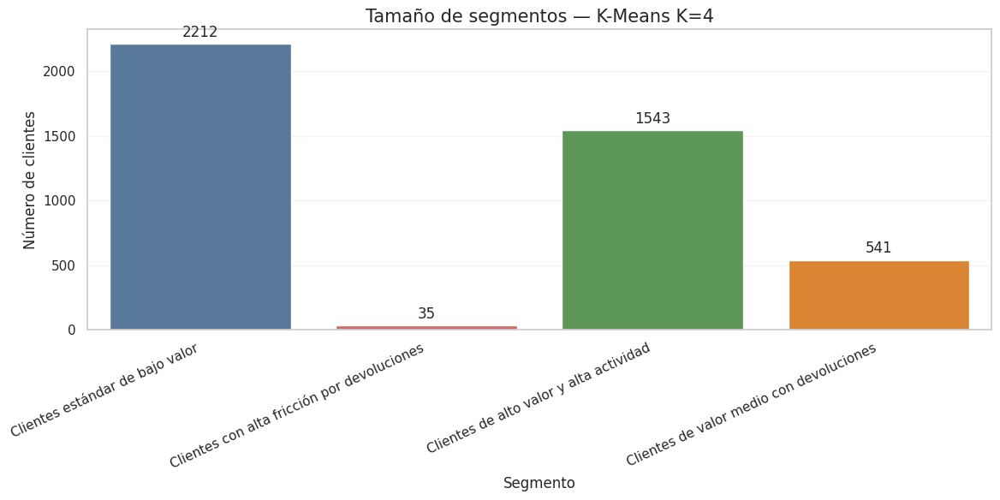

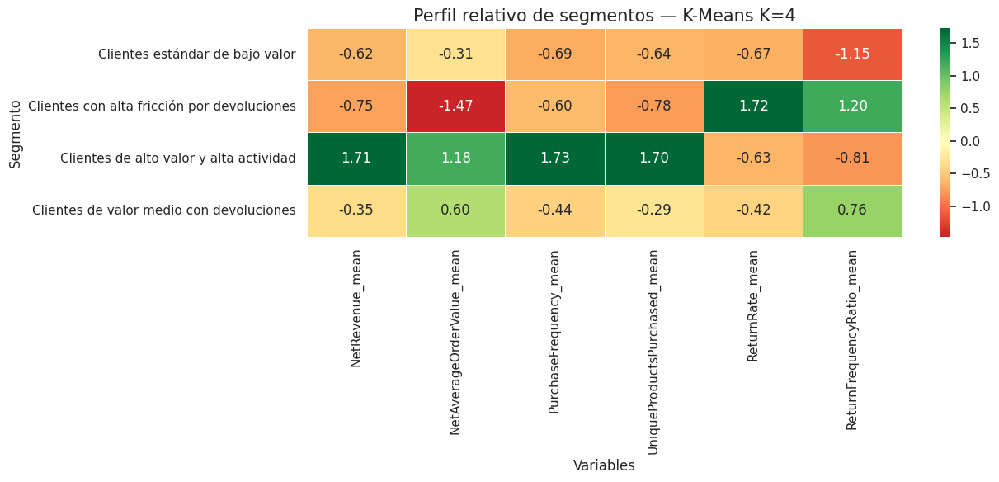

In [36]:
# ============================================================
# CELDA 28 — NOMBRADO DE SEGMENTOS K-MEANS K=4
# ============================================================

# ------------------------------------------------------------
# 1. Crear copia del dataset con clusters K=4
# ------------------------------------------------------------
clientes_kmeans_final = clientes_kmeans.copy()

# ------------------------------------------------------------
# 2. Definir nombres de negocio para cada cluster
# ------------------------------------------------------------
nombres_segmentos_k4 = {
    0: "Clientes estándar de bajo valor",
    1: "Clientes con alta fricción por devoluciones",
    2: "Clientes de alto valor y alta actividad",
    3: "Clientes de valor medio con devoluciones"
}

clientes_kmeans_final["Segmento_KMeans_4"] = (
    clientes_kmeans_final["Cluster_KMeans_4"]
    .map(nombres_segmentos_k4)
)

# ------------------------------------------------------------
# 3. Crear resumen de segmentos
# ------------------------------------------------------------
resumen_segmentos_k4 = (
    clientes_kmeans_final
    .groupby(["Cluster_KMeans_4", "Segmento_KMeans_4"])
    .agg(
        Clientes=("CustomerID", "count"),
        NetRevenue_mean=("NetRevenue", "mean"),
        NetRevenue_median=("NetRevenue", "median"),
        NetAverageOrderValue_mean=("NetAverageOrderValue", "mean"),
        PurchaseFrequency_mean=("PurchaseFrequency", "mean"),
        UniqueProductsPurchased_mean=("UniqueProductsPurchased", "mean"),
        ReturnRate_mean=("ReturnRate", "mean"),
        ReturnFrequencyRatio_mean=("ReturnFrequencyRatio", "mean"),
        HasReturns_mean=("HasReturns", "mean")
    )
    .reset_index()
)

resumen_segmentos_k4["Porcentaje"] = (
    resumen_segmentos_k4["Clientes"] / len(clientes_kmeans_final) * 100
).round(2)

# Reordenar columnas
resumen_segmentos_k4 = resumen_segmentos_k4[
    [
        "Cluster_KMeans_4",
        "Segmento_KMeans_4",
        "Clientes",
        "Porcentaje",
        "NetRevenue_mean",
        "NetRevenue_median",
        "NetAverageOrderValue_mean",
        "PurchaseFrequency_mean",
        "UniqueProductsPurchased_mean",
        "ReturnRate_mean",
        "ReturnFrequencyRatio_mean",
        "HasReturns_mean"
    ]
]

# Redondear métricas
columnas_redondear = [
    "NetRevenue_mean",
    "NetRevenue_median",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean",
    "HasReturns_mean"
]

resumen_segmentos_k4[columnas_redondear] = (
    resumen_segmentos_k4[columnas_redondear]
    .round(2)
)

print("Resumen final de segmentos K-Means K=4:")
display(resumen_segmentos_k4)

# ------------------------------------------------------------
# 4. Visualización de tamaño de segmentos
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=resumen_segmentos_k4,
    x="Segmento_KMeans_4",
    y="Clientes",
    hue="Segmento_KMeans_4",
    dodge=False,
    palette=["#4C78A8", "#E45756", "#54A24B", "#F58518"]
)

plt.title("Tamaño de segmentos — K-Means K=4", fontsize=15)
plt.xlabel("Segmento")
plt.ylabel("Número de clientes")
plt.xticks(rotation=25, ha="right")
plt.legend([], [], frameon=False)
plt.grid(axis="y", alpha=0.25)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 5. Visualización comparativa de variables principales
# ------------------------------------------------------------
variables_radar_base = [
    "NetRevenue_mean",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean"
]

resumen_heatmap_k4 = resumen_segmentos_k4.set_index("Segmento_KMeans_4")[variables_radar_base]

scaler_segmentos = StandardScaler()

resumen_heatmap_k4_scaled = pd.DataFrame(
    scaler_segmentos.fit_transform(resumen_heatmap_k4),
    index=resumen_heatmap_k4.index,
    columns=resumen_heatmap_k4.columns
)

plt.figure(figsize=(13, 6))

sns.heatmap(
    resumen_heatmap_k4_scaled,
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0,
    linewidths=0.5
)

plt.title("Perfil relativo de segmentos — K-Means K=4", fontsize=15)
plt.xlabel("Variables")
plt.ylabel("Segmento")
plt.tight_layout()
plt.show()

Celda 28

Tras seleccionar K-Means con K=4 como configuración principal, se asignaron nombres interpretativos a los clusters generados. Esta fase permitió traducir los resultados del modelo a segmentos comprensibles desde el punto de vista de negocio.

El primer segmento, denominado “Clientes estándar de bajo valor”, agrupa 2.212 clientes, equivalentes al 51,07% del total. Presenta un valor neto medio de 405,97, una frecuencia media de compra de 1,68 pedidos y una tasa de devolución prácticamente nula. Este grupo representa clientes ocasionales o de baja intensidad comercial.

El segundo segmento, denominado “Clientes con alta fricción por devoluciones”, agrupa 35 clientes, equivalentes al 0,81% del total. Aunque es un grupo reducido, presenta un comportamiento especialmente relevante, con un valor neto medio de 184,35, una tasa media de devolución de 0,69 y presencia de devoluciones en todos los clientes. Este segmento puede asociarse a clientes con incidencias comerciales, devoluciones recurrentes o baja rentabilidad neta.

El tercer segmento, denominado “Clientes de alto valor y alta actividad”, agrupa 1.543 clientes, equivalentes al 35,63% del total. Es el segmento más estratégico, con un valor neto medio de 4.463,03, una frecuencia media de compra de 8,60 pedidos y una media de 121,71 productos únicos comprados. Aunque parte de estos clientes registra devoluciones, la tasa media de devolución es solo 0,01, por lo que mantienen una alta rentabilidad neta.

El cuarto segmento, denominado “Clientes de valor medio con devoluciones”, agrupa 541 clientes, equivalentes al 12,49% del total. Presenta un valor neto medio de 882,53, una frecuencia media de compra de 2,39 pedidos y una tasa de devolución media de 0,07. Este grupo representa clientes con valor comercial moderado, pero con una presencia relevante de devoluciones.

Esta segmentación permite diferenciar clientes de bajo valor, clientes estratégicos, clientes con devoluciones controladas y clientes con alta fricción comercial. Por tanto, K-Means con K=4 ofrece una solución interpretable y accionable para el análisis de valor neto del cliente.


 Recomendaciones de negocio por segmento K-Means K=4
Tras interpretar los cuatro segmentos obtenidos mediante K-Means, se definieron recomendaciones de negocio específicas para cada grupo. El objetivo de esta fase fue convertir el resultado técnico del clustering en una herramienta accionable para marketing, fidelización, retención y control de devoluciones.
La segmentación obtenida permite diferenciar clientes no solo por cuánto compran, sino por cuánto valor neto generan una vez descontadas las devoluciones. Esta perspectiva es más útil para negocio que una segmentación basada únicamente en ventas brutas, ya que permite detectar clientes rentables, clientes con potencial de crecimiento y clientes con alta fricción comercial.
1. Clientes estándar de bajo valor
Este segmento agrupa 2.212 clientes, equivalentes al 51,07% del total. Es el grupo más numeroso. Presenta un valor neto medio de 405,97, una frecuencia media de compra de 1,68 pedidos y una media de 25,30 productos únicos comprados. Su tasa media de devolución es prácticamente nula y solo el 2% de los clientes del segmento presenta devoluciones.
Desde el punto de vista comercial, este segmento representa clientes ocasionales o de baja intensidad. No generan un problema relevante de devoluciones, pero tampoco aportan un valor económico elevado. Su principal limitación es la baja recurrencia.
La estrategia recomendada para este grupo debe centrarse en aumentar la frecuencia de compra y favorecer una segunda o tercera transacción. No conviene aplicar incentivos agresivos, ya que el bajo valor medio del segmento puede reducir el margen si se abusa de descuentos. Es preferible utilizar campañas de bajo coste, automatización de email marketing, recomendaciones básicas de productos y promociones moderadas.
Acciones recomendadas:
Campañas de reactivación para clientes con baja frecuencia.
Emails automatizados tras la primera compra con productos relacionados.
Cupones moderados para incentivar la segunda compra.
Recomendaciones personalizadas basadas en categorías compradas.
Campañas estacionales de bajo coste.
Test A/B de asuntos y llamadas a la acción para mejorar conversión.
Desde neuromarketing, este segmento puede responder bien a estímulos de facilidad, familiaridad y bajo riesgo. Mensajes como “productos recomendados para ti”, “vuelve a comprar fácilmente” o “completa tu compra anterior” pueden funcionar mejor que estrategias centradas en exclusividad o estatus.
2. Clientes con alta fricción por devoluciones
Este segmento agrupa solo 35 clientes, equivalentes al 0,81% del total. Aunque es pequeño, es especialmente relevante desde el punto de vista operativo. Presenta un valor neto medio de 184,35, una mediana de 82,56, una tasa media de devolución de 0,69 y un ratio medio de frecuencia de devolución de 0,97. Todos los clientes del segmento presentan devoluciones.
Este grupo representa clientes con alta fricción comercial. No necesariamente deben considerarse clientes “malos”, pero sí requieren revisión. Su comportamiento puede deberse a problemas de información del producto, expectativas no cumplidas, incidencias logísticas, errores de talla o formato, baja adecuación entre producto y cliente, o incluso patrones de compra con alta probabilidad de devolución.
Desde negocio, este segmento no debería ser prioritario para campañas comerciales agresivas. Incentivar más compras sin corregir las causas de devolución puede aumentar costes logísticos, atención al cliente y pérdida de margen.
La estrategia recomendada debe orientarse a diagnóstico, reducción de fricción y control de rentabilidad.
Acciones recomendadas:
Analizar qué productos o categorías concentran las devoluciones.
Revisar descripciones, imágenes, medidas, composición, compatibilidad o instrucciones de uso.
Aplicar comunicaciones preventivas antes de la compra en productos con alto riesgo de devolución.
Evitar descuentos agresivos o campañas de captación masiva sobre este grupo.
Crear alertas internas para clientes con ratio de devolución elevado.
Revisar si existen patrones de abuso de política de devolución.
Aplicar recomendaciones más restrictivas y precisas, no basadas solo en volumen de compra.
Desde marketing y neuromarketing, no conviene usar mensajes de urgencia o presión comercial con este grupo, porque pueden aumentar compras impulsivas y posteriores devoluciones. Es más recomendable utilizar mensajes de claridad, seguridad y ajuste de expectativas: “comprueba las características antes de comprar”, “guía de elección”, “producto recomendado según tus necesidades” o “evita errores de selección”.
Este segmento también puede aportar información útil para mejora de producto. Si varios clientes devuelven productos similares, el problema puede no estar en el cliente, sino en la ficha de producto, calidad percibida, logística o promesa comercial.
3. Clientes de alto valor y alta actividad
Este segmento agrupa 1.543 clientes, equivalentes al 35,63% del total. Es el segmento más estratégico del modelo. Presenta un valor neto medio de 4.463,03, una mediana de 2.116,19, una frecuencia media de compra de 8,60 pedidos y una media de 121,71 productos únicos comprados. Aunque el 54% de los clientes del grupo presenta alguna devolución, la tasa media de devolución es solo 0,01, lo que indica que las devoluciones no comprometen su rentabilidad.
Este grupo representa clientes de alto valor, alta recurrencia y alta variedad de compra. Desde negocio, debe ser el segmento prioritario para fidelización, retención y crecimiento de valor de vida del cliente. No se trata solo de clientes que compran mucho, sino de clientes que mantienen un valor neto alto tras descontar devoluciones.
La estrategia recomendada debe centrarse en proteger y aumentar la relación con estos clientes. Perder clientes de este grupo tendría un impacto económico superior al de perder clientes estándar.
Acciones recomendadas:
Programas de fidelización o membresía VIP.
Acceso anticipado a productos, campañas o promociones.
Ofertas personalizadas basadas en historial de compra.
Bundles o packs adaptados a categorías compradas.
Campañas de cross-selling y up-selling.
Atención prioritaria o ventajas logísticas.
Segmentación específica en campañas de email, remarketing y audiencias similares.
Modelos predictivos de churn para detectar caída de actividad.
Desde marketing digital, este segmento debería alimentar audiencias de mayor valor para campañas de lookalike o similares, siempre que la plataforma publicitaria lo permita. También puede utilizarse para construir perfiles de cliente ideal.
Desde neuromarketing, estos clientes pueden responder bien a mensajes de reconocimiento, exclusividad, pertenencia y recompensa. No es necesario basar toda la estrategia en descuentos. Puede ser más rentable ofrecer prioridad, acceso anticipado, personalización o beneficios acumulativos. Mensajes como “cliente preferente”, “selección exclusiva”, “recomendado según tus compras” o “ventaja por fidelidad” pueden reforzar la relación.
Es importante no sobreincentivar con descuentos a este grupo si ya compra de forma recurrente. La estrategia debe proteger margen, no solo aumentar volumen.
4. Clientes de valor medio con devoluciones
Este segmento agrupa 541 clientes, equivalentes al 12,49% del total. Presenta un valor neto medio de 882,53, una mediana de 616,65, una frecuencia media de compra de 2,39 pedidos y una media de 39,87 productos únicos comprados. Todos los clientes del segmento presentan devoluciones. Su tasa media de devolución es 0,07 y su ratio medio de frecuencia de devolución es 0,79.
Este grupo no es tan problemático como el segmento de alta fricción, pero sí muestra un comportamiento de devolución relevante. Tiene más valor que los clientes estándar, pero su rentabilidad puede verse afectada si las devoluciones aumentan.
La estrategia recomendada debe buscar equilibrio: mantener su potencial comercial, pero reduciendo las devoluciones mediante mejor información, recomendación más precisa y seguimiento postcompra.
Acciones recomendadas:
Campañas de retención selectiva, no masiva.
Recomendaciones de producto más ajustadas al historial real.
Guías de compra, comparativas o contenido educativo.
Mensajes postcompra para resolver dudas y reducir devoluciones evitables.
Análisis de categorías con mayor devolución.
Segmentación por motivo o tipo de producto devuelto, si el dato existe.
Incentivos condicionados a compras de menor riesgo de devolución.
Desde marketing, este segmento puede ser trabajado con contenidos que reduzcan incertidumbre antes de la compra. Cuanto mejor entienda el cliente lo que está comprando, menor probabilidad de devolución. Esto es especialmente relevante si las devoluciones están asociadas a expectativas no cumplidas.
Desde neuromarketing, conviene reducir la disonancia postcompra. Mensajes de confirmación, instrucciones claras, beneficios del producto y soporte preventivo pueden disminuir la probabilidad de devolución. También pueden utilizarse estrategias de confianza: reseñas, pruebas sociales, garantías claras y explicaciones visuales.
Conclusión estratégica
La segmentación K-Means K=4 permite establecer una estrategia diferenciada por valor y fricción comercial.
El segmento más importante es Clientes de alto valor y alta actividad, porque concentra clientes recurrentes, con alto valor neto y devolución controlada. Debe ser el foco principal de fidelización y retención.
El segmento de Clientes estándar de bajo valor representa la mayor parte de la base de clientes. Su oportunidad está en aumentar recurrencia mediante campañas automatizadas de bajo coste.
El segmento de Clientes de valor medio con devoluciones requiere acciones de mejora de experiencia, recomendación y reducción de incertidumbre.
El segmento de Clientes con alta fricción por devoluciones debe analizarse con cautela. No debe ser prioritario para campañas agresivas hasta entender las causas de devolución.
La principal aportación de esta línea de clustering es que no segmenta únicamente por volumen de compra, sino por valor neto real del cliente. Esto permite tomar decisiones más rentables, evitando tratar como clientes prioritarios a perfiles que compran, pero devuelven demasiado, y poniendo el foco en aquellos que generan ingresos sostenibles para el negocio.

Lo interesante tambien seria ver que articulos son los mas devueltos y analizar el por que?

Resultados ampliados de evaluación — Gaussian Mixture Model:


,Modelo,Componentes,Clusters_detectados,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI,AIC,BIC,Converged
0,GaussianMixture,2,2,0.26,"1,319.15",1.47,0.03,0.81,"32,463.39","32,813.93",True
1,GaussianMixture,3,3,0.30,"1,198.80",1.28,0.02,0.99,"-40,597.30","-40,068.29",True
2,GaussianMixture,4,4,0.20,"1,064.59",1.56,0.02,0.74,"-48,235.82","-47,528.35",True
3,GaussianMixture,5,5,0.20,837.85,1.75,0.02,0.98,"-61,409.50","-60,523.58",True
4,GaussianMixture,6,6,0.20,"1,122.19",1.31,0.02,0.73,"-72,341.70","-71,277.32",True
5,GaussianMixture,7,7,0.14,860.04,1.64,0.01,0.66,"-82,838.34","-81,595.50",True
6,GaussianMixture,8,8,0.09,745.00,1.90,0.02,0.89,"-89,806.56","-88,385.26",True
7,GaussianMixture,9,9,0.09,774.42,1.82,0.01,0.94,"-90,629.89","-89,030.12",True
8,GaussianMixture,10,10,0.10,802.88,1.81,0.02,0.82,"-91,574.48","-89,796.26",True



Resultados GMM con métricas normalizadas:


,Componentes,Silhouette_Norm,Calinski_Harabasz_Norm,Davies_Bouldin_Norm,Dunn_Index_Norm,Stability_ARI_Norm,AIC_Norm,BIC_Norm,Score_Global_Normalizado
0,2,0.79,1.00,0.69,1.00,0.45,0.00,0.00,0.56
1,3,1.00,0.79,1.00,0.50,1.00,0.59,0.59,0.78
2,4,0.50,0.56,0.55,0.31,0.25,0.65,0.66,0.50
3,5,0.53,0.16,0.23,0.47,0.96,0.76,0.76,0.55
4,6,0.51,0.66,0.95,0.84,0.23,0.84,0.85,0.70
5,7,0.24,0.20,0.41,0.00,0.00,0.93,0.93,0.39
6,8,0.00,0.00,0.00,0.39,0.70,0.99,0.99,0.44
7,9,0.00,0.05,0.12,0.10,0.86,0.99,0.99,0.45
8,10,0.05,0.10,0.14,0.49,0.49,1.00,1.00,0.47


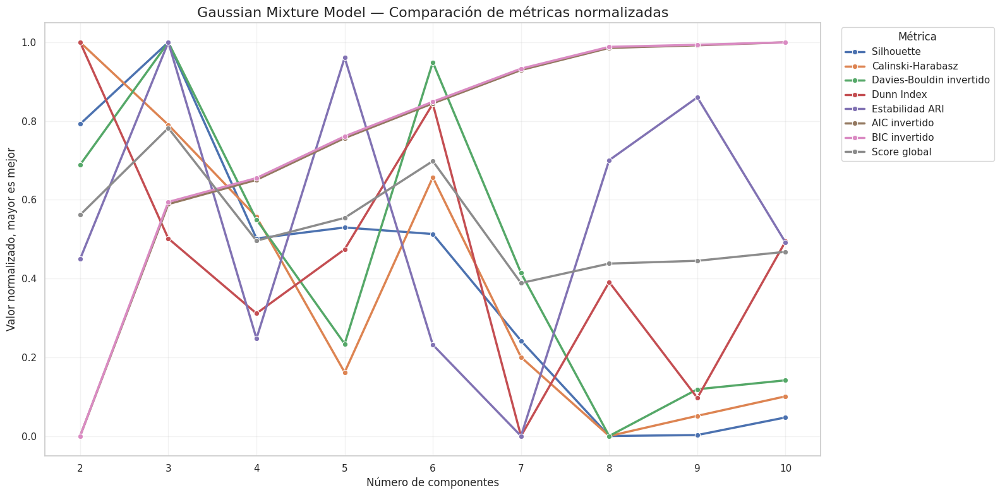


Mejores configuraciones GMM según cada criterio:


,Criterio,Componentes_recomendados,Valor
0,Mayor Silhouette,3,0.30
1,Mayor Calinski-Harabasz,2,"1,319.15"
2,Menor Davies-Bouldin,3,1.28
3,Mayor Dunn Index,2,0.03
4,Mayor Stability ARI,3,0.99
5,Menor AIC,10,"-91,574.48"
6,Menor BIC,10,"-89,796.26"
7,Mayor Score Global Normalizado,3,0.78



Modelo GMM candidato entrenado con 3 componentes.

Tamaño de clusters GMM candidato:


,Cluster_GMM,Clientes,Porcentaje
0,0,514,11.87
1,1,983,22.70
2,2,2834,65.44


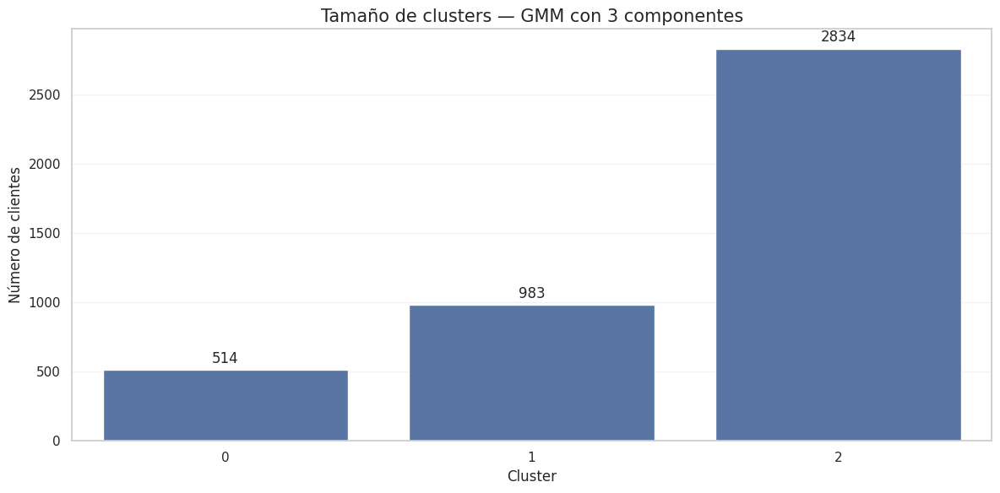


Perfil medio de clusters GMM:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_GMM,,,,,,,,,
0,514,11.87,990.64,442.77,2.25,39.88,0.12,0.82,1.00
1,983,22.70,"5,608.31",428.16,10.70,127.24,0.02,0.28,0.96
2,2834,65.44,792.59,337.40,2.35,42.50,0.00,0.00,0.00


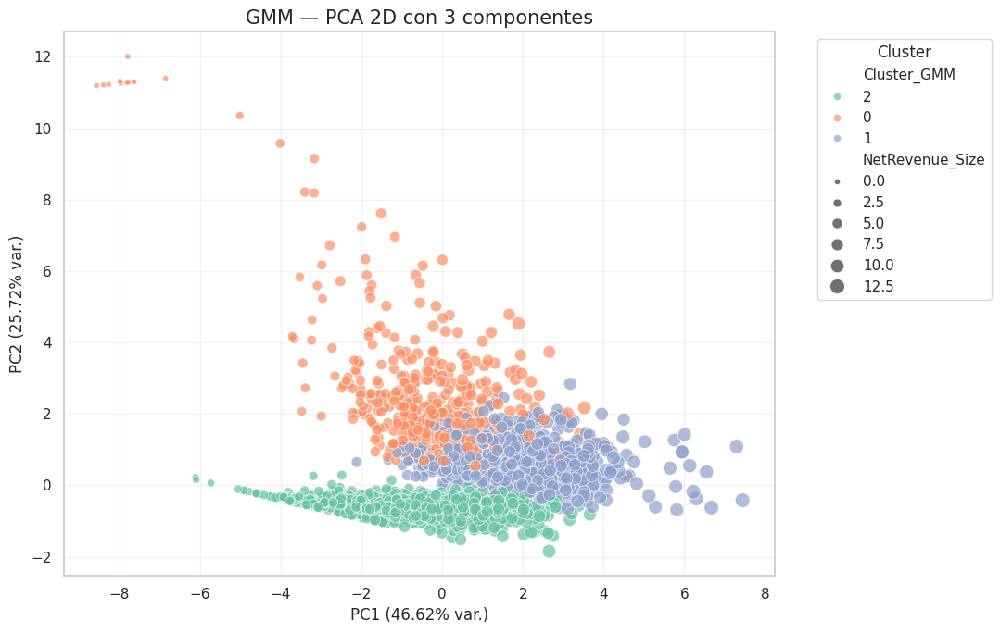

In [39]:
# ============================================================
# CELDA 30 — GAUSSIAN MIXTURE MODEL
# Evaluación completa + PCA 2D del modelo candidato
# ============================================================

from sklearn.mixture import GaussianMixture
from sklearn.metrics import adjusted_rand_score, pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Dunn = distancia mínima entre clusters / diámetro máximo intracluster.
    Valores más altos indican clusters más separados y compactos.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Función de estabilidad para GMM
# ------------------------------------------------------------
def stability_score_gmm(
    X,
    n_components,
    covariance_type="full",
    n_iter=5,
    sample_frac=0.8,
    random_state=42
):
    """
    Calcula estabilidad mediante Adjusted Rand Index.
    Compara el modelo entrenado con todo el dataset frente a modelos
    reentrenados sobre submuestras.
    """
    rng = np.random.default_rng(random_state)
    X_df = pd.DataFrame(X).copy()

    modelo_full = GaussianMixture(
        n_components=n_components,
        covariance_type=covariance_type,
        random_state=random_state,
        n_init=5,
        max_iter=500
    )

    labels_full = modelo_full.fit_predict(X_df)

    ari_scores = []
    n_sample = int(len(X_df) * sample_frac)

    for i in range(n_iter):
        sample_idx = rng.choice(
            X_df.index,
            size=n_sample,
            replace=False
        )

        X_sample = X_df.loc[sample_idx]

        modelo_sample = GaussianMixture(
            n_components=n_components,
            covariance_type=covariance_type,
            random_state=random_state + i + 1,
            n_init=5,
            max_iter=500
        )

        labels_sample = modelo_sample.fit_predict(X_sample)
        labels_full_sample = labels_full[X_df.index.get_indexer(sample_idx)]

        ari = adjusted_rand_score(labels_full_sample, labels_sample)
        ari_scores.append(ari)

    return np.mean(ari_scores)


# ------------------------------------------------------------
# 3. Evaluación de GMM para componentes de 2 a 10
# ------------------------------------------------------------
rango_componentes = range(2, 11)

resultados_gmm = []

for n in rango_componentes:
    gmm = GaussianMixture(
        n_components=n,
        covariance_type="full",
        random_state=42,
        n_init=10,
        max_iter=500
    )

    labels = gmm.fit_predict(X_scaled_standard)

    resultados_gmm.append({
        "Modelo": "GaussianMixture",
        "Componentes": n,
        "Clusters_detectados": len(np.unique(labels)),
        "Silhouette": silhouette_score(X_scaled_standard, labels),
        "Calinski_Harabasz": calinski_harabasz_score(X_scaled_standard, labels),
        "Davies_Bouldin": davies_bouldin_score(X_scaled_standard, labels),
        "Dunn_Index": dunn_index_sampled(
            X_scaled_standard,
            labels,
            sample_size=1500,
            random_state=42
        ),
        "Stability_ARI": stability_score_gmm(
            X_scaled_standard,
            n_components=n,
            covariance_type="full",
            n_iter=5,
            sample_frac=0.8,
            random_state=42
        ),
        "AIC": gmm.aic(X_scaled_standard),
        "BIC": gmm.bic(X_scaled_standard),
        "Converged": gmm.converged_
    })

resultados_gmm_df = pd.DataFrame(resultados_gmm)

print("Resultados ampliados de evaluación — Gaussian Mixture Model:")
display(resultados_gmm_df)


# ------------------------------------------------------------
# 4. Normalización de métricas
# ------------------------------------------------------------
metricas_mayor_mejor_gmm = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index",
    "Stability_ARI"
]

metricas_menor_mejor_gmm = [
    "Davies_Bouldin",
    "AIC",
    "BIC"
]

resultados_gmm_norm = resultados_gmm_df.copy()
scaler_norm = MinMaxScaler()

# Mayor es mejor
resultados_gmm_norm[[m + "_Norm" for m in metricas_mayor_mejor_gmm]] = (
    scaler_norm.fit_transform(resultados_gmm_norm[metricas_mayor_mejor_gmm])
)

# Menor es mejor: normalizar e invertir
for metrica in metricas_menor_mejor_gmm:
    valores_norm = scaler_norm.fit_transform(resultados_gmm_norm[[metrica]])
    resultados_gmm_norm[metrica + "_Norm"] = 1 - valores_norm

columnas_norm_gmm = [
    col for col in resultados_gmm_norm.columns
    if col.endswith("_Norm")
]

resultados_gmm_norm["Score_Global_Normalizado"] = (
    resultados_gmm_norm[columnas_norm_gmm].mean(axis=1)
)

print("\nResultados GMM con métricas normalizadas:")
display(
    resultados_gmm_norm[
        [
            "Componentes",
            "Silhouette_Norm",
            "Calinski_Harabasz_Norm",
            "Davies_Bouldin_Norm",
            "Dunn_Index_Norm",
            "Stability_ARI_Norm",
            "AIC_Norm",
            "BIC_Norm",
            "Score_Global_Normalizado"
        ]
    ]
)


# ------------------------------------------------------------
# 5. Gráfico conjunto de métricas normalizadas
# ------------------------------------------------------------
metricas_norm_plot_gmm = resultados_gmm_norm.melt(
    id_vars="Componentes",
    value_vars=[
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Stability_ARI_Norm",
        "AIC_Norm",
        "BIC_Norm",
        "Score_Global_Normalizado"
    ],
    var_name="Metrica",
    value_name="Valor_Normalizado"
)

nombres_metricas_gmm = {
    "Silhouette_Norm": "Silhouette",
    "Calinski_Harabasz_Norm": "Calinski-Harabasz",
    "Davies_Bouldin_Norm": "Davies-Bouldin invertido",
    "Dunn_Index_Norm": "Dunn Index",
    "Stability_ARI_Norm": "Estabilidad ARI",
    "AIC_Norm": "AIC invertido",
    "BIC_Norm": "BIC invertido",
    "Score_Global_Normalizado": "Score global"
}

metricas_norm_plot_gmm["Metrica"] = (
    metricas_norm_plot_gmm["Metrica"].map(nombres_metricas_gmm)
)

plt.figure(figsize=(16, 8))

sns.lineplot(
    data=metricas_norm_plot_gmm,
    x="Componentes",
    y="Valor_Normalizado",
    hue="Metrica",
    marker="o",
    linewidth=2.5
)

plt.title("Gaussian Mixture Model — Comparación de métricas normalizadas", fontsize=16)
plt.xlabel("Número de componentes")
plt.ylabel("Valor normalizado, mayor es mejor")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.25)
plt.legend(title="Métrica", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Mejores configuraciones según cada criterio
# ------------------------------------------------------------
mejores_gmm = pd.DataFrame({
    "Criterio": [
        "Mayor Silhouette",
        "Mayor Calinski-Harabasz",
        "Menor Davies-Bouldin",
        "Mayor Dunn Index",
        "Mayor Stability ARI",
        "Menor AIC",
        "Menor BIC",
        "Mayor Score Global Normalizado"
    ],
    "Componentes_recomendados": [
        resultados_gmm_df.loc[resultados_gmm_df["Silhouette"].idxmax(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["Calinski_Harabasz"].idxmax(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["Davies_Bouldin"].idxmin(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["Dunn_Index"].idxmax(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["Stability_ARI"].idxmax(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["AIC"].idxmin(), "Componentes"],
        resultados_gmm_df.loc[resultados_gmm_df["BIC"].idxmin(), "Componentes"],
        resultados_gmm_norm.loc[
            resultados_gmm_norm["Score_Global_Normalizado"].idxmax(),
            "Componentes"
        ]
    ],
    "Valor": [
        resultados_gmm_df["Silhouette"].max(),
        resultados_gmm_df["Calinski_Harabasz"].max(),
        resultados_gmm_df["Davies_Bouldin"].min(),
        resultados_gmm_df["Dunn_Index"].max(),
        resultados_gmm_df["Stability_ARI"].max(),
        resultados_gmm_df["AIC"].min(),
        resultados_gmm_df["BIC"].min(),
        resultados_gmm_norm["Score_Global_Normalizado"].max()
    ]
})

print("\nMejores configuraciones GMM según cada criterio:")
display(mejores_gmm)


# ------------------------------------------------------------
# 7. Entrenar modelo GMM candidato principal
# ------------------------------------------------------------
componentes_candidato_gmm = int(
    resultados_gmm_norm.loc[
        resultados_gmm_norm["Score_Global_Normalizado"].idxmax(),
        "Componentes"
    ]
)

gmm_final_candidato = GaussianMixture(
    n_components=componentes_candidato_gmm,
    covariance_type="full",
    random_state=42,
    n_init=10,
    max_iter=500
)

labels_gmm_candidato = gmm_final_candidato.fit_predict(X_scaled_standard)

clientes_gmm = clientes_modelo_final.copy()
clientes_gmm["Cluster_GMM"] = labels_gmm_candidato

print(f"\nModelo GMM candidato entrenado con {componentes_candidato_gmm} componentes.")


# ------------------------------------------------------------
# 8. Tamaño de clusters
# ------------------------------------------------------------
resumen_tamanos_gmm = (
    clientes_gmm["Cluster_GMM"]
    .value_counts()
    .sort_index()
    .reset_index()
)

resumen_tamanos_gmm.columns = ["Cluster_GMM", "Clientes"]
resumen_tamanos_gmm["Porcentaje"] = (
    resumen_tamanos_gmm["Clientes"] / len(clientes_gmm) * 100
).round(2)

print("\nTamaño de clusters GMM candidato:")
display(resumen_tamanos_gmm)

plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=resumen_tamanos_gmm,
    x="Cluster_GMM",
    y="Clientes"
)

plt.title(
    f"Tamaño de clusters — GMM con {componentes_candidato_gmm} componentes",
    fontsize=15
)
plt.xlabel("Cluster")
plt.ylabel("Número de clientes")
plt.grid(axis="y", alpha=0.25)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. Perfil medio de clusters GMM
# ------------------------------------------------------------
variables_perfil_gmm = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

perfil_gmm = (
    clientes_gmm
    .groupby("Cluster_GMM")[variables_perfil_gmm]
    .mean()
    .round(2)
)

perfil_gmm["Clientes"] = (
    clientes_gmm["Cluster_GMM"]
    .value_counts()
    .sort_index()
)

perfil_gmm["Porcentaje"] = (
    perfil_gmm["Clientes"] / len(clientes_gmm) * 100
).round(2)

perfil_gmm = perfil_gmm[
    ["Clientes", "Porcentaje"] + variables_perfil_gmm
]

print("\nPerfil medio de clusters GMM:")
display(perfil_gmm)


# ------------------------------------------------------------
# 10. Visualización PCA 2D del candidato GMM
# ------------------------------------------------------------
pca_gmm = PCA(n_components=2, random_state=42)
X_pca_gmm = pca_gmm.fit_transform(X_scaled_standard)

pca_gmm_df = pd.DataFrame(
    X_pca_gmm,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_gmm_df["Cluster_GMM"] = clientes_gmm["Cluster_GMM"].astype(str).values
pca_gmm_df["NetRevenue_Size"] = np.log1p(clientes_gmm["NetRevenue"].values)

var_pca_gmm = pca_gmm.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_gmm_df,
    x="PC1",
    y="PC2",
    hue="Cluster_GMM",
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette="Set2"
)

plt.title(
    f"GMM — PCA 2D con {componentes_candidato_gmm} componentes",
    fontsize=15
)
plt.xlabel(f"PC1 ({var_pca_gmm[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_gmm[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

Gaussian Mixture Model

Tras evaluar K-Means, se entrenó un modelo Gaussian Mixture Model con diferentes números de componentes, entre 2 y 10. Este modelo permite representar los datos como una combinación de distribuciones gaussianas, lo que ofrece mayor flexibilidad que K-Means cuando los clusters no son completamente esféricos.

Todos los modelos evaluados convergieron correctamente. La mejor configuración global fue la de 3 componentes, que obtuvo el mayor silhouette score, con 0,30, el menor índice Davies-Bouldin, con 1,28, la mayor estabilidad ARI, con 0,99, y el mayor score global normalizado, con 0,78.

Aunque los criterios AIC y BIC mejoraron al aumentar el número de componentes, esta tendencia debe interpretarse con cautela, ya que una mayor complejidad del modelo no siempre implica una segmentación más útil desde el punto de vista de negocio. En problemas de segmentación de clientes, la interpretabilidad y la estabilidad de los grupos son criterios fundamentales.

La solución GMM con 3 componentes generó tres segmentos: uno de 514 clientes, equivalente al 11,87%; otro de 983 clientes, equivalente al 22,70%; y un grupo mayoritario de 2.834 clientes, equivalente al 65,44%. Esta segmentación resulta estable, pero menos granular que la obtenida con K-Means K=4.

En comparación con K-Means, el modelo GMM presentó menor silhouette score y peor índice Davies-Bouldin, por lo que se mantiene como alternativa válida, pero no como modelo principal en esta fase del análisis.

Resultados ampliados de evaluación — Agglomerative Clustering:


,Modelo,K,Clusters_detectados,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI
0,Agglomerative,2,2,0.29,"1,548.76",1.29,0.01,0.52
1,Agglomerative,3,3,0.34,"1,501.33",1.22,0.01,0.73
2,Agglomerative,4,4,0.34,"1,381.68",0.95,0.02,0.68
3,Agglomerative,5,5,0.22,"1,395.67",1.03,0.01,0.57
4,Agglomerative,6,6,0.22,"1,318.79",1.04,0.01,0.57
5,Agglomerative,7,7,0.22,"1,302.12",1.13,0.01,0.52
6,Agglomerative,8,8,0.21,"1,254.44",1.27,0.01,0.51
7,Agglomerative,9,9,0.19,"1,205.73",1.23,0.01,0.47
8,Agglomerative,10,10,0.18,"1,166.33",1.21,0.01,0.47



Resultados Agglomerative con métricas normalizadas:


,K,Silhouette_Norm,Calinski_Harabasz_Norm,Davies_Bouldin_Norm,Dunn_Index_Norm,Stability_ARI_Norm,Score_Global_Normalizado
0,2,0.71,1.00,0.00,0.26,0.19,0.43
1,3,0.98,0.88,0.20,0.55,1.00,0.72
2,4,1.00,0.56,1.00,1.00,0.80,0.87
3,5,0.25,0.60,0.77,0.00,0.38,0.40
4,6,0.29,0.40,0.74,0.18,0.39,0.40
5,7,0.24,0.36,0.46,0.21,0.19,0.29
6,8,0.22,0.23,0.05,0.21,0.17,0.18
7,9,0.11,0.10,0.16,0.21,0.01,0.12
8,10,0.00,0.00,0.21,0.21,0.00,0.08


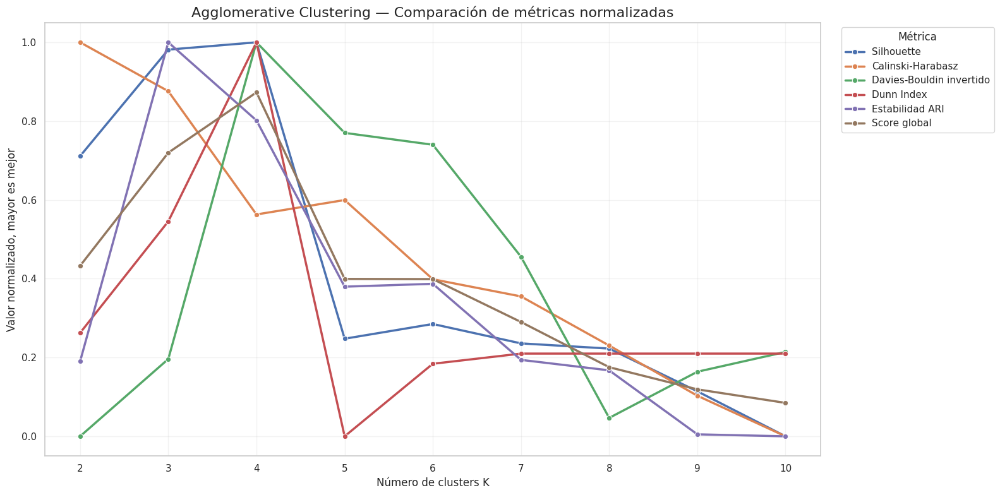


Mejores configuraciones Agglomerative según cada criterio:


,Criterio,K_recomendado,Valor
0,Mayor Silhouette,4,0.34
1,Mayor Calinski-Harabasz,2,"1,548.76"
2,Menor Davies-Bouldin,4,0.95
3,Mayor Dunn Index,4,0.02
4,Mayor Stability ARI,3,0.73
5,Mayor Score Global Normalizado,4,0.87



Modelo Agglomerative candidato entrenado con K=4.

Tamaño de clusters Agglomerative candidato:


,Cluster_Agglomerative,Clientes,Porcentaje
0,0,2425,55.99
1,1,1484,34.26
2,2,410,9.47
3,3,12,0.28


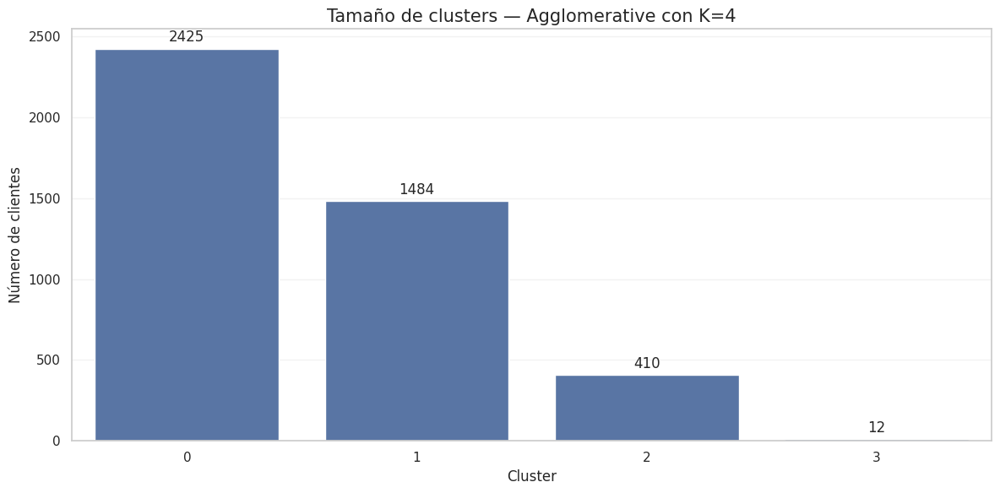


Perfil medio de clusters Agglomerative:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_Agglomerative,,,,,,,,,
0,2425,55.99,512.30,308.75,1.81,30.99,0.00,0.00,0.00
1,1484,34.26,"4,548.21",497.26,8.72,121.19,0.02,0.25,0.70
2,410,9.47,674.32,287.83,2.43,26.42,0.11,0.79,1.00
3,12,0.28,0.00,0.00,1.17,15.33,1.00,1.04,1.00


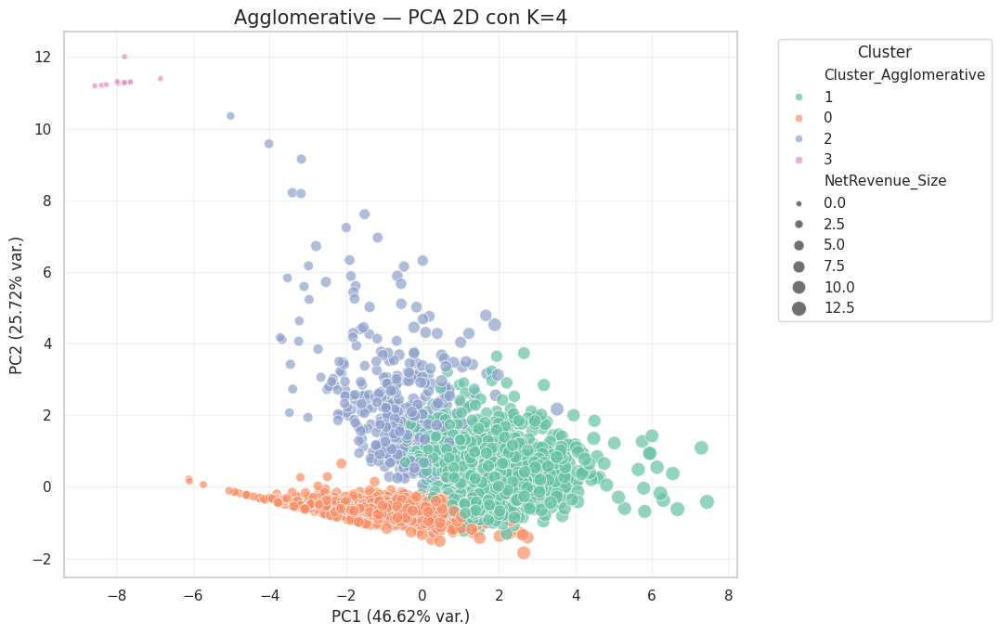

In [40]:
# ============================================================
# CELDA 31 — AGGLOMERATIVE CLUSTERING
# Evaluación completa + PCA 2D del modelo candidato
# ============================================================

from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import adjusted_rand_score, pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Dunn = distancia mínima entre clusters / diámetro máximo intracluster.
    Valores más altos indican clusters más separados y compactos.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Función de estabilidad para Agglomerative
# ------------------------------------------------------------
def stability_score_agglomerative(
    X,
    n_clusters,
    linkage="ward",
    n_iter=5,
    sample_frac=0.8,
    random_state=42
):
    """
    Calcula estabilidad mediante Adjusted Rand Index.
    Compara etiquetas del modelo completo con etiquetas obtenidas
    al reentrenar Agglomerative sobre submuestras.
    """
    rng = np.random.default_rng(random_state)
    X_df = pd.DataFrame(X).copy()

    modelo_full = AgglomerativeClustering(
        n_clusters=n_clusters,
        linkage=linkage
    )

    labels_full = modelo_full.fit_predict(X_df)

    ari_scores = []
    n_sample = int(len(X_df) * sample_frac)

    for i in range(n_iter):
        sample_idx = rng.choice(
            X_df.index,
            size=n_sample,
            replace=False
        )

        X_sample = X_df.loc[sample_idx]

        modelo_sample = AgglomerativeClustering(
            n_clusters=n_clusters,
            linkage=linkage
        )

        labels_sample = modelo_sample.fit_predict(X_sample)
        labels_full_sample = labels_full[X_df.index.get_indexer(sample_idx)]

        ari = adjusted_rand_score(labels_full_sample, labels_sample)
        ari_scores.append(ari)

    return np.mean(ari_scores)


# ------------------------------------------------------------
# 3. Evaluación Agglomerative para K de 2 a 10
# ------------------------------------------------------------
rango_k_agglomerative = range(2, 11)

resultados_agglomerative = []

for k in rango_k_agglomerative:
    agglomerative = AgglomerativeClustering(
        n_clusters=k,
        linkage="ward"
    )

    labels = agglomerative.fit_predict(X_scaled_standard)

    resultados_agglomerative.append({
        "Modelo": "Agglomerative",
        "K": k,
        "Clusters_detectados": len(np.unique(labels)),
        "Silhouette": silhouette_score(X_scaled_standard, labels),
        "Calinski_Harabasz": calinski_harabasz_score(X_scaled_standard, labels),
        "Davies_Bouldin": davies_bouldin_score(X_scaled_standard, labels),
        "Dunn_Index": dunn_index_sampled(
            X_scaled_standard,
            labels,
            sample_size=1500,
            random_state=42
        ),
        "Stability_ARI": stability_score_agglomerative(
            X_scaled_standard,
            n_clusters=k,
            linkage="ward",
            n_iter=5,
            sample_frac=0.8,
            random_state=42
        )
    })

resultados_agglomerative_df = pd.DataFrame(resultados_agglomerative)

print("Resultados ampliados de evaluación — Agglomerative Clustering:")
display(resultados_agglomerative_df)


# ------------------------------------------------------------
# 4. Normalización de métricas
# ------------------------------------------------------------
metricas_mayor_mejor_agg = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index",
    "Stability_ARI"
]

metricas_menor_mejor_agg = [
    "Davies_Bouldin"
]

resultados_agg_norm = resultados_agglomerative_df.copy()
scaler_norm = MinMaxScaler()

# Mayor es mejor
resultados_agg_norm[[m + "_Norm" for m in metricas_mayor_mejor_agg]] = (
    scaler_norm.fit_transform(resultados_agg_norm[metricas_mayor_mejor_agg])
)

# Menor es mejor: normalizar e invertir
for metrica in metricas_menor_mejor_agg:
    valores_norm = scaler_norm.fit_transform(resultados_agg_norm[[metrica]])
    resultados_agg_norm[metrica + "_Norm"] = 1 - valores_norm

columnas_norm_agg = [
    col for col in resultados_agg_norm.columns
    if col.endswith("_Norm")
]

resultados_agg_norm["Score_Global_Normalizado"] = (
    resultados_agg_norm[columnas_norm_agg].mean(axis=1)
)

print("\nResultados Agglomerative con métricas normalizadas:")
display(
    resultados_agg_norm[
        [
            "K",
            "Silhouette_Norm",
            "Calinski_Harabasz_Norm",
            "Davies_Bouldin_Norm",
            "Dunn_Index_Norm",
            "Stability_ARI_Norm",
            "Score_Global_Normalizado"
        ]
    ]
)


# ------------------------------------------------------------
# 5. Gráfico conjunto de métricas normalizadas
# ------------------------------------------------------------
metricas_norm_plot_agg = resultados_agg_norm.melt(
    id_vars="K",
    value_vars=[
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Stability_ARI_Norm",
        "Score_Global_Normalizado"
    ],
    var_name="Metrica",
    value_name="Valor_Normalizado"
)

nombres_metricas_agg = {
    "Silhouette_Norm": "Silhouette",
    "Calinski_Harabasz_Norm": "Calinski-Harabasz",
    "Davies_Bouldin_Norm": "Davies-Bouldin invertido",
    "Dunn_Index_Norm": "Dunn Index",
    "Stability_ARI_Norm": "Estabilidad ARI",
    "Score_Global_Normalizado": "Score global"
}

metricas_norm_plot_agg["Metrica"] = (
    metricas_norm_plot_agg["Metrica"].map(nombres_metricas_agg)
)

plt.figure(figsize=(16, 8))

sns.lineplot(
    data=metricas_norm_plot_agg,
    x="K",
    y="Valor_Normalizado",
    hue="Metrica",
    marker="o",
    linewidth=2.5
)

plt.title("Agglomerative Clustering — Comparación de métricas normalizadas", fontsize=16)
plt.xlabel("Número de clusters K")
plt.ylabel("Valor normalizado, mayor es mejor")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.25)
plt.legend(title="Métrica", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Mejores configuraciones según cada criterio
# ------------------------------------------------------------
mejores_agglomerative = pd.DataFrame({
    "Criterio": [
        "Mayor Silhouette",
        "Mayor Calinski-Harabasz",
        "Menor Davies-Bouldin",
        "Mayor Dunn Index",
        "Mayor Stability ARI",
        "Mayor Score Global Normalizado"
    ],
    "K_recomendado": [
        resultados_agglomerative_df.loc[resultados_agglomerative_df["Silhouette"].idxmax(), "K"],
        resultados_agglomerative_df.loc[resultados_agglomerative_df["Calinski_Harabasz"].idxmax(), "K"],
        resultados_agglomerative_df.loc[resultados_agglomerative_df["Davies_Bouldin"].idxmin(), "K"],
        resultados_agglomerative_df.loc[resultados_agglomerative_df["Dunn_Index"].idxmax(), "K"],
        resultados_agglomerative_df.loc[resultados_agglomerative_df["Stability_ARI"].idxmax(), "K"],
        resultados_agg_norm.loc[
            resultados_agg_norm["Score_Global_Normalizado"].idxmax(),
            "K"
        ]
    ],
    "Valor": [
        resultados_agglomerative_df["Silhouette"].max(),
        resultados_agglomerative_df["Calinski_Harabasz"].max(),
        resultados_agglomerative_df["Davies_Bouldin"].min(),
        resultados_agglomerative_df["Dunn_Index"].max(),
        resultados_agglomerative_df["Stability_ARI"].max(),
        resultados_agg_norm["Score_Global_Normalizado"].max()
    ]
})

print("\nMejores configuraciones Agglomerative según cada criterio:")
display(mejores_agglomerative)


# ------------------------------------------------------------
# 7. Entrenar modelo Agglomerative candidato principal
# ------------------------------------------------------------
k_candidato_agg = int(
    resultados_agg_norm.loc[
        resultados_agg_norm["Score_Global_Normalizado"].idxmax(),
        "K"
    ]
)

agg_final_candidato = AgglomerativeClustering(
    n_clusters=k_candidato_agg,
    linkage="ward"
)

labels_agg_candidato = agg_final_candidato.fit_predict(X_scaled_standard)

clientes_agglomerative = clientes_modelo_final.copy()
clientes_agglomerative["Cluster_Agglomerative"] = labels_agg_candidato

print(f"\nModelo Agglomerative candidato entrenado con K={k_candidato_agg}.")


# ------------------------------------------------------------
# 8. Tamaño de clusters
# ------------------------------------------------------------
resumen_tamanos_agg = (
    clientes_agglomerative["Cluster_Agglomerative"]
    .value_counts()
    .sort_index()
    .reset_index()
)

resumen_tamanos_agg.columns = ["Cluster_Agglomerative", "Clientes"]
resumen_tamanos_agg["Porcentaje"] = (
    resumen_tamanos_agg["Clientes"] / len(clientes_agglomerative) * 100
).round(2)

print("\nTamaño de clusters Agglomerative candidato:")
display(resumen_tamanos_agg)

plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=resumen_tamanos_agg,
    x="Cluster_Agglomerative",
    y="Clientes"
)

plt.title(
    f"Tamaño de clusters — Agglomerative con K={k_candidato_agg}",
    fontsize=15
)
plt.xlabel("Cluster")
plt.ylabel("Número de clientes")
plt.grid(axis="y", alpha=0.25)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. Perfil medio de clusters Agglomerative
# ------------------------------------------------------------
variables_perfil_agg = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

perfil_agg = (
    clientes_agglomerative
    .groupby("Cluster_Agglomerative")[variables_perfil_agg]
    .mean()
    .round(2)
)

perfil_agg["Clientes"] = (
    clientes_agglomerative["Cluster_Agglomerative"]
    .value_counts()
    .sort_index()
)

perfil_agg["Porcentaje"] = (
    perfil_agg["Clientes"] / len(clientes_agglomerative) * 100
).round(2)

perfil_agg = perfil_agg[
    ["Clientes", "Porcentaje"] + variables_perfil_agg
]

print("\nPerfil medio de clusters Agglomerative:")
display(perfil_agg)


# ------------------------------------------------------------
# 10. Visualización PCA 2D del candidato Agglomerative
# ------------------------------------------------------------
pca_agg = PCA(n_components=2, random_state=42)
X_pca_agg = pca_agg.fit_transform(X_scaled_standard)

pca_agg_df = pd.DataFrame(
    X_pca_agg,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_agg_df["Cluster_Agglomerative"] = (
    clientes_agglomerative["Cluster_Agglomerative"]
    .astype(str)
    .values
)

pca_agg_df["NetRevenue_Size"] = np.log1p(clientes_agglomerative["NetRevenue"].values)

var_pca_agg = pca_agg.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_agg_df,
    x="PC1",
    y="PC2",
    hue="Cluster_Agglomerative",
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette="Set2"
)

plt.title(
    f"Agglomerative — PCA 2D con K={k_candidato_agg}",
    fontsize=15
)
plt.xlabel(f"PC1 ({var_pca_agg[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_agg[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

Agglomerative Clustering

Se evaluó un modelo de clustering jerárquico aglomerativo utilizando valores de K entre 2 y 10. Este algoritmo construye los grupos de forma progresiva, fusionando observaciones según su similitud. En este caso se utilizó el enlace ward, orientado a minimizar la varianza interna de los clusters.

La mejor configuración global fue K=4. Este valor obtuvo el mayor silhouette score, con 0,34, el menor índice Davies-Bouldin, con 0,95, el mayor Dunn Index y el mayor score global normalizado, con 0,87. Aunque la mayor estabilidad ARI se obtuvo con K=3, el conjunto de métricas favoreció la solución de cuatro clusters.

La distribución de clientes en Agglomerative K=4 fue de 2.425 clientes en el cluster 0, 1.484 clientes en el cluster 1, 410 clientes en el cluster 2 y 12 clientes en el cluster 3. Esta estructura muestra dos segmentos principales, un grupo intermedio y un pequeño grupo de clientes extremos.

Comparado con K-Means, Agglomerative presentó un índice Davies-Bouldin ligeramente mejor, lo que indica una buena separación relativa entre clusters. No obstante, K-Means mostró una mayor estabilidad y una segmentación más equilibrada desde el punto de vista operativo. Por tanto, Agglomerative se mantiene como modelo competitivo, aunque no desplaza todavía a K-Means como candidato principal.

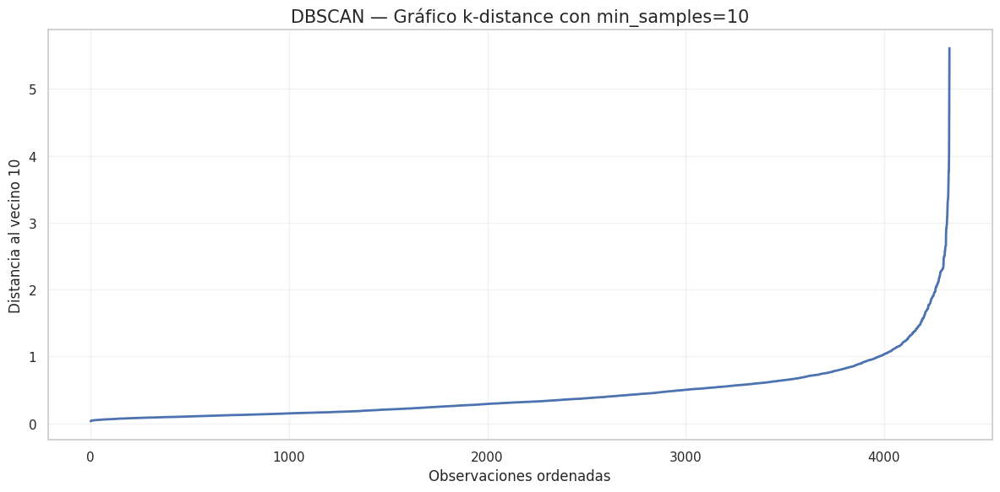

Resultados completos DBSCAN:


,Modelo,eps,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index
0,DBSCAN,0.30,5,33,1425,32.90,-0.01,154.20,1.06,0.03
1,DBSCAN,0.30,10,15,1914,44.19,0.05,198.55,1.44,0.02
2,DBSCAN,0.30,15,12,2240,51.72,0.04,181.70,1.19,0.02
3,DBSCAN,0.30,20,4,2543,58.72,0.11,233.44,1.97,0.08
4,DBSCAN,0.35,5,31,1190,27.48,-0.01,206.01,1.21,0.04
...,...,...,...,...,...,...,...,...,...,...
135,DBSCAN,1.95,20,1,59,1.36,NaN,NaN,NaN,NaN
136,DBSCAN,2.00,5,2,12,0.28,0.81,521.44,0.19,0.61
137,DBSCAN,2.00,10,2,19,0.44,0.81,529.08,0.19,0.64
138,DBSCAN,2.00,15,1,46,1.06,NaN,NaN,NaN,NaN



Configuraciones DBSCAN válidas:


,Modelo,eps,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index
4,DBSCAN,0.35,5,31,1190,27.48,-0.01,206.01,1.21,0.04
8,DBSCAN,0.40,5,27,964,22.26,0.02,210.21,1.17,0.04
12,DBSCAN,0.45,5,16,820,18.93,0.04,325.44,1.26,0.05
13,DBSCAN,0.45,10,8,1140,26.32,0.08,490.25,1.47,0.04
16,DBSCAN,0.50,5,12,663,15.31,0.05,294.99,1.04,0.06
17,DBSCAN,0.50,10,7,980,22.63,0.13,403.23,0.95,0.06
18,DBSCAN,0.50,15,4,1159,26.76,0.25,738.49,1.02,0.11
20,DBSCAN,0.55,5,7,566,13.07,0.20,518.79,1.10,0.09
21,DBSCAN,0.55,10,8,755,17.43,0.08,395.27,1.10,0.02
22,DBSCAN,0.55,15,5,966,22.30,0.17,581.33,1.04,0.08



Configuraciones DBSCAN válidas con score normalizado:


,Modelo,eps,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Silhouette_Norm,Calinski_Harabasz_Norm,Dunn_Index_Norm,Davies_Bouldin_Norm,Ruido_Penalizacion,Score_Global_Normalizado
77,DBSCAN,1.25,10,2,121,2.79,0.82,553.10,0.17,1.15,1.00,0.62,1.00,1.00,0.76,0.88
64,DBSCAN,1.10,5,2,121,2.79,0.82,551.39,0.17,1.09,1.00,0.61,0.95,1.00,0.76,0.87
81,DBSCAN,1.30,10,2,116,2.68,0.82,550.11,0.17,1.03,1.00,0.61,0.90,1.00,0.76,0.85
105,DBSCAN,1.60,10,2,68,1.57,0.82,571.99,0.18,1.03,1.00,0.65,0.90,0.99,0.72,0.85
72,DBSCAN,1.20,5,2,107,2.47,0.82,545.93,0.17,1.01,1.00,0.60,0.88,1.00,0.75,0.85
85,DBSCAN,1.35,10,2,99,2.29,0.82,541.63,0.17,1.02,1.00,0.60,0.89,1.00,0.74,0.84
89,DBSCAN,1.40,10,2,91,2.10,0.82,538.07,0.17,1.02,1.00,0.59,0.89,1.00,0.74,0.84
68,DBSCAN,1.15,5,2,113,2.61,0.82,547.95,0.17,0.97,1.00,0.61,0.84,1.00,0.75,0.84
93,DBSCAN,1.45,10,2,83,1.92,0.82,533.72,0.17,1.02,1.00,0.58,0.89,1.00,0.73,0.84
109,DBSCAN,1.65,10,2,63,1.45,0.82,568.53,0.18,0.88,0.99,0.64,0.77,0.99,0.71,0.82


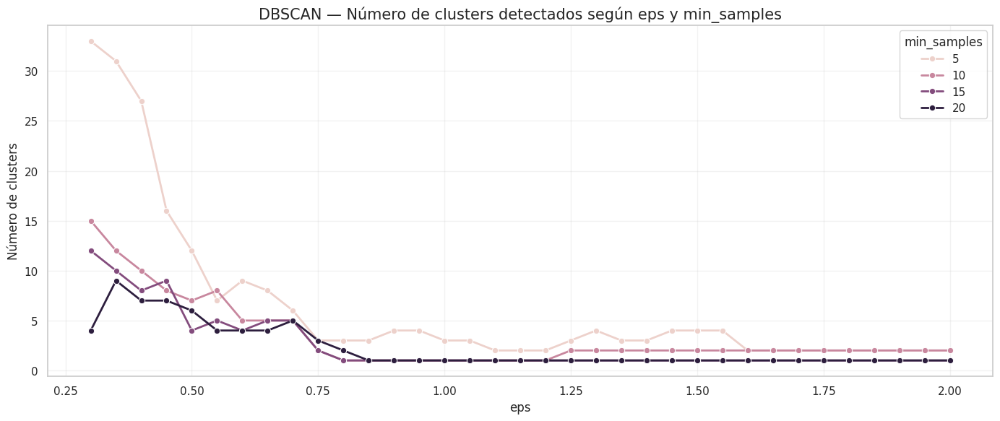

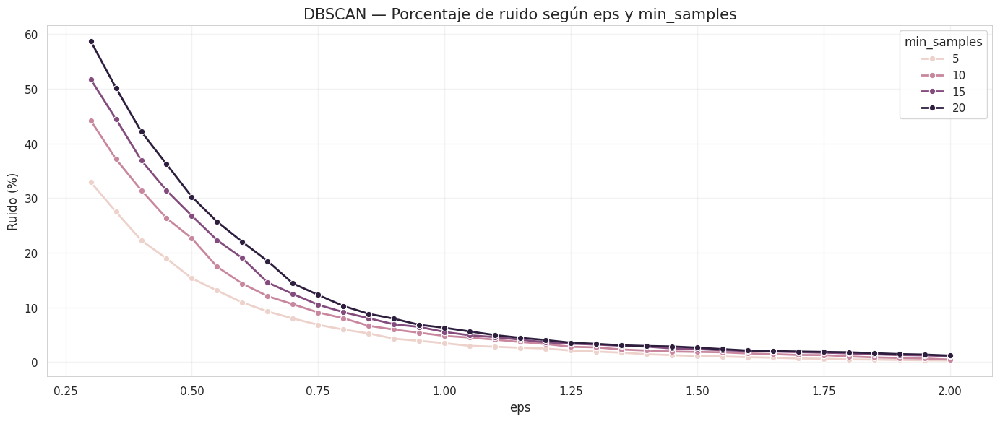


Modelo DBSCAN candidato entrenado con eps=1.25 y min_samples=10.

Tamaño de clusters DBSCAN candidato:


,Cluster_DBSCAN,Clientes,Porcentaje
0,-1,121,2.79
1,0,4199,96.95
2,1,11,0.25


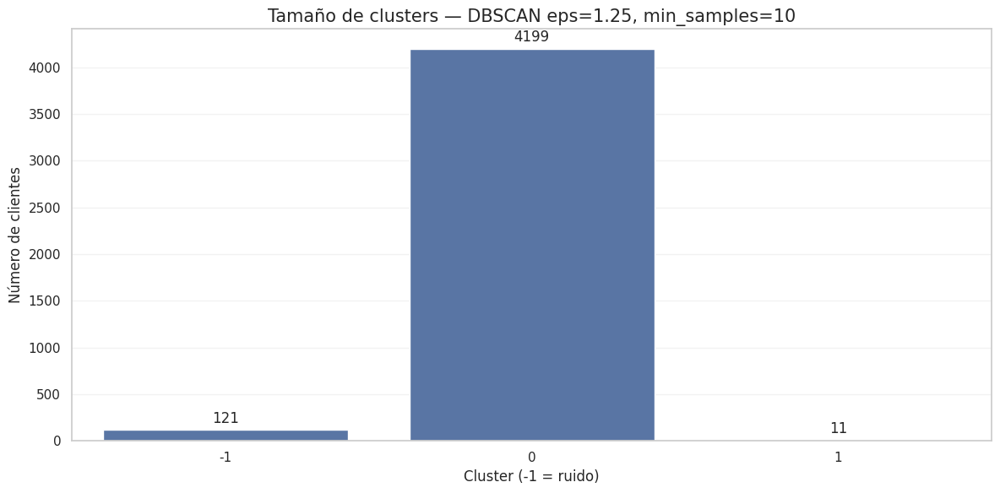


Perfil medio de clusters DBSCAN:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_DBSCAN,,,,,,,,,
-1,121,2.79,"18,633.30","1,173.16",16.51,146.52,0.22,0.62,0.88
0,4199,96.95,"1,432.18",348.35,3.89,59.11,0.01,0.15,0.32
1,11,0.25,0.00,0.00,1.18,7.55,1.00,1.05,1.00


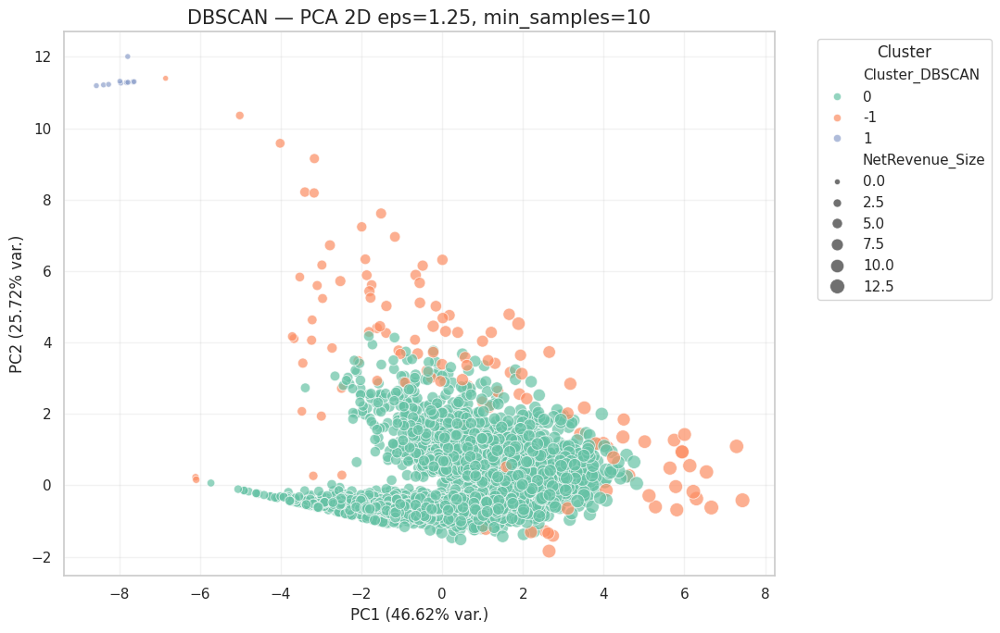

In [42]:
# ============================================================
# CELDA 32 — DBSCAN
# Evaluación completa con búsqueda de eps y min_samples
# ============================================================

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Ignora el ruido (-1) si existe.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    # Ignorar ruido
    mask = labels_array != -1
    X_array = X_array[mask]
    labels_array = labels_array[mask]

    if len(X_array) == 0:
        return np.nan

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Gráfico k-distance para orientar eps
# ------------------------------------------------------------
min_samples_ref = 10

neighbors = NearestNeighbors(n_neighbors=min_samples_ref)
neighbors_fit = neighbors.fit(X_scaled_standard)

distances, indices = neighbors_fit.kneighbors(X_scaled_standard)
distances_sorted = np.sort(distances[:, min_samples_ref - 1])

plt.figure(figsize=(12, 6))

plt.plot(distances_sorted, linewidth=2)
plt.title(f"DBSCAN — Gráfico k-distance con min_samples={min_samples_ref}", fontsize=15)
plt.xlabel("Observaciones ordenadas")
plt.ylabel(f"Distancia al vecino {min_samples_ref}")
plt.grid(True, alpha=0.25)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 3. Búsqueda de hiperparámetros DBSCAN
# ------------------------------------------------------------
eps_values = np.round(np.arange(0.30, 2.05, 0.05), 2)
min_samples_values = [5, 10, 15, 20]

resultados_dbscan = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(
            eps=eps,
            min_samples=min_samples,
            metric="euclidean"
        )

        labels = dbscan.fit_predict(X_scaled_standard)

        labels_array = np.asarray(labels)

        n_ruido = np.sum(labels_array == -1)
        porcentaje_ruido = round(n_ruido / len(labels_array) * 100, 2)

        clusters_validos = sorted([label for label in np.unique(labels_array) if label != -1])
        n_clusters = len(clusters_validos)

        # Métricas solo si hay al menos 2 clusters válidos
        if n_clusters >= 2:
            mask_validos = labels_array != -1
            X_validos = X_scaled_standard[mask_validos]
            labels_validos = labels_array[mask_validos]

            silhouette = silhouette_score(X_validos, labels_validos)
            calinski = calinski_harabasz_score(X_validos, labels_validos)
            davies = davies_bouldin_score(X_validos, labels_validos)
            dunn = dunn_index_sampled(
                X_scaled_standard,
                labels_array,
                sample_size=1500,
                random_state=42
            )
        else:
            silhouette = np.nan
            calinski = np.nan
            davies = np.nan
            dunn = np.nan

        resultados_dbscan.append({
            "Modelo": "DBSCAN",
            "eps": eps,
            "min_samples": min_samples,
            "Clusters_detectados": n_clusters,
            "Clientes_ruido": n_ruido,
            "Porcentaje_ruido": porcentaje_ruido,
            "Silhouette": silhouette,
            "Calinski_Harabasz": calinski,
            "Davies_Bouldin": davies,
            "Dunn_Index": dunn
        })

resultados_dbscan_df = pd.DataFrame(resultados_dbscan)

print("Resultados completos DBSCAN:")
display(resultados_dbscan_df)


# ------------------------------------------------------------
# 4. Filtrar configuraciones útiles
# ------------------------------------------------------------
# Criterios mínimos:
# - al menos 2 clusters
# - no más del 30% de ruido
# - no menos del 1% de ruido, para que aporte detección de outliers
# - evitar soluciones con demasiados clusters pequeños
# ------------------------------------------------------------
resultados_dbscan_validos = resultados_dbscan_df[
    (resultados_dbscan_df["Clusters_detectados"] >= 2) &
    (resultados_dbscan_df["Porcentaje_ruido"] >= 1) &
    (resultados_dbscan_df["Porcentaje_ruido"] <= 30)
].copy()

print("\nConfiguraciones DBSCAN válidas:")
display(resultados_dbscan_validos)


# ------------------------------------------------------------
# 5. Normalización de métricas para elegir candidato
# ------------------------------------------------------------
if not resultados_dbscan_validos.empty:

    metricas_mayor_mejor_dbscan = [
        "Silhouette",
        "Calinski_Harabasz",
        "Dunn_Index"
    ]

    metricas_menor_mejor_dbscan = [
        "Davies_Bouldin"
    ]

    resultados_dbscan_norm = resultados_dbscan_validos.copy()
    scaler_norm = MinMaxScaler()

    resultados_dbscan_norm[[m + "_Norm" for m in metricas_mayor_mejor_dbscan]] = (
        scaler_norm.fit_transform(resultados_dbscan_norm[metricas_mayor_mejor_dbscan])
    )

    for metrica in metricas_menor_mejor_dbscan:
        valores_norm = scaler_norm.fit_transform(resultados_dbscan_norm[[metrica]])
        resultados_dbscan_norm[metrica + "_Norm"] = 1 - valores_norm

    columnas_norm_dbscan = [
        col for col in resultados_dbscan_norm.columns
        if col.endswith("_Norm")
    ]

    # Penalización suave por ruido excesivo: ideal aproximado entre 5% y 20%
    resultados_dbscan_norm["Ruido_Penalizacion"] = (
        1 - (resultados_dbscan_norm["Porcentaje_ruido"] - 10).abs() / 30
    ).clip(lower=0, upper=1)

    resultados_dbscan_norm["Score_Global_Normalizado"] = (
        resultados_dbscan_norm[columnas_norm_dbscan + ["Ruido_Penalizacion"]].mean(axis=1)
    )

    resultados_dbscan_norm = resultados_dbscan_norm.sort_values(
        by="Score_Global_Normalizado",
        ascending=False
    )

    print("\nConfiguraciones DBSCAN válidas con score normalizado:")
    display(resultados_dbscan_norm.head(15))

else:
    print("\nNo se encontraron configuraciones DBSCAN válidas con los criterios definidos.")
    resultados_dbscan_norm = pd.DataFrame()


# ------------------------------------------------------------
# 6. Visualización de resultados por eps y min_samples
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))

sns.lineplot(
    data=resultados_dbscan_df,
    x="eps",
    y="Clusters_detectados",
    hue="min_samples",
    marker="o",
    linewidth=2
)

plt.title("DBSCAN — Número de clusters detectados según eps y min_samples", fontsize=15)
plt.xlabel("eps")
plt.ylabel("Número de clusters")
plt.grid(True, alpha=0.25)
plt.legend(title="min_samples")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 6))

sns.lineplot(
    data=resultados_dbscan_df,
    x="eps",
    y="Porcentaje_ruido",
    hue="min_samples",
    marker="o",
    linewidth=2
)

plt.title("DBSCAN — Porcentaje de ruido según eps y min_samples", fontsize=15)
plt.xlabel("eps")
plt.ylabel("Ruido (%)")
plt.grid(True, alpha=0.25)
plt.legend(title="min_samples")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 7. Entrenar modelo candidato DBSCAN
# ------------------------------------------------------------
if not resultados_dbscan_norm.empty:

    mejor_dbscan = resultados_dbscan_norm.iloc[0]

    eps_candidato = float(mejor_dbscan["eps"])
    min_samples_candidato = int(mejor_dbscan["min_samples"])

    dbscan_final_candidato = DBSCAN(
        eps=eps_candidato,
        min_samples=min_samples_candidato,
        metric="euclidean"
    )

    labels_dbscan_candidato = dbscan_final_candidato.fit_predict(X_scaled_standard)

    clientes_dbscan = clientes_modelo_final.copy()
    clientes_dbscan["Cluster_DBSCAN"] = labels_dbscan_candidato

    print(
        f"\nModelo DBSCAN candidato entrenado con eps={eps_candidato} "
        f"y min_samples={min_samples_candidato}."
    )

    resumen_tamanos_dbscan = (
        clientes_dbscan["Cluster_DBSCAN"]
        .value_counts()
        .sort_index()
        .reset_index()
    )

    resumen_tamanos_dbscan.columns = ["Cluster_DBSCAN", "Clientes"]
    resumen_tamanos_dbscan["Porcentaje"] = (
        resumen_tamanos_dbscan["Clientes"] / len(clientes_dbscan) * 100
    ).round(2)

    print("\nTamaño de clusters DBSCAN candidato:")
    display(resumen_tamanos_dbscan)

    plt.figure(figsize=(12, 6))

    ax = sns.barplot(
        data=resumen_tamanos_dbscan,
        x="Cluster_DBSCAN",
        y="Clientes"
    )

    plt.title(
        f"Tamaño de clusters — DBSCAN eps={eps_candidato}, min_samples={min_samples_candidato}",
        fontsize=15
    )
    plt.xlabel("Cluster (-1 = ruido)")
    plt.ylabel("Número de clientes")
    plt.grid(axis="y", alpha=0.25)

    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", padding=3)

    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # 8. Perfil medio de clusters DBSCAN
    # --------------------------------------------------------
    variables_perfil_dbscan = [
        "NetRevenue",
        "NetAverageOrderValue",
        "PurchaseFrequency",
        "UniqueProductsPurchased",
        "ReturnRate",
        "ReturnFrequencyRatio",
        "HasReturns"
    ]

    perfil_dbscan = (
        clientes_dbscan
        .groupby("Cluster_DBSCAN")[variables_perfil_dbscan]
        .mean()
        .round(2)
    )

    perfil_dbscan["Clientes"] = (
        clientes_dbscan["Cluster_DBSCAN"]
        .value_counts()
        .sort_index()
    )

    perfil_dbscan["Porcentaje"] = (
        perfil_dbscan["Clientes"] / len(clientes_dbscan) * 100
    ).round(2)

    perfil_dbscan = perfil_dbscan[
        ["Clientes", "Porcentaje"] + variables_perfil_dbscan
    ]

    print("\nPerfil medio de clusters DBSCAN:")
    display(perfil_dbscan)

    # --------------------------------------------------------
    # 9. PCA 2D del candidato DBSCAN
    # --------------------------------------------------------
    pca_dbscan = PCA(n_components=2, random_state=42)
    X_pca_dbscan = pca_dbscan.fit_transform(X_scaled_standard)

    pca_dbscan_df = pd.DataFrame(
        X_pca_dbscan,
        columns=["PC1", "PC2"],
        index=X_scaled_standard.index
    )

    pca_dbscan_df["Cluster_DBSCAN"] = (
        clientes_dbscan["Cluster_DBSCAN"]
        .astype(str)
        .values
    )

    pca_dbscan_df["NetRevenue_Size"] = np.log1p(clientes_dbscan["NetRevenue"].values)

    var_pca_dbscan = pca_dbscan.explained_variance_ratio_

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=pca_dbscan_df,
        x="PC1",
        y="PC2",
        hue="Cluster_DBSCAN",
        size="NetRevenue_Size",
        sizes=(20, 130),
        alpha=0.70,
        palette="Set2"
    )

    plt.title(
        f"DBSCAN — PCA 2D eps={eps_candidato}, min_samples={min_samples_candidato}",
        fontsize=15
    )
    plt.xlabel(f"PC1 ({var_pca_dbscan[0] * 100:.2f}% var.)")
    plt.ylabel(f"PC2 ({var_pca_dbscan[1] * 100:.2f}% var.)")
    plt.grid(True, alpha=0.25)
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()
else:
    print("\nNo se entrena modelo candidato DBSCAN porque no hay configuraciones válidas.")

DBSCAN

Se evaluó DBSCAN como modelo basado en densidad, con el objetivo de comprobar si existían agrupaciones naturales sin fijar previamente el número de clusters y detectar posibles clientes atípicos. A diferencia de K-Means, GMM o Agglomerative, DBSCAN puede asignar observaciones a ruido cuando no pertenecen a ninguna región suficientemente densa.

Se probaron diferentes combinaciones de eps y min_samples. El gráfico k-distance mostró un incremento pronunciado de distancia en la parte final de la curva, lo que indica la presencia de observaciones alejadas del patrón general. Esta característica refuerza la utilidad de DBSCAN para identificar outliers.

La mejor configuración seleccionada fue eps = 1.25 y min_samples = 10. Con estos parámetros, DBSCAN detectó un cluster principal de 4.199 clientes, equivalente al 96,95% del total, un cluster secundario de 11 clientes, equivalente al 0,25%, y 121 clientes marcados como ruido, equivalentes al 2,79%.

Aunque el porcentaje de ruido es razonable, la distribución de clusters no resulta adecuada para una segmentación comercial principal, ya que casi toda la base de clientes queda concentrada en un único grupo. Por tanto, DBSCAN no ofrece una segmentación equilibrada ni suficientemente interpretable para acciones de marketing diferenciadas.

No obstante, el modelo aporta valor como herramienta complementaria de detección de clientes atípicos. Los clientes clasificados como ruido pueden representar perfiles extremos, clientes con comportamiento de devolución elevado, clientes de valor excepcional o patrones poco frecuentes que requieren análisis específico.

Resultados completos HDBSCAN:


,Modelo,min_cluster_size,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,DBCV
0,HDBSCAN,10,5,20,1449,33.46,-0.03,375.97,1.49,0.02,-0.16
1,HDBSCAN,10,10,14,1626,37.54,0.07,537.07,1.35,0.06,0.01
2,HDBSCAN,10,15,8,1548,35.74,0.11,452.97,1.33,0.06,0.10
3,HDBSCAN,10,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10
4,HDBSCAN,10,30,6,1786,41.24,0.17,688.75,1.30,0.03,0.04
5,HDBSCAN,20,5,12,1331,30.73,0.05,418.31,2.09,0.04,-0.20
6,HDBSCAN,20,10,8,1474,34.03,0.10,496.69,1.84,0.05,0.09
7,HDBSCAN,20,15,7,1562,36.07,0.12,507.89,1.43,0.07,0.09
8,HDBSCAN,20,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10
9,HDBSCAN,20,30,6,1786,41.24,0.17,688.75,1.30,0.03,0.04



Configuraciones HDBSCAN válidas:


,Modelo,min_cluster_size,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,DBCV
0,HDBSCAN,10,5,20,1449,33.46,-0.03,375.97,1.49,0.02,-0.16
1,HDBSCAN,10,10,14,1626,37.54,0.07,537.07,1.35,0.06,0.01
2,HDBSCAN,10,15,8,1548,35.74,0.11,452.97,1.33,0.06,0.10
3,HDBSCAN,10,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10
5,HDBSCAN,20,5,12,1331,30.73,0.05,418.31,2.09,0.04,-0.20
6,HDBSCAN,20,10,8,1474,34.03,0.10,496.69,1.84,0.05,0.09
7,HDBSCAN,20,15,7,1562,36.07,0.12,507.89,1.43,0.07,0.09
8,HDBSCAN,20,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10
10,HDBSCAN,30,5,10,1281,29.58,0.08,418.32,2.28,0.04,-0.02
11,HDBSCAN,30,10,8,1474,34.03,0.10,496.69,1.84,0.05,0.09



Configuraciones HDBSCAN válidas con score normalizado:


,Modelo,min_cluster_size,min_samples,Clusters_detectados,Clientes_ruido,Porcentaje_ruido,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,DBCV,Silhouette_Norm,Calinski_Harabasz_Norm,Dunn_Index_Norm,DBCV_Norm,Davies_Bouldin_Norm,Ruido_Penalizacion,Clusters_Penalizacion,Score_Global_Normalizado
28,HDBSCAN,100,20,5,1687,38.95,0.15,783.30,1.45,0.08,0.10,1.00,0.89,1.00,1.00,0.87,0.40,1.00,0.88
23,HDBSCAN,75,20,5,1687,38.95,0.15,783.30,1.45,0.08,0.10,1.00,0.89,1.00,1.00,0.87,0.40,1.00,0.88
17,HDBSCAN,50,15,6,1472,33.99,0.14,671.77,1.46,0.08,0.09,0.95,0.65,0.96,0.95,0.87,0.53,0.88,0.83
22,HDBSCAN,75,15,6,1472,33.99,0.14,671.77,1.46,0.08,0.09,0.95,0.65,0.96,0.95,0.87,0.53,0.88,0.83
12,HDBSCAN,30,15,6,1472,33.99,0.14,671.77,1.46,0.08,0.09,0.95,0.65,0.96,0.95,0.87,0.53,0.88,0.83
32,HDBSCAN,150,15,4,1642,37.91,0.13,780.36,1.76,0.08,0.07,0.86,0.89,0.98,0.90,0.55,0.43,0.88,0.78
37,HDBSCAN,200,15,4,1642,37.91,0.13,780.36,1.76,0.08,0.07,0.86,0.89,0.98,0.90,0.55,0.43,0.88,0.78
27,HDBSCAN,100,15,4,1642,37.91,0.13,780.36,1.76,0.08,0.07,0.86,0.89,0.98,0.90,0.55,0.43,0.88,0.78
18,HDBSCAN,50,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10,0.97,0.64,0.46,1.00,0.94,0.44,0.88,0.76
3,HDBSCAN,10,20,6,1625,37.52,0.15,669.64,1.39,0.05,0.10,0.97,0.64,0.46,1.00,0.94,0.44,0.88,0.76


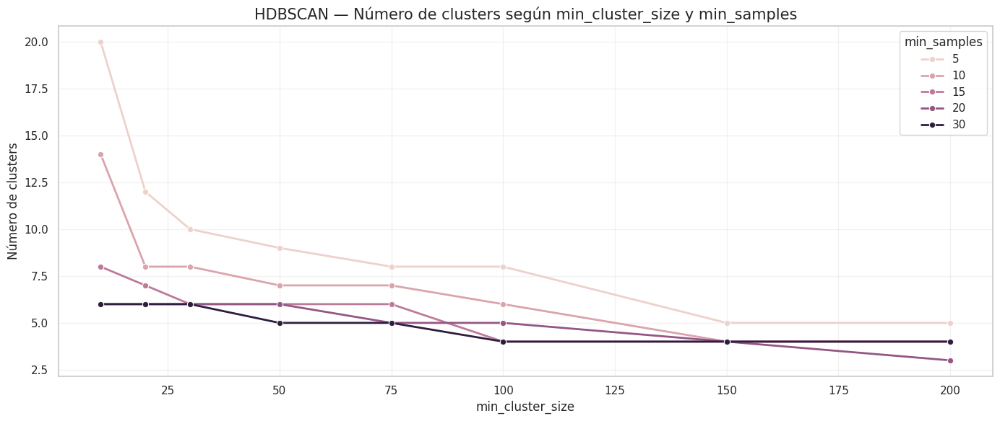

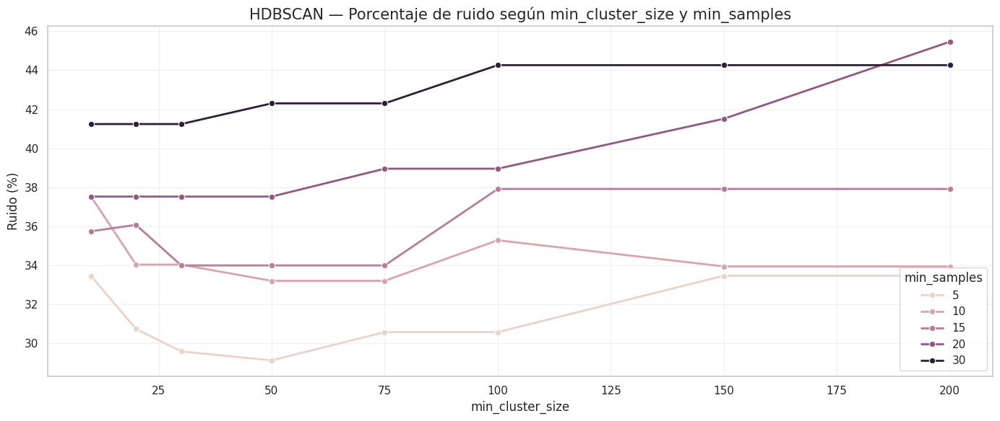


Modelo HDBSCAN candidato entrenado con min_cluster_size=100 y min_samples=20.

Tamaño de clusters HDBSCAN candidato:


,Cluster_HDBSCAN,Clientes,Porcentaje
0,-1,1687,38.95
1,0,111,2.56
2,1,1256,29.00
3,2,171,3.95
4,3,522,12.05
5,4,584,13.48


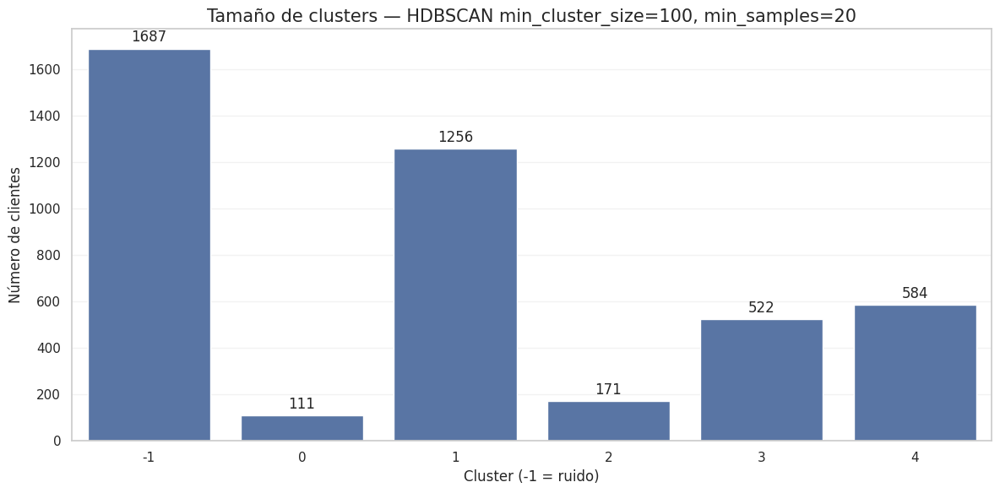


Perfil medio de clusters HDBSCAN:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_HDBSCAN,,,,,,,,,
-1,1687,38.95,"3,870.70",490.11,7.40,94.21,0.04,0.33,0.70
0,111,2.56,428.53,368.01,1.18,23.54,0.04,1.00,1.00
1,1256,29.00,296.04,296.04,1.00,21.19,0.00,0.00,0.00
2,171,3.95,"2,007.90",351.53,5.89,84.28,0.01,0.21,0.99
3,522,12.05,526.84,263.42,2.00,39.34,0.00,0.00,0.00
4,584,13.48,"1,199.87",286.92,4.14,73.48,0.00,0.00,0.00


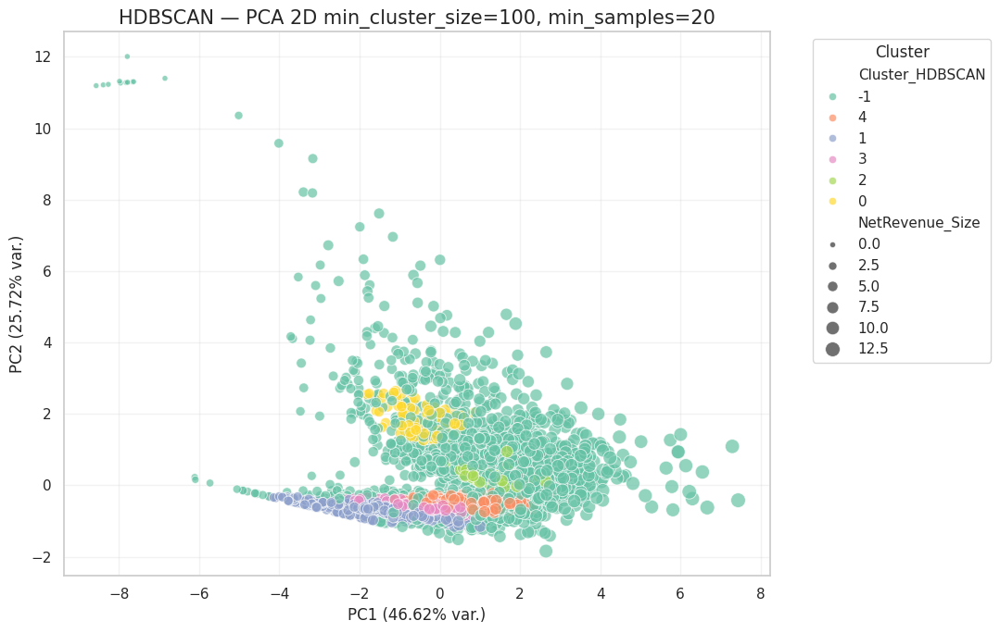

In [43]:
# ============================================================
# CELDA 33 — HDBSCAN
# Evaluación completa con métricas ampliadas + PCA 2D
# ============================================================

# ------------------------------------------------------------
# 0. Instalación e importación de HDBSCAN si fuera necesario
# ------------------------------------------------------------
!pip install -q hdbscan

import hdbscan
from hdbscan.validity import validity_index
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Ignora el ruido (-1) si existe.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    # Ignorar ruido
    mask = labels_array != -1
    X_array = X_array[mask]
    labels_array = labels_array[mask]

    if len(X_array) == 0:
        return np.nan

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Evaluación de HDBSCAN con distintos hiperparámetros
# ------------------------------------------------------------
min_cluster_size_values = [10, 20, 30, 50, 75, 100, 150, 200]
min_samples_values = [5, 10, 15, 20, 30]

resultados_hdbscan = []

X_hdbscan_array = np.asarray(X_scaled_standard)

for min_cluster_size in min_cluster_size_values:
    for min_samples in min_samples_values:

        modelo_hdbscan = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            metric="euclidean",
            cluster_selection_method="eom"
        )

        labels = modelo_hdbscan.fit_predict(X_hdbscan_array)
        labels_array = np.asarray(labels)

        n_ruido = np.sum(labels_array == -1)
        porcentaje_ruido = round(n_ruido / len(labels_array) * 100, 2)

        clusters_validos = sorted([label for label in np.unique(labels_array) if label != -1])
        n_clusters = len(clusters_validos)

        # Métricas solo si hay al menos 2 clusters válidos
        if n_clusters >= 2:
            mask_validos = labels_array != -1
            X_validos = X_hdbscan_array[mask_validos]
            labels_validos = labels_array[mask_validos]

            silhouette = silhouette_score(X_validos, labels_validos)
            calinski = calinski_harabasz_score(X_validos, labels_validos)
            davies = davies_bouldin_score(X_validos, labels_validos)
            dunn = dunn_index_sampled(
                X_hdbscan_array,
                labels_array,
                sample_size=1500,
                random_state=42
            )

            try:
                dbcv = validity_index(X_hdbscan_array.astype(float), labels_array)
            except Exception:
                dbcv = np.nan

        else:
            silhouette = np.nan
            calinski = np.nan
            davies = np.nan
            dunn = np.nan
            dbcv = np.nan

        resultados_hdbscan.append({
            "Modelo": "HDBSCAN",
            "min_cluster_size": min_cluster_size,
            "min_samples": min_samples,
            "Clusters_detectados": n_clusters,
            "Clientes_ruido": n_ruido,
            "Porcentaje_ruido": porcentaje_ruido,
            "Silhouette": silhouette,
            "Calinski_Harabasz": calinski,
            "Davies_Bouldin": davies,
            "Dunn_Index": dunn,
            "DBCV": dbcv
        })

resultados_hdbscan_df = pd.DataFrame(resultados_hdbscan)

print("Resultados completos HDBSCAN:")
display(resultados_hdbscan_df)


# ------------------------------------------------------------
# 3. Filtrar configuraciones útiles
# ------------------------------------------------------------
# Criterios:
# - al menos 2 clusters válidos
# - ruido entre 1% y 40%
# - evitar configuraciones degeneradas
# ------------------------------------------------------------
resultados_hdbscan_validos = resultados_hdbscan_df[
    (resultados_hdbscan_df["Clusters_detectados"] >= 2) &
    (resultados_hdbscan_df["Porcentaje_ruido"] >= 1) &
    (resultados_hdbscan_df["Porcentaje_ruido"] <= 40)
].copy()

print("\nConfiguraciones HDBSCAN válidas:")
display(resultados_hdbscan_validos)


# ------------------------------------------------------------
# 4. Normalización de métricas para elegir candidato
# ------------------------------------------------------------
if not resultados_hdbscan_validos.empty:

    metricas_mayor_mejor_hdbscan = [
        "Silhouette",
        "Calinski_Harabasz",
        "Dunn_Index",
        "DBCV"
    ]

    metricas_menor_mejor_hdbscan = [
        "Davies_Bouldin"
    ]

    resultados_hdbscan_norm = resultados_hdbscan_validos.copy()
    scaler_norm = MinMaxScaler()

    # Rellenar DBCV si hubiera algún NaN
    for col in metricas_mayor_mejor_hdbscan + metricas_menor_mejor_hdbscan:
        if resultados_hdbscan_norm[col].isnull().any():
            resultados_hdbscan_norm[col] = resultados_hdbscan_norm[col].fillna(
                resultados_hdbscan_norm[col].median()
            )

    # Mayor es mejor
    resultados_hdbscan_norm[[m + "_Norm" for m in metricas_mayor_mejor_hdbscan]] = (
        scaler_norm.fit_transform(resultados_hdbscan_norm[metricas_mayor_mejor_hdbscan])
    )

    # Menor es mejor: normalizar e invertir
    for metrica in metricas_menor_mejor_hdbscan:
        valores_norm = scaler_norm.fit_transform(resultados_hdbscan_norm[[metrica]])
        resultados_hdbscan_norm[metrica + "_Norm"] = 1 - valores_norm

    columnas_norm_hdbscan = [
        col for col in resultados_hdbscan_norm.columns
        if col.endswith("_Norm")
    ]

    # Penalización suave por ruido:
    # en HDBSCAN se acepta más ruido que en K-Means, pero no conviene que sea excesivo.
    resultados_hdbscan_norm["Ruido_Penalizacion"] = (
        1 - (resultados_hdbscan_norm["Porcentaje_ruido"] - 15).abs() / 40
    ).clip(lower=0, upper=1)

    # Penalización si hay demasiados o muy pocos clusters.
    # Preferimos entre 3 y 8 clusters para interpretación comercial.
    resultados_hdbscan_norm["Clusters_Penalizacion"] = (
        1 - (resultados_hdbscan_norm["Clusters_detectados"] - 5).abs() / 8
    ).clip(lower=0, upper=1)

    resultados_hdbscan_norm["Score_Global_Normalizado"] = (
        resultados_hdbscan_norm[
            columnas_norm_hdbscan + [
                "Ruido_Penalizacion",
                "Clusters_Penalizacion"
            ]
        ].mean(axis=1)
    )

    resultados_hdbscan_norm = resultados_hdbscan_norm.sort_values(
        by="Score_Global_Normalizado",
        ascending=False
    )

    print("\nConfiguraciones HDBSCAN válidas con score normalizado:")
    display(resultados_hdbscan_norm.head(15))

else:
    print("\nNo se encontraron configuraciones HDBSCAN válidas con los criterios definidos.")
    resultados_hdbscan_norm = pd.DataFrame()


# ------------------------------------------------------------
# 5. Visualización de número de clusters y ruido
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))

sns.lineplot(
    data=resultados_hdbscan_df,
    x="min_cluster_size",
    y="Clusters_detectados",
    hue="min_samples",
    marker="o",
    linewidth=2
)

plt.title("HDBSCAN — Número de clusters según min_cluster_size y min_samples", fontsize=15)
plt.xlabel("min_cluster_size")
plt.ylabel("Número de clusters")
plt.grid(True, alpha=0.25)
plt.legend(title="min_samples")
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 6))

sns.lineplot(
    data=resultados_hdbscan_df,
    x="min_cluster_size",
    y="Porcentaje_ruido",
    hue="min_samples",
    marker="o",
    linewidth=2
)

plt.title("HDBSCAN — Porcentaje de ruido según min_cluster_size y min_samples", fontsize=15)
plt.xlabel("min_cluster_size")
plt.ylabel("Ruido (%)")
plt.grid(True, alpha=0.25)
plt.legend(title="min_samples")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Entrenar modelo candidato HDBSCAN
# ------------------------------------------------------------
if not resultados_hdbscan_norm.empty:

    mejor_hdbscan = resultados_hdbscan_norm.iloc[0]

    min_cluster_size_candidato = int(mejor_hdbscan["min_cluster_size"])
    min_samples_candidato = int(mejor_hdbscan["min_samples"])

    hdbscan_final_candidato = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size_candidato,
        min_samples=min_samples_candidato,
        metric="euclidean",
        cluster_selection_method="eom"
    )

    labels_hdbscan_candidato = hdbscan_final_candidato.fit_predict(X_hdbscan_array)

    clientes_hdbscan = clientes_modelo_final.copy()
    clientes_hdbscan["Cluster_HDBSCAN"] = labels_hdbscan_candidato

    print(
        f"\nModelo HDBSCAN candidato entrenado con "
        f"min_cluster_size={min_cluster_size_candidato} "
        f"y min_samples={min_samples_candidato}."
    )

    resumen_tamanos_hdbscan = (
        clientes_hdbscan["Cluster_HDBSCAN"]
        .value_counts()
        .sort_index()
        .reset_index()
    )

    resumen_tamanos_hdbscan.columns = ["Cluster_HDBSCAN", "Clientes"]
    resumen_tamanos_hdbscan["Porcentaje"] = (
        resumen_tamanos_hdbscan["Clientes"] / len(clientes_hdbscan) * 100
    ).round(2)

    print("\nTamaño de clusters HDBSCAN candidato:")
    display(resumen_tamanos_hdbscan)

    plt.figure(figsize=(12, 6))

    ax = sns.barplot(
        data=resumen_tamanos_hdbscan,
        x="Cluster_HDBSCAN",
        y="Clientes"
    )

    plt.title(
        f"Tamaño de clusters — HDBSCAN "
        f"min_cluster_size={min_cluster_size_candidato}, "
        f"min_samples={min_samples_candidato}",
        fontsize=15
    )
    plt.xlabel("Cluster (-1 = ruido)")
    plt.ylabel("Número de clientes")
    plt.grid(axis="y", alpha=0.25)

    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", padding=3)

    plt.tight_layout()
    plt.show()

    # --------------------------------------------------------
    # 7. Perfil medio de clusters HDBSCAN
    # --------------------------------------------------------
    variables_perfil_hdbscan = [
        "NetRevenue",
        "NetAverageOrderValue",
        "PurchaseFrequency",
        "UniqueProductsPurchased",
        "ReturnRate",
        "ReturnFrequencyRatio",
        "HasReturns"
    ]

    perfil_hdbscan = (
        clientes_hdbscan
        .groupby("Cluster_HDBSCAN")[variables_perfil_hdbscan]
        .mean()
        .round(2)
    )

    perfil_hdbscan["Clientes"] = (
        clientes_hdbscan["Cluster_HDBSCAN"]
        .value_counts()
        .sort_index()
    )

    perfil_hdbscan["Porcentaje"] = (
        perfil_hdbscan["Clientes"] / len(clientes_hdbscan) * 100
    ).round(2)

    perfil_hdbscan = perfil_hdbscan[
        ["Clientes", "Porcentaje"] + variables_perfil_hdbscan
    ]

    print("\nPerfil medio de clusters HDBSCAN:")
    display(perfil_hdbscan)

    # --------------------------------------------------------
    # 8. PCA 2D del candidato HDBSCAN
    # --------------------------------------------------------
    pca_hdbscan = PCA(n_components=2, random_state=42)
    X_pca_hdbscan = pca_hdbscan.fit_transform(X_scaled_standard)

    pca_hdbscan_df = pd.DataFrame(
        X_pca_hdbscan,
        columns=["PC1", "PC2"],
        index=X_scaled_standard.index
    )

    pca_hdbscan_df["Cluster_HDBSCAN"] = (
        clientes_hdbscan["Cluster_HDBSCAN"]
        .astype(str)
        .values
    )

    pca_hdbscan_df["NetRevenue_Size"] = np.log1p(clientes_hdbscan["NetRevenue"].values)

    var_pca_hdbscan = pca_hdbscan.explained_variance_ratio_

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=pca_hdbscan_df,
        x="PC1",
        y="PC2",
        hue="Cluster_HDBSCAN",
        size="NetRevenue_Size",
        sizes=(20, 130),
        alpha=0.70,
        palette="Set2"
    )

    plt.title(
        f"HDBSCAN — PCA 2D "
        f"min_cluster_size={min_cluster_size_candidato}, "
        f"min_samples={min_samples_candidato}",
        fontsize=15
    )
    plt.xlabel(f"PC1 ({var_pca_hdbscan[0] * 100:.2f}% var.)")
    plt.ylabel(f"PC2 ({var_pca_hdbscan[1] * 100:.2f}% var.)")
    plt.grid(True, alpha=0.25)
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

else:
    print("\nNo se entrena modelo candidato HDBSCAN porque no hay configuraciones válidas.")

HDBSCAN

Se evaluó HDBSCAN como alternativa avanzada a DBSCAN. Este algoritmo permite detectar clusters de densidad variable y clasificar como ruido aquellas observaciones que no pertenecen claramente a ningún grupo. Esta característica resulta especialmente útil en datos comerciales, donde pueden existir clientes con comportamientos extremos o poco frecuentes.

La mejor configuración seleccionada fue min_cluster_size = 100 y min_samples = 20. Con estos parámetros, el modelo detectó cinco clusters válidos y un grupo de ruido. La distribución fue de 1.687 clientes clasificados como ruido, equivalentes al 38,95% del total, y cinco clusters con tamaños de 111, 1.256, 171, 522 y 584 clientes.

Aunque HDBSCAN identificó varios grupos diferenciados, el porcentaje de ruido fue elevado. Esto limita su utilidad como modelo principal de segmentación comercial, ya que una parte importante de la base de clientes queda fuera de segmentos accionables. Además, el grupo de ruido contiene clientes con valor neto medio elevado, lo que indica que el modelo está separando como atípicos algunos perfiles comercialmente relevantes.

No obstante, HDBSCAN aporta valor como técnica complementaria. Permite detectar clientes con comportamiento complejo, clientes con alta fricción por devoluciones y perfiles extremos que otros modelos fuerzan dentro de clusters generales. Por tanto, se considera útil para análisis de outliers y validación adicional, pero no desplaza a K-Means como modelo principal.

Resultados ampliados de evaluación — Spectral Clustering:


,Modelo,K,Clusters_detectados,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI
0,SpectralClustering,2,2,0.18,978.00,1.41,0.02,0.98
1,SpectralClustering,3,3,0.13,870.06,1.82,0.00,0.93
2,SpectralClustering,4,4,0.12,758.46,1.53,0.00,0.93
3,SpectralClustering,5,5,0.09,744.25,1.59,0.00,0.69
4,SpectralClustering,6,6,0.09,689.03,1.39,0.00,0.71
5,SpectralClustering,7,7,0.09,610.40,1.28,0.00,0.72
6,SpectralClustering,8,8,0.11,674.04,1.42,0.00,0.88
7,SpectralClustering,9,9,0.11,653.52,1.47,0.00,0.93
8,SpectralClustering,10,10,0.10,595.68,1.42,0.00,0.94



Resultados Spectral con métricas normalizadas:


,K,Silhouette_Norm,Calinski_Harabasz_Norm,Davies_Bouldin_Norm,Dunn_Index_Norm,Stability_ARI_Norm,Score_Global_Normalizado
0,2,1.00,1.00,0.76,1.00,1.00,0.95
1,3,0.40,0.72,0.00,0.00,0.84,0.39
2,4,0.25,0.43,0.53,0.15,0.85,0.44
3,5,0.01,0.39,0.42,0.07,0.00,0.18
4,6,0.01,0.24,0.80,0.01,0.07,0.23
5,7,0.00,0.04,1.00,0.04,0.13,0.24
6,8,0.17,0.20,0.74,0.01,0.69,0.36
7,9,0.18,0.15,0.65,0.00,0.86,0.37
8,10,0.09,0.00,0.75,0.05,0.86,0.35


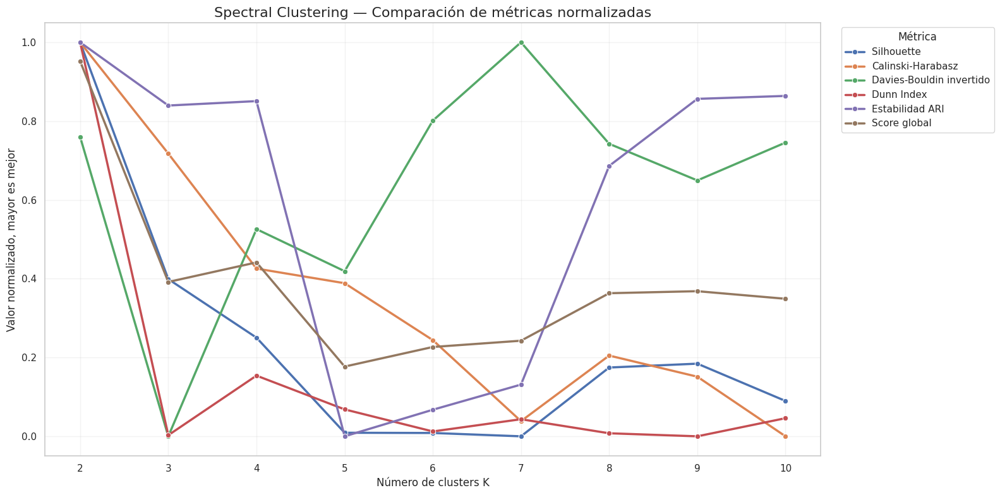


Mejores configuraciones Spectral según cada criterio:


,Criterio,K_recomendado,Valor
0,Mayor Silhouette,2,0.18
1,Mayor Calinski-Harabasz,2,978.00
2,Menor Davies-Bouldin,7,1.28
3,Mayor Dunn Index,2,0.02
4,Mayor Stability ARI,2,0.98
5,Mayor Score Global Normalizado,2,0.95



Modelo Spectral candidato entrenado con K=2.

Tamaño de clusters Spectral candidato:


,Cluster_Spectral,Clientes,Porcentaje
0,0,3035,70.08
1,1,1296,29.92


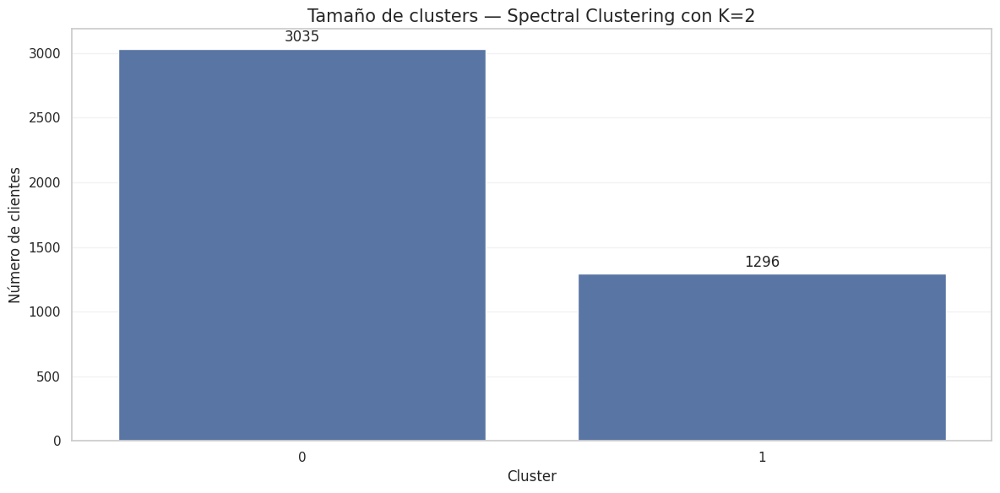


Perfil medio de clusters Spectral:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_Spectral,,,,,,,,,
0,3035,70.08,"2,596.06",400.53,5.62,78.61,0.03,0.23,0.48
1,1296,29.92,300.38,300.21,1.01,21.17,0.00,0.00,0.00


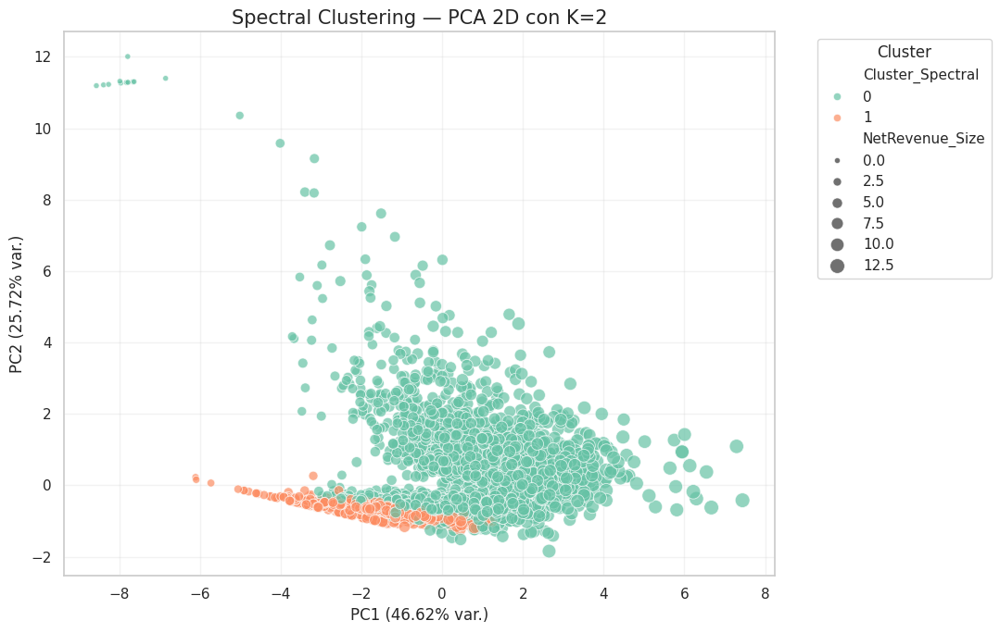

In [44]:
# ============================================================
# CELDA 34 — SPECTRAL CLUSTERING
# Evaluación completa + PCA 2D del modelo candidato
# ============================================================

from sklearn.cluster import SpectralClustering
from sklearn.metrics import adjusted_rand_score, pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Dunn = distancia mínima entre clusters / diámetro máximo intracluster.
    Valores más altos indican clusters más separados y compactos.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Función Stability Score para Spectral
# ------------------------------------------------------------
def stability_score_spectral(
    X,
    n_clusters,
    n_iter=3,
    sample_frac=0.8,
    random_state=42
):
    """
    Calcula estabilidad mediante Adjusted Rand Index.
    Spectral puede ser costoso, por eso se usa n_iter=3.
    """
    rng = np.random.default_rng(random_state)
    X_df = pd.DataFrame(X).copy()

    modelo_full = SpectralClustering(
        n_clusters=n_clusters,
        affinity="nearest_neighbors",
        n_neighbors=15,
        assign_labels="kmeans",
        random_state=random_state
    )

    labels_full = modelo_full.fit_predict(X_df)

    ari_scores = []
    n_sample = int(len(X_df) * sample_frac)

    for i in range(n_iter):
        sample_idx = rng.choice(
            X_df.index,
            size=n_sample,
            replace=False
        )

        X_sample = X_df.loc[sample_idx]

        modelo_sample = SpectralClustering(
            n_clusters=n_clusters,
            affinity="nearest_neighbors",
            n_neighbors=15,
            assign_labels="kmeans",
            random_state=random_state + i + 1
        )

        labels_sample = modelo_sample.fit_predict(X_sample)
        labels_full_sample = labels_full[X_df.index.get_indexer(sample_idx)]

        ari = adjusted_rand_score(labels_full_sample, labels_sample)
        ari_scores.append(ari)

    return np.mean(ari_scores)


# ------------------------------------------------------------
# 3. Evaluación Spectral Clustering para K de 2 a 10
# ------------------------------------------------------------
rango_k_spectral = range(2, 11)

resultados_spectral = []

for k in rango_k_spectral:
    spectral = SpectralClustering(
        n_clusters=k,
        affinity="nearest_neighbors",
        n_neighbors=15,
        assign_labels="kmeans",
        random_state=42
    )

    labels = spectral.fit_predict(X_scaled_standard)

    resultados_spectral.append({
        "Modelo": "SpectralClustering",
        "K": k,
        "Clusters_detectados": len(np.unique(labels)),
        "Silhouette": silhouette_score(X_scaled_standard, labels),
        "Calinski_Harabasz": calinski_harabasz_score(X_scaled_standard, labels),
        "Davies_Bouldin": davies_bouldin_score(X_scaled_standard, labels),
        "Dunn_Index": dunn_index_sampled(
            X_scaled_standard,
            labels,
            sample_size=1500,
            random_state=42
        ),
        "Stability_ARI": stability_score_spectral(
            X_scaled_standard,
            n_clusters=k,
            n_iter=3,
            sample_frac=0.8,
            random_state=42
        )
    })

resultados_spectral_df = pd.DataFrame(resultados_spectral)

print("Resultados ampliados de evaluación — Spectral Clustering:")
display(resultados_spectral_df)


# ------------------------------------------------------------
# 4. Normalización de métricas
# ------------------------------------------------------------
metricas_mayor_mejor_spectral = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index",
    "Stability_ARI"
]

metricas_menor_mejor_spectral = [
    "Davies_Bouldin"
]

resultados_spectral_norm = resultados_spectral_df.copy()
scaler_norm = MinMaxScaler()

resultados_spectral_norm[
    [m + "_Norm" for m in metricas_mayor_mejor_spectral]
] = scaler_norm.fit_transform(
    resultados_spectral_norm[metricas_mayor_mejor_spectral]
)

for metrica in metricas_menor_mejor_spectral:
    valores_norm = scaler_norm.fit_transform(resultados_spectral_norm[[metrica]])
    resultados_spectral_norm[metrica + "_Norm"] = 1 - valores_norm

columnas_norm_spectral = [
    col for col in resultados_spectral_norm.columns
    if col.endswith("_Norm")
]

resultados_spectral_norm["Score_Global_Normalizado"] = (
    resultados_spectral_norm[columnas_norm_spectral].mean(axis=1)
)

print("\nResultados Spectral con métricas normalizadas:")
display(
    resultados_spectral_norm[
        [
            "K",
            "Silhouette_Norm",
            "Calinski_Harabasz_Norm",
            "Davies_Bouldin_Norm",
            "Dunn_Index_Norm",
            "Stability_ARI_Norm",
            "Score_Global_Normalizado"
        ]
    ]
)


# ------------------------------------------------------------
# 5. Gráfico conjunto de métricas normalizadas
# ------------------------------------------------------------
metricas_norm_plot_spectral = resultados_spectral_norm.melt(
    id_vars="K",
    value_vars=[
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Stability_ARI_Norm",
        "Score_Global_Normalizado"
    ],
    var_name="Metrica",
    value_name="Valor_Normalizado"
)

nombres_metricas_spectral = {
    "Silhouette_Norm": "Silhouette",
    "Calinski_Harabasz_Norm": "Calinski-Harabasz",
    "Davies_Bouldin_Norm": "Davies-Bouldin invertido",
    "Dunn_Index_Norm": "Dunn Index",
    "Stability_ARI_Norm": "Estabilidad ARI",
    "Score_Global_Normalizado": "Score global"
}

metricas_norm_plot_spectral["Metrica"] = (
    metricas_norm_plot_spectral["Metrica"].map(nombres_metricas_spectral)
)

plt.figure(figsize=(16, 8))

sns.lineplot(
    data=metricas_norm_plot_spectral,
    x="K",
    y="Valor_Normalizado",
    hue="Metrica",
    marker="o",
    linewidth=2.5
)

plt.title("Spectral Clustering — Comparación de métricas normalizadas", fontsize=16)
plt.xlabel("Número de clusters K")
plt.ylabel("Valor normalizado, mayor es mejor")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.25)
plt.legend(title="Métrica", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Mejores configuraciones según cada criterio
# ------------------------------------------------------------
mejores_spectral = pd.DataFrame({
    "Criterio": [
        "Mayor Silhouette",
        "Mayor Calinski-Harabasz",
        "Menor Davies-Bouldin",
        "Mayor Dunn Index",
        "Mayor Stability ARI",
        "Mayor Score Global Normalizado"
    ],
    "K_recomendado": [
        resultados_spectral_df.loc[resultados_spectral_df["Silhouette"].idxmax(), "K"],
        resultados_spectral_df.loc[resultados_spectral_df["Calinski_Harabasz"].idxmax(), "K"],
        resultados_spectral_df.loc[resultados_spectral_df["Davies_Bouldin"].idxmin(), "K"],
        resultados_spectral_df.loc[resultados_spectral_df["Dunn_Index"].idxmax(), "K"],
        resultados_spectral_df.loc[resultados_spectral_df["Stability_ARI"].idxmax(), "K"],
        resultados_spectral_norm.loc[
            resultados_spectral_norm["Score_Global_Normalizado"].idxmax(),
            "K"
        ]
    ],
    "Valor": [
        resultados_spectral_df["Silhouette"].max(),
        resultados_spectral_df["Calinski_Harabasz"].max(),
        resultados_spectral_df["Davies_Bouldin"].min(),
        resultados_spectral_df["Dunn_Index"].max(),
        resultados_spectral_df["Stability_ARI"].max(),
        resultados_spectral_norm["Score_Global_Normalizado"].max()
    ]
})

print("\nMejores configuraciones Spectral según cada criterio:")
display(mejores_spectral)


# ------------------------------------------------------------
# 7. Entrenar modelo Spectral candidato principal
# ------------------------------------------------------------
k_candidato_spectral = int(
    resultados_spectral_norm.loc[
        resultados_spectral_norm["Score_Global_Normalizado"].idxmax(),
        "K"
    ]
)

spectral_final_candidato = SpectralClustering(
    n_clusters=k_candidato_spectral,
    affinity="nearest_neighbors",
    n_neighbors=15,
    assign_labels="kmeans",
    random_state=42
)

labels_spectral_candidato = spectral_final_candidato.fit_predict(X_scaled_standard)

clientes_spectral = clientes_modelo_final.copy()
clientes_spectral["Cluster_Spectral"] = labels_spectral_candidato

print(f"\nModelo Spectral candidato entrenado con K={k_candidato_spectral}.")


# ------------------------------------------------------------
# 8. Tamaño de clusters
# ------------------------------------------------------------
resumen_tamanos_spectral = (
    clientes_spectral["Cluster_Spectral"]
    .value_counts()
    .sort_index()
    .reset_index()
)

resumen_tamanos_spectral.columns = ["Cluster_Spectral", "Clientes"]
resumen_tamanos_spectral["Porcentaje"] = (
    resumen_tamanos_spectral["Clientes"] / len(clientes_spectral) * 100
).round(2)

print("\nTamaño de clusters Spectral candidato:")
display(resumen_tamanos_spectral)

plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=resumen_tamanos_spectral,
    x="Cluster_Spectral",
    y="Clientes"
)

plt.title(
    f"Tamaño de clusters — Spectral Clustering con K={k_candidato_spectral}",
    fontsize=15
)
plt.xlabel("Cluster")
plt.ylabel("Número de clientes")
plt.grid(axis="y", alpha=0.25)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. Perfil medio de clusters Spectral
# ------------------------------------------------------------
variables_perfil_spectral = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

perfil_spectral = (
    clientes_spectral
    .groupby("Cluster_Spectral")[variables_perfil_spectral]
    .mean()
    .round(2)
)

perfil_spectral["Clientes"] = (
    clientes_spectral["Cluster_Spectral"]
    .value_counts()
    .sort_index()
)

perfil_spectral["Porcentaje"] = (
    perfil_spectral["Clientes"] / len(clientes_spectral) * 100
).round(2)

perfil_spectral = perfil_spectral[
    ["Clientes", "Porcentaje"] + variables_perfil_spectral
]

print("\nPerfil medio de clusters Spectral:")
display(perfil_spectral)


# ------------------------------------------------------------
# 10. Visualización PCA 2D del candidato Spectral
# ------------------------------------------------------------
pca_spectral = PCA(n_components=2, random_state=42)
X_pca_spectral = pca_spectral.fit_transform(X_scaled_standard)

pca_spectral_df = pd.DataFrame(
    X_pca_spectral,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_spectral_df["Cluster_Spectral"] = (
    clientes_spectral["Cluster_Spectral"]
    .astype(str)
    .values
)

pca_spectral_df["NetRevenue_Size"] = np.log1p(clientes_spectral["NetRevenue"].values)

var_pca_spectral = pca_spectral.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_spectral_df,
    x="PC1",
    y="PC2",
    hue="Cluster_Spectral",
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette="Set2"
)

plt.title(
    f"Spectral Clustering — PCA 2D con K={k_candidato_spectral}",
    fontsize=15
)
plt.xlabel(f"PC1 ({var_pca_spectral[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_spectral[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

Spectral Clustering

Se evaluó Spectral Clustering como modelo capaz de capturar estructuras no lineales mediante una matriz de afinidad basada en vecinos cercanos. Este enfoque permite detectar relaciones complejas entre observaciones, aunque suele ser menos interpretable que modelos como K-Means o clustering jerárquico.

La mejor configuración seleccionada fue K=2, que obtuvo el mayor score global normalizado. El modelo dividió la base de clientes en dos grupos: un primer cluster de 3.035 clientes, equivalente al 70,08%, y un segundo cluster de 1.296 clientes, equivalente al 29,92%.

El primer grupo concentró clientes con mayor valor neto, mayor frecuencia de compra, mayor variedad de productos y mayor presencia de devoluciones. El segundo grupo agrupó clientes de bajo valor, baja frecuencia y ausencia de devoluciones.

Aunque esta segmentación es coherente como división general, resulta demasiado amplia para los objetivos del análisis. El modelo no diferencia con suficiente detalle perfiles clave como clientes de alto valor, clientes de valor medio con devoluciones o clientes con alta fricción comercial. Por tanto, Spectral Clustering se considera una alternativa válida para macrosegmentación, pero no desplaza a K-Means como modelo principal.

Resultados ampliados de evaluación — BIRCH:


,Modelo,K,threshold,Clusters_detectados,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI
0,BIRCH,2,0.30,2,0.45,772.97,1.28,0.02,0.21
1,BIRCH,3,0.30,3,0.22,"1,102.31",1.22,0.00,0.20
2,BIRCH,4,0.30,4,0.22,"1,050.18",1.02,0.00,0.24
3,BIRCH,5,0.30,5,0.16,"1,111.07",1.09,0.00,0.28
4,BIRCH,6,0.30,6,0.16,991.23,1.12,0.00,0.25
5,BIRCH,7,0.30,7,0.17,975.63,1.19,0.00,0.28
6,BIRCH,8,0.30,8,0.19,"1,098.39",1.25,0.00,0.39
7,BIRCH,9,0.30,9,0.20,999.17,1.30,0.00,0.40
8,BIRCH,10,0.30,10,0.18,968.55,1.33,0.00,0.40
9,BIRCH,2,0.50,2,0.70,680.55,0.74,0.10,0.54



Configuraciones BIRCH válidas:


,Modelo,K,threshold,Clusters_detectados,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI
0,BIRCH,2,0.30,2,0.45,772.97,1.28,0.02,0.21
1,BIRCH,3,0.30,3,0.22,"1,102.31",1.22,0.00,0.20
2,BIRCH,4,0.30,4,0.22,"1,050.18",1.02,0.00,0.24
3,BIRCH,5,0.30,5,0.16,"1,111.07",1.09,0.00,0.28
4,BIRCH,6,0.30,6,0.16,991.23,1.12,0.00,0.25
5,BIRCH,7,0.30,7,0.17,975.63,1.19,0.00,0.28
6,BIRCH,8,0.30,8,0.19,"1,098.39",1.25,0.00,0.39
7,BIRCH,9,0.30,9,0.20,999.17,1.30,0.00,0.40
8,BIRCH,10,0.30,10,0.18,968.55,1.33,0.00,0.40
9,BIRCH,2,0.50,2,0.70,680.55,0.74,0.10,0.54



Resultados BIRCH con métricas normalizadas:


,K,threshold,Silhouette_Norm,Calinski_Harabasz_Norm,Davies_Bouldin_Norm,Dunn_Index_Norm,Stability_ARI_Norm,Score_Global_Normalizado
18,2,0.70,1.00,0.00,1.00,1.00,1.00,0.80
9,2,0.50,0.98,0.02,0.99,0.72,0.87,0.71
11,4,0.50,0.29,1.00,0.37,0.05,0.67,0.48
12,5,0.50,0.29,0.70,0.53,0.06,0.75,0.47
10,3,0.50,0.23,0.78,0.50,0.05,0.76,0.46
13,6,0.50,0.25,0.52,0.40,0.06,0.76,0.40
19,3,0.70,0.29,0.25,0.73,0.12,0.49,0.37
14,7,0.50,0.22,0.39,0.42,0.06,0.75,0.37
15,8,0.50,0.21,0.36,0.34,0.06,0.78,0.35
21,5,0.70,0.21,0.13,0.55,0.09,0.69,0.33


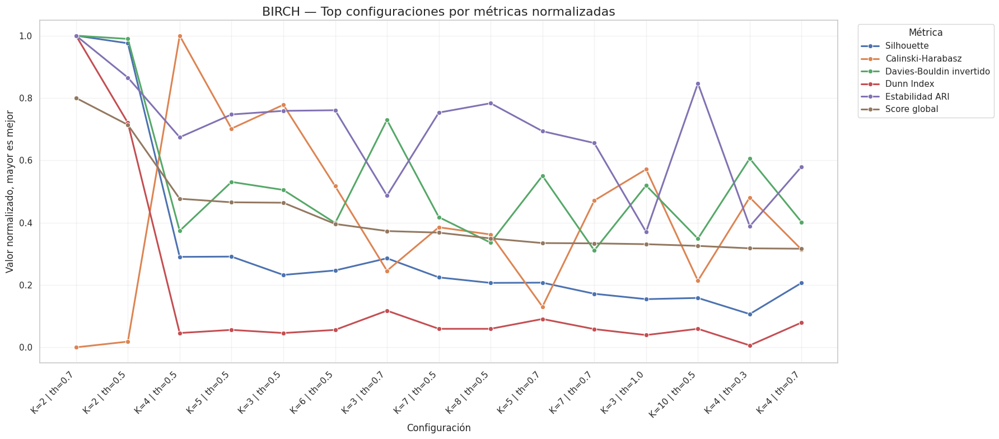


Mejores configuraciones BIRCH según cada criterio:


,Criterio,K_recomendado,Threshold,Valor
0,Mayor Silhouette,2,0.70,0.71
1,Mayor Calinski-Harabasz,4,0.50,"1,464.85"
2,Menor Davies-Bouldin,2,0.70,0.73
3,Mayor Dunn Index,2,0.70,0.14
4,Mayor Stability ARI,2,0.70,0.62
5,Mayor Score Global Normalizado,2,0.70,0.80



Modelo BIRCH candidato entrenado con K=2 y threshold=0.7.

Tamaño de clusters BIRCH candidato:


,Cluster_BIRCH,Clientes,Porcentaje
0,0,4289,99.03
1,1,42,0.97


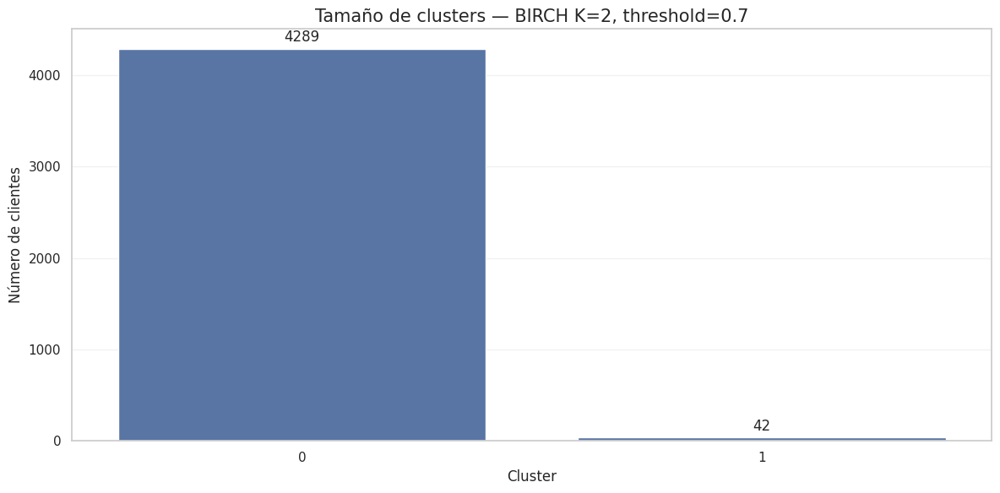


Perfil medio de clusters BIRCH:


,Clientes,Porcentaje,NetRevenue,NetAverageOrderValue,PurchaseFrequency,UniqueProductsPurchased,ReturnRate,ReturnFrequencyRatio,HasReturns
Cluster_BIRCH,,,,,,,,,
0,4289,99.03,"1,919.87",370.99,4.26,61.84,0.01,0.15,0.33
1,42,0.97,810.49,320.94,2.00,18.71,0.64,0.94,1.00


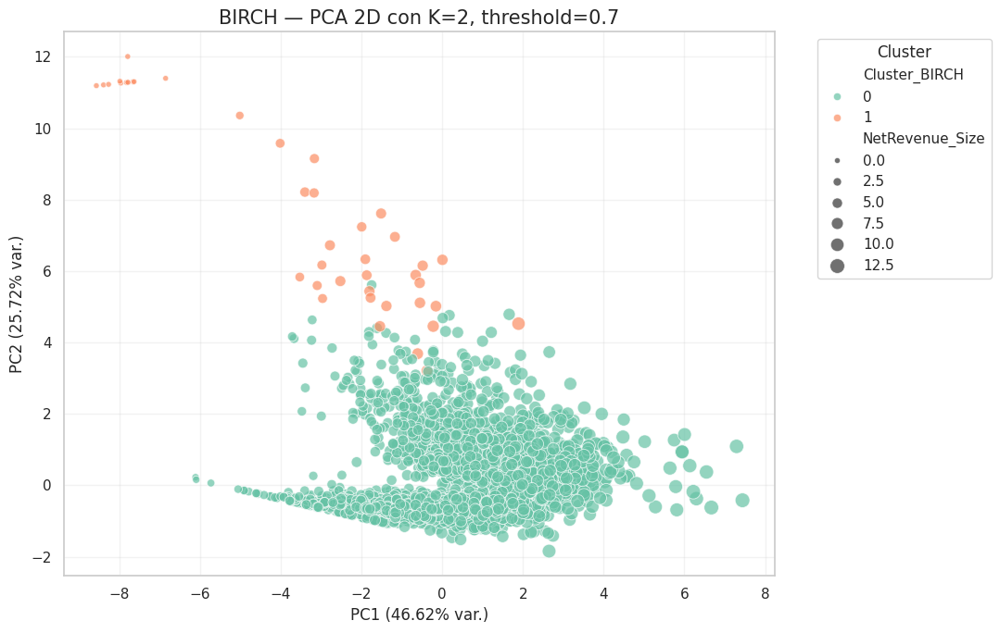

In [45]:
# ============================================================
# CELDA 35 — BIRCH CLUSTERING
# Evaluación completa + PCA 2D del modelo candidato
# ============================================================

from sklearn.cluster import Birch
from sklearn.metrics import adjusted_rand_score, pairwise_distances
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA

# ------------------------------------------------------------
# 1. Función Dunn Index aproximado
# ------------------------------------------------------------
def dunn_index_sampled(X, labels, sample_size=1500, random_state=42):
    """
    Calcula una aproximación del Dunn Index usando una muestra.
    Dunn = distancia mínima entre clusters / diámetro máximo intracluster.
    Valores más altos indican clusters más separados y compactos.
    """
    rng = np.random.default_rng(random_state)

    X_array = np.asarray(X)
    labels_array = np.asarray(labels)

    if len(X_array) > sample_size:
        idx = rng.choice(len(X_array), size=sample_size, replace=False)
        X_array = X_array[idx]
        labels_array = labels_array[idx]

    unique_labels = np.unique(labels_array)

    if len(unique_labels) < 2:
        return np.nan

    distances = pairwise_distances(X_array)

    max_intra_distance = 0
    min_inter_distance = np.inf

    for label in unique_labels:
        cluster_idx = np.where(labels_array == label)[0]

        if len(cluster_idx) > 1:
            intra_dist = distances[np.ix_(cluster_idx, cluster_idx)]
            max_intra_distance = max(max_intra_distance, intra_dist.max())

    for i, label_i in enumerate(unique_labels):
        idx_i = np.where(labels_array == label_i)[0]

        for label_j in unique_labels[i + 1:]:
            idx_j = np.where(labels_array == label_j)[0]
            inter_dist = distances[np.ix_(idx_i, idx_j)]
            min_inter_distance = min(min_inter_distance, inter_dist.min())

    if max_intra_distance == 0:
        return np.nan

    return min_inter_distance / max_intra_distance


# ------------------------------------------------------------
# 2. Función Stability Score para BIRCH
# ------------------------------------------------------------
def stability_score_birch(
    X,
    n_clusters,
    threshold=0.5,
    branching_factor=50,
    n_iter=5,
    sample_frac=0.8,
    random_state=42
):
    """
    Calcula estabilidad mediante Adjusted Rand Index.
    Compara etiquetas del modelo completo con etiquetas de modelos
    reentrenados sobre submuestras.
    """
    rng = np.random.default_rng(random_state)
    X_df = pd.DataFrame(X).copy()

    modelo_full = Birch(
        n_clusters=n_clusters,
        threshold=threshold,
        branching_factor=branching_factor
    )

    labels_full = modelo_full.fit_predict(X_df)

    ari_scores = []
    n_sample = int(len(X_df) * sample_frac)

    for i in range(n_iter):
        sample_idx = rng.choice(
            X_df.index,
            size=n_sample,
            replace=False
        )

        X_sample = X_df.loc[sample_idx]

        modelo_sample = Birch(
            n_clusters=n_clusters,
            threshold=threshold,
            branching_factor=branching_factor
        )

        labels_sample = modelo_sample.fit_predict(X_sample)
        labels_full_sample = labels_full[X_df.index.get_indexer(sample_idx)]

        ari = adjusted_rand_score(labels_full_sample, labels_sample)
        ari_scores.append(ari)

    return np.mean(ari_scores)


# ------------------------------------------------------------
# 3. Evaluación BIRCH para diferentes K y threshold
# ------------------------------------------------------------
rango_k_birch = range(2, 11)
threshold_values = [0.3, 0.5, 0.7, 1.0]

resultados_birch = []

for threshold in threshold_values:
    for k in rango_k_birch:

        birch = Birch(
            n_clusters=k,
            threshold=threshold,
            branching_factor=50
        )

        labels = birch.fit_predict(X_scaled_standard)

        n_clusters_detectados = len(np.unique(labels))

        if n_clusters_detectados >= 2:
            silhouette = silhouette_score(X_scaled_standard, labels)
            calinski = calinski_harabasz_score(X_scaled_standard, labels)
            davies = davies_bouldin_score(X_scaled_standard, labels)
            dunn = dunn_index_sampled(
                X_scaled_standard,
                labels,
                sample_size=1500,
                random_state=42
            )
            stability = stability_score_birch(
                X_scaled_standard,
                n_clusters=k,
                threshold=threshold,
                branching_factor=50,
                n_iter=5,
                sample_frac=0.8,
                random_state=42
            )
        else:
            silhouette = np.nan
            calinski = np.nan
            davies = np.nan
            dunn = np.nan
            stability = np.nan

        resultados_birch.append({
            "Modelo": "BIRCH",
            "K": k,
            "threshold": threshold,
            "Clusters_detectados": n_clusters_detectados,
            "Silhouette": silhouette,
            "Calinski_Harabasz": calinski,
            "Davies_Bouldin": davies,
            "Dunn_Index": dunn,
            "Stability_ARI": stability
        })

resultados_birch_df = pd.DataFrame(resultados_birch)

print("Resultados ampliados de evaluación — BIRCH:")
display(resultados_birch_df)


# ------------------------------------------------------------
# 4. Filtrar configuraciones válidas
# ------------------------------------------------------------
resultados_birch_validos = resultados_birch_df[
    (resultados_birch_df["Clusters_detectados"] >= 2) &
    (resultados_birch_df["Silhouette"].notnull())
].copy()

print("\nConfiguraciones BIRCH válidas:")
display(resultados_birch_validos)


# ------------------------------------------------------------
# 5. Normalización de métricas
# ------------------------------------------------------------
metricas_mayor_mejor_birch = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index",
    "Stability_ARI"
]

metricas_menor_mejor_birch = [
    "Davies_Bouldin"
]

resultados_birch_norm = resultados_birch_validos.copy()
scaler_norm = MinMaxScaler()

resultados_birch_norm[
    [m + "_Norm" for m in metricas_mayor_mejor_birch]
] = scaler_norm.fit_transform(
    resultados_birch_norm[metricas_mayor_mejor_birch]
)

for metrica in metricas_menor_mejor_birch:
    valores_norm = scaler_norm.fit_transform(resultados_birch_norm[[metrica]])
    resultados_birch_norm[metrica + "_Norm"] = 1 - valores_norm

columnas_norm_birch = [
    col for col in resultados_birch_norm.columns
    if col.endswith("_Norm")
]

resultados_birch_norm["Score_Global_Normalizado"] = (
    resultados_birch_norm[columnas_norm_birch].mean(axis=1)
)

resultados_birch_norm = resultados_birch_norm.sort_values(
    by="Score_Global_Normalizado",
    ascending=False
)

print("\nResultados BIRCH con métricas normalizadas:")
display(
    resultados_birch_norm[
        [
            "K",
            "threshold",
            "Silhouette_Norm",
            "Calinski_Harabasz_Norm",
            "Davies_Bouldin_Norm",
            "Dunn_Index_Norm",
            "Stability_ARI_Norm",
            "Score_Global_Normalizado"
        ]
    ].head(20)
)


# ------------------------------------------------------------
# 6. Gráfico conjunto de métricas normalizadas para top configuraciones
# ------------------------------------------------------------
top_birch_plot = resultados_birch_norm.head(15).copy()
top_birch_plot["Config"] = (
    "K=" + top_birch_plot["K"].astype(str) +
    " | th=" + top_birch_plot["threshold"].astype(str)
)

metricas_norm_plot_birch = top_birch_plot.melt(
    id_vars="Config",
    value_vars=[
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Stability_ARI_Norm",
        "Score_Global_Normalizado"
    ],
    var_name="Metrica",
    value_name="Valor_Normalizado"
)

nombres_metricas_birch = {
    "Silhouette_Norm": "Silhouette",
    "Calinski_Harabasz_Norm": "Calinski-Harabasz",
    "Davies_Bouldin_Norm": "Davies-Bouldin invertido",
    "Dunn_Index_Norm": "Dunn Index",
    "Stability_ARI_Norm": "Estabilidad ARI",
    "Score_Global_Normalizado": "Score global"
}

metricas_norm_plot_birch["Metrica"] = (
    metricas_norm_plot_birch["Metrica"].map(nombres_metricas_birch)
)

plt.figure(figsize=(18, 8))

sns.lineplot(
    data=metricas_norm_plot_birch,
    x="Config",
    y="Valor_Normalizado",
    hue="Metrica",
    marker="o",
    linewidth=2.2
)

plt.title("BIRCH — Top configuraciones por métricas normalizadas", fontsize=16)
plt.xlabel("Configuración")
plt.ylabel("Valor normalizado, mayor es mejor")
plt.xticks(rotation=45, ha="right")
plt.ylim(-0.05, 1.05)
plt.grid(True, alpha=0.25)
plt.legend(title="Métrica", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 7. Mejores configuraciones según cada criterio
# ------------------------------------------------------------
mejores_birch = pd.DataFrame({
    "Criterio": [
        "Mayor Silhouette",
        "Mayor Calinski-Harabasz",
        "Menor Davies-Bouldin",
        "Mayor Dunn Index",
        "Mayor Stability ARI",
        "Mayor Score Global Normalizado"
    ],
    "K_recomendado": [
        resultados_birch_validos.loc[resultados_birch_validos["Silhouette"].idxmax(), "K"],
        resultados_birch_validos.loc[resultados_birch_validos["Calinski_Harabasz"].idxmax(), "K"],
        resultados_birch_validos.loc[resultados_birch_validos["Davies_Bouldin"].idxmin(), "K"],
        resultados_birch_validos.loc[resultados_birch_validos["Dunn_Index"].idxmax(), "K"],
        resultados_birch_validos.loc[resultados_birch_validos["Stability_ARI"].idxmax(), "K"],
        resultados_birch_norm.loc[
            resultados_birch_norm["Score_Global_Normalizado"].idxmax(),
            "K"
        ]
    ],
    "Threshold": [
        resultados_birch_validos.loc[resultados_birch_validos["Silhouette"].idxmax(), "threshold"],
        resultados_birch_validos.loc[resultados_birch_validos["Calinski_Harabasz"].idxmax(), "threshold"],
        resultados_birch_validos.loc[resultados_birch_validos["Davies_Bouldin"].idxmin(), "threshold"],
        resultados_birch_validos.loc[resultados_birch_validos["Dunn_Index"].idxmax(), "threshold"],
        resultados_birch_validos.loc[resultados_birch_validos["Stability_ARI"].idxmax(), "threshold"],
        resultados_birch_norm.loc[
            resultados_birch_norm["Score_Global_Normalizado"].idxmax(),
            "threshold"
        ]
    ],
    "Valor": [
        resultados_birch_validos["Silhouette"].max(),
        resultados_birch_validos["Calinski_Harabasz"].max(),
        resultados_birch_validos["Davies_Bouldin"].min(),
        resultados_birch_validos["Dunn_Index"].max(),
        resultados_birch_validos["Stability_ARI"].max(),
        resultados_birch_norm["Score_Global_Normalizado"].max()
    ]
})

print("\nMejores configuraciones BIRCH según cada criterio:")
display(mejores_birch)


# ------------------------------------------------------------
# 8. Entrenar modelo BIRCH candidato principal
# ------------------------------------------------------------
mejor_birch = resultados_birch_norm.iloc[0]

k_candidato_birch = int(mejor_birch["K"])
threshold_candidato_birch = float(mejor_birch["threshold"])

birch_final_candidato = Birch(
    n_clusters=k_candidato_birch,
    threshold=threshold_candidato_birch,
    branching_factor=50
)

labels_birch_candidato = birch_final_candidato.fit_predict(X_scaled_standard)

clientes_birch = clientes_modelo_final.copy()
clientes_birch["Cluster_BIRCH"] = labels_birch_candidato

print(
    f"\nModelo BIRCH candidato entrenado con "
    f"K={k_candidato_birch} y threshold={threshold_candidato_birch}."
)


# ------------------------------------------------------------
# 9. Tamaño de clusters
# ------------------------------------------------------------
resumen_tamanos_birch = (
    clientes_birch["Cluster_BIRCH"]
    .value_counts()
    .sort_index()
    .reset_index()
)

resumen_tamanos_birch.columns = ["Cluster_BIRCH", "Clientes"]
resumen_tamanos_birch["Porcentaje"] = (
    resumen_tamanos_birch["Clientes"] / len(clientes_birch) * 100
).round(2)

print("\nTamaño de clusters BIRCH candidato:")
display(resumen_tamanos_birch)

plt.figure(figsize=(12, 6))

ax = sns.barplot(
    data=resumen_tamanos_birch,
    x="Cluster_BIRCH",
    y="Clientes"
)

plt.title(
    f"Tamaño de clusters — BIRCH K={k_candidato_birch}, threshold={threshold_candidato_birch}",
    fontsize=15
)
plt.xlabel("Cluster")
plt.ylabel("Número de clientes")
plt.grid(axis="y", alpha=0.25)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 10. Perfil medio de clusters BIRCH
# ------------------------------------------------------------
variables_perfil_birch = [
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns"
]

perfil_birch = (
    clientes_birch
    .groupby("Cluster_BIRCH")[variables_perfil_birch]
    .mean()
    .round(2)
)

perfil_birch["Clientes"] = (
    clientes_birch["Cluster_BIRCH"]
    .value_counts()
    .sort_index()
)

perfil_birch["Porcentaje"] = (
    perfil_birch["Clientes"] / len(clientes_birch) * 100
).round(2)

perfil_birch = perfil_birch[
    ["Clientes", "Porcentaje"] + variables_perfil_birch
]

print("\nPerfil medio de clusters BIRCH:")
display(perfil_birch)


# ------------------------------------------------------------
# 11. Visualización PCA 2D del candidato BIRCH
# ------------------------------------------------------------
pca_birch = PCA(n_components=2, random_state=42)
X_pca_birch = pca_birch.fit_transform(X_scaled_standard)

pca_birch_df = pd.DataFrame(
    X_pca_birch,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_birch_df["Cluster_BIRCH"] = (
    clientes_birch["Cluster_BIRCH"]
    .astype(str)
    .values
)

pca_birch_df["NetRevenue_Size"] = np.log1p(clientes_birch["NetRevenue"].values)

var_pca_birch = pca_birch.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_birch_df,
    x="PC1",
    y="PC2",
    hue="Cluster_BIRCH",
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette="Set2"
)

plt.title(
    f"BIRCH — PCA 2D con K={k_candidato_birch}, threshold={threshold_candidato_birch}",
    fontsize=15
)
plt.xlabel(f"PC1 ({var_pca_birch[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_birch[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

### Texto para la memoria — Celda 35: BIRCH Clustering

Se evaluó el algoritmo **BIRCH** como último modelo de clustering dentro de la comparativa general. BIRCH es un método jerárquico incremental diseñado para trabajar de forma eficiente con grandes volúmenes de datos, agrupando observaciones mediante una estructura interna denominada *Clustering Feature Tree*. Su principal ventaja es que puede construir agrupaciones de forma rápida y compacta, aunque su resultado depende de parámetros como el número final de clusters y el umbral `threshold`.

En esta fase se probaron distintas combinaciones de `K` y `threshold`, con el objetivo de comprobar si BIRCH podía generar una segmentación comercial más equilibrada que los modelos anteriores. Para cada configuración se calcularon métricas internas como `Silhouette`, `Calinski-Harabasz`, `Davies-Bouldin`, `Dunn Index` y estabilidad mediante `ARI`. Posteriormente, estas métricas se normalizaron para construir un score global comparable entre configuraciones.

Los resultados mostraron que la mejor configuración global de BIRCH fue:

`K = 2`
`threshold = 0.7`

Esta configuración obtuvo el mayor `Score_Global_Normalizado`, con un valor de **0,80**. También fue la mejor configuración según varias métricas individuales: mayor `Silhouette`, con **0,71**; menor `Davies-Bouldin`, con **0,73**; mayor `Dunn Index`, con **0,14**; y mayor estabilidad `ARI`, con **0,62**. El mejor valor de `Calinski-Harabasz` se obtuvo con otra configuración, `K=4` y `threshold=0.5`, con un valor de **1.464,85**, pero esa configuración no fue la mejor en el balance global.

La segmentación generada por BIRCH con `K=2` y `threshold=0.7` produjo una distribución muy desequilibrada:

| Cluster | Clientes | Porcentaje |
| ------: | -------: | ---------: |
|       0 |    4.289 |     99,03% |
|       1 |       42 |      0,97% |

El **cluster 0** agrupó prácticamente toda la base de clientes, con **4.289 clientes**, equivalentes al **99,03%** del total. Este grupo presentó un valor neto medio de **1.919,87**, un ticket medio neto de **370,99**, una frecuencia media de compra de **4,26**, una media de **61,84** productos únicos comprados, una tasa media de devolución de **0,01** y un `ReturnFrequencyRatio` de **0,15**. Además, el valor medio de `HasReturns` fue **0,33**, lo que indica que aproximadamente un tercio de los clientes del grupo registró alguna devolución.

El **cluster 1** agrupó únicamente **42 clientes**, equivalentes al **0,97%** del total. Este segmento presentó un valor neto medio de **810,49**, un ticket medio neto de **320,94**, una frecuencia media de compra de **2,00** y una media de **18,71** productos únicos comprados. Sin embargo, destacó por su comportamiento de devolución: la tasa media de devolución fue **0,64**, el `ReturnFrequencyRatio` fue **0,94** y `HasReturns` fue **1,00**, lo que indica que todos los clientes de este grupo realizaron devoluciones y que su comportamiento está claramente asociado a alta fricción comercial.

Desde el punto de vista visual, la proyección PCA 2D confirmó esta interpretación. El cluster 0 ocupó prácticamente todo el espacio de clientes, mientras que el cluster 1 quedó localizado en la zona superior del plano, asociada a mayor intensidad de devolución. Esto indica que BIRCH fue capaz de aislar un grupo pequeño de clientes con comportamiento extremo de devolución, pero no consiguió dividir el resto de la base en segmentos comerciales diferenciados.

Por tanto, BIRCH no se considera adecuado como modelo principal de segmentación. Aunque sus métricas internas resultaron elevadas en la configuración seleccionada, la distribución de clientes fue excesivamente desequilibrada. Una segmentación en la que el **99,03%** de los clientes queda concentrado en un único cluster no permite diseñar estrategias comerciales suficientemente diferenciadas.

No obstante, BIRCH sí aporta valor como modelo complementario para la detección de clientes con alta fricción por devoluciones. El cluster minoritario de 42 clientes presenta un patrón muy claro de devolución elevada y puede utilizarse como grupo de control para analizar incidencias, revisar productos devueltos, estudiar posibles problemas de información o ajustar políticas comerciales.

En conclusión, BIRCH queda descartado como modelo final de clustering, pero se conserva como referencia útil para detectar perfiles extremos. Su principal aportación en este análisis es confirmar la existencia de un pequeño grupo de clientes con alta devolución, coherente con los resultados obtenidos previamente mediante K-Means y otros modelos.


Comparativa base de modelos candidatos:


,Modelo,Configuracion,Segmentacion,Silhouette,Calinski_Harabasz,Davies_Bouldin,Dunn_Index,Stability_ARI,Clusters_validos,Clientes_ruido,Porcentaje_ruido,Equilibrio_clusters
0,K-Means,K=4,"Clientes estándar, alto valor, valor medio con...",0.36,"1,674.62",1.01,0.00,0.99,4,0,0.00,0.73
1,Gaussian Mixture,Componentes=3,Macrosegmentos probabilísticos por valor y dev...,0.30,"1,198.80",1.28,0.02,0.99,3,0,0.00,0.79
2,Agglomerative,"K=4, linkage=ward",Estructura jerárquica de 4 grupos,0.34,"1,381.68",0.95,0.02,0.68,4,0,0.00,0.67
3,DBSCAN,"eps=1.25, min_samples=10","Detección de outliers, no segmentación principal",0.82,553.10,0.17,1.15,NaN,2,121,2.79,0.03
4,HDBSCAN,"min_cluster_size=100, min_samples=20",Clusters de densidad variable y ruido comercial,0.15,783.30,1.45,0.08,NaN,5,1687,38.95,0.82
5,Spectral,"K=2, nearest_neighbors",Macrosegmentación valor alto/bajo,0.18,978.00,1.41,0.02,0.98,2,0,0.00,0.88
6,BIRCH,"K=2, threshold=0.7",Grupo general + clientes de alta devolución,0.71,665.88,0.73,0.14,0.62,2,0,0.00,0.08



Ranking final ajustado de modelos:


,Modelo,Configuracion,Clusters_validos,Porcentaje_ruido,Equilibrio_clusters,Silhouette,Davies_Bouldin,Score_Metricas,Ruido_Score,Granularidad_Score,Score_Final_Ajustado,Segmentacion
0,K-Means,K=4,4,0.00,0.73,0.36,1.01,0.41,1.00,1.00,0.62,"Clientes estándar, alto valor, valor medio con..."
1,DBSCAN,"eps=1.25, min_samples=10",2,2.79,0.03,0.82,0.17,0.75,0.93,0.55,0.61,"Detección de outliers, no segmentación principal"
2,Agglomerative,"K=4, linkage=ward",4,0.00,0.67,0.34,0.95,0.36,1.00,1.00,0.58,Estructura jerárquica de 4 grupos
3,Gaussian Mixture,Componentes=3,3,0.00,0.79,0.30,1.28,0.24,1.00,1.00,0.54,Macrosegmentos probabilísticos por valor y dev...
4,Spectral,"K=2, nearest_neighbors",2,0.00,0.88,0.18,1.41,0.12,1.00,0.55,0.45,Macrosegmentación valor alto/bajo
5,BIRCH,"K=2, threshold=0.7",2,0.00,0.08,0.71,0.73,0.40,1.00,0.55,0.44,Grupo general + clientes de alta devolución
6,HDBSCAN,"min_cluster_size=100, min_samples=20",5,38.95,0.82,0.15,1.45,0.07,0.03,1.00,0.30,Clusters de densidad variable y ruido comercial


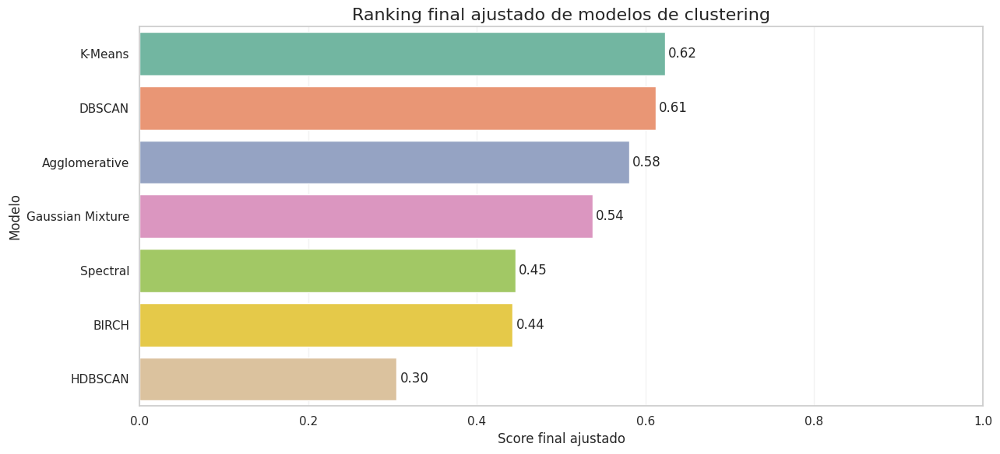

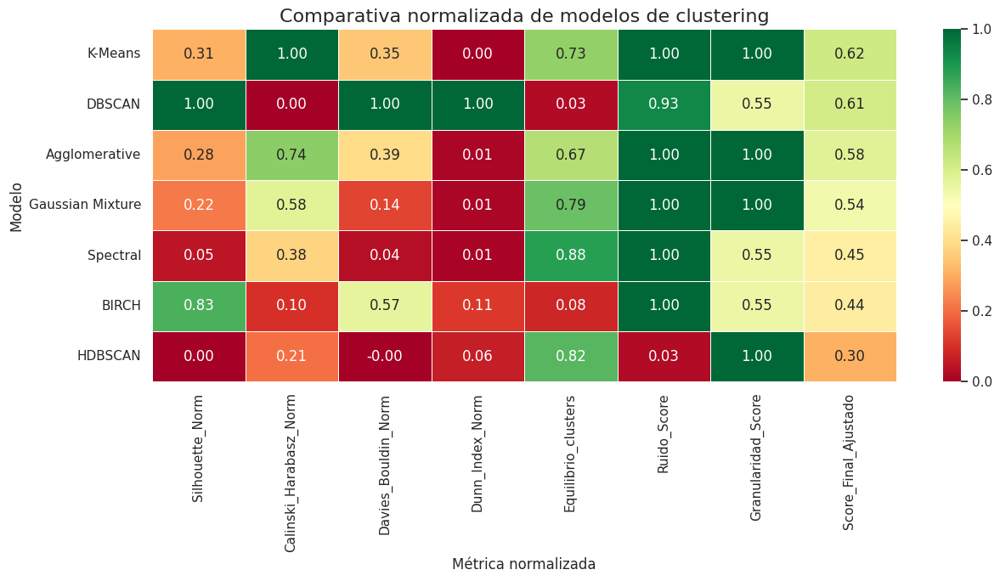

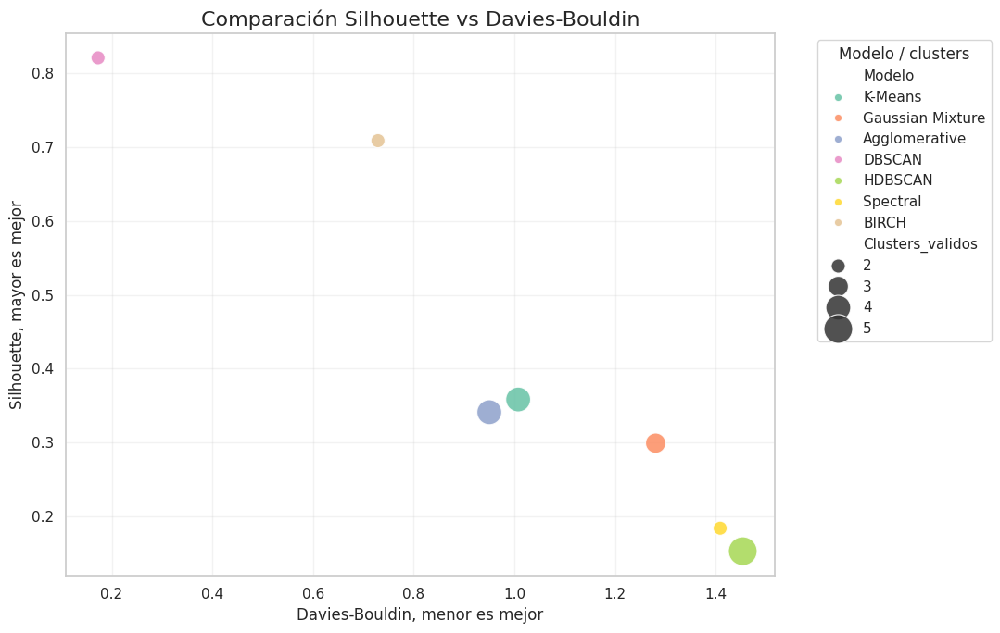

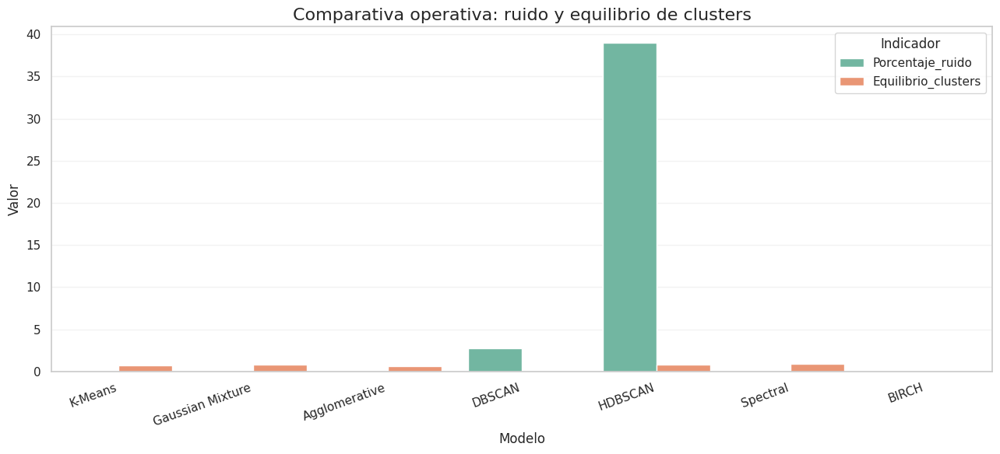


MODELO FINAL SELECCIONADO
Modelo: K-Means
Configuración: K=4

Segmentos finales nombrados:


,Cluster_KMeans_4,Segmento_Final,Clientes,Porcentaje,NetRevenue_mean,NetRevenue_median,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean
0,0,Clientes estándar de bajo valor,2212,51.07,405.97,329.29,268.76,1.68,25.30,0.00,0.01,0.02
1,1,Clientes con alta fricción por devoluciones,35,0.81,184.35,82.56,84.93,1.94,19.57,0.69,0.97,1.00
2,2,Clientes de alto valor y alta actividad,1543,35.63,"4,463.03","2,116.19",507.64,8.60,121.71,0.01,0.15,0.54
3,3,Clientes de valor medio con devoluciones,541,12.49,882.53,616.65,413.87,2.39,39.87,0.07,0.79,1.00


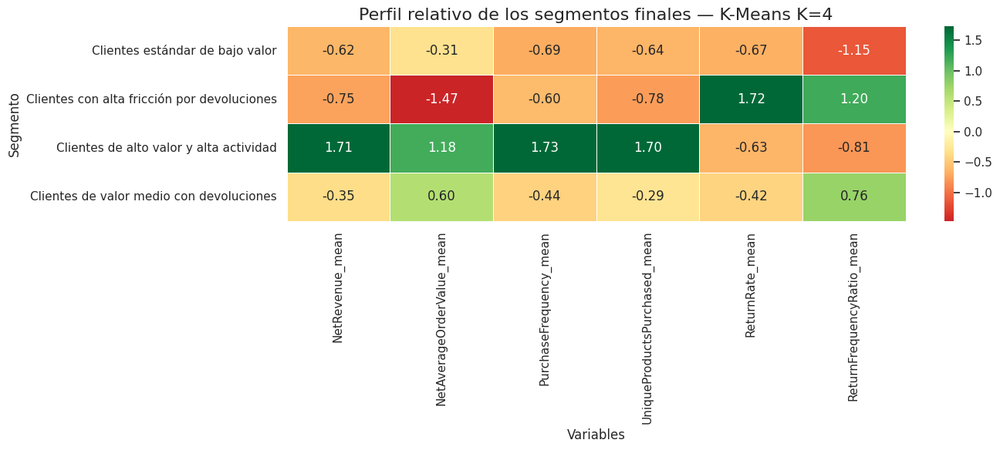

In [46]:
# ============================================================
# CELDA 36 — COMPARATIVA FINAL DE MODELOS DE CLUSTERING
# ============================================================

from sklearn.preprocessing import MinMaxScaler
from scipy.stats import entropy

# ------------------------------------------------------------
# 1. Funciones auxiliares
# ------------------------------------------------------------
def obtener_fila(df, condiciones):
    """
    Devuelve la primera fila de un DataFrame que cumple varias condiciones.
    condiciones debe ser un diccionario: {"columna": valor}
    """
    temp = df.copy()
    for col, val in condiciones.items():
        if isinstance(val, float):
            temp = temp[np.isclose(temp[col].astype(float), val)]
        else:
            temp = temp[temp[col] == val]

    if temp.empty:
        return None

    return temp.iloc[0]


def calcular_equilibrio_clusters(labels, noise_label=-1):
    """
    Calcula equilibrio de tamaños mediante entropía normalizada.
    Ignora el ruido (-1) si existe.
    Valor cercano a 1 = clusters equilibrados.
    Valor cercano a 0 = un cluster domina claramente.
    """
    labels_array = np.asarray(labels)

    labels_validos = labels_array[labels_array != noise_label]

    if len(labels_validos) == 0:
        return 0

    conteos = pd.Series(labels_validos).value_counts().values

    if len(conteos) <= 1:
        return 0

    proporciones = conteos / conteos.sum()

    return entropy(proporciones) / np.log(len(conteos))


def calcular_resumen_labels(labels, noise_label=-1):
    """
    Resume número de clusters, ruido y equilibrio.
    """
    labels_array = np.asarray(labels)

    n_total = len(labels_array)
    n_ruido = int(np.sum(labels_array == noise_label))
    pct_ruido = round(n_ruido / n_total * 100, 2)

    clusters_validos = [x for x in np.unique(labels_array) if x != noise_label]
    n_clusters_validos = len(clusters_validos)

    equilibrio = calcular_equilibrio_clusters(labels_array, noise_label=noise_label)

    return {
        "Clusters_validos": n_clusters_validos,
        "Clientes_ruido": n_ruido,
        "Porcentaje_ruido": pct_ruido,
        "Equilibrio_clusters": equilibrio
    }


def score_granularidad(n_clusters):
    """
    Puntúa si el número de clusters es útil para segmentación comercial.
    Penaliza soluciones demasiado simples o excesivamente fragmentadas.
    Rango preferido: 3 a 6 clusters.
    """
    if n_clusters < 2:
        return 0
    if n_clusters == 2:
        return 0.55
    if 3 <= n_clusters <= 6:
        return 1.00
    if 7 <= n_clusters <= 8:
        return 0.75
    return 0.50


def score_ruido(pct_ruido):
    """
    Penaliza el ruido excesivo.
    En modelos no basados en densidad el ruido será 0%.
    """
    return max(0, 1 - (pct_ruido / 40))


# ------------------------------------------------------------
# 2. Crear tabla base con candidatos finales
# ------------------------------------------------------------
comparativa_modelos = []

# ------------------------------
# K-Means K=4
# ------------------------------
row = obtener_fila(resultados_kmeans_df, {"K": 4})
labels = clientes_kmeans["Cluster_KMeans_4"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "K-Means",
    "Configuracion": "K=4",
    "Segmentacion": "Clientes estándar, alto valor, valor medio con devoluciones, alta fricción",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": row["Stability_ARI"],
    **resumen_labels
})

# ------------------------------
# Gaussian Mixture Model — 3 componentes
# ------------------------------
row = obtener_fila(resultados_gmm_df, {"Componentes": 3})
labels = clientes_gmm["Cluster_GMM"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "Gaussian Mixture",
    "Configuracion": "Componentes=3",
    "Segmentacion": "Macrosegmentos probabilísticos por valor y devolución",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": row["Stability_ARI"],
    **resumen_labels
})

# ------------------------------
# Agglomerative K=4
# ------------------------------
row = obtener_fila(resultados_agglomerative_df, {"K": 4})
labels = clientes_agglomerative["Cluster_Agglomerative"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "Agglomerative",
    "Configuracion": "K=4, linkage=ward",
    "Segmentacion": "Estructura jerárquica de 4 grupos",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": row["Stability_ARI"],
    **resumen_labels
})

# ------------------------------
# DBSCAN
# ------------------------------
row = obtener_fila(resultados_dbscan_df, {"eps": 1.25, "min_samples": 10})
labels = clientes_dbscan["Cluster_DBSCAN"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "DBSCAN",
    "Configuracion": "eps=1.25, min_samples=10",
    "Segmentacion": "Detección de outliers, no segmentación principal",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": np.nan,
    **resumen_labels
})

# ------------------------------
# HDBSCAN
# ------------------------------
row = obtener_fila(resultados_hdbscan_df, {"min_cluster_size": 100, "min_samples": 20})
labels = clientes_hdbscan["Cluster_HDBSCAN"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "HDBSCAN",
    "Configuracion": "min_cluster_size=100, min_samples=20",
    "Segmentacion": "Clusters de densidad variable y ruido comercial",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": np.nan,
    **resumen_labels
})

# ------------------------------
# Spectral Clustering K=2
# ------------------------------
row = obtener_fila(resultados_spectral_df, {"K": 2})
labels = clientes_spectral["Cluster_Spectral"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "Spectral",
    "Configuracion": "K=2, nearest_neighbors",
    "Segmentacion": "Macrosegmentación valor alto/bajo",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": row["Stability_ARI"],
    **resumen_labels
})

# ------------------------------
# BIRCH K=2 threshold=0.7
# ------------------------------
row = obtener_fila(resultados_birch_df, {"K": 2, "threshold": 0.7})
labels = clientes_birch["Cluster_BIRCH"].values

resumen_labels = calcular_resumen_labels(labels)

comparativa_modelos.append({
    "Modelo": "BIRCH",
    "Configuracion": "K=2, threshold=0.7",
    "Segmentacion": "Grupo general + clientes de alta devolución",
    "Silhouette": row["Silhouette"],
    "Calinski_Harabasz": row["Calinski_Harabasz"],
    "Davies_Bouldin": row["Davies_Bouldin"],
    "Dunn_Index": row["Dunn_Index"],
    "Stability_ARI": row["Stability_ARI"],
    **resumen_labels
})


comparativa_modelos_df = pd.DataFrame(comparativa_modelos)

# Redondeo inicial
columnas_redondear = [
    "Silhouette",
    "Calinski_Harabasz",
    "Davies_Bouldin",
    "Dunn_Index",
    "Stability_ARI",
    "Equilibrio_clusters"
]

comparativa_modelos_df[columnas_redondear] = comparativa_modelos_df[columnas_redondear].round(4)

print("Comparativa base de modelos candidatos:")
display(comparativa_modelos_df)


# ------------------------------------------------------------
# 3. Normalización de métricas comunes
# ------------------------------------------------------------
comparativa_norm = comparativa_modelos_df.copy()

metricas_mayor_mejor = [
    "Silhouette",
    "Calinski_Harabasz",
    "Dunn_Index"
]

metricas_menor_mejor = [
    "Davies_Bouldin"
]

# Rellenar posibles NaN con mediana para poder comparar
for col in metricas_mayor_mejor + metricas_menor_mejor:
    if comparativa_norm[col].isnull().any():
        comparativa_norm[col] = comparativa_norm[col].fillna(comparativa_norm[col].median())

scaler = MinMaxScaler()

comparativa_norm[[m + "_Norm" for m in metricas_mayor_mejor]] = (
    scaler.fit_transform(comparativa_norm[metricas_mayor_mejor])
)

for metrica in metricas_menor_mejor:
    valores_norm = scaler.fit_transform(comparativa_norm[[metrica]])
    comparativa_norm[metrica + "_Norm"] = 1 - valores_norm

# Scores operativos
comparativa_norm["Ruido_Score"] = comparativa_norm["Porcentaje_ruido"].apply(score_ruido)
comparativa_norm["Granularidad_Score"] = comparativa_norm["Clusters_validos"].apply(score_granularidad)

metricas_norm = [
    "Silhouette_Norm",
    "Calinski_Harabasz_Norm",
    "Dunn_Index_Norm",
    "Davies_Bouldin_Norm"
]

comparativa_norm["Score_Metricas"] = comparativa_norm[metricas_norm].mean(axis=1)

comparativa_norm["Score_Final_Ajustado"] = (
    comparativa_norm["Score_Metricas"] * 0.55 +
    comparativa_norm["Equilibrio_clusters"] * 0.20 +
    comparativa_norm["Ruido_Score"] * 0.15 +
    comparativa_norm["Granularidad_Score"] * 0.10
)

comparativa_norm["Score_Final_Ajustado"] = comparativa_norm["Score_Final_Ajustado"].round(4)

ranking_modelos_df = comparativa_norm.sort_values(
    by="Score_Final_Ajustado",
    ascending=False
).reset_index(drop=True)

print("\nRanking final ajustado de modelos:")
display(
    ranking_modelos_df[
        [
            "Modelo",
            "Configuracion",
            "Clusters_validos",
            "Porcentaje_ruido",
            "Equilibrio_clusters",
            "Silhouette",
            "Davies_Bouldin",
            "Score_Metricas",
            "Ruido_Score",
            "Granularidad_Score",
            "Score_Final_Ajustado",
            "Segmentacion"
        ]
    ]
)


# ------------------------------------------------------------
# 4. Gráfico 1 — Ranking final ajustado
# ------------------------------------------------------------
plt.figure(figsize=(13, 6))

ax = sns.barplot(
    data=ranking_modelos_df,
    x="Score_Final_Ajustado",
    y="Modelo",
    hue="Modelo",
    dodge=False,
    palette="Set2"
)

plt.title("Ranking final ajustado de modelos de clustering", fontsize=16)
plt.xlabel("Score final ajustado")
plt.ylabel("Modelo")
plt.xlim(0, 1)
plt.grid(axis="x", alpha=0.25)
plt.legend([], [], frameon=False)

for container in ax.containers:
    ax.bar_label(container, fmt="%.2f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 5. Gráfico 2 — Heatmap de métricas normalizadas
# ------------------------------------------------------------
heatmap_metricas = ranking_modelos_df.set_index("Modelo")[
    [
        "Silhouette_Norm",
        "Calinski_Harabasz_Norm",
        "Davies_Bouldin_Norm",
        "Dunn_Index_Norm",
        "Equilibrio_clusters",
        "Ruido_Score",
        "Granularidad_Score",
        "Score_Final_Ajustado"
    ]
]

plt.figure(figsize=(13, 7))

sns.heatmap(
    heatmap_metricas,
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    linewidths=0.5,
    vmin=0,
    vmax=1
)

plt.title("Comparativa normalizada de modelos de clustering", fontsize=16)
plt.xlabel("Métrica normalizada")
plt.ylabel("Modelo")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Gráfico 3 — Silhouette vs Davies-Bouldin
# ------------------------------------------------------------
plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=comparativa_modelos_df,
    x="Davies_Bouldin",
    y="Silhouette",
    hue="Modelo",
    size="Clusters_validos",
    sizes=(120, 500),
    alpha=0.85,
    palette="Set2"
)

plt.title("Comparación Silhouette vs Davies-Bouldin", fontsize=16)
plt.xlabel("Davies-Bouldin, menor es mejor")
plt.ylabel("Silhouette, mayor es mejor")
plt.grid(True, alpha=0.25)
plt.legend(title="Modelo / clusters", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 7. Gráfico 4 — Ruido y equilibrio de clusters
# ------------------------------------------------------------
comparativa_operativa_plot = comparativa_modelos_df[
    ["Modelo", "Porcentaje_ruido", "Equilibrio_clusters"]
].melt(
    id_vars="Modelo",
    var_name="Indicador",
    value_name="Valor"
)

plt.figure(figsize=(13, 6))

sns.barplot(
    data=comparativa_operativa_plot,
    x="Modelo",
    y="Valor",
    hue="Indicador",
    palette="Set2"
)

plt.title("Comparativa operativa: ruido y equilibrio de clusters", fontsize=16)
plt.xlabel("Modelo")
plt.ylabel("Valor")
plt.xticks(rotation=20, ha="right")
plt.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 8. Selección final del modelo y nombres de segmentos
# ------------------------------------------------------------
modelo_final_clustering = "K-Means"
configuracion_final_clustering = "K=4"

clientes_segmentados_final = clientes_kmeans.copy()

nombres_segmentos_finales = {
    0: "Clientes estándar de bajo valor",
    1: "Clientes con alta fricción por devoluciones",
    2: "Clientes de alto valor y alta actividad",
    3: "Clientes de valor medio con devoluciones"
}

clientes_segmentados_final["Segmento_Final"] = (
    clientes_segmentados_final["Cluster_KMeans_4"]
    .map(nombres_segmentos_finales)
)

resumen_segmentos_finales = (
    clientes_segmentados_final
    .groupby(["Cluster_KMeans_4", "Segmento_Final"])
    .agg(
        Clientes=("CustomerID", "count"),
        NetRevenue_mean=("NetRevenue", "mean"),
        NetRevenue_median=("NetRevenue", "median"),
        NetAverageOrderValue_mean=("NetAverageOrderValue", "mean"),
        PurchaseFrequency_mean=("PurchaseFrequency", "mean"),
        UniqueProductsPurchased_mean=("UniqueProductsPurchased", "mean"),
        ReturnRate_mean=("ReturnRate", "mean"),
        ReturnFrequencyRatio_mean=("ReturnFrequencyRatio", "mean"),
        HasReturns_mean=("HasReturns", "mean")
    )
    .reset_index()
)

resumen_segmentos_finales["Porcentaje"] = (
    resumen_segmentos_finales["Clientes"] / len(clientes_segmentados_final) * 100
).round(2)

cols_metricas_segmentos = [
    "NetRevenue_mean",
    "NetRevenue_median",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean",
    "HasReturns_mean"
]

resumen_segmentos_finales[cols_metricas_segmentos] = (
    resumen_segmentos_finales[cols_metricas_segmentos].round(2)
)

resumen_segmentos_finales = resumen_segmentos_finales[
    [
        "Cluster_KMeans_4",
        "Segmento_Final",
        "Clientes",
        "Porcentaje",
        "NetRevenue_mean",
        "NetRevenue_median",
        "NetAverageOrderValue_mean",
        "PurchaseFrequency_mean",
        "UniqueProductsPurchased_mean",
        "ReturnRate_mean",
        "ReturnFrequencyRatio_mean",
        "HasReturns_mean"
    ]
]

print("\nMODELO FINAL SELECCIONADO")
print(f"Modelo: {modelo_final_clustering}")
print(f"Configuración: {configuracion_final_clustering}")

print("\nSegmentos finales nombrados:")
display(resumen_segmentos_finales)


# ------------------------------------------------------------
# 9. Heatmap final de segmentos seleccionados
# ------------------------------------------------------------
variables_heatmap_final = [
    "NetRevenue_mean",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean"
]

heatmap_segmentos = resumen_segmentos_finales.set_index("Segmento_Final")[variables_heatmap_final]

scaler_segmentos = StandardScaler()

heatmap_segmentos_scaled = pd.DataFrame(
    scaler_segmentos.fit_transform(heatmap_segmentos),
    index=heatmap_segmentos.index,
    columns=heatmap_segmentos.columns
)

plt.figure(figsize=(14, 6))

sns.heatmap(
    heatmap_segmentos_scaled,
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0,
    linewidths=0.5
)

plt.title("Perfil relativo de los segmentos finales — K-Means K=4", fontsize=16)
plt.xlabel("Variables")
plt.ylabel("Segmento")
plt.tight_layout()
plt.show()

Pensó durante 6s

Sí. Esta celda ya cierra correctamente la fase comparativa de modelos. La lectura importante es que el ranking numérico coloca a K-Means primero, pero también muestra algo que debemos explicar bien: DBSCAN aparece muy cerca en score ajustado, pero no es válido como modelo final de segmentación comercial porque su estructura no genera segmentos accionables.

Análisis de la celda comparativa final

El ranking final ajustado sitúa a K-Means como mejor modelo, con un score de 0,62. Le siguen DBSCAN con 0,61, Agglomerative con 0,58, Gaussian Mixture con 0,54, Spectral con 0,45, BIRCH con 0,44 y HDBSCAN con 0,30.

Aunque la diferencia entre K-Means y DBSCAN es pequeña en el score global, la interpretación de negocio es muy distinta. DBSCAN obtiene buenos valores en algunas métricas internas, especialmente Silhouette y Davies-Bouldin, porque separa pocos puntos extremos y deja casi todos los clientes en un único grupo. Sin embargo, su segmentación real no es útil para marketing: concentra el 96,95% de los clientes en un solo cluster, separa solo 11 clientes en otro cluster y marca 121 clientes como ruido. Por tanto, DBSCAN sirve como detector de outliers, pero no como modelo principal de segmentación.

K-Means, en cambio, obtiene el mejor equilibrio general. No es el mejor en todas las métricas aisladas, pero sí combina mejor los criterios técnicos y de negocio: genera 4 segmentos, no deja clientes sin clasificar, tiene buena estabilidad, buena granularidad, interpretación clara y grupos comercialmente accionables.

El heatmap comparativo refuerza esta lectura. K-Means destaca especialmente en Calinski-Harabasz, ruido cero, granularidad máxima y mejor score final ajustado. Agglomerative también tiene buen comportamiento y aparece como alternativa fuerte, pero su score final es inferior y su estabilidad era menor. Gaussian Mixture ofrece una segmentación estable, pero más general. Spectral y BIRCH producen segmentaciones demasiado simples o desequilibradas. HDBSCAN identifica grupos interesantes, pero penaliza mucho por su elevado porcentaje de ruido.

La gráfica Silhouette vs Davies-Bouldin también requiere una explicación cuidadosa. DBSCAN y BIRCH aparecen muy bien posicionados en métricas internas, pero esto puede ser engañoso si se analiza sin mirar la distribución de clientes. BIRCH, por ejemplo, separa un grupo de solo 42 clientes y deja el 99,03% restante en un único cluster. Técnicamente obtiene buen Silhouette, pero comercialmente no segmenta la base de clientes de forma útil.

La gráfica operativa de ruido y equilibrio confirma que los modelos basados en densidad tienen un comportamiento distinto. DBSCAN tiene poco ruido, pero poca segmentación real. HDBSCAN tiene demasiado ruido, con 38,95% de clientes sin asignar a un cluster formal. Para una segmentación de clientes orientada a marketing, este nivel de ruido es demasiado alto.

Decisión final

La selección final de K-Means con K=4 es correcta.

No se selecciona porque gane todas las métricas individuales, sino porque ofrece el mejor equilibrio entre:

calidad métrica,

estabilidad,

ausencia de ruido,

granularidad comercial,

interpretabilidad,

facilidad de defensa académica,

y capacidad de convertir los clusters en acciones de marketing.

Los segmentos finales quedan bien definidos:

Segmento	Clientes	%	Interpretación
Clientes estándar de bajo valor	2.212	51,07%	Clientes mayoritarios, baja compra, casi sin devoluciones
Clientes con alta fricción por devoluciones	35	0,81%	Clientes pequeños en número, pero con devolución muy elevada
Clientes de alto valor y alta actividad	1.543	35,63%	Segmento estratégico, alto valor y baja devolución relativa
Clientes de valor medio con devoluciones	541	12,49%	Clientes con valor moderado y devoluciones relevantes
Interpretación de los segmentos finales

El segmento Clientes estándar de bajo valor concentra la mayoría de la base, con 2.212 clientes. Tiene un valor neto medio de 405,97, frecuencia media de 1,68 compras y apenas devoluciones. Es un grupo de clientes ocasionales o poco activos. Su oportunidad principal es aumentar recurrencia mediante campañas automatizadas, recomendaciones básicas y acciones de reactivación de bajo coste.

El segmento Clientes con alta fricción por devoluciones es pequeño, con solo 35 clientes, pero muy relevante. Tiene el valor neto medio más bajo, 184,35, y una tasa media de devolución de 0,69. Además, todos los clientes de este grupo tienen devoluciones. Este segmento debe analizarse con cautela: puede representar problemas de producto, expectativas mal gestionadas, incidencias logísticas o patrones de devolución recurrentes. No debe ser prioritario para descuentos agresivos.

El segmento Clientes de alto valor y alta actividad es el grupo más estratégico. Agrupa 1.543 clientes, el 35,63% del total. Presenta un valor neto medio de 4.463,03, una frecuencia media de 8,60 compras y 121,71 productos únicos comprados de media. Aunque el 54% tiene alguna devolución, la tasa media de devolución es solo 0,01, por lo que el impacto de las devoluciones sobre la rentabilidad es bajo. Este segmento debe ser el foco de fidelización, retención y campañas premium.

El segmento Clientes de valor medio con devoluciones agrupa 541 clientes, el 12,49%. Tiene un valor neto medio de 882,53, ticket medio neto de 413,87 y tasa media de devolución de 0,07. Todos tienen devoluciones. No son clientes problemáticos extremos, pero sí requieren control, mejora de recomendación y reducción de incertidumbre antes de la compra.

Texto para la memoria — Celda 36

Tras entrenar y evaluar los distintos modelos de clustering, se realizó una comparación final entre las configuraciones candidatas de cada algoritmo. Se compararon modelos particionales, probabilísticos, jerárquicos, basados en densidad, basados en grafos y modelos incrementales: K-Means, Gaussian Mixture Model, Agglomerative Clustering, DBSCAN, HDBSCAN, Spectral Clustering y BIRCH.

Para realizar una comparación homogénea, se construyó un ranking final ajustado a partir de métricas internas normalizadas y criterios operativos. Se tuvieron en cuenta métricas como Silhouette, Calinski-Harabasz, Davies-Bouldin y Dunn Index, además de factores prácticos como el equilibrio de tamaños, el porcentaje de ruido y la granularidad comercial de la segmentación.

El modelo con mejor puntuación final fue K-Means con K=4, con un score ajustado de 0,62. DBSCAN obtuvo una puntuación cercana, con 0,61, pero su distribución de clusters no fue adecuada para segmentación comercial, ya que concentró prácticamente toda la base de clientes en un único grupo. Por este motivo, DBSCAN se considera útil como técnica complementaria de detección de outliers, pero no como modelo principal.

Agglomerative Clustering obtuvo un score de 0,58 y se comportó como una alternativa competitiva, aunque con menor estabilidad que K-Means. Gaussian Mixture Model obtuvo un score de 0,54 y generó una segmentación estable, pero más general. Spectral Clustering y BIRCH ofrecieron segmentaciones demasiado simples o desequilibradas. HDBSCAN permitió detectar perfiles de densidad variable, pero clasificó un porcentaje elevado de clientes como ruido, lo que limitó su utilidad como segmentación principal.

A partir de esta comparación, se seleccionó K-Means con K=4 como modelo final. Esta elección se justifica por su equilibrio entre calidad métrica, estabilidad, ausencia de ruido, facilidad de interpretación y utilidad comercial. Además, permite construir cuatro segmentos diferenciados y accionables.

Los segmentos finales obtenidos fueron: “Clientes estándar de bajo valor”, “Clientes con alta fricción por devoluciones”, “Clientes de alto valor y alta actividad” y “Clientes de valor medio con devoluciones”.

El segmento de clientes estándar de bajo valor agrupó 2.212 clientes, equivalentes al 51,07% del total. Presentó bajo valor neto, baja frecuencia de compra y ausencia casi total de devoluciones. El segmento de clientes con alta fricción por devoluciones agrupó 35 clientes, equivalentes al 0,81%, con bajo valor neto y una tasa de devolución muy elevada. El segmento de clientes de alto valor y alta actividad agrupó 1.543 clientes, equivalentes al 35,63%, y presentó el mayor valor neto, mayor frecuencia de compra y mayor variedad de productos. Por último, el segmento de clientes de valor medio con devoluciones agrupó 541 clientes, equivalentes al 12,49%, con valor comercial moderado y presencia relevante de devoluciones.

La segmentación final permite diferenciar clientes no solo por volumen de compra, sino por valor neto y comportamiento de devolución. Esto aporta una visión más realista de la rentabilidad del cliente y permite orientar estrategias diferenciadas de fidelización, reactivación, control de devoluciones y mejora de experiencia de compra.

Conclusión final de la fase de clustering

El análisis comparativo confirma que K-Means con K=4 es el modelo más adecuado para esta línea de trabajo. Aunque otros modelos obtienen buenos resultados en métricas concretas, K-Means ofrece la segmentación más equilibrada y accionable. La solución final permite identificar clientes de bajo valor, clientes estratégicos de alto valor, clientes de valor medio con devoluciones y clientes con alta fricción comercial.

Desde el punto de vista de negocio, el segmento prioritario es el de clientes de alto valor y alta actividad, ya que concentra una parte importante del valor neto y mantiene devoluciones controladas. El segmento de clientes estándar representa una oportunidad de reactivación. Los segmentos con devoluciones permiten orientar acciones específicas para reducir fricción, mejorar información de producto y proteger la rentabilidad.

Por tanto, la principal aportación del modelo es que no se limita a segmentar por ventas brutas, sino que incorpora el efecto de las devoluciones para estimar mejor el valor real del cliente.

MODELO FINAL SELECCIONADO
Modelo: K-Means
Configuración: K=4
Motivo principal: mejor equilibrio entre métricas, estabilidad, interpretabilidad y utilidad comercial.

RESUMEN FINAL DE SEGMENTOS


,Cluster_KMeans_4,Segmento_Final,Clientes,Porcentaje,NetRevenue_mean,NetRevenue_median,NetAverageOrderValue_mean,PurchaseFrequency_mean,UniqueProductsPurchased_mean,ReturnRate_mean,ReturnFrequencyRatio_mean,HasReturns_mean
0,0,Clientes estándar de bajo valor,2212,51.07,405.97,329.29,268.76,1.68,25.30,0.00,0.01,0.02
1,1,Clientes con alta fricción por devoluciones,35,0.81,184.35,82.56,84.93,1.94,19.57,0.69,0.97,1.00
2,2,Clientes de alto valor y alta actividad,1543,35.63,"4,463.03","2,116.19",507.64,8.60,121.71,0.01,0.15,0.54
3,3,Clientes de valor medio con devoluciones,541,12.49,882.53,616.65,413.87,2.39,39.87,0.07,0.79,1.00


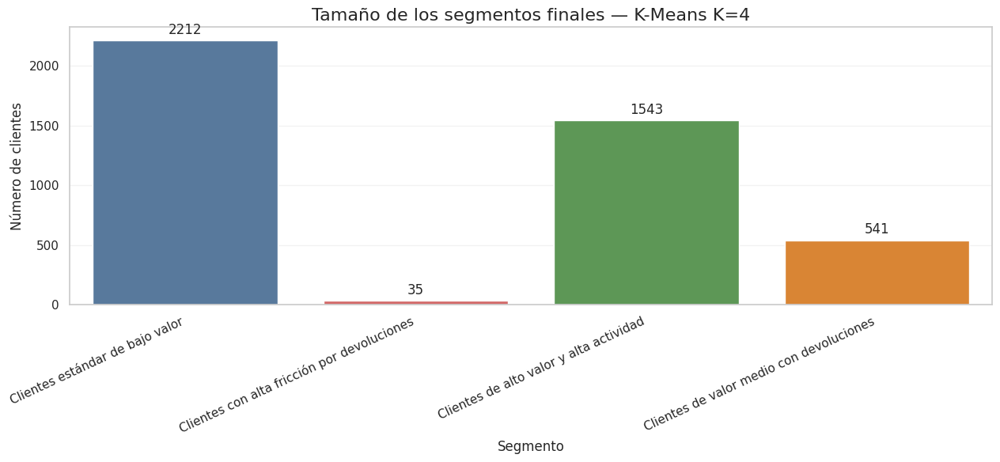

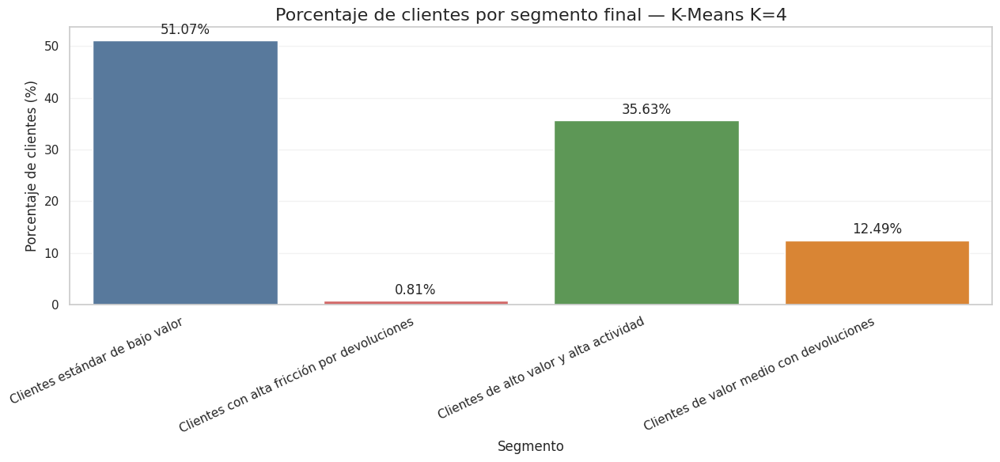

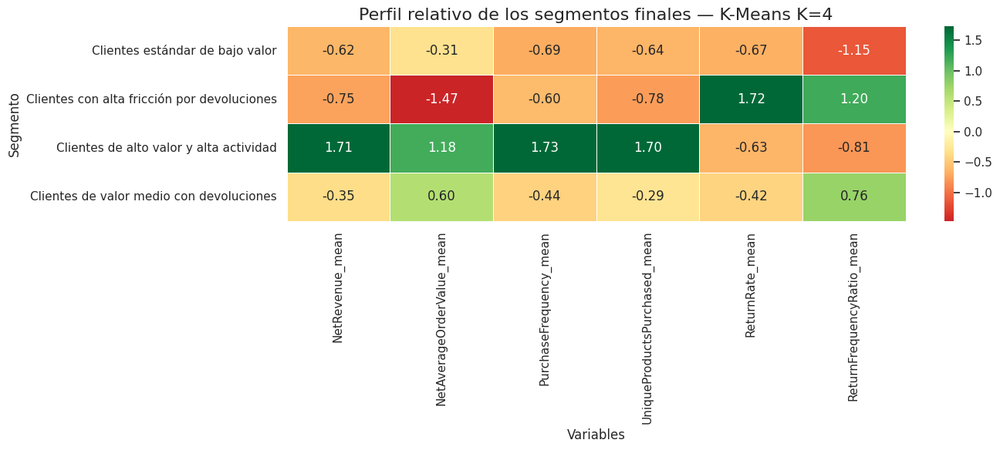

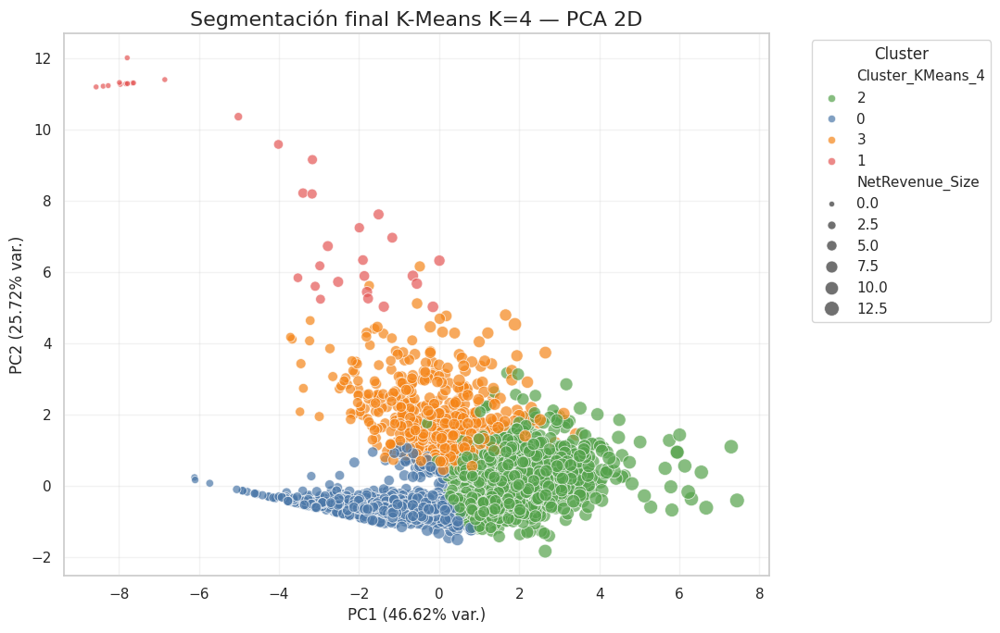

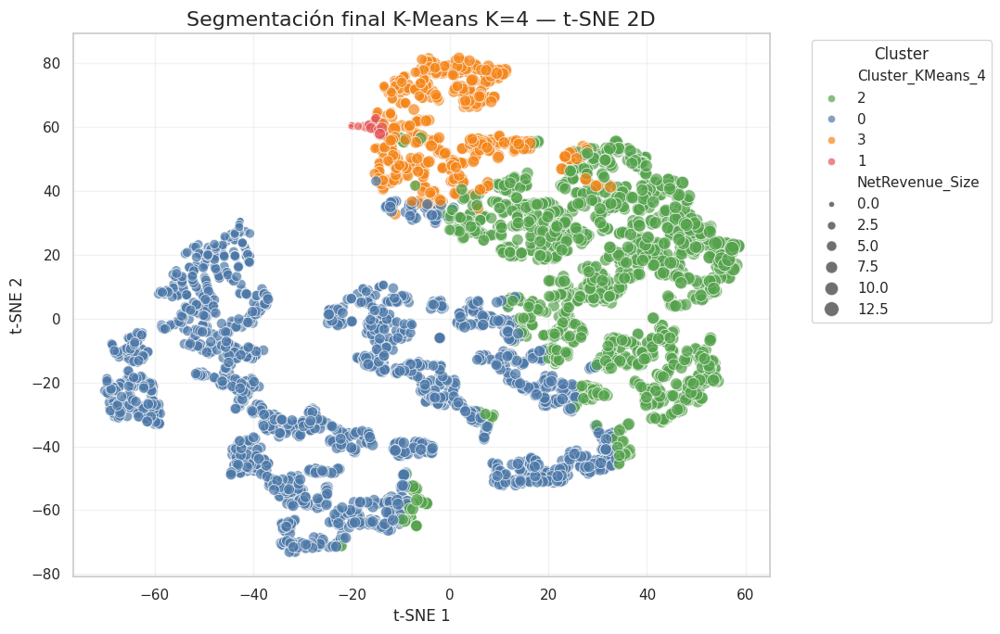

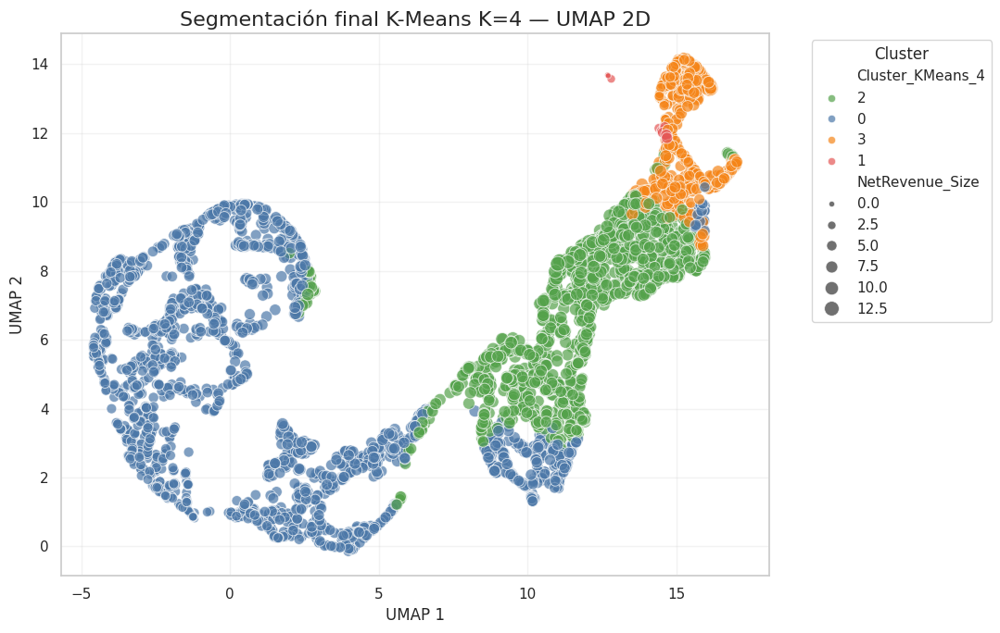

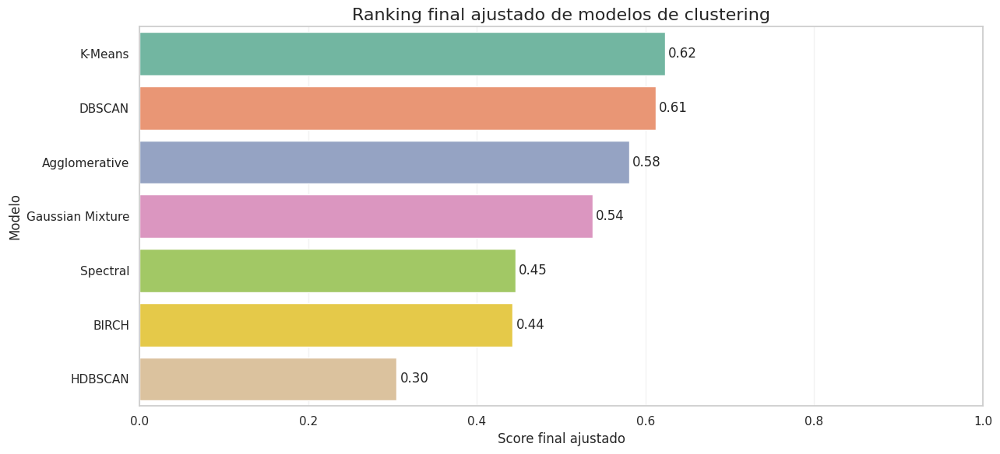


ANÁLISIS FINAL DE LA FASE DE CLUSTERING

Tras entrenar y comparar los modelos K-Means, Gaussian Mixture Model, Agglomerative Clustering,
DBSCAN, HDBSCAN, Spectral Clustering y BIRCH, se selecciona K-Means con K=4 como modelo final
de segmentación de clientes.

La elección no se basa únicamente en una métrica aislada, sino en el equilibrio entre calidad
métrica, estabilidad, ausencia de ruido, granularidad comercial, separación visual e
interpretabilidad de negocio. Los modelos basados en densidad, como DBSCAN y HDBSCAN, aportaron
valor para detectar clientes atípicos, pero no fueron adecuados como segmentación principal:
DBSCAN concentró prácticamente todos los clientes en un único grupo y HDBSCAN clasificó un
porcentaje elevado de clientes como ruido. Spectral Clustering y BIRCH generaron soluciones
demasiado generales o desequilibradas. GMM y Agglomerative fueron alternativas válidas, aunque
menos útiles que K-Means desde el punto de vista operativo.

La segmentación final K-Means K

In [48]:
# ============================================================
# CELDA 37 — CIERRE FINAL DEL CLUSTERING
# Comparativa, modelo final, visualizaciones PCA/t-SNE/UMAP
# y análisis final de negocio
# ============================================================

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import plotly.express as px

# Intentar importar UMAP si está disponible
try:
    import umap
    UMAP_DISPONIBLE = True
except Exception:
    UMAP_DISPONIBLE = False
    print("UMAP no está disponible. Se omitirán las visualizaciones UMAP.")

# ------------------------------------------------------------
# 1. Confirmar modelo final
# ------------------------------------------------------------
modelo_final = "K-Means"
configuracion_final = "K=4"
cluster_final_col = "Cluster_KMeans_4"

clientes_segmentados_final = clientes_kmeans.copy()

nombres_segmentos_finales = {
    0: "Clientes estándar de bajo valor",
    1: "Clientes con alta fricción por devoluciones",
    2: "Clientes de alto valor y alta actividad",
    3: "Clientes de valor medio con devoluciones"
}

clientes_segmentados_final["Segmento_Final"] = (
    clientes_segmentados_final[cluster_final_col]
    .map(nombres_segmentos_finales)
)

print("MODELO FINAL SELECCIONADO")
print(f"Modelo: {modelo_final}")
print(f"Configuración: {configuracion_final}")
print("Motivo principal: mejor equilibrio entre métricas, estabilidad, interpretabilidad y utilidad comercial.")


# ------------------------------------------------------------
# 2. Resumen final de segmentos
# ------------------------------------------------------------
resumen_segmentos_finales = (
    clientes_segmentados_final
    .groupby([cluster_final_col, "Segmento_Final"])
    .agg(
        Clientes=("CustomerID", "count"),
        NetRevenue_mean=("NetRevenue", "mean"),
        NetRevenue_median=("NetRevenue", "median"),
        NetAverageOrderValue_mean=("NetAverageOrderValue", "mean"),
        PurchaseFrequency_mean=("PurchaseFrequency", "mean"),
        UniqueProductsPurchased_mean=("UniqueProductsPurchased", "mean"),
        ReturnRate_mean=("ReturnRate", "mean"),
        ReturnFrequencyRatio_mean=("ReturnFrequencyRatio", "mean"),
        HasReturns_mean=("HasReturns", "mean")
    )
    .reset_index()
)

resumen_segmentos_finales["Porcentaje"] = (
    resumen_segmentos_finales["Clientes"] / len(clientes_segmentados_final) * 100
).round(2)

cols_redondear = [
    "NetRevenue_mean",
    "NetRevenue_median",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean",
    "HasReturns_mean"
]

resumen_segmentos_finales[cols_redondear] = (
    resumen_segmentos_finales[cols_redondear]
    .round(2)
)

resumen_segmentos_finales = resumen_segmentos_finales[
    [
        cluster_final_col,
        "Segmento_Final",
        "Clientes",
        "Porcentaje",
        "NetRevenue_mean",
        "NetRevenue_median",
        "NetAverageOrderValue_mean",
        "PurchaseFrequency_mean",
        "UniqueProductsPurchased_mean",
        "ReturnRate_mean",
        "ReturnFrequencyRatio_mean",
        "HasReturns_mean"
    ]
]

print("\nRESUMEN FINAL DE SEGMENTOS")
display(resumen_segmentos_finales)


# ------------------------------------------------------------
# 3. Gráfico de tamaño de segmentos
# ------------------------------------------------------------
plt.figure(figsize=(13, 6))

ax = sns.barplot(
    data=resumen_segmentos_finales,
    x="Segmento_Final",
    y="Clientes",
    hue="Segmento_Final",
    dodge=False,
    palette=["#4C78A8", "#E45756", "#54A24B", "#F58518"]
)

plt.title("Tamaño de los segmentos finales — K-Means K=4", fontsize=16)
plt.xlabel("Segmento")
plt.ylabel("Número de clientes")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.25)
plt.legend([], [], frameon=False)

for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 4. Gráfico de porcentaje de segmentos
# ------------------------------------------------------------
plt.figure(figsize=(13, 6))

ax = sns.barplot(
    data=resumen_segmentos_finales,
    x="Segmento_Final",
    y="Porcentaje",
    hue="Segmento_Final",
    dodge=False,
    palette=["#4C78A8", "#E45756", "#54A24B", "#F58518"]
)

plt.title("Porcentaje de clientes por segmento final — K-Means K=4", fontsize=16)
plt.xlabel("Segmento")
plt.ylabel("Porcentaje de clientes (%)")
plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", alpha=0.25)
plt.legend([], [], frameon=False)

for container in ax.containers:
    ax.bar_label(container, fmt="%.2f%%", padding=3)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 5. Heatmap relativo de segmentos finales
# ------------------------------------------------------------
variables_heatmap = [
    "NetRevenue_mean",
    "NetAverageOrderValue_mean",
    "PurchaseFrequency_mean",
    "UniqueProductsPurchased_mean",
    "ReturnRate_mean",
    "ReturnFrequencyRatio_mean"
]

heatmap_segmentos = resumen_segmentos_finales.set_index("Segmento_Final")[variables_heatmap]

scaler_heatmap = StandardScaler()

heatmap_segmentos_scaled = pd.DataFrame(
    scaler_heatmap.fit_transform(heatmap_segmentos),
    index=heatmap_segmentos.index,
    columns=heatmap_segmentos.columns
)

plt.figure(figsize=(14, 6))

sns.heatmap(
    heatmap_segmentos_scaled,
    annot=True,
    fmt=".2f",
    cmap="RdYlGn",
    center=0,
    linewidths=0.5
)

plt.title("Perfil relativo de los segmentos finales — K-Means K=4", fontsize=16)
plt.xlabel("Variables")
plt.ylabel("Segmento")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 6. Preparar dataset para visualización dimensional
# ------------------------------------------------------------
visual_final = clientes_segmentados_final.loc[X_scaled_standard.index, [
    "CustomerID",
    "NetRevenue",
    "NetAverageOrderValue",
    "PurchaseFrequency",
    "UniqueProductsPurchased",
    "ReturnRate",
    "ReturnFrequencyRatio",
    "HasReturns",
    cluster_final_col,
    "Segmento_Final"
]].copy()

visual_final[cluster_final_col] = visual_final[cluster_final_col].astype(str)
visual_final["NetRevenue_Size"] = np.log1p(visual_final["NetRevenue"])

palette_final = {
    "0": "#4C78A8",
    "1": "#E45756",
    "2": "#54A24B",
    "3": "#F58518"
}


# ------------------------------------------------------------
# 7. PCA 2D final
# ------------------------------------------------------------
pca_final_2d = PCA(n_components=2, random_state=42)
X_pca_final_2d = pca_final_2d.fit_transform(X_scaled_standard)

pca_final_df = pd.DataFrame(
    X_pca_final_2d,
    columns=["PC1", "PC2"],
    index=X_scaled_standard.index
)

pca_final_df = pd.concat([pca_final_df, visual_final], axis=1)

var_pca_final = pca_final_2d.explained_variance_ratio_

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=pca_final_df,
    x="PC1",
    y="PC2",
    hue=cluster_final_col,
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette=palette_final
)

plt.title("Segmentación final K-Means K=4 — PCA 2D", fontsize=16)
plt.xlabel(f"PC1 ({var_pca_final[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_final[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 8. t-SNE 2D final
# ------------------------------------------------------------
tsne_final = TSNE(
    n_components=2,
    perplexity=30,
    learning_rate="auto",
    init="pca",
    random_state=42
)

X_tsne_final = tsne_final.fit_transform(X_scaled_standard)

tsne_final_df = pd.DataFrame(
    X_tsne_final,
    columns=["TSNE1", "TSNE2"],
    index=X_scaled_standard.index
)

tsne_final_df = pd.concat([tsne_final_df, visual_final], axis=1)

plt.figure(figsize=(11, 7))

sns.scatterplot(
    data=tsne_final_df,
    x="TSNE1",
    y="TSNE2",
    hue=cluster_final_col,
    size="NetRevenue_Size",
    sizes=(20, 130),
    alpha=0.70,
    palette=palette_final
)

plt.title("Segmentación final K-Means K=4 — t-SNE 2D", fontsize=16)
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.grid(True, alpha=0.25)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. UMAP 2D final
# ------------------------------------------------------------
if UMAP_DISPONIBLE:

    umap_final_2d = umap.UMAP(
        n_components=2,
        n_neighbors=30,
        min_dist=0.10,
        metric="euclidean",
        random_state=42
    )

    X_umap_final_2d = umap_final_2d.fit_transform(X_scaled_standard)

    umap_final_df = pd.DataFrame(
        X_umap_final_2d,
        columns=["UMAP1", "UMAP2"],
        index=X_scaled_standard.index
    )

    umap_final_df = pd.concat([umap_final_df, visual_final], axis=1)

    plt.figure(figsize=(11, 7))

    sns.scatterplot(
        data=umap_final_df,
        x="UMAP1",
        y="UMAP2",
        hue=cluster_final_col,
        size="NetRevenue_Size",
        sizes=(20, 130),
        alpha=0.70,
        palette=palette_final
    )

    plt.title("Segmentación final K-Means K=4 — UMAP 2D", fontsize=16)
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.grid(True, alpha=0.25)
    plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# 10. PCA 3D interactivo final
# ------------------------------------------------------------
pca_final_3d = PCA(n_components=3, random_state=42)
X_pca_final_3d = pca_final_3d.fit_transform(X_scaled_standard)

pca_final_3d_df = pd.DataFrame(
    X_pca_final_3d,
    columns=["PC1", "PC2", "PC3"],
    index=X_scaled_standard.index
)

pca_final_3d_df = pd.concat([pca_final_3d_df, visual_final], axis=1)

var_pca_final_3d = pca_final_3d.explained_variance_ratio_

fig_pca_final_3d = px.scatter_3d(
    pca_final_3d_df,
    x="PC1",
    y="PC2",
    z="PC3",
    color=cluster_final_col,
    size="NetRevenue_Size",
    opacity=0.75,
    color_discrete_map=palette_final,
    hover_data={
        "CustomerID": True,
        "Segmento_Final": True,
        "NetRevenue": ":.2f",
        "NetAverageOrderValue": ":.2f",
        "PurchaseFrequency": True,
        "UniqueProductsPurchased": True,
        "ReturnRate": ":.4f",
        "ReturnFrequencyRatio": ":.4f",
        "NetRevenue_Size": False
    },
    title=f"Segmentación final K-Means K=4 — PCA 3D interactivo | Varianza total: {var_pca_final_3d.sum() * 100:.2f}%"
)

fig_pca_final_3d.update_traces(
    marker=dict(
        line=dict(width=0)
    )
)

fig_pca_final_3d.update_layout(
    width=950,
    height=700,
    legend_title_text="Cluster",
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    )
)

fig_pca_final_3d.show()


# ------------------------------------------------------------
# 11. Comparativa final de modelos si existe ranking_modelos_df
# ------------------------------------------------------------
if "ranking_modelos_df" in globals():

    plt.figure(figsize=(13, 6))

    ax = sns.barplot(
        data=ranking_modelos_df,
        x="Score_Final_Ajustado",
        y="Modelo",
        hue="Modelo",
        dodge=False,
        palette="Set2"
    )

    plt.title("Ranking final ajustado de modelos de clustering", fontsize=16)
    plt.xlabel("Score final ajustado")
    plt.ylabel("Modelo")
    plt.xlim(0, 1)
    plt.grid(axis="x", alpha=0.25)
    plt.legend([], [], frameon=False)

    for container in ax.containers:
        ax.bar_label(container, fmt="%.2f", padding=3)

    plt.tight_layout()
    plt.show()


# ------------------------------------------------------------
# 12. Análisis final automático para memoria
# ------------------------------------------------------------
analisis_final_clustering = f"""
ANÁLISIS FINAL DE LA FASE DE CLUSTERING

Tras entrenar y comparar los modelos K-Means, Gaussian Mixture Model, Agglomerative Clustering,
DBSCAN, HDBSCAN, Spectral Clustering y BIRCH, se selecciona K-Means con K=4 como modelo final
de segmentación de clientes.

La elección no se basa únicamente en una métrica aislada, sino en el equilibrio entre calidad
métrica, estabilidad, ausencia de ruido, granularidad comercial, separación visual e
interpretabilidad de negocio. Los modelos basados en densidad, como DBSCAN y HDBSCAN, aportaron
valor para detectar clientes atípicos, pero no fueron adecuados como segmentación principal:
DBSCAN concentró prácticamente todos los clientes en un único grupo y HDBSCAN clasificó un
porcentaje elevado de clientes como ruido. Spectral Clustering y BIRCH generaron soluciones
demasiado generales o desequilibradas. GMM y Agglomerative fueron alternativas válidas, aunque
menos útiles que K-Means desde el punto de vista operativo.

La segmentación final K-Means K=4 permite diferenciar cuatro perfiles comerciales:

1. Clientes estándar de bajo valor:
   Agrupan 2.212 clientes, equivalentes al 51,07% del total. Presentan bajo valor neto,
   baja frecuencia de compra y prácticamente ausencia de devoluciones. Representan clientes
   ocasionales o de baja intensidad comercial. La estrategia recomendada es aumentar recurrencia
   mediante campañas automatizadas, recomendaciones básicas y acciones de reactivación de bajo coste.

2. Clientes con alta fricción por devoluciones:
   Agrupan 35 clientes, equivalentes al 0,81% del total. Presentan el valor neto medio más bajo
   y una tasa de devolución muy elevada. Todos los clientes de este segmento tienen devoluciones.
   Este grupo debe analizarse con cautela, ya que puede indicar incidencias de producto,
   problemas de expectativa, fricción logística o patrones de devolución recurrentes.
   No se recomienda aplicar descuentos agresivos sin analizar primero las causas.

3. Clientes de alto valor y alta actividad:
   Agrupan 1.543 clientes, equivalentes al 35,63% del total. Son el segmento más estratégico:
   presentan el mayor valor neto medio, mayor frecuencia de compra y mayor variedad de productos.
   Aunque una parte de estos clientes registra devoluciones, su tasa media de devolución es baja,
   por lo que mantienen una rentabilidad elevada. Este segmento debe ser prioritario para
   fidelización, retención, programas VIP, venta cruzada y acciones de personalización.

4. Clientes de valor medio con devoluciones:
   Agrupan 541 clientes, equivalentes al 12,49% del total. Presentan valor comercial moderado,
   pero con presencia relevante de devoluciones. No son clientes de alta fricción extrema, pero
   requieren seguimiento para reducir devoluciones evitables mediante mejor información de producto,
   recomendaciones más precisas, guías de compra y acciones postcompra.

La principal aportación de esta segmentación es que no clasifica a los clientes únicamente por ventas
brutas, sino por valor neto y comportamiento de devolución. Esto permite identificar clientes que
compran mucho pero devuelven demasiado, clientes realmente rentables, clientes de bajo valor y
clientes con potencial de crecimiento. Por tanto, el modelo aporta una base sólida para estrategias
de marketing diferenciadas, priorizando rentabilidad, retención y reducción de fricción comercial.
"""

print(analisis_final_clustering)

ANÁLISIS FINAL DE LA FASE DE CLUSTERING

Tras entrenar y comparar los modelos K-Means, Gaussian Mixture Model, Agglomerative Clustering,
DBSCAN, HDBSCAN, Spectral Clustering y BIRCH, se selecciona K-Means con K=4 como modelo final
de segmentación de clientes.

La elección no se basa únicamente en una métrica aislada, sino en el equilibrio entre calidad
métrica, estabilidad, ausencia de ruido, granularidad comercial, separación visual e
interpretabilidad de negocio. Los modelos basados en densidad, como DBSCAN y HDBSCAN, aportaron
valor para detectar clientes atípicos, pero no fueron adecuados como segmentación principal:
DBSCAN concentró prácticamente todos los clientes en un único grupo y HDBSCAN clasificó un
porcentaje elevado de clientes como ruido. Spectral Clustering y BIRCH generaron soluciones
demasiado generales o desequilibradas. GMM y Agglomerative fueron alternativas válidas, aunque
menos útiles que K-Means desde el punto de vista operativo.

La segmentación final K-Means K=4 permite diferenciar cuatro perfiles comerciales:

1. Clientes estándar de bajo valor:
   Agrupan 2.212 clientes, equivalentes al 51,07% del total. Presentan bajo valor neto,
   baja frecuencia de compra y prácticamente ausencia de devoluciones. Representan clientes
   ocasionales o de baja intensidad comercial. La estrategia recomendada es aumentar recurrencia
   mediante campañas automatizadas, recomendaciones básicas y acciones de reactivación de bajo coste.

2. Clientes con alta fricción por devoluciones:
   Agrupan 35 clientes, equivalentes al 0,81% del total. Presentan el valor neto medio más bajo
   y una tasa de devolución muy elevada. Todos los clientes de este segmento tienen devoluciones.
   Este grupo debe analizarse con cautela, ya que puede indicar incidencias de producto,
   problemas de expectativa, fricción logística o patrones de devolución recurrentes.
   No se recomienda aplicar descuentos agresivos sin analizar primero las causas.

3. Clientes de alto valor y alta actividad:
   Agrupan 1.543 clientes, equivalentes al 35,63% del total. Son el segmento más estratégico:
   presentan el mayor valor neto medio, mayor frecuencia de compra y mayor variedad de productos.
   Aunque una parte de estos clientes registra devoluciones, su tasa media de devolución es baja,
   por lo que mantienen una rentabilidad elevada. Este segmento debe ser prioritario para
   fidelización, retención, programas VIP, venta cruzada y acciones de personalización.

4. Clientes de valor medio con devoluciones:
   Agrupan 541 clientes, equivalentes al 12,49% del total. Presentan valor comercial moderado,
   pero con presencia relevante de devoluciones. No son clientes de alta fricción extrema, pero
   requieren seguimiento para reducir devoluciones evitables mediante mejor información de producto,
   recomendaciones más precisas, guías de compra y acciones postcompra.

La principal aportación de esta segmentación es que no clasifica a los clientes únicamente por ventas
brutas, sino por valor neto y comportamiento de devolución. Esto permite identificar clientes que
compran mucho pero devuelven demasiado, clientes realmente rentables, clientes de bajo valor y
clientes con potencial de crecimiento. Por tanto, el modelo aporta una base sólida para estrategias
de marketing diferenciadas, priorizando rentabilidad, retención y reducción de fricción comercial.

Dimensiones ventas usadas: (390521, 15)
Dimensiones devoluciones usadas: (7953, 15)
RESUMEN GENERAL DE PRODUCTOS
Productos únicos vendidos: 3658
Productos con al menos una devolución: 1816
Porcentaje de productos con devolución: 49.64 %
Productos críticos por tasa de devolución >= 15%: 84
Importe total vendido: 8455613.48
Importe total devuelto: 191197.96
Tasa global de devolución por importe: 2.26 %
Cantidad total vendida: 4968010
Cantidad total devuelta: 93985
Tasa global de devolución por cantidad: 1.89 %

TOP 15 productos por importe devuelto:


,StockCode,Description,SalesAmount,ReturnAmount,ReturnAmountRate,SalesQuantity,ReturnQuantity,ReturnQuantityRate,SalesCustomers,ReturnCustomers
1318,22423,REGENCY CAKESTAND 3 TIER,"140,955.25","8,387.55",0.06,12260,741.00,0.06,880,111.00
3454,85123A,WHITE HANGING HEART T-LIGHT HOLDER,"100,356.70","6,588.90",0.07,36694,"2,566.00",0.07,856,38.00
361,21108,FAIRY CAKE FLANNEL ASSORTED COLOUR,"17,253.77","6,553.62",0.38,10052,"3,132.00",0.31,159,2.00
2035,23113,PANTRY CHOPPING BOARD,"5,695.86","4,803.06",0.84,1138,946.00,0.83,39,5.00
2822,48185,DOORMAT FAIRY CAKE,"21,171.79","4,554.90",0.22,3427,674.00,0.20,143,3.00
405,21175,GIN + TONIC DIET METAL SIGN,"24,914.28","3,744.73",0.15,11489,"2,018.00",0.18,330,5.00
2795,47566B,TEA TIME PARTY BUNTING,"10,430.40","3,692.95",0.35,2288,"1,424.00",0.62,192,7.00
1176,22273,FELTCRAFT DOLL MOLLY,"11,748.24","3,512.65",0.30,4464,"1,447.00",0.32,211,5.00
2855,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,"16,566.34","3,246.16",0.20,5654,"1,174.00",0.21,145,22.00
1102,22191,IVORY DINER WALL CLOCK,"11,527.70","2,653.70",0.23,1419,344.00,0.24,239,16.00



TOP 15 productos fiables por tasa de devolución en importe:


,StockCode,Description,SalesAmount,ReturnAmount,ReturnAmountRate,SalesInvoices,ReturnInvoices,SalesCustomers,ReturnCustomers
2609,35400,WOODEN BOX ADVENT CALENDAR,89.50,135.20,1.51,5,8.00,5,8.00
3558,85232B,SET OF 3 BABUSHKA STACKING TINS,"1,321.65","1,258.05",0.95,9,6.00,7,3.00
3424,85071A,BLUE CHARLIE+LOLA PERSONAL DOORSIGN,506.90,442.50,0.87,89,1.00,76,1.00
2035,23113,PANTRY CHOPPING BOARD,"5,695.86","4,803.06",0.84,43,6.00,39,5.00
3808,90185C,BLACK DIAMANTE EXPANDABLE RING,89.25,68.00,0.76,5,3.00,5,2.00
227,20821,GOLDIE LOOKING MIRROR,79.20,59.40,0.75,5,2.00,5,1.00
3372,85023B,EAU DE NILE JEWELLED PHOTOFRAME,232.80,153.75,0.66,12,2.00,10,2.00
3036,84247K,"FOLK ART GREETING CARD,PACK/12",64.90,32.45,0.50,9,1.00,7,1.00
3033,84247E,PACK OF 12 CHRISTMAS FUN CARDS,138.65,67.85,0.49,13,2.00,13,2.00
2952,79191D,RETRO PLASTIC DAISY TRAY,21.25,10.20,0.48,7,1.00,7,1.00



TOP 15 productos fiables por tasa de devolución en cantidad:


,StockCode,Description,SalesQuantity,ReturnQuantity,ReturnQuantityRate,SalesInvoices,ReturnInvoices,SalesCustomers,ReturnCustomers
2609,35400,WOODEN BOX ADVENT CALENDAR,10,16.00,1.60,5,8.00,5,8.00
3049,84347,ROTATING SILVER ANGELS T-LIGHT HLDR,7892,"9,367.00",1.19,305,3.00,192,3.00
3558,85232B,SET OF 3 BABUSHKA STACKING TINS,267,255.00,0.96,9,6.00,7,3.00
2035,23113,PANTRY CHOPPING BOARD,1138,946.00,0.83,43,6.00,39,5.00
3808,90185C,BLACK DIAMANTE EXPANDABLE RING,21,16.00,0.76,5,3.00,5,2.00
227,20821,GOLDIE LOOKING MIRROR,16,12.00,0.75,5,2.00,5,1.00
3372,85023B,EAU DE NILE JEWELLED PHOTOFRAME,104,73.00,0.70,12,2.00,10,2.00
2795,47566B,TEA TIME PARTY BUNTING,2288,"1,424.00",0.62,313,7.00,192,7.00
1968,23055,IVORY CHANDELIER T-LIGHT HOLDER,464,240.00,0.52,35,3.00,33,3.00
475,21275,ZINC TOP 2 DOOR WOODEN SHELF,10,5.00,0.50,9,2.00,9,2.00



TOP 15 productos por número de clientes con devolución:


,StockCode,Description,ReturnCustomers,ReturnInvoices,ReturnAmount,ReturnQuantity,ReturnAmountRate,ReturnQuantityRate
1318,22423,REGENCY CAKESTAND 3 TIER,111.00,172.00,"8,387.55",741.00,0.06,0.06
1858,22960,JAM MAKING SET WITH JARS,70.00,85.00,979.00,240.00,0.03,0.03
1607,22720,SET OF 3 CAKE TINS PANTRY DESIGN,56.00,70.00,715.25,151.00,0.02,0.02
1586,22699,ROSES REGENCY TEACUP AND SAUCER,43.00,51.00,"1,004.35",381.00,0.04,0.04
1553,22666,RECIPE BOX PANTRY YELLOW DESIGN,42.00,46.00,403.35,145.00,0.02,0.02
1584,22697,GREEN REGENCY TEACUP AND SAUCER,39.00,41.00,270.65,95.00,0.02,0.01
3454,85123A,WHITE HANGING HEART T-LIGHT HOLDER,38.00,41.00,"6,588.90","2,566.00",0.07,0.07
446,21232,STRAWBERRY CERAMIC TRINKET BOX,35.00,51.00,399.50,350.00,0.04,0.04
2978,82483,WOOD 2 DRAWER CABINET WHITE FINISH,32.00,37.00,"1,117.75",185.00,0.08,0.08
174,20725,LUNCH BAG RED RETROSPOT,32.00,38.00,526.75,351.00,0.02,0.02


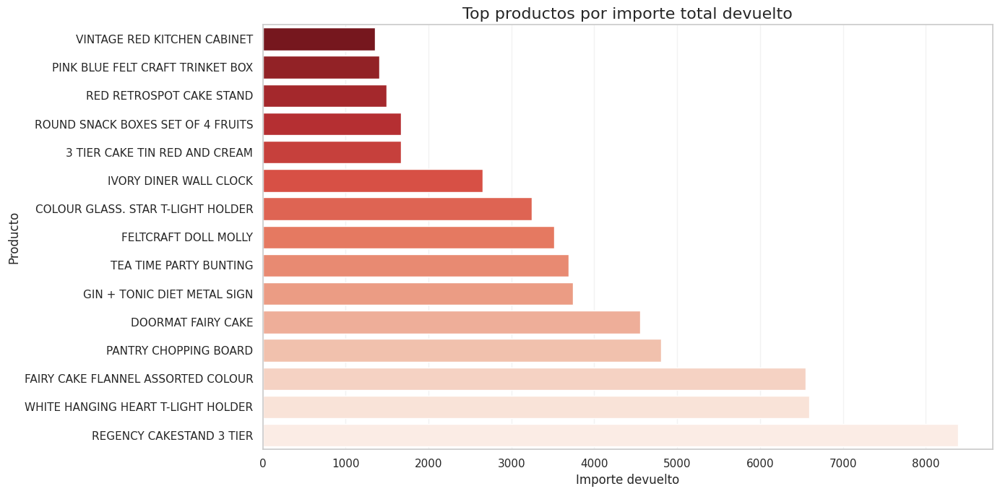

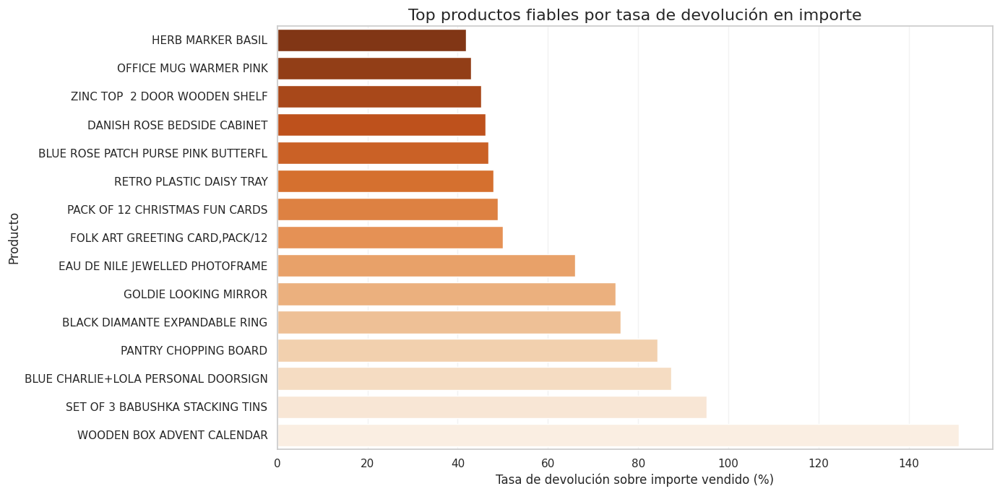

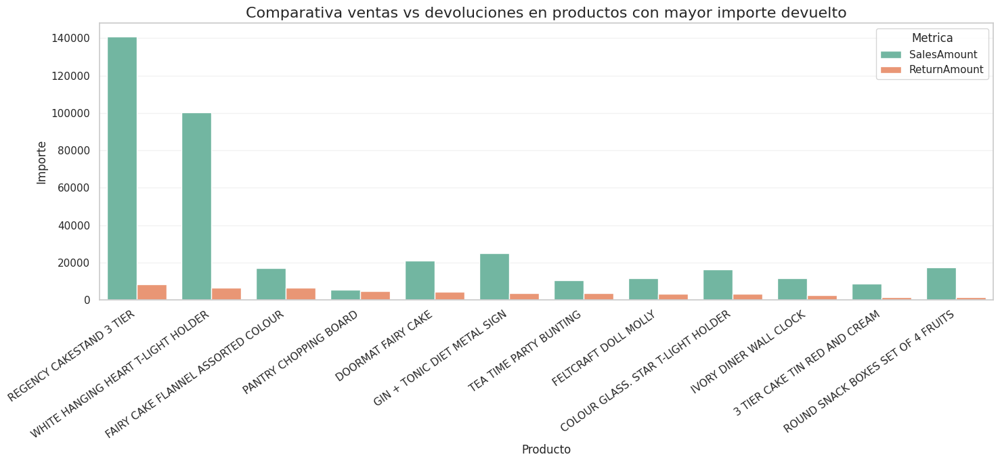

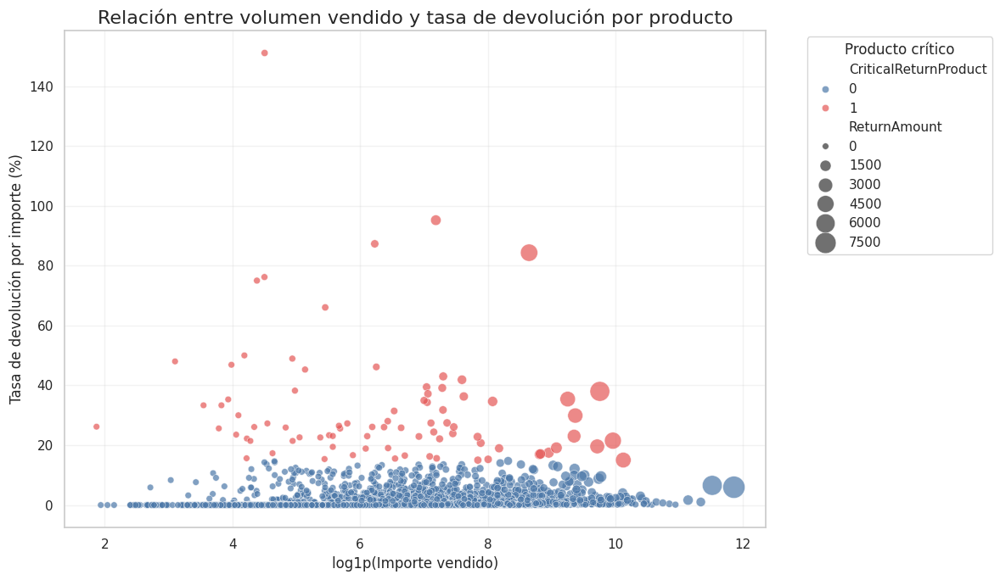

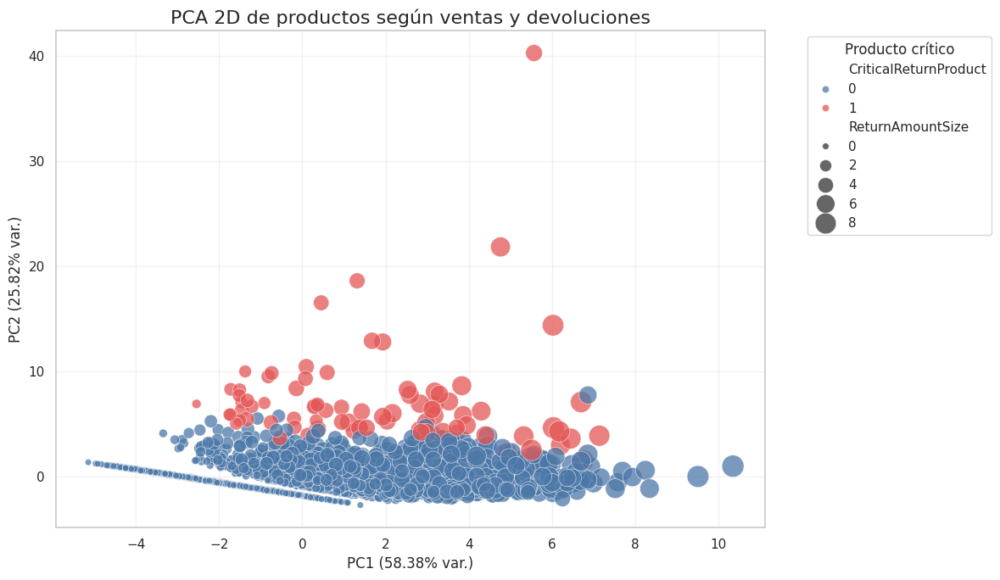


Cargas PCA de productos:


,PC1,PC2
SalesAmount,0.34,-0.17
NetProductRevenue,0.33,-0.20
ReturnCustomers,0.33,0.12
SalesInvoices,0.33,-0.21
ReturnInvoices,0.33,0.12
ReturnAmount,0.33,0.19
SalesCustomers,0.33,-0.22
ReturnQuantity,0.32,0.16
SalesQuantity,0.30,-0.22
ReturnInvoiceRate,0.10,0.47



Varianza explicada PCA productos:
PC1: 58.38 %
PC2: 25.82 %
Total: 84.2 %

PRODUCTOS CRÍTICOS FINALES
Número de productos críticos: 84


,StockCode,Description,SalesAmount,ReturnAmount,ReturnAmountRate,SalesQuantity,ReturnQuantity,ReturnQuantityRate,SalesCustomers,ReturnCustomers,ReturnCustomerRate,SalesInvoices,ReturnInvoices,ReturnInvoiceRate,NetProductRevenue
2609,35400,WOODEN BOX ADVENT CALENDAR,89.50,135.20,1.51,10,16.00,1.60,5,8.00,1.60,5,8.00,1.60,-45.70
3558,85232B,SET OF 3 BABUSHKA STACKING TINS,"1,321.65","1,258.05",0.95,267,255.00,0.96,7,3.00,0.43,9,6.00,0.67,63.60
3424,85071A,BLUE CHARLIE+LOLA PERSONAL DOORSIGN,506.90,442.50,0.87,974,150.00,0.15,76,1.00,0.01,89,1.00,0.01,64.40
2035,23113,PANTRY CHOPPING BOARD,"5,695.86","4,803.06",0.84,1138,946.00,0.83,39,5.00,0.13,43,6.00,0.14,892.80
3808,90185C,BLACK DIAMANTE EXPANDABLE RING,89.25,68.00,0.76,21,16.00,0.76,5,2.00,0.40,5,3.00,0.60,21.25
227,20821,GOLDIE LOOKING MIRROR,79.20,59.40,0.75,16,12.00,0.75,5,1.00,0.20,5,2.00,0.40,19.80
3372,85023B,EAU DE NILE JEWELLED PHOTOFRAME,232.80,153.75,0.66,104,73.00,0.70,10,2.00,0.20,12,2.00,0.17,79.05
3036,84247K,"FOLK ART GREETING CARD,PACK/12",64.90,32.45,0.50,22,11.00,0.50,7,1.00,0.14,9,1.00,0.11,32.45
3033,84247E,PACK OF 12 CHRISTMAS FUN CARDS,138.65,67.85,0.49,47,23.00,0.49,13,2.00,0.15,13,2.00,0.15,70.80
2952,79191D,RETRO PLASTIC DAISY TRAY,21.25,10.20,0.48,25,12.00,0.48,7,1.00,0.14,7,1.00,0.14,11.05



Diagnóstico orientativo de productos críticos:


,StockCode,Description,ReturnAmountRate,ReturnQuantityRate,ReturnCustomerRate,ReturnInvoiceRate,ReturnAmount,SalesCustomers,ReturnCustomers,Diagnostico_Probable
2609,35400,WOODEN BOX ADVENT CALENDAR,1.51,1.60,1.60,1.60,135.20,5,8.00,devolución muy alta sobre importe vendido; dev...
3558,85232B,SET OF 3 BABUSHKA STACKING TINS,0.95,0.96,0.43,0.67,"1,258.05",7,3.00,devolución muy alta sobre importe vendido; dev...
3424,85071A,BLUE CHARLIE+LOLA PERSONAL DOORSIGN,0.87,0.15,0.01,0.01,442.50,76,1.00,devolución muy alta sobre importe vendido; alt...
2035,23113,PANTRY CHOPPING BOARD,0.84,0.83,0.13,0.14,"4,803.06",39,5.00,devolución muy alta sobre importe vendido; dev...
3808,90185C,BLACK DIAMANTE EXPANDABLE RING,0.76,0.76,0.40,0.60,68.00,5,2.00,devolución muy alta sobre importe vendido; dev...
227,20821,GOLDIE LOOKING MIRROR,0.75,0.75,0.20,0.40,59.40,5,1.00,devolución muy alta sobre importe vendido; dev...
3372,85023B,EAU DE NILE JEWELLED PHOTOFRAME,0.66,0.70,0.20,0.17,153.75,10,2.00,devolución muy alta sobre importe vendido; dev...
3036,84247K,"FOLK ART GREETING CARD,PACK/12",0.50,0.50,0.14,0.11,32.45,7,1.00,devolución muy alta sobre importe vendido; dev...
3033,84247E,PACK OF 12 CHRISTMAS FUN CARDS,0.49,0.49,0.15,0.15,67.85,13,2.00,devolución moderada o caso aislado
2952,79191D,RETRO PLASTIC DAISY TRAY,0.48,0.48,0.14,0.14,10.20,7,1.00,devolución moderada o caso aislado



CONCLUSIÓN AUTOMÁTICA
Se analizaron 3658 productos vendidos. 1816 productos registraron al menos una devolución (49.64%). La tasa global de devolución fue del 2.26% por importe y del 1.89% por cantidad. Se identificaron 84 productos críticos con tasa de devolución por importe igual o superior al 15% y suficiente evidencia comercial. Estos productos deben revisarse individualmente porque pueden concentrar problemas de información, expectativas, calidad percibida, incidencias logísticas o patrones de compra/devolución recurrentes.


In [49]:
# ============================================================
# CELDA 37 — ANÁLISIS DE PRODUCTOS DEVUELTOS
# Comparativa ventas/devoluciones + tasas + PCA de productos
# ============================================================

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ------------------------------------------------------------
# 0. Selección automática de datasets limpios
# ------------------------------------------------------------
# Ajusta estos nombres si en tu notebook usas otros.
# La prioridad es usar los datasets ya depurados tras excluir CustomerID nulos,
# clientes no comparables y conceptos administrativos como Next Day Carriage.

try:
    ventas_productos_base = ventas_modelo_tx.copy()
except NameError:
    try:
        ventas_productos_base = ventas_limpias.copy()
    except NameError:
        try:
            ventas_productos_base = ventas.copy()
        except NameError:
            ventas_productos_base = df_ventas.copy()

try:
    devoluciones_productos_base = devoluciones_modelo_tx.copy()
except NameError:
    try:
        devoluciones_productos_base = devoluciones_limpias.copy()
    except NameError:
        try:
            devoluciones_productos_base = devoluciones.copy()
        except NameError:
            devoluciones_productos_base = df_devoluciones.copy()

print("Dimensiones ventas usadas:", ventas_productos_base.shape)
print("Dimensiones devoluciones usadas:", devoluciones_productos_base.shape)


# ------------------------------------------------------------
# 1. Validación mínima de columnas necesarias
# ------------------------------------------------------------
columnas_necesarias = [
    "StockCode",
    "Description",
    "Quantity",
    "TotalPrice",
    "InvoiceNo",
    "CustomerID"
]

for col in columnas_necesarias:
    if col not in ventas_productos_base.columns:
        raise ValueError(f"Falta la columna '{col}' en ventas_productos_base.")
    if col not in devoluciones_productos_base.columns:
        raise ValueError(f"Falta la columna '{col}' en devoluciones_productos_base.")

# Normalizar descripción para evitar duplicidades por espacios/capitalización
ventas_productos_base["Description"] = (
    ventas_productos_base["Description"]
    .astype(str)
    .str.strip()
    .str.upper()
)

devoluciones_productos_base["Description"] = (
    devoluciones_productos_base["Description"]
    .astype(str)
    .str.strip()
    .str.upper()
)

# Asegurar magnitudes positivas en devoluciones para comparar tasas
ventas_productos_base["SalesQuantity_Pos"] = ventas_productos_base["Quantity"].abs()
ventas_productos_base["SalesAmount_Pos"] = ventas_productos_base["TotalPrice"].abs()

devoluciones_productos_base["ReturnQuantity_Pos"] = devoluciones_productos_base["Quantity"].abs()
devoluciones_productos_base["ReturnAmount_Pos"] = devoluciones_productos_base["TotalPrice"].abs()


# ------------------------------------------------------------
# 2. Agregación de ventas por producto
# ------------------------------------------------------------
ventas_producto = (
    ventas_productos_base
    .groupby(["StockCode", "Description"])
    .agg(
        SalesRecords=("InvoiceNo", "count"),
        SalesInvoices=("InvoiceNo", "nunique"),
        SalesCustomers=("CustomerID", "nunique"),
        SalesQuantity=("SalesQuantity_Pos", "sum"),
        SalesAmount=("SalesAmount_Pos", "sum"),
        SalesUnitPriceMean=("UnitPrice", "mean")
    )
    .reset_index()
)

ventas_producto["AverageSalesAmountPerInvoice"] = (
    ventas_producto["SalesAmount"] / ventas_producto["SalesInvoices"]
).replace([np.inf, -np.inf], np.nan).fillna(0)


# ------------------------------------------------------------
# 3. Agregación de devoluciones por producto
# ------------------------------------------------------------
devoluciones_producto = (
    devoluciones_productos_base
    .groupby(["StockCode", "Description"])
    .agg(
        ReturnRecords=("InvoiceNo", "count"),
        ReturnInvoices=("InvoiceNo", "nunique"),
        ReturnCustomers=("CustomerID", "nunique"),
        ReturnQuantity=("ReturnQuantity_Pos", "sum"),
        ReturnAmount=("ReturnAmount_Pos", "sum"),
        ReturnUnitPriceMean=("UnitPrice", "mean")
    )
    .reset_index()
)

devoluciones_producto["AverageReturnAmountPerInvoice"] = (
    devoluciones_producto["ReturnAmount"] / devoluciones_producto["ReturnInvoices"]
).replace([np.inf, -np.inf], np.nan).fillna(0)


# ------------------------------------------------------------
# 4. Cruce ventas/devoluciones por producto
# ------------------------------------------------------------
productos_comparativa = ventas_producto.merge(
    devoluciones_producto,
    on=["StockCode", "Description"],
    how="left"
)

cols_return = [
    "ReturnRecords",
    "ReturnInvoices",
    "ReturnCustomers",
    "ReturnQuantity",
    "ReturnAmount",
    "ReturnUnitPriceMean",
    "AverageReturnAmountPerInvoice"
]

productos_comparativa[cols_return] = productos_comparativa[cols_return].fillna(0)

# ------------------------------------------------------------
# 5. Variables de tasa de devolución por producto
# ------------------------------------------------------------
productos_comparativa["ReturnAmountRate"] = (
    productos_comparativa["ReturnAmount"] / productos_comparativa["SalesAmount"]
).replace([np.inf, -np.inf], np.nan).fillna(0)

productos_comparativa["ReturnQuantityRate"] = (
    productos_comparativa["ReturnQuantity"] / productos_comparativa["SalesQuantity"]
).replace([np.inf, -np.inf], np.nan).fillna(0)

productos_comparativa["ReturnInvoiceRate"] = (
    productos_comparativa["ReturnInvoices"] / productos_comparativa["SalesInvoices"]
).replace([np.inf, -np.inf], np.nan).fillna(0)

productos_comparativa["ReturnCustomerRate"] = (
    productos_comparativa["ReturnCustomers"] / productos_comparativa["SalesCustomers"]
).replace([np.inf, -np.inf], np.nan).fillna(0)

productos_comparativa["NetProductRevenue"] = (
    productos_comparativa["SalesAmount"] - productos_comparativa["ReturnAmount"]
)

productos_comparativa["HasReturns"] = (
    productos_comparativa["ReturnAmount"] > 0
).astype(int)

# Evitar tasas absurdas por productos con pocas ventas
productos_comparativa["ReliableProduct"] = (
    (productos_comparativa["SalesInvoices"] >= 5) &
    (productos_comparativa["SalesCustomers"] >= 3) &
    (productos_comparativa["SalesAmount"] > 0)
).astype(int)

# Producto crítico: devolución alta y suficiente evidencia comercial
productos_comparativa["CriticalReturnProduct"] = (
    (productos_comparativa["ReliableProduct"] == 1) &
    (productos_comparativa["ReturnAmountRate"] >= 0.15)
).astype(int)

# Producto con alta devolución en cantidad
productos_comparativa["HighQuantityReturnProduct"] = (
    (productos_comparativa["ReliableProduct"] == 1) &
    (productos_comparativa["ReturnQuantityRate"] >= 0.15)
).astype(int)


# ------------------------------------------------------------
# 6. Resumen general
# ------------------------------------------------------------
total_productos = productos_comparativa["StockCode"].nunique()
productos_con_devolucion = productos_comparativa[productos_comparativa["HasReturns"] == 1]["StockCode"].nunique()
productos_criticos = productos_comparativa[productos_comparativa["CriticalReturnProduct"] == 1]["StockCode"].nunique()

importe_ventas_total = productos_comparativa["SalesAmount"].sum()
importe_devoluciones_total = productos_comparativa["ReturnAmount"].sum()
tasa_devolucion_global_importe = importe_devoluciones_total / importe_ventas_total

cantidad_vendida_total = productos_comparativa["SalesQuantity"].sum()
cantidad_devuelta_total = productos_comparativa["ReturnQuantity"].sum()
tasa_devolucion_global_cantidad = cantidad_devuelta_total / cantidad_vendida_total

print("RESUMEN GENERAL DE PRODUCTOS")
print("Productos únicos vendidos:", total_productos)
print("Productos con al menos una devolución:", productos_con_devolucion)
print("Porcentaje de productos con devolución:", round(productos_con_devolucion / total_productos * 100, 2), "%")
print("Productos críticos por tasa de devolución >= 15%:", productos_criticos)
print("Importe total vendido:", round(importe_ventas_total, 2))
print("Importe total devuelto:", round(importe_devoluciones_total, 2))
print("Tasa global de devolución por importe:", round(tasa_devolucion_global_importe * 100, 2), "%")
print("Cantidad total vendida:", int(cantidad_vendida_total))
print("Cantidad total devuelta:", int(cantidad_devuelta_total))
print("Tasa global de devolución por cantidad:", round(tasa_devolucion_global_cantidad * 100, 2), "%")


# ------------------------------------------------------------
# 7. Rankings principales
# ------------------------------------------------------------
top_importe_devuelto = (
    productos_comparativa
    .sort_values("ReturnAmount", ascending=False)
    .head(15)
)

top_tasa_importe = (
    productos_comparativa[
        productos_comparativa["ReliableProduct"] == 1
    ]
    .sort_values("ReturnAmountRate", ascending=False)
    .head(15)
)

top_tasa_cantidad = (
    productos_comparativa[
        productos_comparativa["ReliableProduct"] == 1
    ]
    .sort_values("ReturnQuantityRate", ascending=False)
    .head(15)
)

top_clientes_devolucion = (
    productos_comparativa
    .sort_values("ReturnCustomers", ascending=False)
    .head(15)
)

print("\nTOP 15 productos por importe devuelto:")
display(
    top_importe_devuelto[
        [
            "StockCode", "Description", "SalesAmount", "ReturnAmount",
            "ReturnAmountRate", "SalesQuantity", "ReturnQuantity",
            "ReturnQuantityRate", "SalesCustomers", "ReturnCustomers"
        ]
    ]
)

print("\nTOP 15 productos fiables por tasa de devolución en importe:")
display(
    top_tasa_importe[
        [
            "StockCode", "Description", "SalesAmount", "ReturnAmount",
            "ReturnAmountRate", "SalesInvoices", "ReturnInvoices",
            "SalesCustomers", "ReturnCustomers"
        ]
    ]
)

print("\nTOP 15 productos fiables por tasa de devolución en cantidad:")
display(
    top_tasa_cantidad[
        [
            "StockCode", "Description", "SalesQuantity", "ReturnQuantity",
            "ReturnQuantityRate", "SalesInvoices", "ReturnInvoices",
            "SalesCustomers", "ReturnCustomers"
        ]
    ]
)

print("\nTOP 15 productos por número de clientes con devolución:")
display(
    top_clientes_devolucion[
        [
            "StockCode", "Description", "ReturnCustomers", "ReturnInvoices",
            "ReturnAmount", "ReturnQuantity", "ReturnAmountRate",
            "ReturnQuantityRate"
        ]
    ]
)


# ------------------------------------------------------------
# 8. Gráfico 1 — Top productos por importe devuelto
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

plot_df = top_importe_devuelto.sort_values("ReturnAmount", ascending=True)

sns.barplot(
    data=plot_df,
    x="ReturnAmount",
    y="Description",
    hue="Description",
    dodge=False,
    palette="Reds_r"
)

plt.title("Top productos por importe total devuelto", fontsize=16)
plt.xlabel("Importe devuelto")
plt.ylabel("Producto")
plt.legend([], [], frameon=False)
plt.grid(axis="x", alpha=0.25)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 9. Gráfico 2 — Top productos por tasa de devolución en importe
# ------------------------------------------------------------
plt.figure(figsize=(14, 7))

plot_df = top_tasa_importe.sort_values("ReturnAmountRate", ascending=True).copy()
plot_df["ReturnAmountRatePct"] = plot_df["ReturnAmountRate"] * 100

sns.barplot(
    data=plot_df,
    x="ReturnAmountRatePct",
    y="Description",
    hue="Description",
    dodge=False,
    palette="Oranges_r"
)

plt.title("Top productos fiables por tasa de devolución en importe", fontsize=16)
plt.xlabel("Tasa de devolución sobre importe vendido (%)")
plt.ylabel("Producto")
plt.legend([], [], frameon=False)
plt.grid(axis="x", alpha=0.25)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 10. Gráfico 3 — Ventas vs devoluciones por producto crítico
# ------------------------------------------------------------
top_comparativa_importe = top_importe_devuelto.head(12).copy()
top_comparativa_importe = top_comparativa_importe[
    ["Description", "SalesAmount", "ReturnAmount"]
].melt(
    id_vars="Description",
    var_name="Metrica",
    value_name="Importe"
)

plt.figure(figsize=(15, 7))

sns.barplot(
    data=top_comparativa_importe,
    x="Description",
    y="Importe",
    hue="Metrica",
    palette="Set2"
)

plt.title("Comparativa ventas vs devoluciones en productos con mayor importe devuelto", fontsize=16)
plt.xlabel("Producto")
plt.ylabel("Importe")
plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", alpha=0.25)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 11. Gráfico 4 — Dispersión importe vendido vs tasa devolución
# ------------------------------------------------------------
productos_plot = productos_comparativa[
    productos_comparativa["ReliableProduct"] == 1
].copy()

productos_plot["SalesAmount_Log"] = np.log1p(productos_plot["SalesAmount"])
productos_plot["ReturnAmountRatePct"] = productos_plot["ReturnAmountRate"] * 100

plt.figure(figsize=(12, 7))

sns.scatterplot(
    data=productos_plot,
    x="SalesAmount_Log",
    y="ReturnAmountRatePct",
    size="ReturnAmount",
    hue="CriticalReturnProduct",
    sizes=(30, 350),
    alpha=0.70,
    palette={0: "#4C78A8", 1: "#E45756"}
)

plt.title("Relación entre volumen vendido y tasa de devolución por producto", fontsize=16)
plt.xlabel("log1p(Importe vendido)")
plt.ylabel("Tasa de devolución por importe (%)")
plt.grid(True, alpha=0.25)
plt.legend(title="Producto crítico", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 12. PCA 2D de productos según comportamiento venta/devolución
# ------------------------------------------------------------
variables_producto_pca = [
    "SalesAmount",
    "SalesQuantity",
    "SalesInvoices",
    "SalesCustomers",
    "ReturnAmount",
    "ReturnQuantity",
    "ReturnInvoices",
    "ReturnCustomers",
    "ReturnAmountRate",
    "ReturnQuantityRate",
    "ReturnInvoiceRate",
    "NetProductRevenue"
]

productos_pca_base = productos_comparativa[
    productos_comparativa["ReliableProduct"] == 1
].copy()

X_productos = productos_pca_base[variables_producto_pca].copy()

# Transformación log1p para variables de volumen
variables_log_producto = [
    "SalesAmount",
    "SalesQuantity",
    "SalesInvoices",
    "SalesCustomers",
    "ReturnAmount",
    "ReturnQuantity",
    "ReturnInvoices",
    "ReturnCustomers",
    "NetProductRevenue"
]

for col in variables_log_producto:
    X_productos[col] = np.log1p(X_productos[col].clip(lower=0))

# Escalado
scaler_productos = StandardScaler()
X_productos_scaled = scaler_productos.fit_transform(X_productos)

# PCA
pca_productos = PCA(n_components=2, random_state=42)
X_productos_pca = pca_productos.fit_transform(X_productos_scaled)

productos_pca_df = pd.DataFrame(
    X_productos_pca,
    columns=["PC1", "PC2"],
    index=productos_pca_base.index
)

productos_pca_df = pd.concat(
    [
        productos_pca_df,
        productos_pca_base[
            [
                "StockCode",
                "Description",
                "SalesAmount",
                "ReturnAmount",
                "ReturnAmountRate",
                "ReturnQuantityRate",
                "ReturnCustomers",
                "CriticalReturnProduct",
                "HighQuantityReturnProduct"
            ]
        ]
    ],
    axis=1
)

productos_pca_df["ReturnAmountRatePct"] = productos_pca_df["ReturnAmountRate"] * 100
productos_pca_df["ReturnAmountSize"] = np.log1p(productos_pca_df["ReturnAmount"])

var_pca_productos = pca_productos.explained_variance_ratio_

plt.figure(figsize=(12, 7))

sns.scatterplot(
    data=productos_pca_df,
    x="PC1",
    y="PC2",
    hue="CriticalReturnProduct",
    size="ReturnAmountSize",
    sizes=(30, 350),
    alpha=0.75,
    palette={0: "#4C78A8", 1: "#E45756"}
)

plt.title("PCA 2D de productos según ventas y devoluciones", fontsize=16)
plt.xlabel(f"PC1 ({var_pca_productos[0] * 100:.2f}% var.)")
plt.ylabel(f"PC2 ({var_pca_productos[1] * 100:.2f}% var.)")
plt.grid(True, alpha=0.25)
plt.legend(title="Producto crítico", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 13. Interpretación automática de componentes PCA
# ------------------------------------------------------------
loadings_productos = pd.DataFrame(
    pca_productos.components_.T,
    columns=["PC1", "PC2"],
    index=variables_producto_pca
).sort_values("PC1", ascending=False)

print("\nCargas PCA de productos:")
display(loadings_productos.round(3))

print("\nVarianza explicada PCA productos:")
print("PC1:", round(var_pca_productos[0] * 100, 2), "%")
print("PC2:", round(var_pca_productos[1] * 100, 2), "%")
print("Total:", round(var_pca_productos.sum() * 100, 2), "%")


# ------------------------------------------------------------
# 14. Tabla final de productos críticos
# ------------------------------------------------------------
productos_criticos_df = (
    productos_comparativa[
        productos_comparativa["CriticalReturnProduct"] == 1
    ]
    .sort_values(
        ["ReturnAmountRate", "ReturnAmount", "ReturnCustomers"],
        ascending=False
    )
    .copy()
)

print("\nPRODUCTOS CRÍTICOS FINALES")
print("Número de productos críticos:", len(productos_criticos_df))

display(
    productos_criticos_df[
        [
            "StockCode",
            "Description",
            "SalesAmount",
            "ReturnAmount",
            "ReturnAmountRate",
            "SalesQuantity",
            "ReturnQuantity",
            "ReturnQuantityRate",
            "SalesCustomers",
            "ReturnCustomers",
            "ReturnCustomerRate",
            "SalesInvoices",
            "ReturnInvoices",
            "ReturnInvoiceRate",
            "NetProductRevenue"
        ]
    ].head(25)
)


# ------------------------------------------------------------
# 15. Diagnóstico probable de causas de devolución
# ------------------------------------------------------------
def diagnosticar_causa_producto(row):
    """
    Diagnóstico orientativo basado en patrones agregados.
    No confirma causa real, porque no existe columna de motivo de devolución.
    """
    causas = []

    if row["ReturnAmountRate"] >= 0.50:
        causas.append("devolución muy alta sobre importe vendido")

    if row["ReturnQuantityRate"] >= 0.50:
        causas.append("devolución muy alta en unidades")

    if row["ReturnCustomerRate"] >= 0.30:
        causas.append("varios clientes afectados")

    if row["ReturnInvoiceRate"] >= 0.30:
        causas.append("devolución frecuente por factura")

    if row["SalesCustomers"] <= 5 and row["ReturnAmountRate"] >= 0.20:
        causas.append("baja base de clientes; tasa sensible a pocos casos")

    if row["ReturnAmount"] >= productos_comparativa["ReturnAmount"].quantile(0.95):
        causas.append("alto impacto económico")

    if len(causas) == 0:
        causas.append("devolución moderada o caso aislado")

    return "; ".join(causas)

productos_criticos_df["Diagnostico_Probable"] = productos_criticos_df.apply(
    diagnosticar_causa_producto,
    axis=1
)

print("\nDiagnóstico orientativo de productos críticos:")
display(
    productos_criticos_df[
        [
            "StockCode",
            "Description",
            "ReturnAmountRate",
            "ReturnQuantityRate",
            "ReturnCustomerRate",
            "ReturnInvoiceRate",
            "ReturnAmount",
            "SalesCustomers",
            "ReturnCustomers",
            "Diagnostico_Probable"
        ]
    ].head(25)
)


# ------------------------------------------------------------
# 16. Conclusión automática para memoria
# ------------------------------------------------------------
print("\nCONCLUSIÓN AUTOMÁTICA")
print(
    f"Se analizaron {total_productos} productos vendidos. "
    f"{productos_con_devolucion} productos registraron al menos una devolución "
    f"({round(productos_con_devolucion / total_productos * 100, 2)}%). "
    f"La tasa global de devolución fue del "
    f"{round(tasa_devolucion_global_importe * 100, 2)}% por importe y del "
    f"{round(tasa_devolucion_global_cantidad * 100, 2)}% por cantidad. "
    f"Se identificaron {productos_criticos} productos críticos con tasa de devolución "
    f"por importe igual o superior al 15% y suficiente evidencia comercial. "
    f"Estos productos deben revisarse individualmente porque pueden concentrar problemas "
    f"de información, expectativas, calidad percibida, incidencias logísticas o patrones "
    f"de compra/devolución recurrentes."
)

### Texto final para la memoria — Análisis de productos devueltos

En esta fase se realizó un análisis específico del comportamiento de devolución a nivel de producto. El objetivo fue identificar qué artículos concentran mayor volumen de devolución, qué productos presentan tasas de devolución proporcionalmente elevadas y qué posibles causas comerciales pueden explicar estos patrones.

Para ello, se utilizaron los datasets limpios de ventas y devoluciones, ya depurados tras las fases anteriores. El dataset de ventas utilizado contiene **390.521 registros**, mientras que el dataset de devoluciones contiene **7.953 registros**. Ambos datasets se agregaron por `StockCode` y `Description`, calculando métricas de venta, devolución, clientes afectados, facturas implicadas, cantidades vendidas, cantidades devueltas, importe vendido e importe devuelto.

El análisis identificó **3.658 productos únicos vendidos**, de los cuales **1.816 productos registraron al menos una devolución**, lo que representa el **49,64%** del catálogo vendido. Aunque este porcentaje indica que casi la mitad de los productos tuvieron alguna devolución, la tasa global de devolución es moderada: **2,26% por importe** y **1,89% por cantidad**. Por tanto, el problema no parece generalizado en términos económicos, sino concentrado en determinados productos concretos.

Se calcularon varias tasas de devolución para evitar una interpretación sesgada. La tasa por importe permite detectar productos cuyo valor devuelto representa una proporción elevada respecto a sus ventas. La tasa por cantidad permite identificar productos con muchas unidades devueltas. La tasa por clientes y por facturas permite distinguir entre incidencias aisladas y problemas repetidos en varios compradores o documentos.

Para evitar falsos positivos, se definió un criterio de producto fiable: productos con al menos cinco facturas de venta, tres clientes compradores y ventas positivas. A partir de este filtro, se consideraron productos críticos aquellos con una tasa de devolución por importe igual o superior al **15%**. Bajo este criterio se detectaron **84 productos críticos**.

El producto con mayor importe devuelto fue **REGENCY CAKESTAND 3 TIER**, con **8.387,55** devueltos sobre **140.955,25** vendidos, lo que supone una tasa del **6%**. Aunque su tasa no es extrema, su impacto económico es el mayor del catálogo. Algo similar ocurre con **WHITE HANGING HEART T-LIGHT HOLDER**, con **6.588,90** devueltos y una tasa del **7%**. Estos productos no son necesariamente problemáticos por proporción, pero sí deben vigilarse por su alto volumen de ventas y devolución.

En cambio, otros productos presentan tasas de devolución mucho más preocupantes. **WOODEN BOX ADVENT CALENDAR** muestra una tasa de devolución por importe del **151%** y por cantidad del **160%**, con más devoluciones que ventas registradas. Este caso indica una anomalía comercial o documental: puede deberse a devoluciones de ventas realizadas fuera del periodo analizado, errores de registro, cambios de código, ventas previas no presentes en el dataset o incidencias específicas. No debe interpretarse directamente como un problema de producto sin revisar el histórico completo.

También destacan productos como **SET OF 3 BABUSHKA STACKING TINS**, con una tasa de devolución por importe del **95%**, **BLUE CHARLIE+LOLA PERSONAL DOORSIGN**, con **87%**, y **PANTRY CHOPPING BOARD**, con **84%**. Estos productos sí presentan tasas proporcionalmente elevadas y requieren revisión individual, especialmente cuando además tienen varios clientes o facturas afectadas.

El análisis gráfico confirma dos patrones diferenciados. Por un lado, existen productos con alto importe devuelto porque son productos muy vendidos. Por otro lado, existen productos con menor volumen de ventas, pero con tasas de devolución desproporcionadas. Esta distinción es importante desde el punto de vista de negocio, ya que no todos los productos devueltos deben tratarse igual.

La visualización mediante PCA 2D permitió resumir el comportamiento de los productos considerando conjuntamente ventas, devoluciones, cantidades, facturas, clientes y tasas. Los dos primeros componentes explicaron el **84,20%** de la variabilidad total, con un **58,38%** explicado por PC1 y un **25,82%** por PC2. PC1 se asoció principalmente al volumen comercial general, mientras que PC2 se relacionó más con las tasas de devolución. Esto permite diferenciar productos con alto volumen de venta de productos con devolución proporcionalmente elevada.

Las cargas del PCA muestran que PC1 está relacionado con variables de volumen como `SalesAmount`, `NetProductRevenue`, `SalesInvoices`, `SalesCustomers`, `ReturnAmount`, `ReturnInvoices` y `ReturnCustomers`. En cambio, PC2 está fuertemente asociado a `ReturnAmountRate`, `ReturnQuantityRate` y `ReturnInvoiceRate`. Por tanto, el PCA confirma que los productos críticos no solo se separan por vender mucho o poco, sino por presentar una intensidad de devolución superior al comportamiento general.

No se puede confirmar la causa exacta de devolución porque el dataset no incluye una variable explícita de motivo de devolución. Por tanto, las causas planteadas deben entenderse como hipótesis de negocio. Las más probables son: errores de descripción, expectativas no cumplidas, problemas de calidad percibida, fragilidad del producto, errores logísticos, cambios de pedido, devoluciones vinculadas a compras mayoristas o diferencias entre el periodo de venta y el periodo de devolución.

Desde el punto de vista comercial, este análisis permite priorizar la revisión de productos. Los productos de alto impacto económico deben revisarse por su contribución al importe total devuelto. Los productos con alta tasa de devolución deben revisarse por posible problema estructural. Los productos con devoluciones concentradas en pocos clientes deben analizarse con cautela, porque pueden responder a casos aislados o compras mayoristas. Finalmente, los productos con devoluciones en muchos clientes o muchas facturas deben tratarse como candidatos prioritarios a mejora de ficha, control de calidad o revisión logística.

En conclusión, el análisis de productos devueltos complementa la segmentación de clientes. Mientras el clustering identificó clientes con mayor o menor fricción por devoluciones, esta fase permite localizar qué productos pueden estar generando esa fricción. El resultado principal es la identificación de **84 productos críticos**, que deben analizarse individualmente antes de tomar decisiones comerciales, promocionales o logísticas.

---

### Conclusiones de producto y posibles soluciones

El análisis muestra que no todos los productos devueltos tienen el mismo significado. Hay que separar tres casos: productos con alto impacto económico, productos con tasa de devolución anormal y productos con posibles problemas de registro o periodo.

#### 1. Productos con mayor impacto económico por devolución

**REGENCY CAKESTAND 3 TIER** *(soporte para tartas Regency de 3 niveles)*
Importe vendido: **140.955,25**. Importe devuelto: **8.387,55**. Tasa de devolución: **6%**.

Es el producto con mayor importe devuelto, pero no necesariamente el más problemático. Su tasa del 6% es moderada. El alto importe devuelto se explica principalmente porque es un producto muy vendido. Aun así, por impacto económico debe revisarse.

Posible explicación: producto voluminoso o frágil, posible rotura en transporte, expectativas de tamaño/material, uso decorativo con mayor sensibilidad a defectos.

Solución recomendada: reforzar embalaje, revisar imágenes y descripción del producto, añadir medidas exactas, controlar incidencias logísticas y monitorizar reclamaciones asociadas a daños.

**WHITE HANGING HEART T-LIGHT HOLDER** *(portavelas colgante blanco con forma de corazón)*
Importe vendido: **100.356,70**. Importe devuelto: **6.588,90**. Tasa de devolución: **7%**.

Producto de alto volumen. La tasa tampoco es extrema, pero el importe devuelto es relevante. Aparece además con muchos clientes compradores, lo que sugiere que es un producto popular.

Posible explicación: producto decorativo/frágil, diferencias entre expectativa visual y producto físico, roturas o defectos menores.

Solución recomendada: revisar embalaje, fotos reales, descripción de materiales y control de calidad. No eliminarlo del catálogo, pero sí vigilarlo por volumen.

**FAIRY CAKE FLANNEL ASSORTED COLOUR** *(toallita/pastel decorativo de franela en colores surtidos)*
Importe vendido: **17.253,77**. Importe devuelto: **6.553,62**. Tasa de devolución: **38%**.

Este caso es más preocupante. Combina importe devuelto alto y tasa elevada. Aunque solo aparecen **2 clientes con devolución**, el impacto económico es alto, lo que puede indicar compras grandes o devoluciones mayoristas.

Posible explicación: compra por volumen, lote defectuoso, error de expectativas, producto surtido donde el color recibido no coincide con lo esperado, o devolución concentrada en cliente mayorista.

Solución recomendada: revisar facturas concretas, comprobar si los clientes eran mayoristas, especificar mejor que el color es surtido, revisar lote y evitar promociones masivas hasta validar la causa.

**PANTRY CHOPPING BOARD** *(tabla de cortar estilo despensa)*
Importe vendido: **5.695,86**. Importe devuelto: **4.803,06**. Tasa de devolución: **84%**.

Producto crítico. La devolución representa casi todo el importe vendido. Además, aparecen **5 clientes con devolución** y **6 facturas de devolución**, por lo que no parece un único caso aislado.

Posible explicación: defecto de calidad, tamaño/material no esperado, rotura, mala descripción, problema de lote o insatisfacción recurrente.

Solución recomendada: revisión prioritaria del producto. Auditar ficha, proveedor, embalaje, descripción y comentarios. Si se confirma problema estructural, retirar temporalmente de campañas o del catálogo.

---

#### 2. Productos con tasas de devolución anómalas

**WOODEN BOX ADVENT CALENDAR** *(calendario de adviento en caja de madera)*
Importe vendido: **89,50**. Importe devuelto: **135,20**. Tasa de devolución por importe: **151%**. Tasa por cantidad: **160%**.

Este caso no debe interpretarse directamente como devolución normal. La devolución supera las ventas registradas. Eso suele indicar desfase temporal, ventas fuera del periodo analizado, error de registro, producto vendido antes del inicio del dataset o devolución asociada a una factura no incluida en ventas limpias.

Posible explicación: devolución de compras previas, descuadre temporal, baja muestra o inconsistencia documental.

Solución recomendada: no usarlo como evidencia directa de problema comercial hasta revisar facturas originales. En la memoria conviene marcarlo como **producto con anomalía documental**.

**SET OF 3 BABUSHKA STACKING TINS** *(set de 3 latas apilables Babushka)*
Importe vendido: **1.321,65**. Importe devuelto: **1.258,05**. Tasa de devolución: **95%**.

Producto muy crítico. Tiene una tasa casi total de devolución y afecta a varios registros. Puede deberse a un lote concreto, defecto físico, mala expectativa de tamaño o calidad.

Solución recomendada: revisar proveedor, lote, descripción y fotografías. Si se vendía como set, comprobar si hubo confusión en cantidad, tamaño o composición del producto.

**BLUE CHARLIE+LOLA PERSONAL DOORSIGN** *(cartel personalizado de puerta Charlie y Lola azul)*
Importe vendido: **506,90**. Importe devuelto: **442,50**. Tasa de devolución: **87%**.

Aunque solo hay un cliente con devolución, el producto tiene una tasa muy alta. Al ser un producto personalizado o decorativo, puede haber problemas de expectativas, diseño, personalización o errores en el pedido.

Solución recomendada: revisar si la descripción indicaba claramente medidas, diseño y condiciones de personalización. Incluir vista previa o advertencias claras si el producto depende de elección del cliente.

**BLACK DIAMANTE EXPANDABLE RING** *(anillo ajustable negro con brillantes)*
Tasa de devolución: **76%**.

Producto pequeño, probablemente de bisutería. Las devoluciones pueden estar relacionadas con talla, ajuste, calidad percibida o diferencia entre imagen y producto real.

Solución recomendada: mejorar fotos macro, indicar material, dimensiones y sistema ajustable. Revisar calidad percibida y posibles daños en transporte.

**GOLDIE LOOKING MIRROR** *(espejo estilo Goldie)*
Tasa de devolución: **75%**.

Producto con tasa muy alta y ventas reducidas. Puede estar afectado por baja muestra, fragilidad o expectativas visuales.

Solución recomendada: revisar embalaje, fotos, medidas y calidad. Si el volumen es bajo, tratarlo como alerta, no como conclusión definitiva.

---

#### 3. Productos con devoluciones en muchos clientes pero tasa moderada

**REGENCY CAKESTAND 3 TIER** *(soporte para tartas Regency de 3 niveles)*
Tiene **111 clientes con devolución**, el valor más alto de la tabla. Sin embargo, su tasa es solo **6%**.

Interpretación: producto muy vendido. Muchas devoluciones absolutas, pero proporción asumible. Aun así, como afecta a muchos clientes, puede impactar en experiencia y reputación.

Solución: no retirarlo, pero sí monitorizarlo. Revisar embalaje y motivos de incidencia.

**JAM MAKING SET WITH JARS** *(set para hacer mermelada con tarros)*
Tiene **70 clientes con devolución**, pero tasa del **3%**.

Interpretación: devolución frecuente por volumen de ventas, no necesariamente problema estructural.

Solución: revisar logística y embalaje, pero no clasificarlo como crítico principal.

**SET OF 3 CAKE TINS PANTRY DESIGN** *(set de 3 latas para tartas diseño Pantry)*
Tiene **56 clientes con devolución**, tasa del **2%**.

Interpretación: volumen alto, devolución baja. No parece producto problemático.

Solución: seguimiento operativo normal.

---

### Conclusión ejecutiva sobre productos

La tasa global de devolución es baja: **2,26% por importe** y **1,89% por cantidad**. Por tanto, el problema no está en el catálogo completo, sino en productos concretos.

Los productos que requieren prioridad no son necesariamente los que más importe devuelven, sino los que combinan:

alta tasa de devolución,

alto importe devuelto,

varios clientes afectados,

y volumen de ventas suficiente.

Según los resultados, los productos prioritarios para revisión serían:

| Prioridad | Producto                           | Traducción                                  | Motivo                                          |
| --------: | ---------------------------------- | ------------------------------------------- | ----------------------------------------------- |
|         1 | PANTRY CHOPPING BOARD              | tabla de cortar estilo despensa             | alta tasa e impacto económico                   |
|         2 | FAIRY CAKE FLANNEL ASSORTED COLOUR | toallita/pastel de franela colores surtidos | alto impacto y tasa elevada                     |
|         3 | SET OF 3 BABUSHKA STACKING TINS    | set de 3 latas apilables Babushka           | tasa casi total de devolución                   |
|         4 | WOODEN BOX ADVENT CALENDAR         | calendario de adviento en caja de madera    | anomalía: devoluciones superiores a ventas      |
|         5 | TEA TIME PARTY BUNTING             | guirnalda decorativa Tea Time               | alta devolución en cantidad e impacto relevante |
|         6 | CINDERELLA CHANDELIER              | lámpara/adorno tipo candelabro Cinderella   | varios clientes afectados                       |
|         7 | WHITE HANGING HEART T-LIGHT HOLDER | portavelas colgante blanco corazón          | alto impacto absoluto                           |
|         8 | REGENCY CAKESTAND 3 TIER           | soporte para tartas Regency de 3 niveles    | mayor importe devuelto total                    |

---

### Posibles soluciones de negocio

Primero, revisar productos críticos con tasa superior al 15%, priorizando los que además tienen mayor importe devuelto. No conviene eliminar automáticamente todos, porque algunos tienen alto volumen y tasa aceptable.

Segundo, separar productos con devolución estructural de productos con devolución puntual. Un producto con un solo cliente y tasa alta puede ser un caso aislado. Un producto con varios clientes y varias facturas afectadas es más preocupante.

Tercero, mejorar fichas de producto. Para artículos decorativos, frágiles, surtidos o personalizados, conviene añadir medidas exactas, materiales, fotografías reales, advertencias de color/tamaño y condiciones de devolución.

Cuarto, revisar embalaje y logística en productos frágiles: soportes, portavelas, espejos, cristalería, relojes, lámparas y productos de cocina/decoración.

Quinto, revisar productos con nombres que indican surtido o variación, como **ASSORTED COLOUR** *(colores surtidos)*. Si el cliente no controla el color recibido, aumenta el riesgo de devolución por expectativa no cumplida.

Sexto, usar estos resultados para campañas. Los productos con alta tasa de devolución no deberían promocionarse agresivamente hasta revisar causa. Los productos con alto volumen pero tasa baja pueden mantenerse, pero con control de calidad y seguimiento.

Séptimo, cruzar la siguiente fase con los segmentos de clientes. Hay que comprobar si los productos críticos se concentran en “clientes con alta fricción por devoluciones” o si aparecen también en clientes de alto valor. Esa comparación dirá si el problema está más en el producto o en el perfil de cliente.
